# Titanic survival classification

In [1]:
# load libraries
import sys
sys.path.append(r'/home/thomas/IdeaProjects/e2e_ml')
from e2eml.classification import classification_blueprints as cb
from e2eml.full_processing.postprocessing import save_to_production, load_for_production
from e2eml.test.classification_blueprints_test import load_titanic_data
from e2eml.timetravel import timetravel
import pandas as pd
from sklearn.metrics import matthews_corrcoef
from sklearn.metrics import classification_report
import re
pd.set_option('display.max_colwidth', None)

[nltk_data] Downloading package punkt to /home/thomas/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /home/thomas/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package stopwords to /home/thomas/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /home/thomas/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


# Feature engineering
Load & preprocess Titanic dataset. The feature engineering simulates the business knowledge part.
The code has been taken from:
https://towardsdatascience.com/predicting-the-survival-of-titanic-passengers-30870ccc7e8

In [2]:
# load Titianic data
test_df, test_target, val_df, val_df_target, test_categorical_cols = load_titanic_data()

Create additional features and modify existing ones.
Do dataframe splits.


# Using e2eml - Using Timewalk auto exploration
Timewalk will preprocess the dataset, store checkpoints of the class instance locally, train models and predict on a holdout dataset the user has provided. It will then travel back in the preprocessing timeline, adjust decisions and train models on these different decisions. This will happen until all iterations are done. Timewalk will store:
- the algorithm used
- the scoring on holdout data (classification: Matthews, regression: mean absolute error)
- the runtime of the respective iteration
- the number of the trial
- the preprocessing steps used

Timewalk will then plot a scatterplot with runtimes and scores and show and export a DataFrame with all information.
Timewalk is simple to use. However we have some recommendations:
- provide a small sample size as runtimes can be long
- for the holdout dataset provide the most recent data to simulate predicting on new data
- use Timewalonly for exploration, but never to train a model for production

We only need a few steps to get Timewalk running:
- split off holdout data from the overall dataset
- Instantiate an e2eml ClassificationBluePrint or RegressionBluePrint class
- Run timewalk, providing the e2eml class, holdout data and holdout target

In [3]:
# Instantiate class
titanic_auto_ml = cb.ClassificationBluePrint(datasource=test_df,
                                       target_variable=test_target,
                                       categorical_columns=test_categorical_cols,
                                       preferred_training_mode='auto',
                                       tune_mode='accurate') # In this example we use 1-fold CV for hyperparameter tuning

Ml task is binary
Preferred training mode auto has been chosen. e2eml will automatically detect, if LGBM and Xgboost can use GPU acceleration and optimize the workflow accordingly.


+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Start iteration for algorithm ridge at 1637244103.927962.
Started Execute test train split at 15:01:43.
Started Started column type detection and casting at 15:01:44.
Started Checking for duplicate columns at 15:01:44.
Started Reset dataframe index. at 15:01:44.
Started Select best features at 15:01:44.
Features before selection are...Fare
Features before selection are...Deck
Features before selection are...SibSp
Features before selection are...Ticket
Features before selection are...Fare_Per_Person
Features before selection are...Pclass
Features before selection are...PassengerId
Features before selection are...Cabin
Features before selection are...Age_Class
Features before selection are...Parch
Features before selection are...Embarked
Features before selection are...Sex
Features before selection are...not_alone
Features before selection are...Name
Features before selection are...Title
Features before selection are...relatives

[I 2021-11-18 15:01:53,598] A new study created in memory with name: autotuned kmeans


Started PCA the clustering results. at 15:01:53.


  0%|          | 0/50 [00:00<?, ?it/s]

[I 2021-11-18 15:01:54,188] Trial 0 finished with value: 0.20220438413179767 and parameters: {'PassengerId': 0, 'Pclass': 1, 'Age': 1, 'Fare': 1, 'Deck': 0, 'Title': 0, 'relatives': 0, 'Age_Class': 1, 'Fare_Per_Person': 1, 'Embarked': 1, 'Sex': 0, 'TFIDF PC-1 Ticket': 1, 'TFIDF PC-2 Ticket': 1, 'TFIDF PC-1 Cabin': 0, 'TFIDF PC-2 Cabin': 0, 'TFIDF PC-1 Name': 0, 'TFIDF PC-2 Name': 0, 'PassengerId_binarized': 1, 'Pclass_binarized': 0, 'Age_binarized': 0, 'Fare_binarized': 1, 'Deck_binarized': 0, 'Title_binarized': 0, 'relatives_binarized': 0, 'Fare_Per_Person_binarized': 0, 'TFIDF PC-2 Name_binarized': 1, 'Num_PC-1_num_pca': 0, 'Num_PC-2_num_pca': 1, 'isolation_probs': 1, 'isolation_class': 0, 'Pclass_unskewed': 1, 'Deck_unskewed': 0, 'Age_binarized_unskewed': 0, 'Fare_binarized_unskewed': 1, 'Deck_binarized_unskewed': 1, 'Title_unskewed': 1, 'relatives_unskewed': 0, 'Age_Class_unskewed': 0, 'Fare_Per_Person_unskewed': 1, 'Embarked_unskewed': 0, 'Sex_unskewed': 0, 'TFIDF PC-1 Ticket_unsk

[I 2021-11-18 15:02:02,267] Trial 6 finished with value: 0.2614187945496195 and parameters: {'PassengerId': 0, 'Pclass': 1, 'Age': 0, 'Fare': 0, 'Deck': 1, 'Title': 0, 'relatives': 1, 'Age_Class': 0, 'Fare_Per_Person': 0, 'Embarked': 1, 'Sex': 1, 'TFIDF PC-1 Ticket': 1, 'TFIDF PC-2 Ticket': 1, 'TFIDF PC-1 Cabin': 1, 'TFIDF PC-2 Cabin': 0, 'TFIDF PC-1 Name': 0, 'TFIDF PC-2 Name': 1, 'PassengerId_binarized': 1, 'Pclass_binarized': 1, 'Age_binarized': 0, 'Fare_binarized': 0, 'Deck_binarized': 1, 'Title_binarized': 0, 'relatives_binarized': 1, 'Fare_Per_Person_binarized': 1, 'TFIDF PC-2 Name_binarized': 0, 'Num_PC-1_num_pca': 1, 'Num_PC-2_num_pca': 1, 'isolation_probs': 0, 'isolation_class': 1, 'Pclass_unskewed': 1, 'Deck_unskewed': 1, 'Age_binarized_unskewed': 0, 'Fare_binarized_unskewed': 1, 'Deck_binarized_unskewed': 0, 'Title_unskewed': 0, 'relatives_unskewed': 1, 'Age_Class_unskewed': 0, 'Fare_Per_Person_unskewed': 0, 'Embarked_unskewed': 1, 'Sex_unskewed': 1, 'TFIDF PC-1 Ticket_unske

[I 2021-11-18 15:02:08,145] Trial 12 finished with value: 0.556410267848956 and parameters: {'PassengerId': 1, 'Pclass': 1, 'Age': 1, 'Fare': 0, 'Deck': 0, 'Title': 1, 'relatives': 1, 'Age_Class': 0, 'Fare_Per_Person': 1, 'Embarked': 0, 'Sex': 1, 'TFIDF PC-1 Ticket': 1, 'TFIDF PC-2 Ticket': 1, 'TFIDF PC-1 Cabin': 1, 'TFIDF PC-2 Cabin': 0, 'TFIDF PC-1 Name': 0, 'TFIDF PC-2 Name': 0, 'PassengerId_binarized': 1, 'Pclass_binarized': 1, 'Age_binarized': 0, 'Fare_binarized': 0, 'Deck_binarized': 1, 'Title_binarized': 0, 'relatives_binarized': 0, 'Fare_Per_Person_binarized': 1, 'TFIDF PC-2 Name_binarized': 0, 'Num_PC-1_num_pca': 1, 'Num_PC-2_num_pca': 0, 'isolation_probs': 0, 'isolation_class': 0, 'Pclass_unskewed': 1, 'Deck_unskewed': 1, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 1, 'Deck_binarized_unskewed': 0, 'Title_unskewed': 0, 'relatives_unskewed': 0, 'Age_Class_unskewed': 1, 'Fare_Per_Person_unskewed': 0, 'Embarked_unskewed': 0, 'Sex_unskewed': 1, 'TFIDF PC-1 Ticket_unske

[I 2021-11-18 15:02:13,508] Trial 18 finished with value: 0.5348193380112871 and parameters: {'PassengerId': 1, 'Pclass': 1, 'Age': 1, 'Fare': 0, 'Deck': 1, 'Title': 1, 'relatives': 1, 'Age_Class': 1, 'Fare_Per_Person': 1, 'Embarked': 0, 'Sex': 1, 'TFIDF PC-1 Ticket': 1, 'TFIDF PC-2 Ticket': 1, 'TFIDF PC-1 Cabin': 1, 'TFIDF PC-2 Cabin': 1, 'TFIDF PC-1 Name': 1, 'TFIDF PC-2 Name': 0, 'PassengerId_binarized': 1, 'Pclass_binarized': 1, 'Age_binarized': 0, 'Fare_binarized': 0, 'Deck_binarized': 1, 'Title_binarized': 0, 'relatives_binarized': 0, 'Fare_Per_Person_binarized': 0, 'TFIDF PC-2 Name_binarized': 1, 'Num_PC-1_num_pca': 1, 'Num_PC-2_num_pca': 1, 'isolation_probs': 1, 'isolation_class': 0, 'Pclass_unskewed': 0, 'Deck_unskewed': 1, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 1, 'Deck_binarized_unskewed': 1, 'Title_unskewed': 1, 'relatives_unskewed': 0, 'Age_Class_unskewed': 0, 'Fare_Per_Person_unskewed': 0, 'Embarked_unskewed': 0, 'Sex_unskewed': 1, 'TFIDF PC-1 Ticket_unsk

[I 2021-11-18 15:02:17,389] Trial 24 finished with value: 0.535331999309665 and parameters: {'PassengerId': 0, 'Pclass': 1, 'Age': 1, 'Fare': 0, 'Deck': 0, 'Title': 1, 'relatives': 1, 'Age_Class': 1, 'Fare_Per_Person': 0, 'Embarked': 0, 'Sex': 1, 'TFIDF PC-1 Ticket': 1, 'TFIDF PC-2 Ticket': 1, 'TFIDF PC-1 Cabin': 1, 'TFIDF PC-2 Cabin': 1, 'TFIDF PC-1 Name': 0, 'TFIDF PC-2 Name': 0, 'PassengerId_binarized': 1, 'Pclass_binarized': 1, 'Age_binarized': 0, 'Fare_binarized': 0, 'Deck_binarized': 1, 'Title_binarized': 0, 'relatives_binarized': 0, 'Fare_Per_Person_binarized': 1, 'TFIDF PC-2 Name_binarized': 1, 'Num_PC-1_num_pca': 1, 'Num_PC-2_num_pca': 0, 'isolation_probs': 1, 'isolation_class': 0, 'Pclass_unskewed': 0, 'Deck_unskewed': 1, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 1, 'Deck_binarized_unskewed': 1, 'Title_unskewed': 1, 'relatives_unskewed': 0, 'Age_Class_unskewed': 0, 'Fare_Per_Person_unskewed': 0, 'Embarked_unskewed': 0, 'Sex_unskewed': 1, 'TFIDF PC-1 Ticket_unske

[I 2021-11-18 15:02:22,926] Trial 30 finished with value: 0.5536865593100475 and parameters: {'PassengerId': 1, 'Pclass': 1, 'Age': 1, 'Fare': 0, 'Deck': 0, 'Title': 1, 'relatives': 1, 'Age_Class': 1, 'Fare_Per_Person': 0, 'Embarked': 0, 'Sex': 0, 'TFIDF PC-1 Ticket': 1, 'TFIDF PC-2 Ticket': 0, 'TFIDF PC-1 Cabin': 1, 'TFIDF PC-2 Cabin': 1, 'TFIDF PC-1 Name': 0, 'TFIDF PC-2 Name': 1, 'PassengerId_binarized': 0, 'Pclass_binarized': 1, 'Age_binarized': 0, 'Fare_binarized': 0, 'Deck_binarized': 1, 'Title_binarized': 0, 'relatives_binarized': 0, 'Fare_Per_Person_binarized': 1, 'TFIDF PC-2 Name_binarized': 1, 'Num_PC-1_num_pca': 0, 'Num_PC-2_num_pca': 1, 'isolation_probs': 1, 'isolation_class': 0, 'Pclass_unskewed': 0, 'Deck_unskewed': 1, 'Age_binarized_unskewed': 0, 'Fare_binarized_unskewed': 1, 'Deck_binarized_unskewed': 1, 'Title_unskewed': 0, 'relatives_unskewed': 1, 'Age_Class_unskewed': 0, 'Fare_Per_Person_unskewed': 0, 'Embarked_unskewed': 0, 'Sex_unskewed': 1, 'TFIDF PC-1 Ticket_unsk

[I 2021-11-18 15:02:26,348] Trial 36 finished with value: 0.6302195088255456 and parameters: {'PassengerId': 1, 'Pclass': 0, 'Age': 1, 'Fare': 0, 'Deck': 1, 'Title': 0, 'relatives': 1, 'Age_Class': 1, 'Fare_Per_Person': 0, 'Embarked': 0, 'Sex': 1, 'TFIDF PC-1 Ticket': 0, 'TFIDF PC-2 Ticket': 1, 'TFIDF PC-1 Cabin': 1, 'TFIDF PC-2 Cabin': 0, 'TFIDF PC-1 Name': 1, 'TFIDF PC-2 Name': 0, 'PassengerId_binarized': 1, 'Pclass_binarized': 1, 'Age_binarized': 0, 'Fare_binarized': 0, 'Deck_binarized': 1, 'Title_binarized': 0, 'relatives_binarized': 0, 'Fare_Per_Person_binarized': 1, 'TFIDF PC-2 Name_binarized': 0, 'Num_PC-1_num_pca': 1, 'Num_PC-2_num_pca': 1, 'isolation_probs': 1, 'isolation_class': 0, 'Pclass_unskewed': 1, 'Deck_unskewed': 0, 'Age_binarized_unskewed': 0, 'Fare_binarized_unskewed': 1, 'Deck_binarized_unskewed': 0, 'Title_unskewed': 0, 'relatives_unskewed': 0, 'Age_Class_unskewed': 1, 'Fare_Per_Person_unskewed': 1, 'Embarked_unskewed': 0, 'Sex_unskewed': 1, 'TFIDF PC-1 Ticket_unsk

[I 2021-11-18 15:02:30,545] Trial 42 finished with value: 0.5854852618512343 and parameters: {'PassengerId': 0, 'Pclass': 1, 'Age': 1, 'Fare': 0, 'Deck': 0, 'Title': 1, 'relatives': 1, 'Age_Class': 0, 'Fare_Per_Person': 1, 'Embarked': 0, 'Sex': 1, 'TFIDF PC-1 Ticket': 1, 'TFIDF PC-2 Ticket': 1, 'TFIDF PC-1 Cabin': 1, 'TFIDF PC-2 Cabin': 1, 'TFIDF PC-1 Name': 1, 'TFIDF PC-2 Name': 1, 'PassengerId_binarized': 0, 'Pclass_binarized': 1, 'Age_binarized': 1, 'Fare_binarized': 0, 'Deck_binarized': 1, 'Title_binarized': 0, 'relatives_binarized': 0, 'Fare_Per_Person_binarized': 1, 'TFIDF PC-2 Name_binarized': 1, 'Num_PC-1_num_pca': 1, 'Num_PC-2_num_pca': 0, 'isolation_probs': 0, 'isolation_class': 0, 'Pclass_unskewed': 0, 'Deck_unskewed': 0, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 1, 'Deck_binarized_unskewed': 1, 'Title_unskewed': 1, 'relatives_unskewed': 0, 'Age_Class_unskewed': 1, 'Fare_Per_Person_unskewed': 1, 'Embarked_unskewed': 0, 'Sex_unskewed': 1, 'TFIDF PC-1 Ticket_unsk

[I 2021-11-18 15:02:35,700] Trial 48 finished with value: 0.6310920857245875 and parameters: {'PassengerId': 1, 'Pclass': 1, 'Age': 0, 'Fare': 0, 'Deck': 0, 'Title': 0, 'relatives': 0, 'Age_Class': 0, 'Fare_Per_Person': 0, 'Embarked': 0, 'Sex': 1, 'TFIDF PC-1 Ticket': 1, 'TFIDF PC-2 Ticket': 1, 'TFIDF PC-1 Cabin': 1, 'TFIDF PC-2 Cabin': 1, 'TFIDF PC-1 Name': 1, 'TFIDF PC-2 Name': 0, 'PassengerId_binarized': 0, 'Pclass_binarized': 1, 'Age_binarized': 0, 'Fare_binarized': 0, 'Deck_binarized': 1, 'Title_binarized': 0, 'relatives_binarized': 0, 'Fare_Per_Person_binarized': 1, 'TFIDF PC-2 Name_binarized': 1, 'Num_PC-1_num_pca': 1, 'Num_PC-2_num_pca': 0, 'isolation_probs': 1, 'isolation_class': 1, 'Pclass_unskewed': 0, 'Deck_unskewed': 0, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 1, 'Deck_binarized_unskewed': 1, 'Title_unskewed': 1, 'relatives_unskewed': 1, 'Age_Class_unskewed': 0, 'Fare_Per_Person_unskewed': 1, 'Embarked_unskewed': 1, 'Sex_unskewed': 1, 'TFIDF PC-1 Ticket_unsk

Started Scale data at 15:02:39.
Started Select best features at 15:02:39.
Features before selection are...PassengerId
Features before selection are...Pclass
Features before selection are...Age
Features before selection are...Fare
Features before selection are...Deck
Features before selection are...Title
Features before selection are...relatives
Features before selection are...Age_Class
Features before selection are...Fare_Per_Person
Features before selection are...Embarked
Features before selection are...Sex
Features before selection are...TFIDF PC-1 Ticket
Features before selection are...TFIDF PC-2 Ticket
Features before selection are...TFIDF PC-1 Cabin
Features before selection are...TFIDF PC-2 Cabin
Features before selection are...TFIDF PC-1 Name
Features before selection are...TFIDF PC-2 Name
Features before selection are...PassengerId_binarized
Features before selection are...Pclass_binarized
Features before selection are...Age_binarized
Features before selection are...Fare_binari

[I 2021-11-18 15:02:42,199] A new study created in memory with name: final_pca_dimensionality_reduction


Number of columns before dimensionality reduction is: 19


  0%|          | 0/20 [00:00<?, ?it/s]

26.980589911396365
17.10234248800658
[I 2021-11-18 15:02:42,938] Trial 0 finished with value: -941.8756666921288 and parameters: {'n_components': 8, 'whiten': True}. Best is trial 0 with value: -941.8756666921288.
45.65380398672247
35.76931030998113
[I 2021-11-18 15:02:43,625] Trial 1 finished with value: -925.0352561434827 and parameters: {'n_components': 12, 'whiten': True}. Best is trial 1 with value: -925.0352561434827.
22.615949901141455
10.105757931844888
[I 2021-11-18 15:02:44,316] Trial 2 finished with value: -1941.5455281089064 and parameters: {'n_components': 2, 'whiten': True}. Best is trial 1 with value: -925.0352561434827.
40.40366968505243
37.37213105088971
[I 2021-11-18 15:02:45,053] Trial 3 finished with value: 11.027373705553778 and parameters: {'n_components': 14, 'whiten': False}. Best is trial 3 with value: 11.027373705553778.
47.63526205827209
36.96494512423362
[I 2021-11-18 15:02:45,775] Trial 4 finished with value: -1172.5759103990497 and parameters: {'n_componen

Number of columns after dimensionality reduction is: 14
Started Sort columns alphabetically at 15:02:56.


[I 2021-11-18 15:02:56,824] A new study created in memory with name: ridge


Started Train Ridge classifier model at 15:02:56.


  0%|          | 0/3 [00:00<?, ?it/s]

[I 2021-11-18 15:02:56,856] Trial 0 finished with value: 0.34032114741470776 and parameters: {'solver': 'svd', 'alpha': 157.41890047456639, 'max_iter': 6015, 'tol': 0.006796578090758156, 'normalize': False}. Best is trial 0 with value: 0.34032114741470776.
[I 2021-11-18 15:02:56,977] Trial 1 finished with value: 0.42088113370891406 and parameters: {'solver': 'auto', 'alpha': 0.055895242052179224, 'max_iter': 6123, 'tol': 3.613894271216525e-05, 'normalize': False}. Best is trial 1 with value: 0.42088113370891406.
[I 2021-11-18 15:02:57,093] Trial 2 finished with value: 0.4163368075810391 and parameters: {'solver': 'svd', 'alpha': 0.010547383621352036, 'max_iter': 659, 'tol': 0.06245139574743072, 'normalize': True}. Best is trial 1 with value: 0.42088113370891406.


Started Predict with Ridge classifier at 15:02:57.
15:02:57


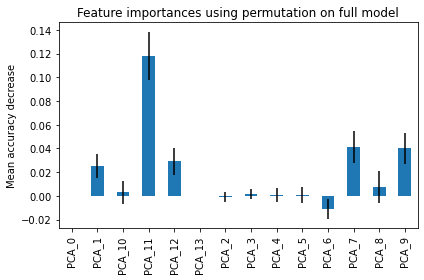

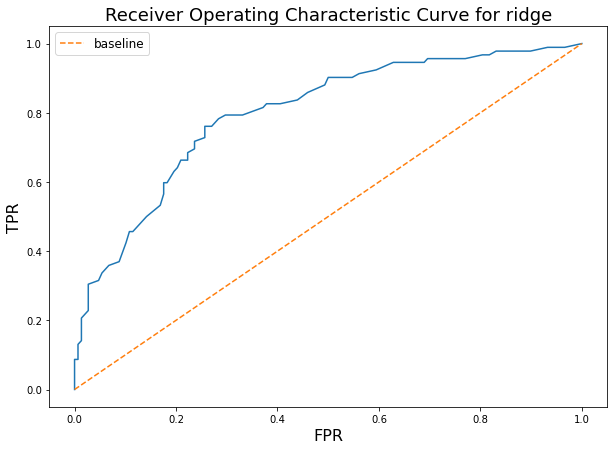

The ROC_AUC score is 0.7972238542890717


The Matthew correlation is 0.4926672120726288
-------------------
The accuracy is 0.75
The recall is 0.75
The macro F1 score is 0.7428571428571429
The micro F1 score is 0.75
The weighted F1 score is 0.752857142857143
              precision    recall  f1-score   support

         0.0       0.83      0.74      0.79       148
         1.0       0.65      0.76      0.70        92

    accuracy                           0.75       240
   macro avg       0.74      0.75      0.74       240
weighted avg       0.76      0.75      0.75       240



Started Execute test train split at 15:03:00.
Started Started column type detection and casting at 15:03:00.
Started Checking for duplicate columns at 15:03:00.
Started Reset dataframe index. at 15:03:00.
Started Select best features at 15:03:00.
Started Delete columns with high share of NULLs at 15:03:00.
Started Apply datetime transformation at 15:03:00.
Started Start TFIDF to PCA loop at 15:03:00.
Started PCA POS tags at 15:03:00.
Started PCA POS tags at 15:03:00.
Started PCA POS tags at 15:03:00.
Started Handle rare features at 15:03:00.
Started Remove cardinality at 15:03:00.
Started Holistic NULL filling at 15:03:00.
Started Binarize numeric columns + PCA binarized features at 15:03:00.
Started Onehot + PCA categorical features at 15:03:00.
Started Execute categorical encoding at 15:03:01.
Started Fill nulls at 15:03:01.
Started Handle outliers at 15:03:01.
Started Remove collinearity at 15:03:01.
Started Remove skewness at 15:03:01.
Started Execute clustering as a feature at 15:

Score achieved on holdout dataset is: 0.33184750212036906.
End iteration for algorithm ridge at 1637244182.5024016.
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Start iteration for algorithm xgboost at 1637244182.5032578.
Started Select best features at 15:03:02.
Features before selection are...PassengerId
Features before selection are...Pclass
Features before selection are...Age
Features before selection are...Fare
Features before selection are...Deck
Features before selection are...Title
Features before selection are...relatives
Features before selection are...Age_Class
Features before selection are...Fare_Per_Person
Features before selection are...Embarked
Features before selection are...Sex
Features before selection are...TFIDF PC-1 Ticket
Features before selection are...TFIDF PC-2 Ticket
Features before selection are...TFIDF PC-1 Cabin
Features before selection are...TFIDF PC-2 Cabin
Features before selecti

[I 2021-11-18 15:03:07,258] A new study created in memory with name: autoencoder_based_oversampling


Progress after this step is 50.0%.
Progress after this step is 100.0%.


  0%|          | 0/20 [00:00<?, ?it/s]

====> Epoch: 200 Average training loss: 209028.8333
====> Epoch: 200 Average test loss: 212821.3913
====> Epoch: 400 Average training loss: 208721.3704
====> Epoch: 400 Average test loss: 212542.4348
====> Epoch: 600 Average training loss: 208446.5000
====> Epoch: 600 Average test loss: 212265.8478
====> Epoch: 800 Average training loss: 208177.1296
====> Epoch: 800 Average test loss: 212002.5652
====> Epoch: 1000 Average training loss: 207912.7037
====> Epoch: 1000 Average test loss: 211740.3261
====> Epoch: 1200 Average training loss: 207652.0370
====> Epoch: 1200 Average test loss: 211483.3913
====> Epoch: 1400 Average training loss: 207394.7593
====> Epoch: 1400 Average test loss: 211228.7609
====> Epoch: 1600 Average training loss: 207139.7222
====> Epoch: 1600 Average test loss: 210973.2174
====> Epoch: 1800 Average training loss: 206885.5000
====> Epoch: 1800 Average test loss: 210717.5217
====> Epoch: 2000 Average training loss: 206633.5185
====> Epoch: 2000 Average test loss: 

====> Epoch: 5200 Average training loss: 202701.8704
====> Epoch: 5200 Average test loss: 206508.4130
====> Epoch: 5400 Average training loss: 202457.6852
====> Epoch: 5400 Average test loss: 206262.6304
====> Epoch: 5600 Average training loss: 202213.7593
====> Epoch: 5600 Average test loss: 206015.0435
====> Epoch: 5800 Average training loss: 201970.0926
====> Epoch: 5800 Average test loss: 205771.6087
====> Epoch: 6000 Average training loss: 201726.7778
====> Epoch: 6000 Average test loss: 205523.5652
====> Epoch: 6200 Average training loss: 201483.6852
====> Epoch: 6200 Average test loss: 205276.8696
====> Epoch: 6400 Average training loss: 201240.4444
====> Epoch: 6400 Average test loss: 205045.5652
====> Epoch: 6600 Average training loss: 200997.7407
====> Epoch: 6600 Average test loss: 204785.7609
====> Epoch: 6800 Average training loss: 200754.9259
====> Epoch: 6800 Average test loss: 204542.2391
====> Epoch: 7000 Average training loss: 200514.2037
====> Epoch: 7000 Average tes

====> Epoch: 9000 Average training loss: 198024.4444
====> Epoch: 9000 Average test loss: 201851.0217
====> Epoch: 9200 Average training loss: 197783.6296
====> Epoch: 9200 Average test loss: 201609.8478
====> Epoch: 9400 Average training loss: 197542.3148
====> Epoch: 9400 Average test loss: 201362.1739
====> Epoch: 9600 Average training loss: 197302.1852
====> Epoch: 9600 Average test loss: 201120.1087
====> Epoch: 9800 Average training loss: 197062.0926
====> Epoch: 9800 Average test loss: 200877.0217
====> Epoch: 10000 Average training loss: 196821.5741
====> Epoch: 10000 Average test loss: 200639.2391
====> Epoch: 10200 Average training loss: 196581.5185
====> Epoch: 10200 Average test loss: 200400.5435
====> Epoch: 10400 Average training loss: 196341.8333
====> Epoch: 10400 Average test loss: 200154.3913
====> Epoch: 10600 Average training loss: 196102.4630
====> Epoch: 10600 Average test loss: 199909.2609
====> Epoch: 10800 Average training loss: 195862.4815
====> Epoch: 10800 A

[I 2021-11-18 15:07:29,697] Trial 15 pruned. 
[I 2021-11-18 15:07:29,812] Trial 16 pruned. 
[I 2021-11-18 15:07:29,932] Trial 17 pruned. 
====> Epoch: 200 Average training loss: 208992.4074
====> Epoch: 200 Average test loss: 212807.3478
[I 2021-11-18 15:07:32,150] Trial 18 pruned. 
[I 2021-11-18 15:07:32,277] Trial 19 pruned. 


====> Epoch: 200 Average training loss: 209219.5926
====> Epoch: 200 Average test loss: 213054.6304
====> Epoch: 400 Average training loss: 208805.0741
====> Epoch: 400 Average test loss: 212663.8913
====> Epoch: 600 Average training loss: 208443.7778
====> Epoch: 600 Average test loss: 212259.8696
====> Epoch: 800 Average training loss: 208141.0741
====> Epoch: 800 Average test loss: 211943.8696
====> Epoch: 1000 Average training loss: 207866.6296
====> Epoch: 1000 Average test loss: 211670.3913
====> Epoch: 1200 Average training loss: 207595.4444
====> Epoch: 1200 Average test loss: 211397.1087
====> Epoch: 1400 Average training loss: 207327.1481
====> Epoch: 1400 Average test loss: 211134.7826
====> Epoch: 1600 Average training loss: 207066.0556
====> Epoch: 1600 Average test loss: 210877.2826
====> Epoch: 1800 Average training loss: 206810.5926
====> Epoch: 1800 Average test loss: 210621.1522
====> Epoch: 2000 Average training loss: 206554.5741
====> Epoch: 2000 Average test loss: 

====> Epoch: 16200 Average training loss: 189402.0185
====> Epoch: 16200 Average test loss: 193132.6957
====> Epoch: 16400 Average training loss: 189166.5185
====> Epoch: 16400 Average test loss: 192887.8478
====> Epoch: 16600 Average training loss: 188931.4630
====> Epoch: 16600 Average test loss: 192651.6087
Started Sort columns alphabetically at 15:09:00.
Started Train Xgboost at 15:09:00.
Started Check Xgboost for GPU acceleration. at 15:09:00.
[15:09:00] WARNING: /opt/conda/envs/rapids/conda-bld/xgboost_1623267594558/work/src/learner.cc:573: 
Parameters: { "steps" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




[I 2021-11-18 15:09:00,535] A new study created in memory with name: xgboost tuning


Xgboost uses GPU.


  0%|          | 0/3 [00:00<?, ?it/s]

[15:09:00] WARNING: /opt/conda/envs/rapids/conda-bld/xgboost_1623267594558/work/src/learner.cc:573: 
Parameters: { "min_child_samples", "num_leaves", "steps", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[15:09:00] WARNING: /opt/conda/envs/rapids/conda-bld/xgboost_1623267594558/work/src/learner.cc:573: 
Parameters: { "min_child_samples", "num_leaves", "steps", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[15:09:00] WARNING: /opt/conda/envs/rapids/conda-bld/xgboost_1623267594558/work/src/learner.cc:573: 
Parameters: { "min_child_samples", "num

[I 2021-11-18 15:16:17,623] Trial 1 finished with value: 0.44713463480514404 and parameters: {'max_depth': 9, 'alpha': 18.794668241638455, 'lambda': 12.329623163659836, 'num_leaves': 48, 'subsample': 0.5825453457757226, 'colsample_bytree': 0.762378215816119, 'colsample_bylevel': 0.7159725093210578, 'colsample_bynode': 0.645614570099021, 'min_child_samples': 614, 'eta': 0.0022158645374549917, 'steps': 20451, 'num_parallel_tree': 2}. Best is trial 1 with value: 0.44713463480514404.
[15:16:17] WARNING: /opt/conda/envs/rapids/conda-bld/xgboost_1623267594558/work/src/learner.cc:573: 
Parameters: { "min_child_samples", "num_leaves", "steps", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[15:16:17] WARNING: /opt/conda/envs/rapids/conda-bld/xgboost_1623267594558/work/src/l

[15:16:18] WARNING: /opt/conda/envs/rapids/conda-bld/xgboost_1623267594558/work/src/learner.cc:573: 
Parameters: { "min_child_samples", "num_leaves", "steps", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	train-mlogloss:0.69266	test-mlogloss:0.69281
[1]	train-mlogloss:0.69227	test-mlogloss:0.69259
[2]	train-mlogloss:0.69174	test-mlogloss:0.69217
[3]	train-mlogloss:0.69129	test-mlogloss:0.69188
[4]	train-mlogloss:0.69082	test-mlogloss:0.69153
[5]	train-mlogloss:0.69038	test-mlogloss:0.69119
[6]	train-mlogloss:0.68999	test-mlogloss:0.69093
[7]	train-mlogloss:0.68957	test-mlogloss:0.69064
[8]	train-mlogloss:0.68909	test-mlogloss:0.69025
[9]	train-mlogloss:0.68857	test-mlogloss:0.68984
[10]	train-mlogloss:0.68804	test-mlogloss:0.68942
[11]	train-mlogloss:0.68763	te

[155]	train-mlogloss:0.63164	test-mlogloss:0.64899
[156]	train-mlogloss:0.63126	test-mlogloss:0.64867
[157]	train-mlogloss:0.63093	test-mlogloss:0.64847
[158]	train-mlogloss:0.63058	test-mlogloss:0.64822
[159]	train-mlogloss:0.63021	test-mlogloss:0.64794
[160]	train-mlogloss:0.62984	test-mlogloss:0.64765
[161]	train-mlogloss:0.62947	test-mlogloss:0.64736
[162]	train-mlogloss:0.62916	test-mlogloss:0.64713
[163]	train-mlogloss:0.62879	test-mlogloss:0.64687
[164]	train-mlogloss:0.62849	test-mlogloss:0.64664
[165]	train-mlogloss:0.62813	test-mlogloss:0.64640
[166]	train-mlogloss:0.62771	test-mlogloss:0.64605
[167]	train-mlogloss:0.62733	test-mlogloss:0.64577
[168]	train-mlogloss:0.62706	test-mlogloss:0.64557
[169]	train-mlogloss:0.62670	test-mlogloss:0.64529
[170]	train-mlogloss:0.62641	test-mlogloss:0.64514
[171]	train-mlogloss:0.62609	test-mlogloss:0.64491
[172]	train-mlogloss:0.62572	test-mlogloss:0.64465
[173]	train-mlogloss:0.62543	test-mlogloss:0.64443
[174]	train-mlogloss:0.62511	te

[316]	train-mlogloss:0.58498	test-mlogloss:0.61525
[317]	train-mlogloss:0.58466	test-mlogloss:0.61499
[318]	train-mlogloss:0.58444	test-mlogloss:0.61489
[319]	train-mlogloss:0.58419	test-mlogloss:0.61472
[320]	train-mlogloss:0.58397	test-mlogloss:0.61459
[321]	train-mlogloss:0.58378	test-mlogloss:0.61449
[322]	train-mlogloss:0.58355	test-mlogloss:0.61433
[323]	train-mlogloss:0.58326	test-mlogloss:0.61410
[324]	train-mlogloss:0.58300	test-mlogloss:0.61390
[325]	train-mlogloss:0.58280	test-mlogloss:0.61374
[326]	train-mlogloss:0.58258	test-mlogloss:0.61358
[327]	train-mlogloss:0.58235	test-mlogloss:0.61342
[328]	train-mlogloss:0.58208	test-mlogloss:0.61324
[329]	train-mlogloss:0.58186	test-mlogloss:0.61306
[330]	train-mlogloss:0.58167	test-mlogloss:0.61294
[331]	train-mlogloss:0.58140	test-mlogloss:0.61276
[332]	train-mlogloss:0.58119	test-mlogloss:0.61263
[333]	train-mlogloss:0.58100	test-mlogloss:0.61253
[334]	train-mlogloss:0.58071	test-mlogloss:0.61225
[335]	train-mlogloss:0.58050	te

[477]	train-mlogloss:0.55085	test-mlogloss:0.59097
[478]	train-mlogloss:0.55067	test-mlogloss:0.59084
[479]	train-mlogloss:0.55047	test-mlogloss:0.59069
[480]	train-mlogloss:0.55026	test-mlogloss:0.59052
[481]	train-mlogloss:0.55007	test-mlogloss:0.59041
[482]	train-mlogloss:0.54988	test-mlogloss:0.59028
[483]	train-mlogloss:0.54970	test-mlogloss:0.59015
[484]	train-mlogloss:0.54954	test-mlogloss:0.59006
[485]	train-mlogloss:0.54938	test-mlogloss:0.58997
[486]	train-mlogloss:0.54925	test-mlogloss:0.58993
[487]	train-mlogloss:0.54903	test-mlogloss:0.58975
[488]	train-mlogloss:0.54885	test-mlogloss:0.58962
[489]	train-mlogloss:0.54865	test-mlogloss:0.58944
[490]	train-mlogloss:0.54850	test-mlogloss:0.58939
[491]	train-mlogloss:0.54830	test-mlogloss:0.58922
[492]	train-mlogloss:0.54813	test-mlogloss:0.58909
[493]	train-mlogloss:0.54796	test-mlogloss:0.58895
[494]	train-mlogloss:0.54775	test-mlogloss:0.58878
[495]	train-mlogloss:0.54756	test-mlogloss:0.58863
[496]	train-mlogloss:0.54733	te

[638]	train-mlogloss:0.52437	test-mlogloss:0.57227
[639]	train-mlogloss:0.52424	test-mlogloss:0.57215
[640]	train-mlogloss:0.52413	test-mlogloss:0.57207
[641]	train-mlogloss:0.52399	test-mlogloss:0.57195
[642]	train-mlogloss:0.52387	test-mlogloss:0.57190
[643]	train-mlogloss:0.52373	test-mlogloss:0.57181
[644]	train-mlogloss:0.52360	test-mlogloss:0.57174
[645]	train-mlogloss:0.52348	test-mlogloss:0.57167
[646]	train-mlogloss:0.52334	test-mlogloss:0.57159
[647]	train-mlogloss:0.52317	test-mlogloss:0.57143
[648]	train-mlogloss:0.52304	test-mlogloss:0.57137
[649]	train-mlogloss:0.52289	test-mlogloss:0.57125
[650]	train-mlogloss:0.52275	test-mlogloss:0.57117
[651]	train-mlogloss:0.52260	test-mlogloss:0.57107
[652]	train-mlogloss:0.52246	test-mlogloss:0.57097
[653]	train-mlogloss:0.52234	test-mlogloss:0.57089
[654]	train-mlogloss:0.52220	test-mlogloss:0.57077
[655]	train-mlogloss:0.52207	test-mlogloss:0.57069
[656]	train-mlogloss:0.52192	test-mlogloss:0.57059
[657]	train-mlogloss:0.52180	te

[799]	train-mlogloss:0.50404	test-mlogloss:0.55777
[800]	train-mlogloss:0.50394	test-mlogloss:0.55770
[801]	train-mlogloss:0.50382	test-mlogloss:0.55762
[802]	train-mlogloss:0.50370	test-mlogloss:0.55754
[803]	train-mlogloss:0.50360	test-mlogloss:0.55748
[804]	train-mlogloss:0.50352	test-mlogloss:0.55741
[805]	train-mlogloss:0.50340	test-mlogloss:0.55732
[806]	train-mlogloss:0.50331	test-mlogloss:0.55725
[807]	train-mlogloss:0.50319	test-mlogloss:0.55718
[808]	train-mlogloss:0.50311	test-mlogloss:0.55715
[809]	train-mlogloss:0.50298	test-mlogloss:0.55706
[810]	train-mlogloss:0.50286	test-mlogloss:0.55696
[811]	train-mlogloss:0.50278	test-mlogloss:0.55692
[812]	train-mlogloss:0.50268	test-mlogloss:0.55683
[813]	train-mlogloss:0.50255	test-mlogloss:0.55672
[814]	train-mlogloss:0.50246	test-mlogloss:0.55666
[815]	train-mlogloss:0.50239	test-mlogloss:0.55663
[816]	train-mlogloss:0.50226	test-mlogloss:0.55652
[817]	train-mlogloss:0.50214	test-mlogloss:0.55641
[818]	train-mlogloss:0.50203	te

[960]	train-mlogloss:0.48811	test-mlogloss:0.54667
[961]	train-mlogloss:0.48808	test-mlogloss:0.54665
[962]	train-mlogloss:0.48799	test-mlogloss:0.54658
[963]	train-mlogloss:0.48791	test-mlogloss:0.54653
[964]	train-mlogloss:0.48779	test-mlogloss:0.54644
[965]	train-mlogloss:0.48770	test-mlogloss:0.54637
[966]	train-mlogloss:0.48760	test-mlogloss:0.54628
[967]	train-mlogloss:0.48753	test-mlogloss:0.54623
[968]	train-mlogloss:0.48746	test-mlogloss:0.54619
[969]	train-mlogloss:0.48739	test-mlogloss:0.54613
[970]	train-mlogloss:0.48728	test-mlogloss:0.54605
[971]	train-mlogloss:0.48721	test-mlogloss:0.54600
[972]	train-mlogloss:0.48712	test-mlogloss:0.54593
[973]	train-mlogloss:0.48705	test-mlogloss:0.54590
[974]	train-mlogloss:0.48699	test-mlogloss:0.54586
[975]	train-mlogloss:0.48693	test-mlogloss:0.54582
[976]	train-mlogloss:0.48683	test-mlogloss:0.54575
[977]	train-mlogloss:0.48676	test-mlogloss:0.54571
[978]	train-mlogloss:0.48669	test-mlogloss:0.54564
[979]	train-mlogloss:0.48659	te

[1119]	train-mlogloss:0.47576	test-mlogloss:0.53807
[1120]	train-mlogloss:0.47570	test-mlogloss:0.53804
[1121]	train-mlogloss:0.47567	test-mlogloss:0.53803
[1122]	train-mlogloss:0.47560	test-mlogloss:0.53799
[1123]	train-mlogloss:0.47550	test-mlogloss:0.53789
[1124]	train-mlogloss:0.47542	test-mlogloss:0.53782
[1125]	train-mlogloss:0.47533	test-mlogloss:0.53778
[1126]	train-mlogloss:0.47527	test-mlogloss:0.53773
[1127]	train-mlogloss:0.47520	test-mlogloss:0.53770
[1128]	train-mlogloss:0.47514	test-mlogloss:0.53767
[1129]	train-mlogloss:0.47508	test-mlogloss:0.53763
[1130]	train-mlogloss:0.47500	test-mlogloss:0.53759
[1131]	train-mlogloss:0.47494	test-mlogloss:0.53756
[1132]	train-mlogloss:0.47486	test-mlogloss:0.53750
[1133]	train-mlogloss:0.47479	test-mlogloss:0.53746
[1134]	train-mlogloss:0.47472	test-mlogloss:0.53741
[1135]	train-mlogloss:0.47469	test-mlogloss:0.53741
[1136]	train-mlogloss:0.47461	test-mlogloss:0.53734
[1137]	train-mlogloss:0.47456	test-mlogloss:0.53730
[1138]	train

[1277]	train-mlogloss:0.46647	test-mlogloss:0.53182
[1278]	train-mlogloss:0.46643	test-mlogloss:0.53179
[1279]	train-mlogloss:0.46634	test-mlogloss:0.53172
[1280]	train-mlogloss:0.46628	test-mlogloss:0.53170
[1281]	train-mlogloss:0.46624	test-mlogloss:0.53168
[1282]	train-mlogloss:0.46619	test-mlogloss:0.53165
[1283]	train-mlogloss:0.46615	test-mlogloss:0.53162
[1284]	train-mlogloss:0.46610	test-mlogloss:0.53157
[1285]	train-mlogloss:0.46603	test-mlogloss:0.53151
[1286]	train-mlogloss:0.46595	test-mlogloss:0.53145
[1287]	train-mlogloss:0.46589	test-mlogloss:0.53142
[1288]	train-mlogloss:0.46583	test-mlogloss:0.53139
[1289]	train-mlogloss:0.46577	test-mlogloss:0.53135
[1290]	train-mlogloss:0.46571	test-mlogloss:0.53131
[1291]	train-mlogloss:0.46564	test-mlogloss:0.53124
[1292]	train-mlogloss:0.46555	test-mlogloss:0.53116
[1293]	train-mlogloss:0.46547	test-mlogloss:0.53110
[1294]	train-mlogloss:0.46540	test-mlogloss:0.53105
[1295]	train-mlogloss:0.46532	test-mlogloss:0.53099
[1296]	train

[1435]	train-mlogloss:0.45853	test-mlogloss:0.52637
[1436]	train-mlogloss:0.45849	test-mlogloss:0.52635
[1437]	train-mlogloss:0.45844	test-mlogloss:0.52633
[1438]	train-mlogloss:0.45839	test-mlogloss:0.52629
[1439]	train-mlogloss:0.45833	test-mlogloss:0.52626
[1440]	train-mlogloss:0.45827	test-mlogloss:0.52620
[1441]	train-mlogloss:0.45823	test-mlogloss:0.52618
[1442]	train-mlogloss:0.45818	test-mlogloss:0.52614
[1443]	train-mlogloss:0.45812	test-mlogloss:0.52609
[1444]	train-mlogloss:0.45810	test-mlogloss:0.52607
[1445]	train-mlogloss:0.45806	test-mlogloss:0.52605
[1446]	train-mlogloss:0.45801	test-mlogloss:0.52601
[1447]	train-mlogloss:0.45799	test-mlogloss:0.52602
[1448]	train-mlogloss:0.45794	test-mlogloss:0.52599
[1449]	train-mlogloss:0.45789	test-mlogloss:0.52597
[1450]	train-mlogloss:0.45785	test-mlogloss:0.52593
[1451]	train-mlogloss:0.45781	test-mlogloss:0.52591
[1452]	train-mlogloss:0.45774	test-mlogloss:0.52587
[1453]	train-mlogloss:0.45770	test-mlogloss:0.52584
[1454]	train

[1593]	train-mlogloss:0.45223	test-mlogloss:0.52211
[1594]	train-mlogloss:0.45217	test-mlogloss:0.52208
[1595]	train-mlogloss:0.45212	test-mlogloss:0.52203
[1596]	train-mlogloss:0.45205	test-mlogloss:0.52197
[1597]	train-mlogloss:0.45200	test-mlogloss:0.52194
[1598]	train-mlogloss:0.45198	test-mlogloss:0.52192
[1599]	train-mlogloss:0.45194	test-mlogloss:0.52189
[1600]	train-mlogloss:0.45188	test-mlogloss:0.52184
[1601]	train-mlogloss:0.45186	test-mlogloss:0.52184
[1602]	train-mlogloss:0.45183	test-mlogloss:0.52181
[1603]	train-mlogloss:0.45177	test-mlogloss:0.52179
[1604]	train-mlogloss:0.45174	test-mlogloss:0.52176
[1605]	train-mlogloss:0.45171	test-mlogloss:0.52173
[1606]	train-mlogloss:0.45163	test-mlogloss:0.52167
[1607]	train-mlogloss:0.45159	test-mlogloss:0.52163
[1608]	train-mlogloss:0.45154	test-mlogloss:0.52161
[1609]	train-mlogloss:0.45151	test-mlogloss:0.52160
[1610]	train-mlogloss:0.45147	test-mlogloss:0.52158
[1611]	train-mlogloss:0.45142	test-mlogloss:0.52153
[1612]	train

[1751]	train-mlogloss:0.44678	test-mlogloss:0.51836
[1752]	train-mlogloss:0.44675	test-mlogloss:0.51833
[1753]	train-mlogloss:0.44673	test-mlogloss:0.51832
[1754]	train-mlogloss:0.44668	test-mlogloss:0.51828
[1755]	train-mlogloss:0.44666	test-mlogloss:0.51826
[1756]	train-mlogloss:0.44665	test-mlogloss:0.51826
[1757]	train-mlogloss:0.44662	test-mlogloss:0.51824
[1758]	train-mlogloss:0.44659	test-mlogloss:0.51823
[1759]	train-mlogloss:0.44657	test-mlogloss:0.51821
[1760]	train-mlogloss:0.44652	test-mlogloss:0.51819
[1761]	train-mlogloss:0.44650	test-mlogloss:0.51818
[1762]	train-mlogloss:0.44647	test-mlogloss:0.51816
[1763]	train-mlogloss:0.44641	test-mlogloss:0.51811
[1764]	train-mlogloss:0.44640	test-mlogloss:0.51810
[1765]	train-mlogloss:0.44639	test-mlogloss:0.51809
[1766]	train-mlogloss:0.44636	test-mlogloss:0.51806
[1767]	train-mlogloss:0.44633	test-mlogloss:0.51805
[1768]	train-mlogloss:0.44630	test-mlogloss:0.51802
[1769]	train-mlogloss:0.44626	test-mlogloss:0.51800
[1770]	train

[1909]	train-mlogloss:0.44235	test-mlogloss:0.51538
[1910]	train-mlogloss:0.44234	test-mlogloss:0.51539
[1911]	train-mlogloss:0.44232	test-mlogloss:0.51537
[1912]	train-mlogloss:0.44229	test-mlogloss:0.51536
[1913]	train-mlogloss:0.44226	test-mlogloss:0.51535
[1914]	train-mlogloss:0.44223	test-mlogloss:0.51533
[1915]	train-mlogloss:0.44220	test-mlogloss:0.51530
[1916]	train-mlogloss:0.44217	test-mlogloss:0.51529
[1917]	train-mlogloss:0.44215	test-mlogloss:0.51528
[1918]	train-mlogloss:0.44212	test-mlogloss:0.51526
[1919]	train-mlogloss:0.44208	test-mlogloss:0.51523
[1920]	train-mlogloss:0.44208	test-mlogloss:0.51523
[1921]	train-mlogloss:0.44207	test-mlogloss:0.51523
[1922]	train-mlogloss:0.44203	test-mlogloss:0.51520
[1923]	train-mlogloss:0.44200	test-mlogloss:0.51518
[1924]	train-mlogloss:0.44198	test-mlogloss:0.51517
[1925]	train-mlogloss:0.44197	test-mlogloss:0.51517
[1926]	train-mlogloss:0.44191	test-mlogloss:0.51513
[1927]	train-mlogloss:0.44189	test-mlogloss:0.51512
[1928]	train

[2067]	train-mlogloss:0.43869	test-mlogloss:0.51279
[2068]	train-mlogloss:0.43869	test-mlogloss:0.51279
[2069]	train-mlogloss:0.43866	test-mlogloss:0.51277
[2070]	train-mlogloss:0.43865	test-mlogloss:0.51277
[2071]	train-mlogloss:0.43865	test-mlogloss:0.51276
[2072]	train-mlogloss:0.43863	test-mlogloss:0.51274
[2073]	train-mlogloss:0.43858	test-mlogloss:0.51269
[2074]	train-mlogloss:0.43855	test-mlogloss:0.51267
[2075]	train-mlogloss:0.43852	test-mlogloss:0.51265
[2076]	train-mlogloss:0.43850	test-mlogloss:0.51264
[2077]	train-mlogloss:0.43849	test-mlogloss:0.51263
[2078]	train-mlogloss:0.43848	test-mlogloss:0.51263
[2079]	train-mlogloss:0.43846	test-mlogloss:0.51262
[2080]	train-mlogloss:0.43844	test-mlogloss:0.51261
[2081]	train-mlogloss:0.43841	test-mlogloss:0.51258
[2082]	train-mlogloss:0.43838	test-mlogloss:0.51256
[2083]	train-mlogloss:0.43835	test-mlogloss:0.51254
[2084]	train-mlogloss:0.43835	test-mlogloss:0.51254
[2085]	train-mlogloss:0.43831	test-mlogloss:0.51251
[2086]	train

[2225]	train-mlogloss:0.43513	test-mlogloss:0.51019
[2226]	train-mlogloss:0.43513	test-mlogloss:0.51019
[2227]	train-mlogloss:0.43511	test-mlogloss:0.51017
[2228]	train-mlogloss:0.43509	test-mlogloss:0.51016
[2229]	train-mlogloss:0.43509	test-mlogloss:0.51016
[2230]	train-mlogloss:0.43505	test-mlogloss:0.51012
[2231]	train-mlogloss:0.43502	test-mlogloss:0.51010
[2232]	train-mlogloss:0.43499	test-mlogloss:0.51007
[2233]	train-mlogloss:0.43498	test-mlogloss:0.51006
[2234]	train-mlogloss:0.43496	test-mlogloss:0.51005
[2235]	train-mlogloss:0.43495	test-mlogloss:0.51004
[2236]	train-mlogloss:0.43494	test-mlogloss:0.51004
[2237]	train-mlogloss:0.43491	test-mlogloss:0.51002
[2238]	train-mlogloss:0.43490	test-mlogloss:0.51001
[2239]	train-mlogloss:0.43488	test-mlogloss:0.51000
[2240]	train-mlogloss:0.43488	test-mlogloss:0.50999
[2241]	train-mlogloss:0.43484	test-mlogloss:0.50997
[2242]	train-mlogloss:0.43482	test-mlogloss:0.50994
[2243]	train-mlogloss:0.43479	test-mlogloss:0.50992
[2244]	train

[2383]	train-mlogloss:0.43223	test-mlogloss:0.50803
[2384]	train-mlogloss:0.43222	test-mlogloss:0.50802
[2385]	train-mlogloss:0.43222	test-mlogloss:0.50802
[2386]	train-mlogloss:0.43220	test-mlogloss:0.50801
[2387]	train-mlogloss:0.43218	test-mlogloss:0.50800
[2388]	train-mlogloss:0.43217	test-mlogloss:0.50799
[2389]	train-mlogloss:0.43215	test-mlogloss:0.50798
[2390]	train-mlogloss:0.43212	test-mlogloss:0.50796
[2391]	train-mlogloss:0.43211	test-mlogloss:0.50796
[2392]	train-mlogloss:0.43210	test-mlogloss:0.50795
[2393]	train-mlogloss:0.43206	test-mlogloss:0.50792
[2394]	train-mlogloss:0.43204	test-mlogloss:0.50791
[2395]	train-mlogloss:0.43203	test-mlogloss:0.50791
[2396]	train-mlogloss:0.43201	test-mlogloss:0.50789
[2397]	train-mlogloss:0.43199	test-mlogloss:0.50788
[2398]	train-mlogloss:0.43198	test-mlogloss:0.50787
[2399]	train-mlogloss:0.43196	test-mlogloss:0.50786
[2400]	train-mlogloss:0.43195	test-mlogloss:0.50786
[2401]	train-mlogloss:0.43194	test-mlogloss:0.50785
[2402]	train

[2541]	train-mlogloss:0.42989	test-mlogloss:0.50631
[2542]	train-mlogloss:0.42988	test-mlogloss:0.50630
[2543]	train-mlogloss:0.42986	test-mlogloss:0.50628
[2544]	train-mlogloss:0.42983	test-mlogloss:0.50625
[2545]	train-mlogloss:0.42982	test-mlogloss:0.50624
[2546]	train-mlogloss:0.42981	test-mlogloss:0.50624
[2547]	train-mlogloss:0.42981	test-mlogloss:0.50624
[2548]	train-mlogloss:0.42979	test-mlogloss:0.50623
[2549]	train-mlogloss:0.42978	test-mlogloss:0.50622
[2550]	train-mlogloss:0.42976	test-mlogloss:0.50620
[2551]	train-mlogloss:0.42974	test-mlogloss:0.50618
[2552]	train-mlogloss:0.42972	test-mlogloss:0.50617
[2553]	train-mlogloss:0.42970	test-mlogloss:0.50615
[2554]	train-mlogloss:0.42967	test-mlogloss:0.50613
[2555]	train-mlogloss:0.42965	test-mlogloss:0.50611
[2556]	train-mlogloss:0.42964	test-mlogloss:0.50611
[2557]	train-mlogloss:0.42961	test-mlogloss:0.50608
[2558]	train-mlogloss:0.42957	test-mlogloss:0.50604
[2559]	train-mlogloss:0.42956	test-mlogloss:0.50604
[2560]	train

[2698]	train-mlogloss:0.42762	test-mlogloss:0.50465
[2699]	train-mlogloss:0.42761	test-mlogloss:0.50466
[2700]	train-mlogloss:0.42761	test-mlogloss:0.50465
[2701]	train-mlogloss:0.42759	test-mlogloss:0.50464
[2702]	train-mlogloss:0.42758	test-mlogloss:0.50464
[2703]	train-mlogloss:0.42757	test-mlogloss:0.50463
[2704]	train-mlogloss:0.42755	test-mlogloss:0.50462
[2705]	train-mlogloss:0.42754	test-mlogloss:0.50461
[2706]	train-mlogloss:0.42752	test-mlogloss:0.50459
[2707]	train-mlogloss:0.42751	test-mlogloss:0.50458
[2708]	train-mlogloss:0.42749	test-mlogloss:0.50457
[2709]	train-mlogloss:0.42749	test-mlogloss:0.50456
[2710]	train-mlogloss:0.42747	test-mlogloss:0.50456
[2711]	train-mlogloss:0.42746	test-mlogloss:0.50455
[2712]	train-mlogloss:0.42746	test-mlogloss:0.50455
[2713]	train-mlogloss:0.42743	test-mlogloss:0.50452
[2714]	train-mlogloss:0.42742	test-mlogloss:0.50451
[2715]	train-mlogloss:0.42739	test-mlogloss:0.50449
[2716]	train-mlogloss:0.42738	test-mlogloss:0.50449
[2717]	train

[2856]	train-mlogloss:0.42561	test-mlogloss:0.50312
[2857]	train-mlogloss:0.42560	test-mlogloss:0.50312
[2858]	train-mlogloss:0.42560	test-mlogloss:0.50312
[2859]	train-mlogloss:0.42559	test-mlogloss:0.50311
[2860]	train-mlogloss:0.42558	test-mlogloss:0.50310
[2861]	train-mlogloss:0.42557	test-mlogloss:0.50309
[2862]	train-mlogloss:0.42557	test-mlogloss:0.50309
[2863]	train-mlogloss:0.42556	test-mlogloss:0.50309
[2864]	train-mlogloss:0.42556	test-mlogloss:0.50309
[2865]	train-mlogloss:0.42553	test-mlogloss:0.50306
[2866]	train-mlogloss:0.42552	test-mlogloss:0.50305
[2867]	train-mlogloss:0.42550	test-mlogloss:0.50304
[2868]	train-mlogloss:0.42550	test-mlogloss:0.50304
[2869]	train-mlogloss:0.42549	test-mlogloss:0.50304
[2870]	train-mlogloss:0.42546	test-mlogloss:0.50303
[2871]	train-mlogloss:0.42545	test-mlogloss:0.50301
[2872]	train-mlogloss:0.42542	test-mlogloss:0.50299
[2873]	train-mlogloss:0.42541	test-mlogloss:0.50298
[2874]	train-mlogloss:0.42540	test-mlogloss:0.50297
[2875]	train

[3014]	train-mlogloss:0.42399	test-mlogloss:0.50194
[3015]	train-mlogloss:0.42398	test-mlogloss:0.50193
[3016]	train-mlogloss:0.42397	test-mlogloss:0.50193
[3017]	train-mlogloss:0.42395	test-mlogloss:0.50191
[3018]	train-mlogloss:0.42395	test-mlogloss:0.50190
[3019]	train-mlogloss:0.42395	test-mlogloss:0.50190
[3020]	train-mlogloss:0.42394	test-mlogloss:0.50189
[3021]	train-mlogloss:0.42393	test-mlogloss:0.50189
[3022]	train-mlogloss:0.42392	test-mlogloss:0.50189
[3023]	train-mlogloss:0.42392	test-mlogloss:0.50189
[3024]	train-mlogloss:0.42392	test-mlogloss:0.50189
[3025]	train-mlogloss:0.42391	test-mlogloss:0.50187
[3026]	train-mlogloss:0.42390	test-mlogloss:0.50187
[3027]	train-mlogloss:0.42389	test-mlogloss:0.50187
[3028]	train-mlogloss:0.42388	test-mlogloss:0.50186
[3029]	train-mlogloss:0.42386	test-mlogloss:0.50185
[3030]	train-mlogloss:0.42386	test-mlogloss:0.50185
[3031]	train-mlogloss:0.42385	test-mlogloss:0.50185
[3032]	train-mlogloss:0.42385	test-mlogloss:0.50184
[3033]	train

[3172]	train-mlogloss:0.42250	test-mlogloss:0.50086
[3173]	train-mlogloss:0.42249	test-mlogloss:0.50085
[3174]	train-mlogloss:0.42249	test-mlogloss:0.50085
[3175]	train-mlogloss:0.42248	test-mlogloss:0.50084
[3176]	train-mlogloss:0.42247	test-mlogloss:0.50084
[3177]	train-mlogloss:0.42246	test-mlogloss:0.50083
[3178]	train-mlogloss:0.42246	test-mlogloss:0.50083
[3179]	train-mlogloss:0.42244	test-mlogloss:0.50081
[3180]	train-mlogloss:0.42242	test-mlogloss:0.50080
[3181]	train-mlogloss:0.42241	test-mlogloss:0.50079
[3182]	train-mlogloss:0.42239	test-mlogloss:0.50077
[3183]	train-mlogloss:0.42238	test-mlogloss:0.50076
[3184]	train-mlogloss:0.42238	test-mlogloss:0.50075
[3185]	train-mlogloss:0.42237	test-mlogloss:0.50075
[3186]	train-mlogloss:0.42237	test-mlogloss:0.50075
[3187]	train-mlogloss:0.42235	test-mlogloss:0.50073
[3188]	train-mlogloss:0.42232	test-mlogloss:0.50070
[3189]	train-mlogloss:0.42231	test-mlogloss:0.50070
[3190]	train-mlogloss:0.42231	test-mlogloss:0.50069
[3191]	train

[3330]	train-mlogloss:0.42102	test-mlogloss:0.49976
[3331]	train-mlogloss:0.42101	test-mlogloss:0.49975
[3332]	train-mlogloss:0.42100	test-mlogloss:0.49975
[3333]	train-mlogloss:0.42100	test-mlogloss:0.49975
[3334]	train-mlogloss:0.42098	test-mlogloss:0.49973
[3335]	train-mlogloss:0.42097	test-mlogloss:0.49972
[3336]	train-mlogloss:0.42097	test-mlogloss:0.49972
[3337]	train-mlogloss:0.42097	test-mlogloss:0.49972
[3338]	train-mlogloss:0.42097	test-mlogloss:0.49971
[3339]	train-mlogloss:0.42097	test-mlogloss:0.49971
[3340]	train-mlogloss:0.42096	test-mlogloss:0.49971
[3341]	train-mlogloss:0.42096	test-mlogloss:0.49970
[3342]	train-mlogloss:0.42095	test-mlogloss:0.49970
[3343]	train-mlogloss:0.42094	test-mlogloss:0.49969
[3344]	train-mlogloss:0.42093	test-mlogloss:0.49969
[3345]	train-mlogloss:0.42093	test-mlogloss:0.49968
[3346]	train-mlogloss:0.42092	test-mlogloss:0.49968
[3347]	train-mlogloss:0.42090	test-mlogloss:0.49967
[3348]	train-mlogloss:0.42090	test-mlogloss:0.49967
[3349]	train

[3488]	train-mlogloss:0.41978	test-mlogloss:0.49881
[3489]	train-mlogloss:0.41978	test-mlogloss:0.49881
[3490]	train-mlogloss:0.41976	test-mlogloss:0.49881
[3491]	train-mlogloss:0.41976	test-mlogloss:0.49881
[3492]	train-mlogloss:0.41975	test-mlogloss:0.49880
[3493]	train-mlogloss:0.41973	test-mlogloss:0.49877
[3494]	train-mlogloss:0.41971	test-mlogloss:0.49876
[3495]	train-mlogloss:0.41970	test-mlogloss:0.49875
[3496]	train-mlogloss:0.41970	test-mlogloss:0.49874
[3497]	train-mlogloss:0.41970	test-mlogloss:0.49874
[3498]	train-mlogloss:0.41969	test-mlogloss:0.49874
[3499]	train-mlogloss:0.41969	test-mlogloss:0.49874
[3500]	train-mlogloss:0.41969	test-mlogloss:0.49874
[3501]	train-mlogloss:0.41968	test-mlogloss:0.49873
[3502]	train-mlogloss:0.41966	test-mlogloss:0.49872
[3503]	train-mlogloss:0.41965	test-mlogloss:0.49871
[3504]	train-mlogloss:0.41965	test-mlogloss:0.49871
[3505]	train-mlogloss:0.41964	test-mlogloss:0.49871
[3506]	train-mlogloss:0.41964	test-mlogloss:0.49871
[3507]	train

[3646]	train-mlogloss:0.41860	test-mlogloss:0.49797
[3647]	train-mlogloss:0.41860	test-mlogloss:0.49797
[3648]	train-mlogloss:0.41859	test-mlogloss:0.49796
[3649]	train-mlogloss:0.41859	test-mlogloss:0.49796
[3650]	train-mlogloss:0.41859	test-mlogloss:0.49796
[3651]	train-mlogloss:0.41858	test-mlogloss:0.49796
[3652]	train-mlogloss:0.41857	test-mlogloss:0.49796
[3653]	train-mlogloss:0.41856	test-mlogloss:0.49795
[3654]	train-mlogloss:0.41856	test-mlogloss:0.49795
[3655]	train-mlogloss:0.41855	test-mlogloss:0.49794
[3656]	train-mlogloss:0.41855	test-mlogloss:0.49793
[3657]	train-mlogloss:0.41854	test-mlogloss:0.49792
[3658]	train-mlogloss:0.41853	test-mlogloss:0.49792
[3659]	train-mlogloss:0.41852	test-mlogloss:0.49791
[3660]	train-mlogloss:0.41852	test-mlogloss:0.49791
[3661]	train-mlogloss:0.41852	test-mlogloss:0.49790
[3662]	train-mlogloss:0.41850	test-mlogloss:0.49789
[3663]	train-mlogloss:0.41850	test-mlogloss:0.49789
[3664]	train-mlogloss:0.41849	test-mlogloss:0.49788
[3665]	train

[3803]	train-mlogloss:0.41762	test-mlogloss:0.49727
[3804]	train-mlogloss:0.41761	test-mlogloss:0.49726
[3805]	train-mlogloss:0.41761	test-mlogloss:0.49726
[3806]	train-mlogloss:0.41761	test-mlogloss:0.49726
[3807]	train-mlogloss:0.41761	test-mlogloss:0.49726
[3808]	train-mlogloss:0.41759	test-mlogloss:0.49725
[3809]	train-mlogloss:0.41758	test-mlogloss:0.49725
[3810]	train-mlogloss:0.41757	test-mlogloss:0.49725
[3811]	train-mlogloss:0.41757	test-mlogloss:0.49724
[3812]	train-mlogloss:0.41756	test-mlogloss:0.49723
[3813]	train-mlogloss:0.41755	test-mlogloss:0.49723
[3814]	train-mlogloss:0.41755	test-mlogloss:0.49723
[3815]	train-mlogloss:0.41755	test-mlogloss:0.49723
[3816]	train-mlogloss:0.41754	test-mlogloss:0.49722
[3817]	train-mlogloss:0.41753	test-mlogloss:0.49721
[3818]	train-mlogloss:0.41751	test-mlogloss:0.49719
[3819]	train-mlogloss:0.41749	test-mlogloss:0.49718
[3820]	train-mlogloss:0.41748	test-mlogloss:0.49718
[3821]	train-mlogloss:0.41748	test-mlogloss:0.49718
[3822]	train

[3961]	train-mlogloss:0.41671	test-mlogloss:0.49664
[3962]	train-mlogloss:0.41670	test-mlogloss:0.49663
[3963]	train-mlogloss:0.41670	test-mlogloss:0.49663
[3964]	train-mlogloss:0.41669	test-mlogloss:0.49663
[3965]	train-mlogloss:0.41669	test-mlogloss:0.49663
[3966]	train-mlogloss:0.41668	test-mlogloss:0.49661
[3967]	train-mlogloss:0.41668	test-mlogloss:0.49661
[3968]	train-mlogloss:0.41667	test-mlogloss:0.49660
[3969]	train-mlogloss:0.41667	test-mlogloss:0.49660
[3970]	train-mlogloss:0.41667	test-mlogloss:0.49660
[3971]	train-mlogloss:0.41665	test-mlogloss:0.49658
[3972]	train-mlogloss:0.41664	test-mlogloss:0.49657
[3973]	train-mlogloss:0.41664	test-mlogloss:0.49657
[3974]	train-mlogloss:0.41663	test-mlogloss:0.49656
[3975]	train-mlogloss:0.41662	test-mlogloss:0.49656
[3976]	train-mlogloss:0.41661	test-mlogloss:0.49655
[3977]	train-mlogloss:0.41661	test-mlogloss:0.49654
[3978]	train-mlogloss:0.41660	test-mlogloss:0.49654
[3979]	train-mlogloss:0.41660	test-mlogloss:0.49654
[3980]	train

[4119]	train-mlogloss:0.41593	test-mlogloss:0.49601
[4120]	train-mlogloss:0.41592	test-mlogloss:0.49601
[4121]	train-mlogloss:0.41591	test-mlogloss:0.49601
[4122]	train-mlogloss:0.41590	test-mlogloss:0.49600
[4123]	train-mlogloss:0.41590	test-mlogloss:0.49600
[4124]	train-mlogloss:0.41590	test-mlogloss:0.49600
[4125]	train-mlogloss:0.41589	test-mlogloss:0.49600
[4126]	train-mlogloss:0.41589	test-mlogloss:0.49600
[4127]	train-mlogloss:0.41588	test-mlogloss:0.49599
[4128]	train-mlogloss:0.41586	test-mlogloss:0.49599
[4129]	train-mlogloss:0.41585	test-mlogloss:0.49598
[4130]	train-mlogloss:0.41584	test-mlogloss:0.49597
[4131]	train-mlogloss:0.41583	test-mlogloss:0.49597
[4132]	train-mlogloss:0.41583	test-mlogloss:0.49597
[4133]	train-mlogloss:0.41582	test-mlogloss:0.49595
[4134]	train-mlogloss:0.41582	test-mlogloss:0.49595
[4135]	train-mlogloss:0.41582	test-mlogloss:0.49596
[4136]	train-mlogloss:0.41581	test-mlogloss:0.49595
[4137]	train-mlogloss:0.41579	test-mlogloss:0.49595
[4138]	train

[4277]	train-mlogloss:0.41509	test-mlogloss:0.49538
[4278]	train-mlogloss:0.41508	test-mlogloss:0.49538
[4279]	train-mlogloss:0.41508	test-mlogloss:0.49538
[4280]	train-mlogloss:0.41508	test-mlogloss:0.49538
[4281]	train-mlogloss:0.41507	test-mlogloss:0.49537
[4282]	train-mlogloss:0.41506	test-mlogloss:0.49536
[4283]	train-mlogloss:0.41506	test-mlogloss:0.49536
[4284]	train-mlogloss:0.41505	test-mlogloss:0.49535
[4285]	train-mlogloss:0.41505	test-mlogloss:0.49535
[4286]	train-mlogloss:0.41503	test-mlogloss:0.49534
[4287]	train-mlogloss:0.41502	test-mlogloss:0.49533
[4288]	train-mlogloss:0.41501	test-mlogloss:0.49532
[4289]	train-mlogloss:0.41501	test-mlogloss:0.49532
[4290]	train-mlogloss:0.41501	test-mlogloss:0.49532
[4291]	train-mlogloss:0.41501	test-mlogloss:0.49532
[4292]	train-mlogloss:0.41500	test-mlogloss:0.49531
[4293]	train-mlogloss:0.41500	test-mlogloss:0.49531
[4294]	train-mlogloss:0.41500	test-mlogloss:0.49531
[4295]	train-mlogloss:0.41500	test-mlogloss:0.49531
[4296]	train

[4435]	train-mlogloss:0.41428	test-mlogloss:0.49479
[4436]	train-mlogloss:0.41427	test-mlogloss:0.49479
[4437]	train-mlogloss:0.41426	test-mlogloss:0.49479
[4438]	train-mlogloss:0.41426	test-mlogloss:0.49479
[4439]	train-mlogloss:0.41425	test-mlogloss:0.49478
[4440]	train-mlogloss:0.41425	test-mlogloss:0.49478
[4441]	train-mlogloss:0.41424	test-mlogloss:0.49477
[4442]	train-mlogloss:0.41423	test-mlogloss:0.49476
[4443]	train-mlogloss:0.41422	test-mlogloss:0.49476
[4444]	train-mlogloss:0.41421	test-mlogloss:0.49475
[4445]	train-mlogloss:0.41421	test-mlogloss:0.49474
[4446]	train-mlogloss:0.41421	test-mlogloss:0.49474
[4447]	train-mlogloss:0.41420	test-mlogloss:0.49474
[4448]	train-mlogloss:0.41419	test-mlogloss:0.49473
[4449]	train-mlogloss:0.41419	test-mlogloss:0.49473
[4450]	train-mlogloss:0.41419	test-mlogloss:0.49473
[4451]	train-mlogloss:0.41419	test-mlogloss:0.49473
[4452]	train-mlogloss:0.41418	test-mlogloss:0.49472
[4453]	train-mlogloss:0.41417	test-mlogloss:0.49471
[4454]	train

[4593]	train-mlogloss:0.41357	test-mlogloss:0.49427
[4594]	train-mlogloss:0.41356	test-mlogloss:0.49426
[4595]	train-mlogloss:0.41356	test-mlogloss:0.49426
[4596]	train-mlogloss:0.41356	test-mlogloss:0.49425
[4597]	train-mlogloss:0.41355	test-mlogloss:0.49425
[4598]	train-mlogloss:0.41355	test-mlogloss:0.49425
[4599]	train-mlogloss:0.41355	test-mlogloss:0.49425
[4600]	train-mlogloss:0.41355	test-mlogloss:0.49425
[4601]	train-mlogloss:0.41355	test-mlogloss:0.49425
[4602]	train-mlogloss:0.41355	test-mlogloss:0.49425
[4603]	train-mlogloss:0.41354	test-mlogloss:0.49424
[4604]	train-mlogloss:0.41354	test-mlogloss:0.49424
[4605]	train-mlogloss:0.41353	test-mlogloss:0.49424
[4606]	train-mlogloss:0.41353	test-mlogloss:0.49424
[4607]	train-mlogloss:0.41353	test-mlogloss:0.49424
[4608]	train-mlogloss:0.41353	test-mlogloss:0.49424
[4609]	train-mlogloss:0.41352	test-mlogloss:0.49423
[4610]	train-mlogloss:0.41351	test-mlogloss:0.49422
[4611]	train-mlogloss:0.41351	test-mlogloss:0.49422
[4612]	train

[4751]	train-mlogloss:0.41294	test-mlogloss:0.49379
[4752]	train-mlogloss:0.41294	test-mlogloss:0.49378
[4753]	train-mlogloss:0.41294	test-mlogloss:0.49378
[4754]	train-mlogloss:0.41293	test-mlogloss:0.49378
[4755]	train-mlogloss:0.41292	test-mlogloss:0.49377
[4756]	train-mlogloss:0.41291	test-mlogloss:0.49376
[4757]	train-mlogloss:0.41291	test-mlogloss:0.49376
[4758]	train-mlogloss:0.41289	test-mlogloss:0.49374
[4759]	train-mlogloss:0.41289	test-mlogloss:0.49374
[4760]	train-mlogloss:0.41289	test-mlogloss:0.49374
[4761]	train-mlogloss:0.41288	test-mlogloss:0.49373
[4762]	train-mlogloss:0.41287	test-mlogloss:0.49372
[4763]	train-mlogloss:0.41286	test-mlogloss:0.49372
[4764]	train-mlogloss:0.41286	test-mlogloss:0.49372
[4765]	train-mlogloss:0.41286	test-mlogloss:0.49372
[4766]	train-mlogloss:0.41286	test-mlogloss:0.49372
[4767]	train-mlogloss:0.41286	test-mlogloss:0.49372
[4768]	train-mlogloss:0.41286	test-mlogloss:0.49372
[4769]	train-mlogloss:0.41285	test-mlogloss:0.49371
[4770]	train

[4909]	train-mlogloss:0.41229	test-mlogloss:0.49333
[4910]	train-mlogloss:0.41229	test-mlogloss:0.49333
[4911]	train-mlogloss:0.41229	test-mlogloss:0.49333
[4912]	train-mlogloss:0.41227	test-mlogloss:0.49333
[4913]	train-mlogloss:0.41227	test-mlogloss:0.49333
[4914]	train-mlogloss:0.41226	test-mlogloss:0.49333
[4915]	train-mlogloss:0.41226	test-mlogloss:0.49332
[4916]	train-mlogloss:0.41224	test-mlogloss:0.49331
[4917]	train-mlogloss:0.41224	test-mlogloss:0.49331
[4918]	train-mlogloss:0.41224	test-mlogloss:0.49331
[4919]	train-mlogloss:0.41224	test-mlogloss:0.49331
[4920]	train-mlogloss:0.41224	test-mlogloss:0.49331
[4921]	train-mlogloss:0.41224	test-mlogloss:0.49330
[4922]	train-mlogloss:0.41223	test-mlogloss:0.49330
[4923]	train-mlogloss:0.41222	test-mlogloss:0.49329
[4924]	train-mlogloss:0.41221	test-mlogloss:0.49328
[4925]	train-mlogloss:0.41220	test-mlogloss:0.49327
[4926]	train-mlogloss:0.41220	test-mlogloss:0.49327
[4927]	train-mlogloss:0.41220	test-mlogloss:0.49327
[4928]	train

[5067]	train-mlogloss:0.41168	test-mlogloss:0.49291
[5068]	train-mlogloss:0.41168	test-mlogloss:0.49290
[5069]	train-mlogloss:0.41168	test-mlogloss:0.49290
[5070]	train-mlogloss:0.41168	test-mlogloss:0.49290
[5071]	train-mlogloss:0.41167	test-mlogloss:0.49291
[5072]	train-mlogloss:0.41167	test-mlogloss:0.49291
[5073]	train-mlogloss:0.41167	test-mlogloss:0.49291
Started Predict with Xgboost at 15:16:45.
15:16:45


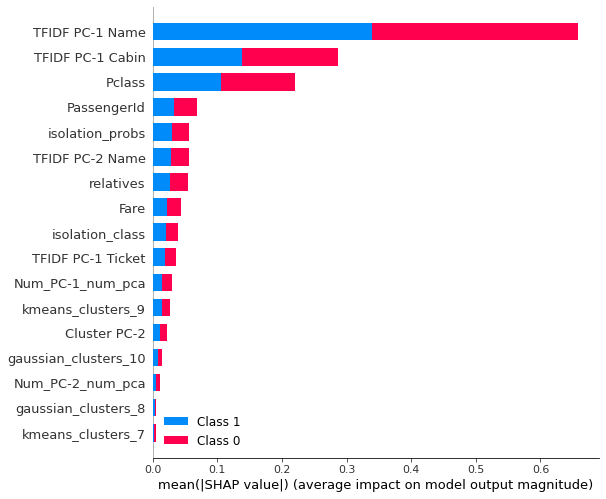

<Figure size 1152x864 with 0 Axes>

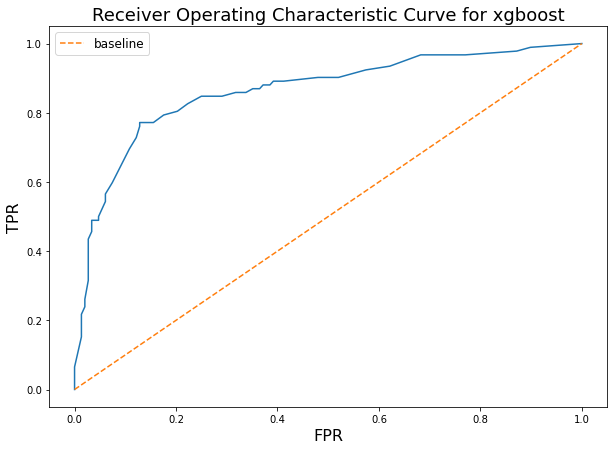

The ROC_AUC score is 0.8619271445358401


The Matthew correlation is 0.6449573270592333
-------------------
The accuracy is 0.8333333333333334
The recall is 0.8333333333333334
The macro F1 score is 0.8222222222222222
The micro F1 score is 0.8333333333333334
The weighted F1 score is 0.8325925925925927
              precision    recall  f1-score   support

         0.0       0.86      0.88      0.87       148
         1.0       0.80      0.76      0.78        92

    accuracy                           0.83       240
   macro avg       0.83      0.82      0.82       240
weighted avg       0.83      0.83      0.83       240



Started Execute test train split at 15:16:48.
Started Started column type detection and casting at 15:16:48.
Started Checking for duplicate columns at 15:16:48.
Started Reset dataframe index. at 15:16:48.
Started Select best features at 15:16:48.
Started Delete columns with high share of NULLs at 15:16:48.
Started Apply datetime transformation at 15:16:48.
Started Start TFIDF to PCA loop at 15:16:48.
Started PCA POS tags at 15:16:48.
Started PCA POS tags at 15:16:48.
Started PCA POS tags at 15:16:48.
Started Handle rare features at 15:16:48.
Started Remove cardinality at 15:16:48.
Started Holistic NULL filling at 15:16:48.
Started Binarize numeric columns + PCA binarized features at 15:16:48.
Started Onehot + PCA categorical features at 15:16:48.
Started Execute categorical encoding at 15:16:48.
Started Fill nulls at 15:16:48.
Started Handle outliers at 15:16:48.
Started Remove collinearity at 15:16:48.
Started Remove skewness at 15:16:48.
Started Execute clustering as a feature at 15:

Score achieved on holdout dataset is: 0.6664096765663066.
End iteration for algorithm xgboost at 1637245009.9338503.
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Start iteration for algorithm lgbm at 1637245009.9347565.
Started Select best features at 15:16:49.
Features before selection are...PassengerId
Features before selection are...Pclass
Features before selection are...Age
Features before selection are...Fare
Features before selection are...Deck
Features before selection are...Title
Features before selection are...relatives
Features before selection are...Age_Class
Features before selection are...Fare_Per_Person
Features before selection are...Embarked
Features before selection are...Sex
Features before selection are...TFIDF PC-1 Ticket
Features before selection are...TFIDF PC-2 Ticket
Features before selection are...TFIDF PC-1 Cabin
Features before selection are...TFIDF PC-2 Cabin
Features before selection

[I 2021-11-18 15:16:52,955] A new study created in memory with name: autoencoder_based_oversampling


Progress after this step is 50.0%.
Progress after this step is 100.0%.


  0%|          | 0/20 [00:00<?, ?it/s]

====> Epoch: 200 Average training loss: 258498.7963
====> Epoch: 200 Average test loss: 264685.4783
====> Epoch: 400 Average training loss: 258102.1296
====> Epoch: 400 Average test loss: 264294.4348
====> Epoch: 600 Average training loss: 257736.0185
====> Epoch: 600 Average test loss: 263931.6087
====> Epoch: 800 Average training loss: 257368.4444
====> Epoch: 800 Average test loss: 263570.1304
====> Epoch: 1000 Average training loss: 257006.8519
====> Epoch: 1000 Average test loss: 263203.3696
====> Epoch: 1200 Average training loss: 256650.8333
====> Epoch: 1200 Average test loss: 262850.2609
====> Epoch: 1400 Average training loss: 256301.7222
====> Epoch: 1400 Average test loss: 262500.8043
====> Epoch: 1600 Average training loss: 255954.2778
====> Epoch: 1600 Average test loss: 262156.6087
====> Epoch: 1800 Average training loss: 255608.7963
====> Epoch: 1800 Average test loss: 261808.8261
====> Epoch: 2000 Average training loss: 255266.1296
====> Epoch: 2000 Average test loss: 

====> Epoch: 5200 Average training loss: 249908.3889
====> Epoch: 5200 Average test loss: 256049.4565
====> Epoch: 5400 Average training loss: 249577.7778
====> Epoch: 5400 Average test loss: 255712.3478
====> Epoch: 5600 Average training loss: 249248.7407
====> Epoch: 5600 Average test loss: 255376.8043
====> Epoch: 5800 Average training loss: 248917.7222
====> Epoch: 5800 Average test loss: 255042.0652
====> Epoch: 6000 Average training loss: 248587.9074
====> Epoch: 6000 Average test loss: 254710.3261
====> Epoch: 6200 Average training loss: 248257.9815
====> Epoch: 6200 Average test loss: 254372.1304
====> Epoch: 6400 Average training loss: 247928.8519
====> Epoch: 6400 Average test loss: 254042.7174
====> Epoch: 6600 Average training loss: 247599.9630
====> Epoch: 6600 Average test loss: 253708.2174
====> Epoch: 6800 Average training loss: 247271.2778
====> Epoch: 6800 Average test loss: 253375.1739
====> Epoch: 7000 Average training loss: 246942.8333
====> Epoch: 7000 Average tes

====> Epoch: 9000 Average training loss: 243513.4074
====> Epoch: 9000 Average test loss: 249730.1087
====> Epoch: 9200 Average training loss: 243187.7778
====> Epoch: 9200 Average test loss: 249402.0000
====> Epoch: 9400 Average training loss: 242862.4630
====> Epoch: 9400 Average test loss: 249072.3043
====> Epoch: 9600 Average training loss: 242536.7963
====> Epoch: 9600 Average test loss: 248743.6087
====> Epoch: 9800 Average training loss: 242212.7963
====> Epoch: 9800 Average test loss: 248422.5652
====> Epoch: 10000 Average training loss: 241887.0000
====> Epoch: 10000 Average test loss: 248089.6957
====> Epoch: 10200 Average training loss: 241563.1667
====> Epoch: 10200 Average test loss: 247769.1739
====> Epoch: 10400 Average training loss: 241239.2963
====> Epoch: 10400 Average test loss: 247435.6304
====> Epoch: 10600 Average training loss: 240914.7037
====> Epoch: 10600 Average test loss: 247110.0000
====> Epoch: 10800 Average training loss: 240590.2407
====> Epoch: 10800 A

[I 2021-11-18 15:21:11,705] Trial 15 pruned. 
[I 2021-11-18 15:21:11,828] Trial 16 pruned. 
[I 2021-11-18 15:21:11,949] Trial 17 pruned. 
[I 2021-11-18 15:21:12,239] Trial 18 pruned. 
[I 2021-11-18 15:21:12,357] Trial 19 pruned. 


====> Epoch: 200 Average training loss: 258839.0926
====> Epoch: 200 Average test loss: 265058.4130
====> Epoch: 400 Average training loss: 258290.1296
====> Epoch: 400 Average test loss: 264433.3696
====> Epoch: 600 Average training loss: 257787.1667
====> Epoch: 600 Average test loss: 263959.4348
====> Epoch: 800 Average training loss: 257379.9630
====> Epoch: 800 Average test loss: 263517.0000
====> Epoch: 1000 Average training loss: 256986.8148
====> Epoch: 1000 Average test loss: 263148.8913
====> Epoch: 1200 Average training loss: 256581.6481
====> Epoch: 1200 Average test loss: 262753.0217
====> Epoch: 1400 Average training loss: 256209.2963
====> Epoch: 1400 Average test loss: 262382.5652
====> Epoch: 1600 Average training loss: 255844.2222
====> Epoch: 1600 Average test loss: 262020.7174
====> Epoch: 1800 Average training loss: 255488.5185
====> Epoch: 1800 Average test loss: 261666.1304
====> Epoch: 2000 Average training loss: 255135.5185
====> Epoch: 2000 Average test loss: 

====> Epoch: 16200 Average training loss: 231926.7963
====> Epoch: 16200 Average test loss: 237904.3478
====> Epoch: 16400 Average training loss: 231609.8148
====> Epoch: 16400 Average test loss: 237533.3913
====> Epoch: 16600 Average training loss: 231292.7407
====> Epoch: 16600 Average test loss: 237206.0435


[LightGBM] [Fatal] GPU Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_GPU=1
[I 2021-11-18 15:22:41,538] A new study created in memory with name: lgbm tuning


Started Sort columns alphabetically at 15:22:41.
Started Train LGBM at 15:22:41.
Started Check LGBM for GPU acceleration. at 15:22:41.
LGBM uses CPU.


  0%|          | 0/3 [00:00<?, ?it/s]

[I 2021-11-18 15:22:41,635] Trial 0 finished with value: 0.6931888174584693 and parameters: {'num_boost_round': 18789, 'lambda_l1': 506157.68887523044, 'lambda_l2': 24658.3294585491, 'num_leaves': 154, 'feature_fraction': 0.4936111842654619, 'feature_fraction_bynode': 0.49359671220172163, 'learning_rate': 1.7073967431528103e-05}. Best is trial 0 with value: 0.6931888174584693.
[I 2021-11-18 15:22:41,773] Trial 1 finished with value: 0.6931888174584694 and parameters: {'num_boost_round': 43323, 'lambda_l1': 4042.8727350273302, 'lambda_l2': 17718.847354806814, 'num_leaves': 7, 'feature_fraction': 0.9819459112971965, 'feature_fraction_bynode': 0.899465584480253, 'learning_rate': 7.068974950624602e-05}. Best is trial 0 with value: 0.6931888174584693.
[I 2021-11-18 15:22:57,376] Trial 2 finished with value: 0.43546812057654305 and parameters: {'num_boost_round': 9173, 'lambda_l1': 12.601639723276797, 'lambda_l2': 66.904211664988, 'num_leaves': 135, 'feature_fraction': 0.6591670111852694, 'f

[1]	train's binary_logloss: 0.692606	valid's binary_logloss: 0.692711
Training until validation scores don't improve for 10 rounds
[2]	train's binary_logloss: 0.692071	valid's binary_logloss: 0.692174
[3]	train's binary_logloss: 0.691549	valid's binary_logloss: 0.691713
[4]	train's binary_logloss: 0.691082	valid's binary_logloss: 0.691272
[5]	train's binary_logloss: 0.690613	valid's binary_logloss: 0.690912
[6]	train's binary_logloss: 0.690301	valid's binary_logloss: 0.690681
[7]	train's binary_logloss: 0.689927	valid's binary_logloss: 0.690444
[8]	train's binary_logloss: 0.689555	valid's binary_logloss: 0.690073
[9]	train's binary_logloss: 0.689208	valid's binary_logloss: 0.689955
[10]	train's binary_logloss: 0.68868	valid's binary_logloss: 0.689424
[11]	train's binary_logloss: 0.688185	valid's binary_logloss: 0.689291
[12]	train's binary_logloss: 0.687872	valid's binary_logloss: 0.689046
[13]	train's binary_logloss: 0.687379	valid's binary_logloss: 0.688615
[14]	train's binary_loglos

[386]	train's binary_logloss: 0.568704	valid's binary_logloss: 0.60377
[387]	train's binary_logloss: 0.568423	valid's binary_logloss: 0.603544
[388]	train's binary_logloss: 0.568157	valid's binary_logloss: 0.603315
[389]	train's binary_logloss: 0.567893	valid's binary_logloss: 0.603066
[390]	train's binary_logloss: 0.567715	valid's binary_logloss: 0.603038
[391]	train's binary_logloss: 0.567573	valid's binary_logloss: 0.602987
[392]	train's binary_logloss: 0.567418	valid's binary_logloss: 0.602947
[393]	train's binary_logloss: 0.567215	valid's binary_logloss: 0.60277
[394]	train's binary_logloss: 0.566926	valid's binary_logloss: 0.60251
[395]	train's binary_logloss: 0.566638	valid's binary_logloss: 0.60225
[396]	train's binary_logloss: 0.566411	valid's binary_logloss: 0.602046
[397]	train's binary_logloss: 0.566157	valid's binary_logloss: 0.60197
[398]	train's binary_logloss: 0.565885	valid's binary_logloss: 0.601717
[399]	train's binary_logloss: 0.565753	valid's binary_logloss: 0.6016

[1051]	train's binary_logloss: 0.46917	valid's binary_logloss: 0.534945
[1052]	train's binary_logloss: 0.469076	valid's binary_logloss: 0.534887
[1053]	train's binary_logloss: 0.468958	valid's binary_logloss: 0.534771
[1054]	train's binary_logloss: 0.468882	valid's binary_logloss: 0.534741
[1055]	train's binary_logloss: 0.468834	valid's binary_logloss: 0.534785
[1056]	train's binary_logloss: 0.468726	valid's binary_logloss: 0.534685
[1057]	train's binary_logloss: 0.468606	valid's binary_logloss: 0.534563
[1058]	train's binary_logloss: 0.46854	valid's binary_logloss: 0.534538
[1059]	train's binary_logloss: 0.468452	valid's binary_logloss: 0.534467
[1060]	train's binary_logloss: 0.468336	valid's binary_logloss: 0.534388
[1061]	train's binary_logloss: 0.468217	valid's binary_logloss: 0.534266
[1062]	train's binary_logloss: 0.468128	valid's binary_logloss: 0.534183
[1063]	train's binary_logloss: 0.46803	valid's binary_logloss: 0.534102
[1064]	train's binary_logloss: 0.467957	valid's binary

[1501]	train's binary_logloss: 0.43553	valid's binary_logloss: 0.512628
[1502]	train's binary_logloss: 0.435491	valid's binary_logloss: 0.512627
[1503]	train's binary_logloss: 0.435435	valid's binary_logloss: 0.512598
[1504]	train's binary_logloss: 0.435396	valid's binary_logloss: 0.512598
[1505]	train's binary_logloss: 0.435321	valid's binary_logloss: 0.512551
[1506]	train's binary_logloss: 0.435281	valid's binary_logloss: 0.51256
[1507]	train's binary_logloss: 0.435213	valid's binary_logloss: 0.512486
[1508]	train's binary_logloss: 0.435137	valid's binary_logloss: 0.512422
[1509]	train's binary_logloss: 0.435101	valid's binary_logloss: 0.512414
[1510]	train's binary_logloss: 0.435055	valid's binary_logloss: 0.512385
[1511]	train's binary_logloss: 0.434992	valid's binary_logloss: 0.512338
[1512]	train's binary_logloss: 0.434933	valid's binary_logloss: 0.512299
[1513]	train's binary_logloss: 0.434878	valid's binary_logloss: 0.512255
[1514]	train's binary_logloss: 0.434823	valid's binar

[2019]	train's binary_logloss: 0.410729	valid's binary_logloss: 0.497269
[2020]	train's binary_logloss: 0.410704	valid's binary_logloss: 0.497264
[2021]	train's binary_logloss: 0.410658	valid's binary_logloss: 0.497226
[2022]	train's binary_logloss: 0.410614	valid's binary_logloss: 0.497183
[2023]	train's binary_logloss: 0.410577	valid's binary_logloss: 0.49716
[2024]	train's binary_logloss: 0.410542	valid's binary_logloss: 0.497155
[2025]	train's binary_logloss: 0.410504	valid's binary_logloss: 0.497134
[2026]	train's binary_logloss: 0.410462	valid's binary_logloss: 0.497086
[2027]	train's binary_logloss: 0.410418	valid's binary_logloss: 0.497042
[2028]	train's binary_logloss: 0.410385	valid's binary_logloss: 0.497034
[2029]	train's binary_logloss: 0.410347	valid's binary_logloss: 0.497
[2030]	train's binary_logloss: 0.410318	valid's binary_logloss: 0.496982
[2031]	train's binary_logloss: 0.410287	valid's binary_logloss: 0.496966
[2032]	train's binary_logloss: 0.410241	valid's binary_

[2354]	train's binary_logloss: 0.399507	valid's binary_logloss: 0.490625
[2355]	train's binary_logloss: 0.399474	valid's binary_logloss: 0.490581
[2356]	train's binary_logloss: 0.399447	valid's binary_logloss: 0.490568
[2357]	train's binary_logloss: 0.399419	valid's binary_logloss: 0.490583
[2358]	train's binary_logloss: 0.399386	valid's binary_logloss: 0.490545
[2359]	train's binary_logloss: 0.399361	valid's binary_logloss: 0.490532
[2360]	train's binary_logloss: 0.399333	valid's binary_logloss: 0.49051
[2361]	train's binary_logloss: 0.399301	valid's binary_logloss: 0.490471
[2362]	train's binary_logloss: 0.399272	valid's binary_logloss: 0.490449
[2363]	train's binary_logloss: 0.399252	valid's binary_logloss: 0.490444
[2364]	train's binary_logloss: 0.399232	valid's binary_logloss: 0.490441
[2365]	train's binary_logloss: 0.3992	valid's binary_logloss: 0.490414
[2366]	train's binary_logloss: 0.399167	valid's binary_logloss: 0.490381
[2367]	train's binary_logloss: 0.399138	valid's binary

[2827]	train's binary_logloss: 0.387732	valid's binary_logloss: 0.484433
[2828]	train's binary_logloss: 0.387715	valid's binary_logloss: 0.484426
[2829]	train's binary_logloss: 0.387696	valid's binary_logloss: 0.484409
[2830]	train's binary_logloss: 0.387675	valid's binary_logloss: 0.484403
[2831]	train's binary_logloss: 0.387651	valid's binary_logloss: 0.484392
[2832]	train's binary_logloss: 0.387627	valid's binary_logloss: 0.484394
[2833]	train's binary_logloss: 0.387603	valid's binary_logloss: 0.484383
[2834]	train's binary_logloss: 0.387584	valid's binary_logloss: 0.484375
[2835]	train's binary_logloss: 0.387567	valid's binary_logloss: 0.484369
[2836]	train's binary_logloss: 0.387546	valid's binary_logloss: 0.484362
[2837]	train's binary_logloss: 0.387531	valid's binary_logloss: 0.484359
[2838]	train's binary_logloss: 0.387512	valid's binary_logloss: 0.484343
[2839]	train's binary_logloss: 0.387486	valid's binary_logloss: 0.484324
[2840]	train's binary_logloss: 0.38747	valid's bina

[3020]	train's binary_logloss: 0.383922	valid's binary_logloss: 0.48265
[3021]	train's binary_logloss: 0.383911	valid's binary_logloss: 0.482649
[3022]	train's binary_logloss: 0.383893	valid's binary_logloss: 0.482658
[3023]	train's binary_logloss: 0.383869	valid's binary_logloss: 0.482635
[3024]	train's binary_logloss: 0.383857	valid's binary_logloss: 0.482632
[3025]	train's binary_logloss: 0.383842	valid's binary_logloss: 0.482623
[3026]	train's binary_logloss: 0.383826	valid's binary_logloss: 0.482618
[3027]	train's binary_logloss: 0.383808	valid's binary_logloss: 0.48261
[3028]	train's binary_logloss: 0.383789	valid's binary_logloss: 0.482587
[3029]	train's binary_logloss: 0.383769	valid's binary_logloss: 0.482567
[3030]	train's binary_logloss: 0.383744	valid's binary_logloss: 0.482535
[3031]	train's binary_logloss: 0.383721	valid's binary_logloss: 0.482514
[3032]	train's binary_logloss: 0.383699	valid's binary_logloss: 0.482495
[3033]	train's binary_logloss: 0.383676	valid's binar

Started Predict with LGBM at 15:22:59.
15:22:59


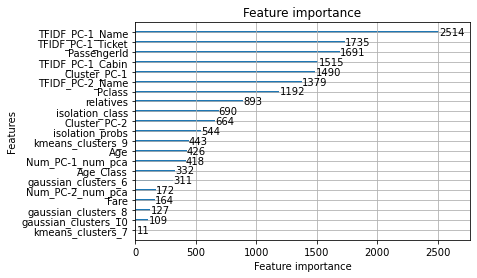

<Figure size 1152x864 with 0 Axes>

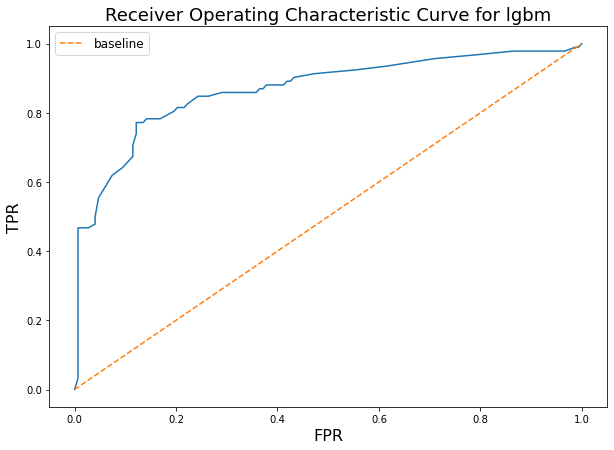

The ROC_AUC score is 0.8665540540540541


The Matthew correlation is 0.6543847305292394
-------------------
The accuracy is 0.8375
The recall is 0.8375
The macro F1 score is 0.8270478020658178
The micro F1 score is 0.8375
The weighted F1 score is 0.8369685323084314
              precision    recall  f1-score   support

         0.0       0.86      0.88      0.87       148
         1.0       0.80      0.77      0.78        92

    accuracy                           0.84       240
   macro avg       0.83      0.83      0.83       240
weighted avg       0.84      0.84      0.84       240



Started Execute test train split at 15:22:59.
Started Started column type detection and casting at 15:22:59.
Started Checking for duplicate columns at 15:22:59.
Started Reset dataframe index. at 15:22:59.
Started Select best features at 15:22:59.
Started Delete columns with high share of NULLs at 15:22:59.
Started Apply datetime transformation at 15:22:59.
Started Start TFIDF to PCA loop at 15:22:59.
Started PCA POS tags at 15:22:59.
Started PCA POS tags at 15:22:59.
Started PCA POS tags at 15:22:59.
Started Handle rare features at 15:22:59.
Started Remove cardinality at 15:22:59.
Started Holistic NULL filling at 15:22:59.
Started Binarize numeric columns + PCA binarized features at 15:22:59.
Started Onehot + PCA categorical features at 15:22:59.
Started Execute categorical encoding at 15:22:59.
Started Fill nulls at 15:22:59.
Started Handle outliers at 15:22:59.
Started Remove collinearity at 15:22:59.
Started Remove skewness at 15:22:59.
Started Execute clustering as a feature at 15:

Score achieved on holdout dataset is: 0.6910356877129504.
End iteration for algorithm lgbm at 1637245381.5873418.
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Start iteration for algorithm tabnet at 1637245381.5882938.
Started Select best features at 15:23:01.
Features before selection are...PassengerId
Features before selection are...Pclass
Features before selection are...Age
Features before selection are...Fare
Features before selection are...Deck
Features before selection are...Title
Features before selection are...relatives
Features before selection are...Age_Class
Features before selection are...Fare_Per_Person
Features before selection are...Embarked
Features before selection are...Sex
Features before selection are...TFIDF PC-1 Ticket
Features before selection are...TFIDF PC-2 Ticket
Features before selection are...TFIDF PC-1 Cabin
Features before selection are...TFIDF PC-2 Cabin
Features before selection 

[I 2021-11-18 15:23:05,378] A new study created in memory with name: autoencoder_based_oversampling


Progress after this step is 50.0%.
Progress after this step is 100.0%.


  0%|          | 0/20 [00:00<?, ?it/s]

====> Epoch: 200 Average training loss: 258441.3148
====> Epoch: 200 Average test loss: 264634.6304
====> Epoch: 400 Average training loss: 258042.9074
====> Epoch: 400 Average test loss: 264239.1739
====> Epoch: 600 Average training loss: 257672.2778
====> Epoch: 600 Average test loss: 263880.6087
====> Epoch: 800 Average training loss: 257316.0000
====> Epoch: 800 Average test loss: 263519.4130
====> Epoch: 1000 Average training loss: 256961.3148
====> Epoch: 1000 Average test loss: 263171.9565
====> Epoch: 1200 Average training loss: 256612.0370
====> Epoch: 1200 Average test loss: 262814.1522
====> Epoch: 1400 Average training loss: 256263.0000
====> Epoch: 1400 Average test loss: 262463.9348
====> Epoch: 1600 Average training loss: 255918.6481
====> Epoch: 1600 Average test loss: 262116.5652
====> Epoch: 1800 Average training loss: 255575.8519
====> Epoch: 1800 Average test loss: 261771.5000
====> Epoch: 2000 Average training loss: 255233.5741
====> Epoch: 2000 Average test loss: 

====> Epoch: 5200 Average training loss: 249889.4259
====> Epoch: 5200 Average test loss: 256024.1739
====> Epoch: 5400 Average training loss: 249558.5185
====> Epoch: 5400 Average test loss: 255686.2174
====> Epoch: 5600 Average training loss: 249228.4630
====> Epoch: 5600 Average test loss: 255350.6522
====> Epoch: 5800 Average training loss: 248900.3704
====> Epoch: 5800 Average test loss: 255017.0870
====> Epoch: 6000 Average training loss: 248568.5000
====> Epoch: 6000 Average test loss: 254689.0000
====> Epoch: 6200 Average training loss: 248240.2037
====> Epoch: 6200 Average test loss: 254350.9565
====> Epoch: 6400 Average training loss: 247910.0926
====> Epoch: 6400 Average test loss: 254019.3913
====> Epoch: 6600 Average training loss: 247581.2593
====> Epoch: 6600 Average test loss: 253686.2174
====> Epoch: 6800 Average training loss: 247252.6852
====> Epoch: 6800 Average test loss: 253353.0000
====> Epoch: 7000 Average training loss: 246924.1296
====> Epoch: 7000 Average tes

====> Epoch: 9000 Average training loss: 243559.8519
====> Epoch: 9000 Average test loss: 249677.7174
====> Epoch: 9200 Average training loss: 243231.8519
====> Epoch: 9200 Average test loss: 249334.1304
====> Epoch: 9400 Average training loss: 242910.2778
====> Epoch: 9400 Average test loss: 249008.2609
====> Epoch: 9600 Average training loss: 242579.4074
====> Epoch: 9600 Average test loss: 248687.5435
====> Epoch: 9800 Average training loss: 242255.0000
====> Epoch: 9800 Average test loss: 248355.4783
====> Epoch: 10000 Average training loss: 241929.1296
====> Epoch: 10000 Average test loss: 248021.9130
====> Epoch: 10200 Average training loss: 241606.2778
====> Epoch: 10200 Average test loss: 247689.1957
====> Epoch: 10400 Average training loss: 241279.9074
====> Epoch: 10400 Average test loss: 247365.5652
====> Epoch: 10600 Average training loss: 240955.9630
====> Epoch: 10600 Average test loss: 247043.2391
====> Epoch: 10800 Average training loss: 240631.7407
====> Epoch: 10800 A

[I 2021-11-18 15:27:26,639] Trial 15 pruned. 
[I 2021-11-18 15:27:26,746] Trial 16 pruned. 
[I 2021-11-18 15:27:26,867] Trial 17 pruned. 
[I 2021-11-18 15:27:26,993] Trial 18 pruned. 
[I 2021-11-18 15:27:27,119] Trial 19 pruned. 


====> Epoch: 200 Average training loss: 258758.4259
====> Epoch: 200 Average test loss: 265014.2609
====> Epoch: 400 Average training loss: 258153.3148
====> Epoch: 400 Average test loss: 264350.6087
====> Epoch: 600 Average training loss: 257704.0370
====> Epoch: 600 Average test loss: 263884.9783
====> Epoch: 800 Average training loss: 257305.0741
====> Epoch: 800 Average test loss: 263494.8913
====> Epoch: 1000 Average training loss: 256927.3333
====> Epoch: 1000 Average test loss: 263113.0652
====> Epoch: 1200 Average training loss: 256547.2407
====> Epoch: 1200 Average test loss: 262726.0217
====> Epoch: 1400 Average training loss: 256187.5741
====> Epoch: 1400 Average test loss: 262375.1739
====> Epoch: 1600 Average training loss: 255834.7037
====> Epoch: 1600 Average test loss: 262030.8913
====> Epoch: 1800 Average training loss: 255485.9074
====> Epoch: 1800 Average test loss: 261673.5435
====> Epoch: 2000 Average training loss: 255146.1296
====> Epoch: 2000 Average test loss: 

====> Epoch: 16200 Average training loss: 231955.1296
====> Epoch: 16200 Average test loss: 237881.6522
====> Epoch: 16400 Average training loss: 231637.6481
====> Epoch: 16400 Average test loss: 237565.4565
====> Epoch: 16600 Average training loss: 231321.2222
====> Epoch: 16600 Average test loss: 237244.5652


[I 2021-11-18 15:28:53,530] A new study created in memory with name: tabnet tuning


Started Sort columns alphabetically at 15:28:53.
Started Train Tabnet classification model at 15:28:53.


  0%|          | 0/3 [00:00<?, ?it/s]

Device used : cuda
epoch 0  | loss: 22.14556| val_0_unsup_loss: 246.82921|  0:00:00s
epoch 1  | loss: 4.66805 | val_0_unsup_loss: 32.50089|  0:00:00s
epoch 2  | loss: 2.15648 | val_0_unsup_loss: 7.02543 |  0:00:00s
epoch 3  | loss: 1.47645 | val_0_unsup_loss: 2.54395 |  0:00:00s
epoch 4  | loss: 1.30998 | val_0_unsup_loss: 1.61206 |  0:00:00s
epoch 5  | loss: 1.17325 | val_0_unsup_loss: 1.474   |  0:00:01s
epoch 6  | loss: 1.13078 | val_0_unsup_loss: 1.52041 |  0:00:01s
epoch 7  | loss: 1.12685 | val_0_unsup_loss: 1.24676 |  0:00:01s
epoch 8  | loss: 1.12006 | val_0_unsup_loss: 1.26562 |  0:00:01s
epoch 9  | loss: 1.11069 | val_0_unsup_loss: 1.15906 |  0:00:01s
epoch 10 | loss: 1.10029 | val_0_unsup_loss: 1.14689 |  0:00:01s
epoch 11 | loss: 1.08897 | val_0_unsup_loss: 1.27614 |  0:00:02s
epoch 12 | loss: 1.08472 | val_0_unsup_loss: 1.17251 |  0:00:02s
epoch 13 | loss: 1.07789 | val_0_unsup_loss: 1.14375 |  0:00:02s
epoch 14 | loss: 1.088   | val_0_unsup_loss: 1.17726 |  0:00:02s
epoch

epoch 126| loss: 1.03633 | val_0_unsup_loss: 0.94248 |  0:00:21s
epoch 127| loss: 1.02822 | val_0_unsup_loss: 0.96339 |  0:00:21s
epoch 128| loss: 1.02842 | val_0_unsup_loss: 0.98491 |  0:00:21s

Early stopping occurred at epoch 128 with best_epoch = 98 and best_val_0_unsup_loss = 0.88691
Best weights from best epoch are automatically used!
Device used : cuda
Loading weights from unsupervised pretraining
epoch 0  | loss: 0.65448 | val_0_matthews: 0.48314 |  0:00:00s
epoch 1  | loss: 0.53687 | val_0_matthews: 0.34504 |  0:00:00s
epoch 2  | loss: 0.48174 | val_0_matthews: 0.4763  |  0:00:00s
epoch 3  | loss: 0.46804 | val_0_matthews: 0.48623 |  0:00:00s
epoch 4  | loss: 0.45462 | val_0_matthews: 0.4521  |  0:00:00s
epoch 5  | loss: 0.42438 | val_0_matthews: 0.53351 |  0:00:00s
epoch 6  | loss: 0.40324 | val_0_matthews: 0.48623 |  0:00:01s
epoch 7  | loss: 0.40855 | val_0_matthews: 0.56869 |  0:00:01s
epoch 8  | loss: 0.38194 | val_0_matthews: 0.68007 |  0:00:01s
epoch 9  | loss: 0.40163 

epoch 52 | loss: 1.07052 | val_0_unsup_loss: 1.00394 |  0:00:08s
epoch 53 | loss: 1.05371 | val_0_unsup_loss: 0.9918  |  0:00:09s
epoch 54 | loss: 1.05767 | val_0_unsup_loss: 0.97953 |  0:00:09s
epoch 55 | loss: 1.03846 | val_0_unsup_loss: 0.97216 |  0:00:09s
epoch 56 | loss: 1.06151 | val_0_unsup_loss: 0.96001 |  0:00:09s
epoch 57 | loss: 1.04734 | val_0_unsup_loss: 0.98294 |  0:00:09s
epoch 58 | loss: 1.04772 | val_0_unsup_loss: 0.99875 |  0:00:09s
epoch 59 | loss: 1.04815 | val_0_unsup_loss: 0.97766 |  0:00:10s
epoch 60 | loss: 1.05356 | val_0_unsup_loss: 1.00524 |  0:00:10s
epoch 61 | loss: 1.05595 | val_0_unsup_loss: 0.99624 |  0:00:10s
epoch 62 | loss: 1.06433 | val_0_unsup_loss: 1.00062 |  0:00:10s
epoch 63 | loss: 1.05176 | val_0_unsup_loss: 0.99095 |  0:00:10s
epoch 64 | loss: 1.0478  | val_0_unsup_loss: 1.01193 |  0:00:10s
epoch 65 | loss: 1.04898 | val_0_unsup_loss: 1.0411  |  0:00:11s
epoch 66 | loss: 1.03028 | val_0_unsup_loss: 1.02538 |  0:00:11s
epoch 67 | loss: 1.03327 

epoch 26 | loss: 1.09274 | val_0_unsup_loss: 1.16219 |  0:00:04s
epoch 27 | loss: 1.0883  | val_0_unsup_loss: 1.18692 |  0:00:04s
epoch 28 | loss: 1.07695 | val_0_unsup_loss: 1.17954 |  0:00:04s
epoch 29 | loss: 1.07276 | val_0_unsup_loss: 1.07777 |  0:00:05s
epoch 30 | loss: 1.07466 | val_0_unsup_loss: 1.22162 |  0:00:05s
epoch 31 | loss: 1.06949 | val_0_unsup_loss: 1.03638 |  0:00:05s
epoch 32 | loss: 1.07336 | val_0_unsup_loss: 1.08529 |  0:00:05s
epoch 33 | loss: 1.07009 | val_0_unsup_loss: 1.05196 |  0:00:05s
epoch 34 | loss: 1.0877  | val_0_unsup_loss: 1.10368 |  0:00:05s
epoch 35 | loss: 1.05229 | val_0_unsup_loss: 1.09361 |  0:00:06s
epoch 36 | loss: 1.05532 | val_0_unsup_loss: 1.23977 |  0:00:06s
epoch 37 | loss: 1.06332 | val_0_unsup_loss: 1.08182 |  0:00:06s
epoch 38 | loss: 1.07608 | val_0_unsup_loss: 1.0502  |  0:00:06s
epoch 39 | loss: 1.04531 | val_0_unsup_loss: 1.15416 |  0:00:06s
epoch 40 | loss: 1.08708 | val_0_unsup_loss: 1.05562 |  0:00:06s
epoch 41 | loss: 1.07332 

epoch 63 | loss: 0.25996 | val_0_matthews: 0.57205 |  0:00:09s
epoch 64 | loss: 0.26852 | val_0_matthews: 0.57205 |  0:00:09s

Early stopping occurred at epoch 64 with best_epoch = 34 and best_val_0_matthews = 0.68151
Best weights from best epoch are automatically used!
15:30:12
[0.5052075475061777, 0.549624024144451, 0.5282950612666327]
Device used : cuda
epoch 0  | loss: 21.29683| val_0_unsup_loss: 16.93809|  0:00:00s
epoch 1  | loss: 4.6829  | val_0_unsup_loss: 10.82781|  0:00:00s
epoch 2  | loss: 2.40038 | val_0_unsup_loss: 15.36376|  0:00:00s
epoch 3  | loss: 1.65784 | val_0_unsup_loss: 2.62444 |  0:00:00s
epoch 4  | loss: 1.34574 | val_0_unsup_loss: 2.40151 |  0:00:00s
epoch 5  | loss: 1.23299 | val_0_unsup_loss: 1.94718 |  0:00:01s
epoch 6  | loss: 1.14552 | val_0_unsup_loss: 1.54861 |  0:00:01s
epoch 7  | loss: 1.13134 | val_0_unsup_loss: 1.47567 |  0:00:01s
epoch 8  | loss: 1.13728 | val_0_unsup_loss: 1.39887 |  0:00:01s
epoch 9  | loss: 1.12327 | val_0_unsup_loss: 1.2165  |  

epoch 17 | loss: 0.39937 | val_0_matthews: 0.72267 |  0:00:02s
epoch 18 | loss: 0.36453 | val_0_matthews: 0.69766 |  0:00:02s
epoch 19 | loss: 0.40007 | val_0_matthews: 0.69766 |  0:00:02s
epoch 20 | loss: 0.3733  | val_0_matthews: 0.72267 |  0:00:03s
epoch 21 | loss: 0.40584 | val_0_matthews: 0.69766 |  0:00:03s
epoch 22 | loss: 0.37376 | val_0_matthews: 0.78119 |  0:00:03s
epoch 23 | loss: 0.3777  | val_0_matthews: 0.72267 |  0:00:03s
epoch 24 | loss: 0.35903 | val_0_matthews: 0.72267 |  0:00:03s
epoch 25 | loss: 0.37777 | val_0_matthews: 0.7481  |  0:00:03s
epoch 26 | loss: 0.39377 | val_0_matthews: 0.76955 |  0:00:03s
epoch 27 | loss: 0.36515 | val_0_matthews: 0.72267 |  0:00:04s
epoch 28 | loss: 0.36169 | val_0_matthews: 0.72267 |  0:00:04s
epoch 29 | loss: 0.35976 | val_0_matthews: 0.7481  |  0:00:04s
epoch 30 | loss: 0.37475 | val_0_matthews: 0.71585 |  0:00:04s
epoch 31 | loss: 0.347   | val_0_matthews: 0.7481  |  0:00:04s
epoch 32 | loss: 0.34829 | val_0_matthews: 0.68434 |  0

epoch 23 | loss: 0.31017 | val_0_matthews: 0.56869 |  0:00:03s
epoch 24 | loss: 0.33742 | val_0_matthews: 0.62396 |  0:00:03s
epoch 25 | loss: 0.32035 | val_0_matthews: 0.64997 |  0:00:03s
epoch 26 | loss: 0.32313 | val_0_matthews: 0.65188 |  0:00:03s
epoch 27 | loss: 0.3155  | val_0_matthews: 0.64997 |  0:00:03s
epoch 28 | loss: 0.32415 | val_0_matthews: 0.62119 |  0:00:04s
epoch 29 | loss: 0.30572 | val_0_matthews: 0.59269 |  0:00:04s
epoch 30 | loss: 0.32131 | val_0_matthews: 0.56441 |  0:00:04s
epoch 31 | loss: 0.31124 | val_0_matthews: 0.59625 |  0:00:04s
epoch 32 | loss: 0.30039 | val_0_matthews: 0.53351 |  0:00:04s
epoch 33 | loss: 0.31102 | val_0_matthews: 0.65188 |  0:00:04s
epoch 34 | loss: 0.32765 | val_0_matthews: 0.59269 |  0:00:04s
epoch 35 | loss: 0.28407 | val_0_matthews: 0.59625 |  0:00:05s
epoch 36 | loss: 0.28162 | val_0_matthews: 0.59625 |  0:00:05s
epoch 37 | loss: 0.28173 | val_0_matthews: 0.62396 |  0:00:05s
epoch 38 | loss: 0.28728 | val_0_matthews: 0.50486 |  0

epoch 0  | loss: 16.89528| val_0_unsup_loss: 37.86597|  0:00:00s
epoch 1  | loss: 4.27584 | val_0_unsup_loss: 23.69883|  0:00:00s
epoch 2  | loss: 2.15254 | val_0_unsup_loss: 11.39999|  0:00:00s
epoch 3  | loss: 1.56658 | val_0_unsup_loss: 4.4101  |  0:00:00s
epoch 4  | loss: 1.2936  | val_0_unsup_loss: 2.19778 |  0:00:00s
epoch 5  | loss: 1.21807 | val_0_unsup_loss: 1.91236 |  0:00:01s
epoch 6  | loss: 1.1984  | val_0_unsup_loss: 1.32887 |  0:00:01s
epoch 7  | loss: 1.13878 | val_0_unsup_loss: 1.3369  |  0:00:01s
epoch 8  | loss: 1.13028 | val_0_unsup_loss: 1.21568 |  0:00:01s
epoch 9  | loss: 1.10448 | val_0_unsup_loss: 1.17503 |  0:00:01s
epoch 10 | loss: 1.09958 | val_0_unsup_loss: 1.14325 |  0:00:01s
epoch 11 | loss: 1.10483 | val_0_unsup_loss: 1.24003 |  0:00:02s
epoch 12 | loss: 1.09306 | val_0_unsup_loss: 1.12653 |  0:00:02s
epoch 13 | loss: 1.09848 | val_0_unsup_loss: 1.12002 |  0:00:02s
epoch 14 | loss: 1.10257 | val_0_unsup_loss: 1.11329 |  0:00:02s
epoch 15 | loss: 1.09703 

epoch 20 | loss: 1.09928 | val_0_unsup_loss: 1.09852 |  0:00:03s
epoch 21 | loss: 1.09462 | val_0_unsup_loss: 1.13926 |  0:00:03s
epoch 22 | loss: 1.08227 | val_0_unsup_loss: 1.10362 |  0:00:03s
epoch 23 | loss: 1.07283 | val_0_unsup_loss: 1.12929 |  0:00:04s
epoch 24 | loss: 1.07279 | val_0_unsup_loss: 1.11478 |  0:00:04s
epoch 25 | loss: 1.08581 | val_0_unsup_loss: 1.12254 |  0:00:04s
epoch 26 | loss: 1.08423 | val_0_unsup_loss: 1.03473 |  0:00:04s
epoch 27 | loss: 1.06552 | val_0_unsup_loss: 1.07166 |  0:00:04s
epoch 28 | loss: 1.07132 | val_0_unsup_loss: 1.05477 |  0:00:04s
epoch 29 | loss: 1.07127 | val_0_unsup_loss: 1.12389 |  0:00:05s
epoch 30 | loss: 1.09823 | val_0_unsup_loss: 1.0291  |  0:00:05s
epoch 31 | loss: 1.07489 | val_0_unsup_loss: 1.03658 |  0:00:05s
epoch 32 | loss: 1.05819 | val_0_unsup_loss: 1.043   |  0:00:05s
epoch 33 | loss: 1.06561 | val_0_unsup_loss: 1.03919 |  0:00:05s
epoch 34 | loss: 1.08358 | val_0_unsup_loss: 0.97785 |  0:00:05s
epoch 35 | loss: 1.06149 

epoch 22 | loss: 1.09756 | val_0_unsup_loss: 0.98408 |  0:00:03s
epoch 23 | loss: 1.05545 | val_0_unsup_loss: 0.98098 |  0:00:04s
epoch 24 | loss: 1.06343 | val_0_unsup_loss: 0.97459 |  0:00:04s
epoch 25 | loss: 1.0729  | val_0_unsup_loss: 0.97771 |  0:00:04s
epoch 26 | loss: 1.06626 | val_0_unsup_loss: 1.01813 |  0:00:04s
epoch 27 | loss: 1.085   | val_0_unsup_loss: 0.98159 |  0:00:04s
epoch 28 | loss: 1.08187 | val_0_unsup_loss: 0.97798 |  0:00:04s
epoch 29 | loss: 1.06369 | val_0_unsup_loss: 0.93515 |  0:00:05s
epoch 30 | loss: 1.06009 | val_0_unsup_loss: 0.92469 |  0:00:05s
epoch 31 | loss: 1.06849 | val_0_unsup_loss: 0.93697 |  0:00:05s
epoch 32 | loss: 1.06786 | val_0_unsup_loss: 0.89829 |  0:00:05s
epoch 33 | loss: 1.05901 | val_0_unsup_loss: 0.93584 |  0:00:05s
epoch 34 | loss: 1.07209 | val_0_unsup_loss: 0.96661 |  0:00:05s
epoch 35 | loss: 1.05736 | val_0_unsup_loss: 0.9634  |  0:00:06s
epoch 36 | loss: 1.05609 | val_0_unsup_loss: 0.99176 |  0:00:06s
epoch 37 | loss: 1.04573 

epoch 22 | loss: 1.07743 | val_0_unsup_loss: 1.08035 |  0:00:03s
epoch 23 | loss: 1.07795 | val_0_unsup_loss: 1.06103 |  0:00:03s
epoch 24 | loss: 1.09257 | val_0_unsup_loss: 1.07536 |  0:00:04s
epoch 25 | loss: 1.11197 | val_0_unsup_loss: 1.08231 |  0:00:04s
epoch 26 | loss: 1.09234 | val_0_unsup_loss: 1.05922 |  0:00:04s
epoch 27 | loss: 1.09212 | val_0_unsup_loss: 1.06888 |  0:00:04s
epoch 28 | loss: 1.07061 | val_0_unsup_loss: 1.06443 |  0:00:04s
epoch 29 | loss: 1.08732 | val_0_unsup_loss: 1.08935 |  0:00:04s
epoch 30 | loss: 1.07829 | val_0_unsup_loss: 1.06096 |  0:00:05s
epoch 31 | loss: 1.07909 | val_0_unsup_loss: 1.05289 |  0:00:05s
epoch 32 | loss: 1.09703 | val_0_unsup_loss: 1.06775 |  0:00:05s
epoch 33 | loss: 1.07268 | val_0_unsup_loss: 1.07393 |  0:00:05s
epoch 34 | loss: 1.07454 | val_0_unsup_loss: 1.05074 |  0:00:05s
epoch 35 | loss: 1.05515 | val_0_unsup_loss: 1.05475 |  0:00:05s
epoch 36 | loss: 1.08504 | val_0_unsup_loss: 1.05377 |  0:00:06s
epoch 37 | loss: 1.07353 

epoch 24 | loss: 0.34954 | val_0_matthews: 0.56101 |  0:00:03s
epoch 25 | loss: 0.33483 | val_0_matthews: 0.58926 |  0:00:03s
epoch 26 | loss: 0.33763 | val_0_matthews: 0.70711 |  0:00:03s
epoch 27 | loss: 0.34428 | val_0_matthews: 0.65158 |  0:00:04s
epoch 28 | loss: 0.36935 | val_0_matthews: 0.64818 |  0:00:04s
epoch 29 | loss: 0.31253 | val_0_matthews: 0.67676 |  0:00:04s
epoch 30 | loss: 0.30896 | val_0_matthews: 0.56497 |  0:00:04s
epoch 31 | loss: 0.33563 | val_0_matthews: 0.56497 |  0:00:04s
epoch 32 | loss: 0.3256  | val_0_matthews: 0.61791 |  0:00:04s
epoch 33 | loss: 0.34608 | val_0_matthews: 0.67676 |  0:00:04s
epoch 34 | loss: 0.30401 | val_0_matthews: 0.67676 |  0:00:05s
epoch 35 | loss: 0.31837 | val_0_matthews: 0.53311 |  0:00:05s
epoch 36 | loss: 0.32289 | val_0_matthews: 0.70588 |  0:00:05s
epoch 37 | loss: 0.29485 | val_0_matthews: 0.58926 |  0:00:05s
epoch 38 | loss: 0.32354 | val_0_matthews: 0.56497 |  0:00:05s
epoch 39 | loss: 0.27691 | val_0_matthews: 0.59761 |  0

epoch 82 | loss: 1.00194 | val_0_unsup_loss: 0.96522 |  0:00:21s
epoch 83 | loss: 1.00469 | val_0_unsup_loss: 0.95852 |  0:00:21s
epoch 84 | loss: 0.99628 | val_0_unsup_loss: 1.00497 |  0:00:21s
epoch 85 | loss: 1.01601 | val_0_unsup_loss: 0.92001 |  0:00:22s
epoch 86 | loss: 1.01084 | val_0_unsup_loss: 0.95409 |  0:00:22s
epoch 87 | loss: 1.02819 | val_0_unsup_loss: 0.97258 |  0:00:22s
epoch 88 | loss: 0.98606 | val_0_unsup_loss: 0.87569 |  0:00:22s
epoch 89 | loss: 1.02172 | val_0_unsup_loss: 0.90616 |  0:00:23s
epoch 90 | loss: 1.00794 | val_0_unsup_loss: 0.94775 |  0:00:23s
epoch 91 | loss: 1.02681 | val_0_unsup_loss: 0.88515 |  0:00:23s
epoch 92 | loss: 1.02128 | val_0_unsup_loss: 0.91114 |  0:00:23s
epoch 93 | loss: 1.01841 | val_0_unsup_loss: 0.88433 |  0:00:24s
epoch 94 | loss: 1.02389 | val_0_unsup_loss: 0.90806 |  0:00:24s
epoch 95 | loss: 1.02566 | val_0_unsup_loss: 0.88255 |  0:00:24s
epoch 96 | loss: 1.011   | val_0_unsup_loss: 0.90984 |  0:00:24s
epoch 97 | loss: 1.00543 

epoch 16 | loss: 0.42227 | val_0_matthews: 0.70859 |  0:00:03s
epoch 17 | loss: 0.41839 | val_0_matthews: 0.73895 |  0:00:03s
epoch 18 | loss: 0.40162 | val_0_matthews: 0.70859 |  0:00:04s
epoch 19 | loss: 0.4025  | val_0_matthews: 0.70859 |  0:00:04s
epoch 20 | loss: 0.37875 | val_0_matthews: 0.73751 |  0:00:04s
epoch 21 | loss: 0.47736 | val_0_matthews: 0.65188 |  0:00:04s
epoch 22 | loss: 0.42055 | val_0_matthews: 0.75007 |  0:00:04s
epoch 23 | loss: 0.38091 | val_0_matthews: 0.73895 |  0:00:05s
epoch 24 | loss: 0.38753 | val_0_matthews: 0.68351 |  0:00:05s
epoch 25 | loss: 0.41409 | val_0_matthews: 0.74305 |  0:00:05s
epoch 26 | loss: 0.39888 | val_0_matthews: 0.68007 |  0:00:05s
epoch 27 | loss: 0.43006 | val_0_matthews: 0.70859 |  0:00:06s
epoch 28 | loss: 0.40288 | val_0_matthews: 0.68351 |  0:00:06s
epoch 29 | loss: 0.41697 | val_0_matthews: 0.74305 |  0:00:06s
epoch 30 | loss: 0.37178 | val_0_matthews: 0.68351 |  0:00:06s
epoch 31 | loss: 0.40979 | val_0_matthews: 0.71106 |  0

epoch 88 | loss: 1.01537 | val_0_unsup_loss: 0.88829 |  0:00:23s
epoch 89 | loss: 1.02133 | val_0_unsup_loss: 0.87222 |  0:00:23s
epoch 90 | loss: 1.02188 | val_0_unsup_loss: 0.99632 |  0:00:23s
epoch 91 | loss: 1.01142 | val_0_unsup_loss: 0.88993 |  0:00:24s
epoch 92 | loss: 1.00373 | val_0_unsup_loss: 0.90719 |  0:00:24s
epoch 93 | loss: 1.01417 | val_0_unsup_loss: 0.88731 |  0:00:24s
epoch 94 | loss: 1.0287  | val_0_unsup_loss: 0.89657 |  0:00:24s
epoch 95 | loss: 1.01525 | val_0_unsup_loss: 1.22576 |  0:00:25s
epoch 96 | loss: 1.10496 | val_0_unsup_loss: 0.92911 |  0:00:25s
epoch 97 | loss: 1.01668 | val_0_unsup_loss: 0.8983  |  0:00:25s
epoch 98 | loss: 1.04057 | val_0_unsup_loss: 0.92606 |  0:00:25s
epoch 99 | loss: 1.0191  | val_0_unsup_loss: 0.91396 |  0:00:26s
epoch 100| loss: 1.01726 | val_0_unsup_loss: 0.96418 |  0:00:26s
epoch 101| loss: 1.02617 | val_0_unsup_loss: 1.20869 |  0:00:26s
epoch 102| loss: 1.02153 | val_0_unsup_loss: 0.86842 |  0:00:26s
epoch 103| loss: 1.00104 

epoch 215| loss: 0.95445 | val_0_unsup_loss: 0.87309 |  0:00:56s

Early stopping occurred at epoch 215 with best_epoch = 185 and best_val_0_unsup_loss = 0.77259
Best weights from best epoch are automatically used!
Device used : cuda
Loading weights from unsupervised pretraining
epoch 0  | loss: 0.82777 | val_0_matthews: 0.41723 |  0:00:00s
epoch 1  | loss: 0.5857  | val_0_matthews: 0.41343 |  0:00:00s
epoch 2  | loss: 0.52253 | val_0_matthews: 0.56782 |  0:00:00s
epoch 3  | loss: 0.53808 | val_0_matthews: 0.59949 |  0:00:00s
epoch 4  | loss: 0.4907  | val_0_matthews: 0.53665 |  0:00:01s
epoch 5  | loss: 0.5159  | val_0_matthews: 0.60627 |  0:00:01s
epoch 6  | loss: 0.44238 | val_0_matthews: 0.62066 |  0:00:01s
epoch 7  | loss: 0.45258 | val_0_matthews: 0.60627 |  0:00:01s
epoch 8  | loss: 0.40886 | val_0_matthews: 0.68007 |  0:00:01s
epoch 9  | loss: 0.37077 | val_0_matthews: 0.65291 |  0:00:02s
epoch 10 | loss: 0.47911 | val_0_matthews: 0.65188 |  0:00:02s
epoch 11 | loss: 0.43462 | v

epoch 55 | loss: 1.0372  | val_0_unsup_loss: 1.05242 |  0:00:14s
epoch 56 | loss: 1.07142 | val_0_unsup_loss: 0.99052 |  0:00:14s
epoch 57 | loss: 1.02595 | val_0_unsup_loss: 0.98311 |  0:00:15s
epoch 58 | loss: 1.04701 | val_0_unsup_loss: 1.02809 |  0:00:15s
epoch 59 | loss: 1.00793 | val_0_unsup_loss: 1.0214  |  0:00:15s
epoch 60 | loss: 1.03504 | val_0_unsup_loss: 1.00438 |  0:00:15s
epoch 61 | loss: 1.01737 | val_0_unsup_loss: 0.95232 |  0:00:16s
epoch 62 | loss: 1.04017 | val_0_unsup_loss: 0.96605 |  0:00:16s
epoch 63 | loss: 1.0153  | val_0_unsup_loss: 0.96852 |  0:00:16s
epoch 64 | loss: 1.18376 | val_0_unsup_loss: 0.99302 |  0:00:16s
epoch 65 | loss: 1.02413 | val_0_unsup_loss: 0.97309 |  0:00:17s
epoch 66 | loss: 1.01883 | val_0_unsup_loss: 0.95728 |  0:00:17s
epoch 67 | loss: 1.03843 | val_0_unsup_loss: 0.93357 |  0:00:17s
epoch 68 | loss: 1.01317 | val_0_unsup_loss: 0.93545 |  0:00:18s
epoch 69 | loss: 1.03835 | val_0_unsup_loss: 0.98477 |  0:00:18s
epoch 70 | loss: 1.02356 

epoch 182| loss: 1.06476 | val_0_unsup_loss: 0.81232 |  0:00:47s
epoch 183| loss: 0.9817  | val_0_unsup_loss: 0.80979 |  0:00:48s
epoch 184| loss: 0.97416 | val_0_unsup_loss: 0.79855 |  0:00:48s
epoch 185| loss: 0.96771 | val_0_unsup_loss: 0.8255  |  0:00:48s
epoch 186| loss: 0.96278 | val_0_unsup_loss: 0.807   |  0:00:49s
epoch 187| loss: 0.96621 | val_0_unsup_loss: 0.82081 |  0:00:49s
epoch 188| loss: 0.96814 | val_0_unsup_loss: 0.77767 |  0:00:49s
epoch 189| loss: 0.98005 | val_0_unsup_loss: 0.79684 |  0:00:49s
epoch 190| loss: 0.97103 | val_0_unsup_loss: 0.77777 |  0:00:50s
epoch 191| loss: 0.97759 | val_0_unsup_loss: 0.77549 |  0:00:50s
epoch 192| loss: 0.96696 | val_0_unsup_loss: 0.87267 |  0:00:50s
epoch 193| loss: 0.97882 | val_0_unsup_loss: 0.82674 |  0:00:50s
epoch 194| loss: 0.96558 | val_0_unsup_loss: 0.801   |  0:00:51s
epoch 195| loss: 0.98589 | val_0_unsup_loss: 0.85    |  0:00:51s
epoch 196| loss: 0.9951  | val_0_unsup_loss: 0.82463 |  0:00:51s
epoch 197| loss: 0.97461 

epoch 34 | loss: 1.05196 | val_0_unsup_loss: 1.02341 |  0:00:09s
epoch 35 | loss: 1.05615 | val_0_unsup_loss: 1.00953 |  0:00:09s
epoch 36 | loss: 1.06508 | val_0_unsup_loss: 0.98362 |  0:00:09s
epoch 37 | loss: 1.06369 | val_0_unsup_loss: 1.00938 |  0:00:10s
epoch 38 | loss: 1.03565 | val_0_unsup_loss: 0.96344 |  0:00:10s
epoch 39 | loss: 1.082   | val_0_unsup_loss: 1.00542 |  0:00:10s
epoch 40 | loss: 1.03408 | val_0_unsup_loss: 0.98663 |  0:00:10s
epoch 41 | loss: 1.07755 | val_0_unsup_loss: 0.99642 |  0:00:11s
epoch 42 | loss: 1.05233 | val_0_unsup_loss: 0.98921 |  0:00:11s
epoch 43 | loss: 1.0536  | val_0_unsup_loss: 0.96627 |  0:00:11s
epoch 44 | loss: 1.04415 | val_0_unsup_loss: 1.02648 |  0:00:11s
epoch 45 | loss: 1.03633 | val_0_unsup_loss: 1.03951 |  0:00:12s
epoch 46 | loss: 1.03655 | val_0_unsup_loss: 1.00103 |  0:00:12s
epoch 47 | loss: 1.06612 | val_0_unsup_loss: 0.98139 |  0:00:12s
epoch 48 | loss: 1.04554 | val_0_unsup_loss: 0.96945 |  0:00:12s
epoch 49 | loss: 1.12306 

epoch 32 | loss: 0.40755 | val_0_matthews: 0.76839 |  0:00:07s
epoch 33 | loss: 0.43801 | val_0_matthews: 0.80051 |  0:00:07s
epoch 34 | loss: 0.37799 | val_0_matthews: 0.80051 |  0:00:07s
epoch 35 | loss: 0.43744 | val_0_matthews: 0.77403 |  0:00:07s
epoch 36 | loss: 0.38317 | val_0_matthews: 0.82576 |  0:00:08s
epoch 37 | loss: 0.41612 | val_0_matthews: 0.76955 |  0:00:08s
epoch 38 | loss: 0.40372 | val_0_matthews: 0.74242 |  0:00:08s
epoch 39 | loss: 0.37041 | val_0_matthews: 0.80051 |  0:00:08s
epoch 40 | loss: 0.37649 | val_0_matthews: 0.79731 |  0:00:08s
epoch 41 | loss: 0.36651 | val_0_matthews: 0.79731 |  0:00:09s
epoch 42 | loss: 0.36496 | val_0_matthews: 0.82759 |  0:00:09s
epoch 43 | loss: 0.43405 | val_0_matthews: 0.82759 |  0:00:09s
epoch 44 | loss: 0.38187 | val_0_matthews: 0.82759 |  0:00:09s
epoch 45 | loss: 0.3646  | val_0_matthews: 0.79731 |  0:00:09s

Early stopping occurred at epoch 45 with best_epoch = 15 and best_val_0_matthews = 0.82759
Best weights from best epo

epoch 9  | loss: 0.40722 | val_0_matthews: 0.62066 |  0:00:02s
epoch 10 | loss: 0.45256 | val_0_matthews: 0.56869 |  0:00:02s
epoch 11 | loss: 0.4033  | val_0_matthews: 0.56782 |  0:00:02s
epoch 12 | loss: 0.41863 | val_0_matthews: 0.5059  |  0:00:02s
epoch 13 | loss: 0.41679 | val_0_matthews: 0.59478 |  0:00:03s
epoch 14 | loss: 0.43187 | val_0_matthews: 0.60223 |  0:00:03s
epoch 15 | loss: 0.45035 | val_0_matthews: 0.59478 |  0:00:03s
epoch 16 | loss: 0.39962 | val_0_matthews: 0.62066 |  0:00:03s
epoch 17 | loss: 0.37405 | val_0_matthews: 0.56408 |  0:00:03s
epoch 18 | loss: 0.43989 | val_0_matthews: 0.64997 |  0:00:04s
epoch 19 | loss: 0.439   | val_0_matthews: 0.73568 |  0:00:04s
epoch 20 | loss: 0.38844 | val_0_matthews: 0.62066 |  0:00:04s
epoch 21 | loss: 0.4169  | val_0_matthews: 0.5059  |  0:00:04s
epoch 22 | loss: 0.39161 | val_0_matthews: 0.60223 |  0:00:05s
epoch 23 | loss: 0.42113 | val_0_matthews: 0.62119 |  0:00:05s
epoch 24 | loss: 0.40387 | val_0_matthews: 0.62396 |  0

epoch 83 | loss: 1.00937 | val_0_unsup_loss: 0.92321 |  0:00:21s
epoch 84 | loss: 1.0311  | val_0_unsup_loss: 0.94242 |  0:00:22s
epoch 85 | loss: 1.02367 | val_0_unsup_loss: 0.96659 |  0:00:22s
epoch 86 | loss: 1.01959 | val_0_unsup_loss: 0.93234 |  0:00:22s
epoch 87 | loss: 0.9884  | val_0_unsup_loss: 0.92775 |  0:00:23s
epoch 88 | loss: 1.01022 | val_0_unsup_loss: 0.94237 |  0:00:23s
epoch 89 | loss: 1.05225 | val_0_unsup_loss: 0.91862 |  0:00:23s
epoch 90 | loss: 0.98624 | val_0_unsup_loss: 0.94193 |  0:00:23s
epoch 91 | loss: 1.03398 | val_0_unsup_loss: 1.00748 |  0:00:24s
epoch 92 | loss: 1.00351 | val_0_unsup_loss: 0.94611 |  0:00:24s
epoch 93 | loss: 1.02217 | val_0_unsup_loss: 0.92359 |  0:00:24s
epoch 94 | loss: 1.00465 | val_0_unsup_loss: 0.96563 |  0:00:24s
epoch 95 | loss: 1.02161 | val_0_unsup_loss: 0.95666 |  0:00:25s
epoch 96 | loss: 1.00177 | val_0_unsup_loss: 0.91699 |  0:00:25s
epoch 97 | loss: 1.01159 | val_0_unsup_loss: 0.94641 |  0:00:25s
epoch 98 | loss: 1.02574 

epoch 28 | loss: 0.3604  | val_0_matthews: 0.73085 |  0:00:06s
epoch 29 | loss: 0.42144 | val_0_matthews: 0.75547 |  0:00:06s
epoch 30 | loss: 0.40717 | val_0_matthews: 0.74748 |  0:00:06s
epoch 31 | loss: 0.36537 | val_0_matthews: 0.77366 |  0:00:06s
epoch 32 | loss: 0.38856 | val_0_matthews: 0.80596 |  0:00:07s
epoch 33 | loss: 0.37689 | val_0_matthews: 0.80596 |  0:00:07s
epoch 34 | loss: 0.35097 | val_0_matthews: 0.83194 |  0:00:07s
epoch 35 | loss: 0.39166 | val_0_matthews: 0.78049 |  0:00:07s
epoch 36 | loss: 0.35653 | val_0_matthews: 0.78049 |  0:00:08s
epoch 37 | loss: 0.38038 | val_0_matthews: 0.74748 |  0:00:08s
epoch 38 | loss: 0.31824 | val_0_matthews: 0.74748 |  0:00:08s
epoch 39 | loss: 0.37264 | val_0_matthews: 0.74748 |  0:00:08s
epoch 40 | loss: 0.3517  | val_0_matthews: 0.74221 |  0:00:08s
epoch 41 | loss: 0.32868 | val_0_matthews: 0.74748 |  0:00:09s
epoch 42 | loss: 0.35251 | val_0_matthews: 0.74748 |  0:00:09s
epoch 43 | loss: 0.39084 | val_0_matthews: 0.72176 |  0

epoch 106| loss: 0.99723 | val_0_unsup_loss: 0.87991 |  0:00:28s
epoch 107| loss: 1.04206 | val_0_unsup_loss: 0.9864  |  0:00:28s
epoch 108| loss: 0.99977 | val_0_unsup_loss: 0.86813 |  0:00:28s
epoch 109| loss: 1.00256 | val_0_unsup_loss: 0.87999 |  0:00:28s
epoch 110| loss: 1.00277 | val_0_unsup_loss: 0.91562 |  0:00:29s
epoch 111| loss: 0.99715 | val_0_unsup_loss: 0.88378 |  0:00:29s
epoch 112| loss: 0.99927 | val_0_unsup_loss: 0.90499 |  0:00:29s
epoch 113| loss: 0.98342 | val_0_unsup_loss: 0.84717 |  0:00:29s
epoch 114| loss: 0.99872 | val_0_unsup_loss: 0.87426 |  0:00:30s
epoch 115| loss: 0.99629 | val_0_unsup_loss: 0.84816 |  0:00:30s
epoch 116| loss: 0.97481 | val_0_unsup_loss: 0.86709 |  0:00:30s
epoch 117| loss: 0.98716 | val_0_unsup_loss: 0.85629 |  0:00:31s
epoch 118| loss: 0.98693 | val_0_unsup_loss: 0.83786 |  0:00:31s
epoch 119| loss: 0.99642 | val_0_unsup_loss: 0.88376 |  0:00:31s
epoch 120| loss: 0.98288 | val_0_unsup_loss: 0.87    |  0:00:31s
epoch 121| loss: 0.9854  

epoch 40 | loss: 1.03527 | val_0_unsup_loss: 0.97092 |  0:00:10s
epoch 41 | loss: 1.03693 | val_0_unsup_loss: 0.899   |  0:00:11s
epoch 42 | loss: 1.05449 | val_0_unsup_loss: 0.93012 |  0:00:11s
epoch 43 | loss: 1.05168 | val_0_unsup_loss: 0.94709 |  0:00:11s
epoch 44 | loss: 1.04603 | val_0_unsup_loss: 0.8698  |  0:00:11s
epoch 45 | loss: 1.04133 | val_0_unsup_loss: 0.89344 |  0:00:12s
epoch 46 | loss: 1.02481 | val_0_unsup_loss: 0.86922 |  0:00:12s
epoch 47 | loss: 1.01798 | val_0_unsup_loss: 0.83802 |  0:00:12s
epoch 48 | loss: 1.0332  | val_0_unsup_loss: 0.91659 |  0:00:12s
epoch 49 | loss: 1.04931 | val_0_unsup_loss: 0.88207 |  0:00:13s
epoch 50 | loss: 1.03679 | val_0_unsup_loss: 0.85053 |  0:00:13s
epoch 51 | loss: 1.04318 | val_0_unsup_loss: 0.80743 |  0:00:13s
epoch 52 | loss: 1.01547 | val_0_unsup_loss: 0.79297 |  0:00:13s
epoch 53 | loss: 1.01202 | val_0_unsup_loss: 0.91521 |  0:00:14s
epoch 54 | loss: 1.04463 | val_0_unsup_loss: 0.8771  |  0:00:14s
epoch 55 | loss: 1.02262 

epoch 1  | loss: 2.01467 | val_0_unsup_loss: 3.01569 |  0:00:00s
epoch 2  | loss: 1.30695 | val_0_unsup_loss: 1.29866 |  0:00:00s
epoch 3  | loss: 1.17042 | val_0_unsup_loss: 1.09284 |  0:00:01s
epoch 4  | loss: 1.0964  | val_0_unsup_loss: 1.08382 |  0:00:01s
epoch 5  | loss: 1.10481 | val_0_unsup_loss: 1.07906 |  0:00:01s
epoch 6  | loss: 1.15328 | val_0_unsup_loss: 1.07799 |  0:00:01s
epoch 7  | loss: 1.10916 | val_0_unsup_loss: 1.07947 |  0:00:02s
epoch 8  | loss: 1.07378 | val_0_unsup_loss: 1.08129 |  0:00:02s
epoch 9  | loss: 1.10787 | val_0_unsup_loss: 1.06298 |  0:00:02s
epoch 10 | loss: 1.09554 | val_0_unsup_loss: 1.06048 |  0:00:02s
epoch 11 | loss: 1.08771 | val_0_unsup_loss: 1.07166 |  0:00:03s
epoch 12 | loss: 1.08675 | val_0_unsup_loss: 1.06515 |  0:00:03s
epoch 13 | loss: 1.07178 | val_0_unsup_loss: 1.06434 |  0:00:03s
epoch 14 | loss: 1.05616 | val_0_unsup_loss: 1.05372 |  0:00:03s
epoch 15 | loss: 1.10141 | val_0_unsup_loss: 1.04566 |  0:00:04s
epoch 16 | loss: 1.09136 

epoch 45 | loss: 0.34068 | val_0_matthews: 0.79339 |  0:00:09s
epoch 46 | loss: 0.33757 | val_0_matthews: 0.79723 |  0:00:10s
epoch 47 | loss: 0.33986 | val_0_matthews: 0.76543 |  0:00:10s
epoch 48 | loss: 0.34759 | val_0_matthews: 0.79723 |  0:00:10s
epoch 49 | loss: 0.30745 | val_0_matthews: 0.79339 |  0:00:10s
epoch 50 | loss: 0.3843  | val_0_matthews: 0.76543 |  0:00:11s
epoch 51 | loss: 0.32444 | val_0_matthews: 0.79339 |  0:00:11s
epoch 52 | loss: 0.30364 | val_0_matthews: 0.82214 |  0:00:11s
epoch 53 | loss: 0.33953 | val_0_matthews: 0.79406 |  0:00:11s
epoch 54 | loss: 0.33936 | val_0_matthews: 0.79339 |  0:00:11s
epoch 55 | loss: 0.31446 | val_0_matthews: 0.79339 |  0:00:12s
epoch 56 | loss: 0.3227  | val_0_matthews: 0.71156 |  0:00:12s
epoch 57 | loss: 0.31362 | val_0_matthews: 0.76286 |  0:00:12s
epoch 58 | loss: 0.33084 | val_0_matthews: 0.76543 |  0:00:12s
epoch 59 | loss: 0.30543 | val_0_matthews: 0.76543 |  0:00:12s
epoch 60 | loss: 0.34888 | val_0_matthews: 0.76543 |  0

epoch 105| loss: 0.99135 | val_0_unsup_loss: 0.79598 |  0:00:27s
epoch 106| loss: 0.99622 | val_0_unsup_loss: 0.84246 |  0:00:28s
epoch 107| loss: 1.0078  | val_0_unsup_loss: 0.84557 |  0:00:28s
epoch 108| loss: 1.00947 | val_0_unsup_loss: 0.92727 |  0:00:28s
epoch 109| loss: 1.05467 | val_0_unsup_loss: 0.96381 |  0:00:28s
epoch 110| loss: 1.01358 | val_0_unsup_loss: 0.81391 |  0:00:29s
epoch 111| loss: 1.00294 | val_0_unsup_loss: 0.84119 |  0:00:29s
epoch 112| loss: 1.01585 | val_0_unsup_loss: 0.82262 |  0:00:29s
epoch 113| loss: 0.97499 | val_0_unsup_loss: 0.81832 |  0:00:29s
epoch 114| loss: 0.97717 | val_0_unsup_loss: 0.80779 |  0:00:30s
epoch 115| loss: 1.00181 | val_0_unsup_loss: 0.87272 |  0:00:30s
epoch 116| loss: 0.99359 | val_0_unsup_loss: 0.81732 |  0:00:30s
epoch 117| loss: 0.9892  | val_0_unsup_loss: 0.84015 |  0:00:30s
epoch 118| loss: 1.00118 | val_0_unsup_loss: 0.8361  |  0:00:31s
epoch 119| loss: 0.99059 | val_0_unsup_loss: 0.78712 |  0:00:31s
epoch 120| loss: 1.00231 

epoch 43 | loss: 1.03013 | val_0_unsup_loss: 1.11584 |  0:00:06s
epoch 44 | loss: 1.02367 | val_0_unsup_loss: 1.04196 |  0:00:06s
epoch 45 | loss: 1.01934 | val_0_unsup_loss: 1.33616 |  0:00:06s
epoch 46 | loss: 1.01396 | val_0_unsup_loss: 1.03686 |  0:00:06s
epoch 47 | loss: 1.02132 | val_0_unsup_loss: 1.03271 |  0:00:06s
epoch 48 | loss: 1.00493 | val_0_unsup_loss: 1.06612 |  0:00:06s
epoch 49 | loss: 1.03211 | val_0_unsup_loss: 1.04766 |  0:00:06s
epoch 50 | loss: 0.99877 | val_0_unsup_loss: 1.00653 |  0:00:06s
epoch 51 | loss: 1.02244 | val_0_unsup_loss: 0.97314 |  0:00:07s
epoch 52 | loss: 1.00007 | val_0_unsup_loss: 1.11372 |  0:00:07s
epoch 53 | loss: 0.98988 | val_0_unsup_loss: 0.94901 |  0:00:07s
epoch 54 | loss: 1.00557 | val_0_unsup_loss: 0.93016 |  0:00:07s
epoch 55 | loss: 0.983   | val_0_unsup_loss: 0.96796 |  0:00:07s
epoch 56 | loss: 1.00704 | val_0_unsup_loss: 1.03784 |  0:00:07s
epoch 57 | loss: 1.00918 | val_0_unsup_loss: 1.00071 |  0:00:07s
epoch 58 | loss: 0.99228 

epoch 15 | loss: 1.08693 | val_0_unsup_loss: 1.02532 |  0:00:02s
epoch 16 | loss: 1.05762 | val_0_unsup_loss: 0.98332 |  0:00:02s
epoch 17 | loss: 1.03434 | val_0_unsup_loss: 0.97548 |  0:00:02s
epoch 18 | loss: 1.04282 | val_0_unsup_loss: 0.96228 |  0:00:02s
epoch 19 | loss: 1.05342 | val_0_unsup_loss: 0.96118 |  0:00:02s
epoch 20 | loss: 1.07016 | val_0_unsup_loss: 1.00355 |  0:00:02s
epoch 21 | loss: 1.04795 | val_0_unsup_loss: 0.97918 |  0:00:03s
epoch 22 | loss: 1.03319 | val_0_unsup_loss: 0.94793 |  0:00:03s
epoch 23 | loss: 1.04124 | val_0_unsup_loss: 0.98081 |  0:00:03s
epoch 24 | loss: 1.04093 | val_0_unsup_loss: 0.96109 |  0:00:03s
epoch 25 | loss: 1.03541 | val_0_unsup_loss: 0.93869 |  0:00:03s
epoch 26 | loss: 1.04636 | val_0_unsup_loss: 0.9741  |  0:00:03s
epoch 27 | loss: 1.03354 | val_0_unsup_loss: 0.91543 |  0:00:03s
epoch 28 | loss: 1.02269 | val_0_unsup_loss: 0.90645 |  0:00:03s
epoch 29 | loss: 1.04411 | val_0_unsup_loss: 0.93723 |  0:00:04s
epoch 30 | loss: 1.04462 

epoch 58 | loss: 0.31431 | val_0_matthews: 0.59134 |  0:00:07s
epoch 59 | loss: 0.34014 | val_0_matthews: 0.59478 |  0:00:07s
epoch 60 | loss: 0.29434 | val_0_matthews: 0.65034 |  0:00:07s

Early stopping occurred at epoch 60 with best_epoch = 30 and best_val_0_matthews = 0.73895
Best weights from best epoch are automatically used!
15:41:31
[0.5336630473542884, 0.5239003675103497]
Device used : cuda
epoch 0  | loss: 13.26995| val_0_unsup_loss: 29.10991|  0:00:00s
epoch 1  | loss: 3.13512 | val_0_unsup_loss: 11.45922|  0:00:00s
epoch 2  | loss: 1.61414 | val_0_unsup_loss: 2.98027 |  0:00:00s
epoch 3  | loss: 1.28942 | val_0_unsup_loss: 1.53335 |  0:00:00s
epoch 4  | loss: 1.20098 | val_0_unsup_loss: 1.29555 |  0:00:00s
epoch 5  | loss: 1.22754 | val_0_unsup_loss: 1.31924 |  0:00:00s
epoch 6  | loss: 1.16158 | val_0_unsup_loss: 1.60093 |  0:00:00s
epoch 7  | loss: 1.15282 | val_0_unsup_loss: 1.23508 |  0:00:01s
epoch 8  | loss: 1.11888 | val_0_unsup_loss: 1.32082 |  0:00:01s
epoch 9  | l

epoch 41 | loss: 0.33047 | val_0_matthews: 0.63053 |  0:00:05s
epoch 42 | loss: 0.32811 | val_0_matthews: 0.6521  |  0:00:05s
epoch 43 | loss: 0.33164 | val_0_matthews: 0.58694 |  0:00:05s
epoch 44 | loss: 0.35036 | val_0_matthews: 0.68151 |  0:00:05s
epoch 45 | loss: 0.33201 | val_0_matthews: 0.62353 |  0:00:05s
epoch 46 | loss: 0.31829 | val_0_matthews: 0.6521  |  0:00:05s
epoch 47 | loss: 0.35346 | val_0_matthews: 0.68408 |  0:00:05s
epoch 48 | loss: 0.31647 | val_0_matthews: 0.68408 |  0:00:05s
epoch 49 | loss: 0.34224 | val_0_matthews: 0.6571  |  0:00:06s
epoch 50 | loss: 0.32821 | val_0_matthews: 0.68901 |  0:00:06s
epoch 51 | loss: 0.34936 | val_0_matthews: 0.68408 |  0:00:06s
epoch 52 | loss: 0.31924 | val_0_matthews: 0.54055 |  0:00:06s
epoch 53 | loss: 0.34164 | val_0_matthews: 0.50756 |  0:00:06s
epoch 54 | loss: 0.30599 | val_0_matthews: 0.56782 |  0:00:06s
epoch 55 | loss: 0.33649 | val_0_matthews: 0.65349 |  0:00:06s
epoch 56 | loss: 0.27049 | val_0_matthews: 0.63053 |  0

epoch 105| loss: 0.96349 | val_0_unsup_loss: 0.87481 |  0:00:14s
epoch 106| loss: 0.95783 | val_0_unsup_loss: 0.912   |  0:00:14s
epoch 107| loss: 0.96243 | val_0_unsup_loss: 0.88615 |  0:00:14s
epoch 108| loss: 0.94671 | val_0_unsup_loss: 0.90052 |  0:00:14s
epoch 109| loss: 0.9758  | val_0_unsup_loss: 0.91543 |  0:00:15s
epoch 110| loss: 0.97414 | val_0_unsup_loss: 0.92234 |  0:00:15s
epoch 111| loss: 0.96394 | val_0_unsup_loss: 0.92981 |  0:00:15s
epoch 112| loss: 0.93303 | val_0_unsup_loss: 0.91389 |  0:00:15s
epoch 113| loss: 0.95395 | val_0_unsup_loss: 0.91939 |  0:00:15s
epoch 114| loss: 0.95332 | val_0_unsup_loss: 0.8936  |  0:00:15s
epoch 115| loss: 0.94281 | val_0_unsup_loss: 0.87282 |  0:00:15s
epoch 116| loss: 0.99386 | val_0_unsup_loss: 0.92738 |  0:00:15s
epoch 117| loss: 0.98615 | val_0_unsup_loss: 0.92648 |  0:00:16s
epoch 118| loss: 0.96185 | val_0_unsup_loss: 0.92468 |  0:00:16s
epoch 119| loss: 0.94638 | val_0_unsup_loss: 0.89655 |  0:00:16s
epoch 120| loss: 0.93788 

epoch 52 | loss: 0.31453 | val_0_matthews: 0.73862 |  0:00:06s
epoch 53 | loss: 0.32653 | val_0_matthews: 0.7096  |  0:00:06s
epoch 54 | loss: 0.35044 | val_0_matthews: 0.73928 |  0:00:06s
epoch 55 | loss: 0.37134 | val_0_matthews: 0.65174 |  0:00:06s
epoch 56 | loss: 0.31885 | val_0_matthews: 0.74242 |  0:00:06s
epoch 57 | loss: 0.31836 | val_0_matthews: 0.76955 |  0:00:07s
epoch 58 | loss: 0.33199 | val_0_matthews: 0.77403 |  0:00:07s
epoch 59 | loss: 0.29118 | val_0_matthews: 0.73862 |  0:00:07s
epoch 60 | loss: 0.33583 | val_0_matthews: 0.76955 |  0:00:07s
epoch 61 | loss: 0.32761 | val_0_matthews: 0.76955 |  0:00:07s
epoch 62 | loss: 0.31142 | val_0_matthews: 0.73862 |  0:00:07s
epoch 63 | loss: 0.3216  | val_0_matthews: 0.77403 |  0:00:07s
epoch 64 | loss: 0.31571 | val_0_matthews: 0.79731 |  0:00:07s
epoch 65 | loss: 0.34063 | val_0_matthews: 0.73862 |  0:00:07s

Early stopping occurred at epoch 65 with best_epoch = 35 and best_val_0_matthews = 0.80051
Best weights from best epo

epoch 29 | loss: 0.34058 | val_0_matthews: 0.71106 |  0:00:03s
epoch 30 | loss: 0.35583 | val_0_matthews: 0.62119 |  0:00:03s
epoch 31 | loss: 0.36396 | val_0_matthews: 0.65188 |  0:00:03s
epoch 32 | loss: 0.34617 | val_0_matthews: 0.65188 |  0:00:03s
epoch 33 | loss: 0.33903 | val_0_matthews: 0.59269 |  0:00:04s
epoch 34 | loss: 0.34537 | val_0_matthews: 0.56232 |  0:00:04s
epoch 35 | loss: 0.38414 | val_0_matthews: 0.68351 |  0:00:04s
epoch 36 | loss: 0.36057 | val_0_matthews: 0.62119 |  0:00:04s
epoch 37 | loss: 0.30179 | val_0_matthews: 0.53665 |  0:00:04s
epoch 38 | loss: 0.3561  | val_0_matthews: 0.65188 |  0:00:04s
epoch 39 | loss: 0.36819 | val_0_matthews: 0.65188 |  0:00:04s
epoch 40 | loss: 0.36424 | val_0_matthews: 0.65188 |  0:00:04s
epoch 41 | loss: 0.36023 | val_0_matthews: 0.65188 |  0:00:05s

Early stopping occurred at epoch 41 with best_epoch = 11 and best_val_0_matthews = 0.71106
Best weights from best epoch are automatically used!
15:42:37
[0.5336630473542884, 0.5239

epoch 110| loss: 0.96782 | val_0_unsup_loss: 0.83664 |  0:00:15s
epoch 111| loss: 0.98015 | val_0_unsup_loss: 0.87611 |  0:00:15s
epoch 112| loss: 0.94958 | val_0_unsup_loss: 0.87667 |  0:00:15s
epoch 113| loss: 0.97536 | val_0_unsup_loss: 0.89773 |  0:00:15s
epoch 114| loss: 0.97485 | val_0_unsup_loss: 0.92151 |  0:00:15s
epoch 115| loss: 0.97138 | val_0_unsup_loss: 0.81578 |  0:00:15s
epoch 116| loss: 0.96521 | val_0_unsup_loss: 0.87526 |  0:00:15s
epoch 117| loss: 0.97089 | val_0_unsup_loss: 0.9667  |  0:00:16s
epoch 118| loss: 0.9721  | val_0_unsup_loss: 0.98388 |  0:00:16s
epoch 119| loss: 0.9677  | val_0_unsup_loss: 1.01347 |  0:00:16s
epoch 120| loss: 0.96458 | val_0_unsup_loss: 1.00742 |  0:00:16s
epoch 121| loss: 0.97793 | val_0_unsup_loss: 0.85501 |  0:00:16s
epoch 122| loss: 0.95656 | val_0_unsup_loss: 0.90151 |  0:00:16s
epoch 123| loss: 0.95962 | val_0_unsup_loss: 0.91126 |  0:00:16s

Early stopping occurred at epoch 123 with best_epoch = 93 and best_val_0_unsup_loss = 0.8

epoch 62 | loss: 0.96396 | val_0_unsup_loss: 0.91989 |  0:00:08s
epoch 63 | loss: 0.99025 | val_0_unsup_loss: 0.97817 |  0:00:08s
epoch 64 | loss: 0.95883 | val_0_unsup_loss: 0.98761 |  0:00:08s
epoch 65 | loss: 0.96397 | val_0_unsup_loss: 1.11871 |  0:00:08s
epoch 66 | loss: 0.9694  | val_0_unsup_loss: 1.12211 |  0:00:09s
epoch 67 | loss: 0.98    | val_0_unsup_loss: 1.07392 |  0:00:09s
epoch 68 | loss: 0.9881  | val_0_unsup_loss: 1.09993 |  0:00:09s
epoch 69 | loss: 0.9812  | val_0_unsup_loss: 1.04764 |  0:00:09s
epoch 70 | loss: 1.00125 | val_0_unsup_loss: 1.12543 |  0:00:09s
epoch 71 | loss: 0.99902 | val_0_unsup_loss: 1.31345 |  0:00:09s
epoch 72 | loss: 0.96895 | val_0_unsup_loss: 1.13001 |  0:00:09s
epoch 73 | loss: 0.99377 | val_0_unsup_loss: 1.32061 |  0:00:09s
epoch 74 | loss: 0.97669 | val_0_unsup_loss: 1.35874 |  0:00:10s
epoch 75 | loss: 0.95947 | val_0_unsup_loss: 1.2122  |  0:00:10s
epoch 76 | loss: 0.97987 | val_0_unsup_loss: 1.1861  |  0:00:10s
epoch 77 | loss: 0.9644  

epoch 111| loss: 0.31923 | val_0_matthews: 0.59748 |  0:00:13s

Early stopping occurred at epoch 111 with best_epoch = 81 and best_val_0_matthews = 0.79901
Best weights from best epoch are automatically used!
15:43:23
[0.5336630473542884, 0.5239003675103497, 0.5256807335953801, 0.49663402717283817, 0.5211317366305332, 0.5384259314302191, 0.4933571103026172]
Device used : cuda
epoch 0  | loss: 15.05925| val_0_unsup_loss: 32.63472|  0:00:00s
epoch 1  | loss: 3.75231 | val_0_unsup_loss: 5.80719 |  0:00:00s
epoch 2  | loss: 1.89505 | val_0_unsup_loss: 3.18841 |  0:00:00s
epoch 3  | loss: 1.39807 | val_0_unsup_loss: 1.59765 |  0:00:00s
epoch 4  | loss: 1.23895 | val_0_unsup_loss: 1.52997 |  0:00:00s
epoch 5  | loss: 1.12145 | val_0_unsup_loss: 1.39131 |  0:00:00s
epoch 6  | loss: 1.11609 | val_0_unsup_loss: 1.18649 |  0:00:00s
epoch 7  | loss: 1.13786 | val_0_unsup_loss: 1.20368 |  0:00:01s
epoch 8  | loss: 1.14254 | val_0_unsup_loss: 1.2241  |  0:00:01s
epoch 9  | loss: 1.11791 | val_0_uns

epoch 39 | loss: 0.33891 | val_0_matthews: 0.62226 |  0:00:04s
epoch 40 | loss: 0.36238 | val_0_matthews: 0.54784 |  0:00:04s
epoch 41 | loss: 0.34529 | val_0_matthews: 0.65034 |  0:00:05s
epoch 42 | loss: 0.37197 | val_0_matthews: 0.59478 |  0:00:05s
epoch 43 | loss: 0.35821 | val_0_matthews: 0.59625 |  0:00:05s
epoch 44 | loss: 0.32825 | val_0_matthews: 0.71106 |  0:00:05s
epoch 45 | loss: 0.33804 | val_0_matthews: 0.64997 |  0:00:05s
epoch 46 | loss: 0.32114 | val_0_matthews: 0.62066 |  0:00:05s
epoch 47 | loss: 0.33656 | val_0_matthews: 0.59206 |  0:00:05s
epoch 48 | loss: 0.33525 | val_0_matthews: 0.56408 |  0:00:05s
epoch 49 | loss: 0.35337 | val_0_matthews: 0.65291 |  0:00:05s
epoch 50 | loss: 0.34173 | val_0_matthews: 0.56441 |  0:00:06s
epoch 51 | loss: 0.35963 | val_0_matthews: 0.56224 |  0:00:06s
epoch 52 | loss: 0.34194 | val_0_matthews: 0.62595 |  0:00:06s
epoch 53 | loss: 0.32574 | val_0_matthews: 0.65188 |  0:00:06s
epoch 54 | loss: 0.31108 | val_0_matthews: 0.67909 |  0

epoch 104| loss: 0.94365 | val_0_unsup_loss: 1.0465  |  0:00:14s
epoch 105| loss: 0.96446 | val_0_unsup_loss: 1.24087 |  0:00:14s
epoch 106| loss: 0.97098 | val_0_unsup_loss: 1.16659 |  0:00:14s

Early stopping occurred at epoch 106 with best_epoch = 76 and best_val_0_unsup_loss = 0.80651
Best weights from best epoch are automatically used!
Device used : cuda
Loading weights from unsupervised pretraining
epoch 0  | loss: 0.61582 | val_0_matthews: 0.52416 |  0:00:00s
epoch 1  | loss: 0.55493 | val_0_matthews: 0.61391 |  0:00:00s
epoch 2  | loss: 0.49309 | val_0_matthews: 0.76543 |  0:00:00s
epoch 3  | loss: 0.4894  | val_0_matthews: 0.64583 |  0:00:00s
epoch 4  | loss: 0.45304 | val_0_matthews: 0.64429 |  0:00:00s
epoch 5  | loss: 0.46146 | val_0_matthews: 0.71156 |  0:00:00s
epoch 6  | loss: 0.44069 | val_0_matthews: 0.71156 |  0:00:00s
epoch 7  | loss: 0.42545 | val_0_matthews: 0.76543 |  0:00:00s
epoch 8  | loss: 0.41131 | val_0_matthews: 0.70635 |  0:00:01s
epoch 9  | loss: 0.43965 

epoch 61 | loss: 1.00565 | val_0_unsup_loss: 1.00907 |  0:00:08s
epoch 62 | loss: 1.00252 | val_0_unsup_loss: 0.88497 |  0:00:08s
epoch 63 | loss: 1.00111 | val_0_unsup_loss: 0.88576 |  0:00:08s
epoch 64 | loss: 1.00198 | val_0_unsup_loss: 0.87739 |  0:00:08s
epoch 65 | loss: 0.99081 | val_0_unsup_loss: 0.8635  |  0:00:09s
epoch 66 | loss: 0.98671 | val_0_unsup_loss: 0.8485  |  0:00:09s
epoch 67 | loss: 1.01022 | val_0_unsup_loss: 0.83973 |  0:00:09s
epoch 68 | loss: 0.99716 | val_0_unsup_loss: 0.85587 |  0:00:09s
epoch 69 | loss: 0.98718 | val_0_unsup_loss: 0.8609  |  0:00:09s
epoch 70 | loss: 1.13043 | val_0_unsup_loss: 0.86428 |  0:00:09s
epoch 71 | loss: 1.01005 | val_0_unsup_loss: 0.86745 |  0:00:09s
epoch 72 | loss: 0.99739 | val_0_unsup_loss: 0.88061 |  0:00:09s
epoch 73 | loss: 1.01092 | val_0_unsup_loss: 0.96175 |  0:00:10s
epoch 74 | loss: 0.99095 | val_0_unsup_loss: 0.90169 |  0:00:10s
epoch 75 | loss: 0.99828 | val_0_unsup_loss: 0.84695 |  0:00:10s
epoch 76 | loss: 1.00397 

Device used : cuda
epoch 0  | loss: 4.98031 | val_0_unsup_loss: 11.22838|  0:00:00s
epoch 1  | loss: 1.68733 | val_0_unsup_loss: 1.84606 |  0:00:00s
epoch 2  | loss: 1.22653 | val_0_unsup_loss: 1.39214 |  0:00:00s
epoch 3  | loss: 1.14428 | val_0_unsup_loss: 1.4002  |  0:00:01s
epoch 4  | loss: 1.13141 | val_0_unsup_loss: 1.28865 |  0:00:01s
epoch 5  | loss: 1.09827 | val_0_unsup_loss: 1.30523 |  0:00:01s
epoch 6  | loss: 1.10762 | val_0_unsup_loss: 1.2733  |  0:00:02s
epoch 7  | loss: 1.12006 | val_0_unsup_loss: 1.32581 |  0:00:02s
epoch 8  | loss: 1.09122 | val_0_unsup_loss: 1.63424 |  0:00:02s
epoch 9  | loss: 1.11098 | val_0_unsup_loss: 1.5452  |  0:00:03s
epoch 10 | loss: 1.11892 | val_0_unsup_loss: 1.44304 |  0:00:03s
epoch 11 | loss: 1.09775 | val_0_unsup_loss: 1.3698  |  0:00:03s
epoch 12 | loss: 1.09602 | val_0_unsup_loss: 1.35082 |  0:00:04s
epoch 13 | loss: 1.08023 | val_0_unsup_loss: 1.29612 |  0:00:04s
epoch 14 | loss: 1.07781 | val_0_unsup_loss: 1.30153 |  0:00:04s
epoch 

epoch 38 | loss: 0.45642 | val_0_matthews: 0.56906 |  0:00:09s
epoch 39 | loss: 0.44855 | val_0_matthews: 0.56906 |  0:00:10s
epoch 40 | loss: 0.43754 | val_0_matthews: 0.56906 |  0:00:10s
epoch 41 | loss: 0.41819 | val_0_matthews: 0.57879 |  0:00:10s
epoch 42 | loss: 0.39562 | val_0_matthews: 0.57697 |  0:00:10s
epoch 43 | loss: 0.40998 | val_0_matthews: 0.57879 |  0:00:11s
epoch 44 | loss: 0.40046 | val_0_matthews: 0.56906 |  0:00:11s
epoch 45 | loss: 0.45383 | val_0_matthews: 0.56906 |  0:00:11s
epoch 46 | loss: 0.45394 | val_0_matthews: 0.56906 |  0:00:11s
epoch 47 | loss: 0.39936 | val_0_matthews: 0.56906 |  0:00:12s
epoch 48 | loss: 0.39977 | val_0_matthews: 0.56906 |  0:00:12s
epoch 49 | loss: 0.42238 | val_0_matthews: 0.56906 |  0:00:12s
epoch 50 | loss: 0.45317 | val_0_matthews: 0.57531 |  0:00:12s
epoch 51 | loss: 0.41108 | val_0_matthews: 0.56906 |  0:00:13s
epoch 52 | loss: 0.40243 | val_0_matthews: 0.56567 |  0:00:13s
epoch 53 | loss: 0.40929 | val_0_matthews: 0.58495 |  0

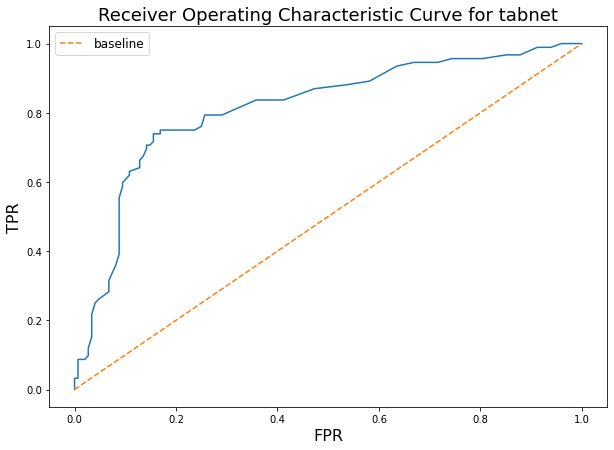

The ROC_AUC score is 0.813087544065805


The Matthew correlation is 0.5849506887921929
-------------------
The accuracy is 0.8041666666666667
The recall is 0.8041666666666667
The macro F1 score is 0.7924601203289727
The micro F1 score is 0.8041666666666667
The weighted F1 score is 0.8039612886607422
              precision    recall  f1-score   support

         0.0       0.84      0.84      0.84       148
         1.0       0.75      0.74      0.74        92

    accuracy                           0.80       240
   macro avg       0.79      0.79      0.79       240
weighted avg       0.80      0.80      0.80       240



Started Execute test train split at 15:45:19.
Started Started column type detection and casting at 15:45:19.
Started Checking for duplicate columns at 15:45:19.
Started Reset dataframe index. at 15:45:19.
Started Select best features at 15:45:19.
Started Delete columns with high share of NULLs at 15:45:19.
Started Apply datetime transformation at 15:45:19.
Started Start TFIDF to PCA loop at 15:45:19.
Started PCA POS tags at 15:45:19.
Started PCA POS tags at 15:45:19.
Started PCA POS tags at 15:45:19.
Started Handle rare features at 15:45:19.
Started Remove cardinality at 15:45:19.
Started Holistic NULL filling at 15:45:19.
Started Binarize numeric columns + PCA binarized features at 15:45:19.
Started Onehot + PCA categorical features at 15:45:19.
Started Execute categorical encoding at 15:45:19.
Started Fill nulls at 15:45:19.
Started Handle outliers at 15:45:19.
Started Remove collinearity at 15:45:19.
Started Remove skewness at 15:45:19.
Started Execute clustering as a feature at 15:

Score achieved on holdout dataset is: 0.6432481923122119.
End iteration for algorithm tabnet at 1637246721.096741.
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Start iteration for algorithm ngboost at 1637246721.0976353.
Started Select best features at 15:45:21.
Features before selection are...PassengerId
Features before selection are...Pclass
Features before selection are...Age
Features before selection are...Fare
Features before selection are...Deck
Features before selection are...Title
Features before selection are...relatives
Features before selection are...Age_Class
Features before selection are...Fare_Per_Person
Features before selection are...Embarked
Features before selection are...Sex
Features before selection are...TFIDF PC-1 Ticket
Features before selection are...TFIDF PC-2 Ticket
Features before selection are...TFIDF PC-1 Cabin
Features before selection are...TFIDF PC-2 Cabin
Features before selectio

[I 2021-11-18 15:45:24,169] A new study created in memory with name: autoencoder_based_oversampling


Progress after this step is 50.0%.
Progress after this step is 100.0%.


  0%|          | 0/20 [00:00<?, ?it/s]

====> Epoch: 200 Average training loss: 258477.6296
====> Epoch: 200 Average test loss: 264662.2391
====> Epoch: 400 Average training loss: 258067.0926
====> Epoch: 400 Average test loss: 264264.0870
====> Epoch: 600 Average training loss: 257693.0000
====> Epoch: 600 Average test loss: 263898.6087
====> Epoch: 800 Average training loss: 257333.6667
====> Epoch: 800 Average test loss: 263536.3696
====> Epoch: 1000 Average training loss: 256974.7037
====> Epoch: 1000 Average test loss: 263184.1304
====> Epoch: 1200 Average training loss: 256623.6111
====> Epoch: 1200 Average test loss: 262832.3043
====> Epoch: 1400 Average training loss: 256275.5741
====> Epoch: 1400 Average test loss: 262483.2826
====> Epoch: 1600 Average training loss: 255927.6111
====> Epoch: 1600 Average test loss: 262134.8913
====> Epoch: 1800 Average training loss: 255584.6667
====> Epoch: 1800 Average test loss: 261790.2174
====> Epoch: 2000 Average training loss: 255246.9815
====> Epoch: 2000 Average test loss: 

====> Epoch: 5200 Average training loss: 249902.5556
====> Epoch: 5200 Average test loss: 256043.3696
====> Epoch: 5400 Average training loss: 249572.7963
====> Epoch: 5400 Average test loss: 255709.5217
====> Epoch: 5600 Average training loss: 249241.3704
====> Epoch: 5600 Average test loss: 255373.5435
====> Epoch: 5800 Average training loss: 248912.8519
====> Epoch: 5800 Average test loss: 255035.7826
====> Epoch: 6000 Average training loss: 248582.0926
====> Epoch: 6000 Average test loss: 254703.1087
====> Epoch: 6200 Average training loss: 248252.3148
====> Epoch: 6200 Average test loss: 254369.6304
====> Epoch: 6400 Average training loss: 247923.2407
====> Epoch: 6400 Average test loss: 254035.2391
====> Epoch: 6600 Average training loss: 247594.3333
====> Epoch: 6600 Average test loss: 253701.0000
====> Epoch: 6800 Average training loss: 247265.9074
====> Epoch: 6800 Average test loss: 253367.3696
====> Epoch: 7000 Average training loss: 246937.4444
====> Epoch: 7000 Average tes

====> Epoch: 9000 Average training loss: 243515.0556
====> Epoch: 9000 Average test loss: 249566.1087
====> Epoch: 9200 Average training loss: 243190.7407
====> Epoch: 9200 Average test loss: 249235.2391
====> Epoch: 9400 Average training loss: 242865.3148
====> Epoch: 9400 Average test loss: 248903.0000
====> Epoch: 9600 Average training loss: 242540.6296
====> Epoch: 9600 Average test loss: 248574.8261
====> Epoch: 9800 Average training loss: 242215.8148
====> Epoch: 9800 Average test loss: 248245.8261
====> Epoch: 10000 Average training loss: 241892.1481
====> Epoch: 10000 Average test loss: 247918.3043
====> Epoch: 10200 Average training loss: 241567.4259
====> Epoch: 10200 Average test loss: 247591.6304
====> Epoch: 10400 Average training loss: 241242.9259
====> Epoch: 10400 Average test loss: 247256.1957
====> Epoch: 10600 Average training loss: 240918.9259
====> Epoch: 10600 Average test loss: 246927.3043
====> Epoch: 10800 Average training loss: 240595.8519
====> Epoch: 10800 A

[I 2021-11-18 15:49:39,761] Trial 15 pruned. 
[I 2021-11-18 15:49:39,873] Trial 16 pruned. 
[I 2021-11-18 15:49:40,026] Trial 17 pruned. 
[I 2021-11-18 15:49:40,195] Trial 18 pruned. 
[I 2021-11-18 15:49:40,313] Trial 19 pruned. 


====> Epoch: 200 Average training loss: 258595.0741
====> Epoch: 200 Average test loss: 264932.7174
====> Epoch: 400 Average training loss: 258140.6111
====> Epoch: 400 Average test loss: 264400.8261
====> Epoch: 600 Average training loss: 257742.6481
====> Epoch: 600 Average test loss: 263922.6739
====> Epoch: 800 Average training loss: 257335.7222
====> Epoch: 800 Average test loss: 263521.7826
====> Epoch: 1000 Average training loss: 256961.1852
====> Epoch: 1000 Average test loss: 263137.4348
====> Epoch: 1200 Average training loss: 256590.6111
====> Epoch: 1200 Average test loss: 262770.1304
====> Epoch: 1400 Average training loss: 256233.8333
====> Epoch: 1400 Average test loss: 262410.4348
====> Epoch: 1600 Average training loss: 255880.9630
====> Epoch: 1600 Average test loss: 262059.3261
====> Epoch: 1800 Average training loss: 255532.6852
====> Epoch: 1800 Average test loss: 261714.8478
====> Epoch: 2000 Average training loss: 255183.9444
====> Epoch: 2000 Average test loss: 

====> Epoch: 16200 Average training loss: 231972.8333
====> Epoch: 16200 Average test loss: 237907.3913
====> Epoch: 16400 Average training loss: 231656.6481
====> Epoch: 16400 Average test loss: 237581.4565
====> Epoch: 16600 Average training loss: 231339.0556
====> Epoch: 16600 Average test loss: 237266.0652


[I 2021-11-18 15:51:05,888] A new study created in memory with name: ngboost tuning


Started Sort columns alphabetically at 15:51:05.
Started Train Ngboost at 15:51:05.


  0%|          | 0/3 [00:00<?, ?it/s]

[iter 0] loss=0.6933 val_loss=0.6802 scale=16.0000 norm=32.0067
== Early stopping achieved.
== Best iteration / VAL89 (val_loss=0.4490)
[iter 0] loss=0.6932 val_loss=0.6679 scale=32.0000 norm=64.0294
== Early stopping achieved.
== Best iteration / VAL61 (val_loss=0.4767)
[iter 0] loss=0.6931 val_loss=0.6841 scale=16.0000 norm=31.9997
[iter 100] loss=0.1283 val_loss=0.4505 scale=4.0000 norm=4.5983
== Early stopping achieved.
== Best iteration / VAL104 (val_loss=0.4491)
[iter 0] loss=0.6933 val_loss=0.6677 scale=32.0000 norm=64.0135
== Early stopping achieved.
== Best iteration / VAL83 (val_loss=0.4385)
[iter 0] loss=0.6932 val_loss=0.6832 scale=16.0000 norm=32.0019
== Early stopping achieved.
== Best iteration / VAL83 (val_loss=0.4425)
[iter 0] loss=0.6929 val_loss=0.6851 scale=16.0000 norm=31.9950
== Early stopping achieved.
== Best iteration / VAL81 (val_loss=0.4549)
[iter 0] loss=0.6927 val_loss=0.6764 scale=32.0000 norm=63.9875
== Early stopping achieved.
== Best iteration / VAL86 (

[iter 0] loss=0.6931 val_loss=0.6833 scale=16.0000 norm=32.0000
== Early stopping achieved.
== Best iteration / VAL88 (val_loss=0.4555)
Started Predict with Ngboost at 15:52:03.
15:52:03


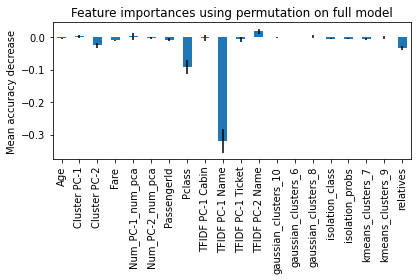

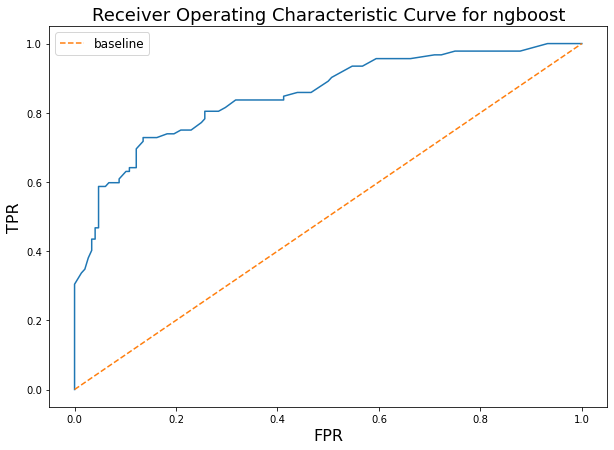

The ROC_AUC score is 0.8510575793184489


The Matthew correlation is 0.6026330464098387
-------------------
The accuracy is 0.8125
The recall is 0.8125
The macro F1 score is 0.784133837021047
The micro F1 score is 0.8125
The weighted F1 score is 0.8023925166396835
              precision    recall  f1-score   support

         0.0       0.79      0.95      0.86       148
         1.0       0.89      0.59      0.71        92

    accuracy                           0.81       240
   macro avg       0.84      0.77      0.78       240
weighted avg       0.83      0.81      0.80       240



Started Execute test train split at 15:52:06.
Started Started column type detection and casting at 15:52:06.
Started Checking for duplicate columns at 15:52:06.
Started Reset dataframe index. at 15:52:06.
Started Select best features at 15:52:06.
Started Delete columns with high share of NULLs at 15:52:06.
Started Apply datetime transformation at 15:52:06.
Started Start TFIDF to PCA loop at 15:52:06.
Started PCA POS tags at 15:52:06.
Started PCA POS tags at 15:52:06.
Started PCA POS tags at 15:52:06.
Started Handle rare features at 15:52:06.
Started Remove cardinality at 15:52:06.
Started Holistic NULL filling at 15:52:06.
Started Binarize numeric columns + PCA binarized features at 15:52:06.
Started Onehot + PCA categorical features at 15:52:06.
Started Execute categorical encoding at 15:52:06.
Started Fill nulls at 15:52:06.
Started Handle outliers at 15:52:06.
Started Remove collinearity at 15:52:06.
Started Remove skewness at 15:52:06.
Started Execute clustering as a feature at 15:

Score achieved on holdout dataset is: 0.5687400400654564.
End iteration for algorithm ngboost at 1637247128.3772588.
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Start iteration for algorithm sgd at 1637247128.378378.
Started Select best features at 15:52:08.
Features before selection are...PassengerId
Features before selection are...Pclass
Features before selection are...Age
Features before selection are...Fare
Features before selection are...Deck
Features before selection are...Title
Features before selection are...relatives
Features before selection are...Age_Class
Features before selection are...Fare_Per_Person
Features before selection are...Embarked
Features before selection are...Sex
Features before selection are...TFIDF PC-1 Ticket
Features before selection are...TFIDF PC-2 Ticket
Features before selection are...TFIDF PC-1 Cabin
Features before selection are...TFIDF PC-2 Cabin
Features before selection a

[I 2021-11-18 15:52:12,202] A new study created in memory with name: autoencoder_based_oversampling


Progress after this step is 50.0%.
Progress after this step is 100.0%.


  0%|          | 0/20 [00:00<?, ?it/s]

====> Epoch: 200 Average training loss: 258448.7593
====> Epoch: 200 Average test loss: 264660.9348
====> Epoch: 400 Average training loss: 258051.7222
====> Epoch: 400 Average test loss: 264252.6087
====> Epoch: 600 Average training loss: 257684.0926
====> Epoch: 600 Average test loss: 263882.3043
====> Epoch: 800 Average training loss: 257321.9259
====> Epoch: 800 Average test loss: 263524.3478
====> Epoch: 1000 Average training loss: 256969.5370
====> Epoch: 1000 Average test loss: 263169.7609
====> Epoch: 1200 Average training loss: 256620.5741
====> Epoch: 1200 Average test loss: 262821.4565
====> Epoch: 1400 Average training loss: 256272.8333
====> Epoch: 1400 Average test loss: 262475.8913
====> Epoch: 1600 Average training loss: 255924.3148
====> Epoch: 1600 Average test loss: 262124.5435
====> Epoch: 1800 Average training loss: 255580.5000
====> Epoch: 1800 Average test loss: 261774.9565
====> Epoch: 2000 Average training loss: 255238.1296
====> Epoch: 2000 Average test loss: 

====> Epoch: 5200 Average training loss: 249869.9630
====> Epoch: 5200 Average test loss: 255998.7174
====> Epoch: 5400 Average training loss: 249539.7037
====> Epoch: 5400 Average test loss: 255662.4783
====> Epoch: 5600 Average training loss: 249209.4444
====> Epoch: 5600 Average test loss: 255326.4130
====> Epoch: 5800 Average training loss: 248879.3889
====> Epoch: 5800 Average test loss: 254994.9783
====> Epoch: 6000 Average training loss: 248549.7037
====> Epoch: 6000 Average test loss: 254658.6522
====> Epoch: 6200 Average training loss: 248219.9815
====> Epoch: 6200 Average test loss: 254324.8261
====> Epoch: 6400 Average training loss: 247891.0370
====> Epoch: 6400 Average test loss: 253988.1087
====> Epoch: 6600 Average training loss: 247562.4259
====> Epoch: 6600 Average test loss: 253658.2391
====> Epoch: 6800 Average training loss: 247233.2407
====> Epoch: 6800 Average test loss: 253325.8478
====> Epoch: 7000 Average training loss: 246904.7222
====> Epoch: 7000 Average tes

====> Epoch: 9000 Average training loss: 243549.6296
====> Epoch: 9000 Average test loss: 249650.7391
====> Epoch: 9200 Average training loss: 243223.3519
====> Epoch: 9200 Average test loss: 249323.7826
====> Epoch: 9400 Average training loss: 242898.3704
====> Epoch: 9400 Average test loss: 248991.5217
====> Epoch: 9600 Average training loss: 242572.9815
====> Epoch: 9600 Average test loss: 248662.9783
====> Epoch: 9800 Average training loss: 242248.0000
====> Epoch: 9800 Average test loss: 248333.8043
====> Epoch: 10000 Average training loss: 241923.1481
====> Epoch: 10000 Average test loss: 248006.4783
====> Epoch: 10200 Average training loss: 241599.5556
====> Epoch: 10200 Average test loss: 247683.0000
====> Epoch: 10400 Average training loss: 241274.0185
====> Epoch: 10400 Average test loss: 247353.8696
====> Epoch: 10600 Average training loss: 240950.6111
====> Epoch: 10600 Average test loss: 247026.7391
====> Epoch: 10800 Average training loss: 240627.2778
====> Epoch: 10800 A

[I 2021-11-18 15:56:35,545] Trial 13 pruned. 
[I 2021-11-18 15:56:35,681] Trial 14 pruned. 
====> Epoch: 200 Average training loss: 258424.9444
====> Epoch: 200 Average test loss: 264623.4348
[I 2021-11-18 15:56:37,402] Trial 15 pruned. 
[I 2021-11-18 15:56:37,540] Trial 16 pruned. 
[I 2021-11-18 15:56:37,658] Trial 17 pruned. 
[I 2021-11-18 15:56:37,803] Trial 18 pruned. 
[I 2021-11-18 15:56:37,933] Trial 19 pruned. 


====> Epoch: 200 Average training loss: 258634.9259
====> Epoch: 200 Average test loss: 264805.6304
====> Epoch: 400 Average training loss: 258115.6296
====> Epoch: 400 Average test loss: 264266.3913
====> Epoch: 600 Average training loss: 257678.6481
====> Epoch: 600 Average test loss: 263848.9565
====> Epoch: 800 Average training loss: 257271.3148
====> Epoch: 800 Average test loss: 263480.9130
====> Epoch: 1000 Average training loss: 256909.2222
====> Epoch: 1000 Average test loss: 263092.3043
====> Epoch: 1200 Average training loss: 256543.7963
====> Epoch: 1200 Average test loss: 262723.8478
====> Epoch: 1400 Average training loss: 256188.1481
====> Epoch: 1400 Average test loss: 262371.4565
====> Epoch: 1600 Average training loss: 255835.3889
====> Epoch: 1600 Average test loss: 262023.4348
====> Epoch: 1800 Average training loss: 255490.1296
====> Epoch: 1800 Average test loss: 261670.1739
====> Epoch: 2000 Average training loss: 255142.1111
====> Epoch: 2000 Average test loss: 

====> Epoch: 16200 Average training loss: 231950.9074
====> Epoch: 16200 Average test loss: 237914.6739
====> Epoch: 16400 Average training loss: 231633.7222
====> Epoch: 16400 Average test loss: 237589.4348
====> Epoch: 16600 Average training loss: 231316.7037
====> Epoch: 16600 Average test loss: 237279.9130


[I 2021-11-18 15:58:07,185] A new study created in memory with name: sgd


Started Sort columns alphabetically at 15:58:07.
Started Train SGD classifier model at 15:58:07.


  0%|          | 0/3 [00:00<?, ?it/s]

[I 2021-11-18 15:58:07,240] Trial 0 finished with value: 0.0 and parameters: {'loss': 'log', 'alpha': 24.658329458549105, 'l1_ratio': 0.06250999323228593, 'epsilon': 0.0024348773534554596, 'max_iter': 4688, 'tol': 1.7073967431528103e-05, 'normalize': True, 'power_t': 0.39663473785260006}. Best is trial 0 with value: 0.0.
[I 2021-11-18 15:58:07,403] Trial 1 finished with value: -0.04902159783757007 and parameters: {'loss': 'log', 'alpha': 98.77700294007911, 'l1_ratio': 0.004335189736337855, 'epsilon': 0.002820996133514492, 'max_iter': 5510, 'tol': 0.00016480446427978953, 'normalize': True, 'power_t': 0.17624515035546043}. Best is trial 0 with value: 0.0.
[I 2021-11-18 15:58:07,562] Trial 2 finished with value: 0.29313308568507995 and parameters: {'loss': 'modified_huber', 'alpha': 0.05660670699258887, 'l1_ratio': 0.012562313237138797, 'epsilon': 0.013481575603601416, 'max_iter': 23558, 'tol': 6.290644294586152e-05, 'normalize': False, 'power_t': 0.10945992664124292}. Best is trial 2 wit

Started Predict with SGD classifier at 15:58:07.
Score achieved on holdout dataset is: 0.
End iteration for algorithm sgd at 1637247487.917049.
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Start iteration for algorithm vowpal_wabbit at 1637247487.9180877.
Started Select best features at 15:58:07.
Features before selection are...PassengerId
Features before selection are...Pclass
Features before selection are...Age
Features before selection are...Fare
Features before selection are...Deck
Features before selection are...Title
Features before selection are...relatives
Features before selection are...Age_Class
Features before selection are...Fare_Per_Person
Features before selection are...Embarked
Features before selection are...Sex
Features before selection are...TFIDF PC-1 Ticket
Features before selection are...TFIDF PC-2 Ticket
Features before selection are...TFIDF PC-1 Cabin
Features before selection are...TFIDF 

[I 2021-11-18 15:58:10,837] A new study created in memory with name: autoencoder_based_oversampling


Progress after this step is 50.0%.
Progress after this step is 100.0%.


  0%|          | 0/20 [00:00<?, ?it/s]

====> Epoch: 200 Average training loss: 258530.5185
====> Epoch: 200 Average test loss: 264720.9130
====> Epoch: 400 Average training loss: 258098.4815
====> Epoch: 400 Average test loss: 264292.5000
====> Epoch: 600 Average training loss: 257721.5556
====> Epoch: 600 Average test loss: 263916.5000
====> Epoch: 800 Average training loss: 257356.0926
====> Epoch: 800 Average test loss: 263555.8478
====> Epoch: 1000 Average training loss: 256997.3519
====> Epoch: 1000 Average test loss: 263199.3696
====> Epoch: 1200 Average training loss: 256644.2407
====> Epoch: 1200 Average test loss: 262848.5652
====> Epoch: 1400 Average training loss: 256295.8889
====> Epoch: 1400 Average test loss: 262501.0435
====> Epoch: 1600 Average training loss: 255949.0556
====> Epoch: 1600 Average test loss: 262153.5652
====> Epoch: 1800 Average training loss: 255603.4444
====> Epoch: 1800 Average test loss: 261810.5000
====> Epoch: 2000 Average training loss: 255259.4259
====> Epoch: 2000 Average test loss: 

====> Epoch: 5200 Average training loss: 249905.6111
====> Epoch: 5200 Average test loss: 256044.3261
====> Epoch: 5400 Average training loss: 249574.9259
====> Epoch: 5400 Average test loss: 255710.0000
====> Epoch: 5600 Average training loss: 249244.4444
====> Epoch: 5600 Average test loss: 255375.6087
====> Epoch: 5800 Average training loss: 248914.4259
====> Epoch: 5800 Average test loss: 255040.0870
====> Epoch: 6000 Average training loss: 248584.4630
====> Epoch: 6000 Average test loss: 254707.1087
====> Epoch: 6200 Average training loss: 248255.1481
====> Epoch: 6200 Average test loss: 254371.9130
====> Epoch: 6400 Average training loss: 247925.9074
====> Epoch: 6400 Average test loss: 254038.1087
====> Epoch: 6600 Average training loss: 247596.7963
====> Epoch: 6600 Average test loss: 253705.1304
====> Epoch: 6800 Average training loss: 247268.2222
====> Epoch: 6800 Average test loss: 253374.6087
====> Epoch: 7000 Average training loss: 246939.7963
====> Epoch: 7000 Average tes

====> Epoch: 9000 Average training loss: 243580.4259
====> Epoch: 9000 Average test loss: 249718.0652
====> Epoch: 9200 Average training loss: 243254.1852
====> Epoch: 9200 Average test loss: 249390.1739
====> Epoch: 9400 Average training loss: 242928.9444
====> Epoch: 9400 Average test loss: 249065.6957
====> Epoch: 9600 Average training loss: 242603.3889
====> Epoch: 9600 Average test loss: 248738.5870
====> Epoch: 9800 Average training loss: 242279.4444
====> Epoch: 9800 Average test loss: 248411.7174
====> Epoch: 10000 Average training loss: 241953.6481
====> Epoch: 10000 Average test loss: 248086.2826
====> Epoch: 10200 Average training loss: 241628.9630
====> Epoch: 10200 Average test loss: 247755.1522
====> Epoch: 10400 Average training loss: 241306.1667
====> Epoch: 10400 Average test loss: 247429.4130
====> Epoch: 10600 Average training loss: 240981.7037
====> Epoch: 10600 Average test loss: 247101.4348
====> Epoch: 10800 Average training loss: 240656.7778
====> Epoch: 10800 A

====> Epoch: 200 Average training loss: 258485.5926
====> Epoch: 200 Average test loss: 264678.1739
[I 2021-11-18 16:02:35,853] Trial 13 pruned. 
[I 2021-11-18 16:02:35,979] Trial 14 pruned. 
[I 2021-11-18 16:02:36,103] Trial 15 pruned. 
[I 2021-11-18 16:02:36,225] Trial 16 pruned. 
[I 2021-11-18 16:02:36,339] Trial 17 pruned. 
====> Epoch: 200 Average training loss: 258488.8519
====> Epoch: 200 Average test loss: 264685.5217
[I 2021-11-18 16:02:38,023] Trial 18 pruned. 
[I 2021-11-18 16:02:38,144] Trial 19 pruned. 


====> Epoch: 200 Average training loss: 258600.5926
====> Epoch: 200 Average test loss: 264754.7174
====> Epoch: 400 Average training loss: 258155.2222
====> Epoch: 400 Average test loss: 264343.7826
====> Epoch: 600 Average training loss: 257757.0741
====> Epoch: 600 Average test loss: 263937.1304
====> Epoch: 800 Average training loss: 257385.5926
====> Epoch: 800 Average test loss: 263576.7391
====> Epoch: 1000 Average training loss: 257030.1296
====> Epoch: 1000 Average test loss: 263214.0652
====> Epoch: 1200 Average training loss: 256669.0741
====> Epoch: 1200 Average test loss: 262852.1304
====> Epoch: 1400 Average training loss: 256314.2593
====> Epoch: 1400 Average test loss: 262503.0870
====> Epoch: 1600 Average training loss: 255963.4074
====> Epoch: 1600 Average test loss: 262157.0652
====> Epoch: 1800 Average training loss: 255617.8148
====> Epoch: 1800 Average test loss: 261811.5435
====> Epoch: 2000 Average training loss: 255267.5741
====> Epoch: 2000 Average test loss: 

====> Epoch: 16200 Average training loss: 232059.2593
====> Epoch: 16200 Average test loss: 238156.3043
====> Epoch: 16400 Average training loss: 231740.8519
====> Epoch: 16400 Average test loss: 237845.9130
====> Epoch: 16600 Average training loss: 231425.6852
====> Epoch: 16600 Average test loss: 237513.8913
Started Sort columns alphabetically at 16:04:06.
Started Train Vowpal Wabbit model at 16:04:06.
Started Predict with Vowpal Wabbit at 16:04:06.
16:04:06


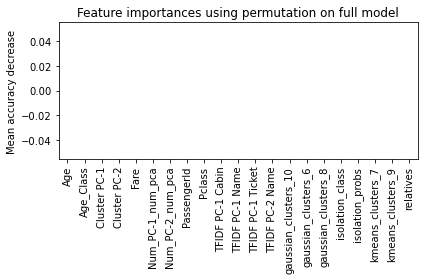

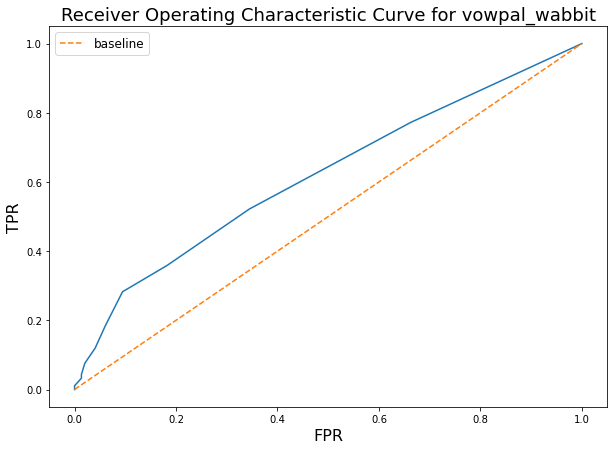

The ROC_AUC score is 0.6350616921269095


The Matthew correlation is 0.23415418131403337
-------------------
The accuracy is 0.6625
The recall is 0.6625
The macro F1 score is 0.5787740243981712
The micro F1 score is 0.6625
The weighted F1 score is 0.6225932265823058
              precision    recall  f1-score   support

         0.0       0.67      0.90      0.77       148
         1.0       0.63      0.28      0.39        92

    accuracy                           0.66       240
   macro avg       0.65      0.59      0.58       240
weighted avg       0.66      0.66      0.62       240



Started Execute test train split at 16:04:09.
Started Started column type detection and casting at 16:04:09.
Started Checking for duplicate columns at 16:04:09.
Started Reset dataframe index. at 16:04:09.
Started Select best features at 16:04:09.
Started Delete columns with high share of NULLs at 16:04:09.
Started Apply datetime transformation at 16:04:09.
Started Start TFIDF to PCA loop at 16:04:09.
Started PCA POS tags at 16:04:09.
Started PCA POS tags at 16:04:09.
Started PCA POS tags at 16:04:09.
Started Handle rare features at 16:04:09.
Started Remove cardinality at 16:04:09.
Started Holistic NULL filling at 16:04:09.
Started Binarize numeric columns + PCA binarized features at 16:04:09.
Started Onehot + PCA categorical features at 16:04:09.
Started Execute categorical encoding at 16:04:09.
Started Fill nulls at 16:04:09.
Started Handle outliers at 16:04:09.
Started Remove collinearity at 16:04:09.
Started Remove skewness at 16:04:09.
Started Execute clustering as a feature at 16:

Score achieved on holdout dataset is: 0.06940441793517219.
End iteration for algorithm vowpal_wabbit at 1637247850.8164382.
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Start iteration for algorithm ridge at 1637247850.8173735.
Started Select best features at 16:04:10.
Features before selection are...PassengerId
Features before selection are...Pclass
Features before selection are...Age
Features before selection are...Fare
Features before selection are...Deck
Features before selection are...Title
Features before selection are...relatives
Features before selection are...Age_Class
Features before selection are...Fare_Per_Person
Features before selection are...Embarked
Features before selection are...Sex
Features before selection are...TFIDF PC-1 Ticket
Features before selection are...TFIDF PC-2 Ticket
Features before selection are...TFIDF PC-1 Cabin
Features before selection are...TFIDF PC-2 Cabin
Features before s

[I 2021-11-18 16:04:14,056] A new study created in memory with name: ridge


Started Sort columns alphabetically at 16:04:13.
Started Train Ridge classifier model at 16:04:14.


  0%|          | 0/3 [00:00<?, ?it/s]

[I 2021-11-18 16:04:14,095] Trial 0 finished with value: 0.3468999333119824 and parameters: {'solver': 'svd', 'alpha': 157.41890047456639, 'max_iter': 6015, 'tol': 0.006796578090758156, 'normalize': False}. Best is trial 0 with value: 0.3468999333119824.
[I 2021-11-18 16:04:14,244] Trial 1 finished with value: 0.41829861790379497 and parameters: {'solver': 'auto', 'alpha': 0.055895242052179224, 'max_iter': 6123, 'tol': 3.613894271216525e-05, 'normalize': False}. Best is trial 1 with value: 0.41829861790379497.
[I 2021-11-18 16:04:14,394] Trial 2 finished with value: 0.4256773763514092 and parameters: {'solver': 'svd', 'alpha': 0.010547383621352036, 'max_iter': 659, 'tol': 0.06245139574743072, 'normalize': True}. Best is trial 2 with value: 0.4256773763514092.


Started Predict with Ridge classifier at 16:04:14.
16:04:14


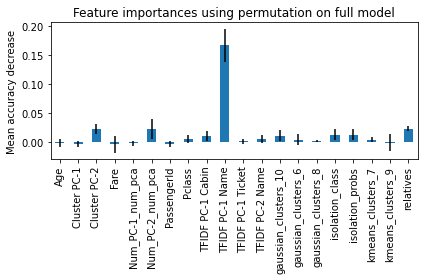

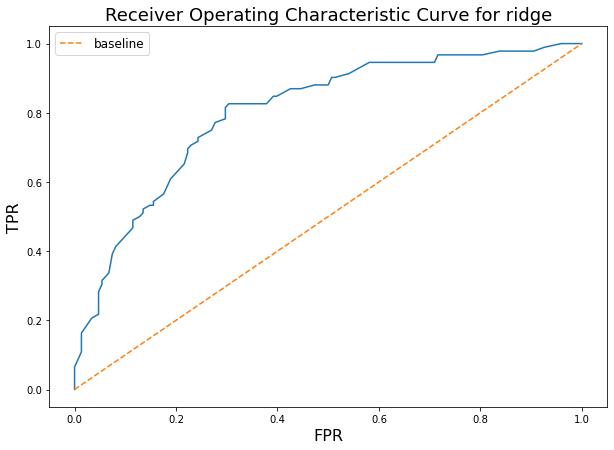

The ROC_AUC score is 0.803099294947121


The Matthew correlation is 0.5076407556501162
-------------------
The accuracy is 0.7458333333333333
The recall is 0.7458333333333333
The macro F1 score is 0.7425753019992616
The micro F1 score is 0.7458333333333332
The weighted F1 score is 0.749332700321781
              precision    recall  f1-score   support

         0.0       0.87      0.70      0.77       148
         1.0       0.63      0.83      0.71        92

    accuracy                           0.75       240
   macro avg       0.75      0.76      0.74       240
weighted avg       0.77      0.75      0.75       240



Started Execute test train split at 16:04:20.
Started Started column type detection and casting at 16:04:20.
Started Checking for duplicate columns at 16:04:20.
Started Reset dataframe index. at 16:04:20.
Started Select best features at 16:04:20.
Started Delete columns with high share of NULLs at 16:04:20.
Started Apply datetime transformation at 16:04:20.
Started Start TFIDF to PCA loop at 16:04:20.
Started PCA POS tags at 16:04:20.
Started PCA POS tags at 16:04:20.
Started PCA POS tags at 16:04:20.
Started Handle rare features at 16:04:20.
Started Remove cardinality at 16:04:20.
Started Holistic NULL filling at 16:04:20.
Started Binarize numeric columns + PCA binarized features at 16:04:20.
Started Onehot + PCA categorical features at 16:04:20.
Started Execute categorical encoding at 16:04:20.
Started Fill nulls at 16:04:20.
Started Handle outliers at 16:04:20.
Started Remove collinearity at 16:04:20.
Started Remove skewness at 16:04:20.
Started Execute clustering as a feature at 16:

Score achieved on holdout dataset is: 0.5199942914620352.
End iteration for algorithm ridge at 1637247861.9383557.
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Start iteration for algorithm xgboost at 1637247861.9393184.
Started Select best features at 16:04:21.
Features before selection are...PassengerId
Features before selection are...Pclass
Features before selection are...Age
Features before selection are...Fare
Features before selection are...Deck
Features before selection are...Title
Features before selection are...relatives
Features before selection are...Age_Class
Features before selection are...Fare_Per_Person
Features before selection are...Embarked
Features before selection are...Sex
Features before selection are...TFIDF PC-1 Ticket
Features before selection are...TFIDF PC-2 Ticket
Features before selection are...TFIDF PC-1 Cabin
Features before selection are...TFIDF PC-2 Cabin
Features before selectio

[I 2021-11-18 16:04:25,361] A new study created in memory with name: xgboost tuning


Started Sort columns alphabetically at 16:04:25.
Started Train Xgboost at 16:04:25.
Started Check Xgboost for GPU acceleration. at 16:04:25.
[16:04:25] WARNING: /opt/conda/envs/rapids/conda-bld/xgboost_1623267594558/work/src/learner.cc:573: 
Parameters: { "steps" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


Xgboost uses GPU.


  0%|          | 0/3 [00:00<?, ?it/s]

[16:04:25] WARNING: /opt/conda/envs/rapids/conda-bld/xgboost_1623267594558/work/src/learner.cc:573: 
Parameters: { "min_child_samples", "num_leaves", "steps", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[16:04:25] WARNING: /opt/conda/envs/rapids/conda-bld/xgboost_1623267594558/work/src/learner.cc:573: 
Parameters: { "min_child_samples", "num_leaves", "steps", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[16:04:25] WARNING: /opt/conda/envs/rapids/conda-bld/xgboost_1623267594558/work/src/learner.cc:573: 
Parameters: { "min_child_samples", "num

[I 2021-11-18 16:11:17,807] Trial 1 finished with value: 0.5016442206249082 and parameters: {'max_depth': 9, 'alpha': 18.794668241638455, 'lambda': 12.329623163659836, 'num_leaves': 48, 'subsample': 0.5825453457757226, 'colsample_bytree': 0.762378215816119, 'colsample_bylevel': 0.7159725093210578, 'colsample_bynode': 0.645614570099021, 'min_child_samples': 614, 'eta': 0.0022158645374549917, 'steps': 20451, 'num_parallel_tree': 2}. Best is trial 1 with value: 0.5016442206249082.
[16:11:17] WARNING: /opt/conda/envs/rapids/conda-bld/xgboost_1623267594558/work/src/learner.cc:573: 
Parameters: { "min_child_samples", "num_leaves", "steps", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[16:11:17] WARNING: /opt/conda/envs/rapids/conda-bld/xgboost_1623267594558/work/src/lea

[16:11:18] WARNING: /opt/conda/envs/rapids/conda-bld/xgboost_1623267594558/work/src/learner.cc:573: 
Parameters: { "min_child_samples", "num_leaves", "steps", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	train-mlogloss:0.69277	test-mlogloss:0.69286
[1]	train-mlogloss:0.69234	test-mlogloss:0.69249
[2]	train-mlogloss:0.69196	test-mlogloss:0.69221
[3]	train-mlogloss:0.69156	test-mlogloss:0.69188
[4]	train-mlogloss:0.69120	test-mlogloss:0.69157
[5]	train-mlogloss:0.69077	test-mlogloss:0.69127
[6]	train-mlogloss:0.69043	test-mlogloss:0.69099
[7]	train-mlogloss:0.69010	test-mlogloss:0.69068
[8]	train-mlogloss:0.68975	test-mlogloss:0.69040
[9]	train-mlogloss:0.68942	test-mlogloss:0.69011
[10]	train-mlogloss:0.68899	test-mlogloss:0.68974
[11]	train-mlogloss:0.68860	te

[155]	train-mlogloss:0.64289	test-mlogloss:0.65275
[156]	train-mlogloss:0.64259	test-mlogloss:0.65247
[157]	train-mlogloss:0.64221	test-mlogloss:0.65214
[158]	train-mlogloss:0.64189	test-mlogloss:0.65186
[159]	train-mlogloss:0.64165	test-mlogloss:0.65170
[160]	train-mlogloss:0.64134	test-mlogloss:0.65146
[161]	train-mlogloss:0.64103	test-mlogloss:0.65120
[162]	train-mlogloss:0.64084	test-mlogloss:0.65106
[163]	train-mlogloss:0.64058	test-mlogloss:0.65087
[164]	train-mlogloss:0.64032	test-mlogloss:0.65065
[165]	train-mlogloss:0.64009	test-mlogloss:0.65050
[166]	train-mlogloss:0.63979	test-mlogloss:0.65024
[167]	train-mlogloss:0.63956	test-mlogloss:0.65005
[168]	train-mlogloss:0.63930	test-mlogloss:0.64982
[169]	train-mlogloss:0.63908	test-mlogloss:0.64964
[170]	train-mlogloss:0.63882	test-mlogloss:0.64943
[171]	train-mlogloss:0.63852	test-mlogloss:0.64919
[172]	train-mlogloss:0.63828	test-mlogloss:0.64901
[173]	train-mlogloss:0.63807	test-mlogloss:0.64884
[174]	train-mlogloss:0.63783	te

[316]	train-mlogloss:0.60639	test-mlogloss:0.62265
[317]	train-mlogloss:0.60620	test-mlogloss:0.62252
[318]	train-mlogloss:0.60603	test-mlogloss:0.62239
[319]	train-mlogloss:0.60589	test-mlogloss:0.62226
[320]	train-mlogloss:0.60564	test-mlogloss:0.62207
[321]	train-mlogloss:0.60548	test-mlogloss:0.62193
[322]	train-mlogloss:0.60529	test-mlogloss:0.62180
[323]	train-mlogloss:0.60512	test-mlogloss:0.62167
[324]	train-mlogloss:0.60496	test-mlogloss:0.62152
[325]	train-mlogloss:0.60479	test-mlogloss:0.62139
[326]	train-mlogloss:0.60469	test-mlogloss:0.62130
[327]	train-mlogloss:0.60454	test-mlogloss:0.62123
[328]	train-mlogloss:0.60433	test-mlogloss:0.62104
[329]	train-mlogloss:0.60416	test-mlogloss:0.62092
[330]	train-mlogloss:0.60398	test-mlogloss:0.62077
[331]	train-mlogloss:0.60378	test-mlogloss:0.62061
[332]	train-mlogloss:0.60358	test-mlogloss:0.62046
[333]	train-mlogloss:0.60331	test-mlogloss:0.62022
[334]	train-mlogloss:0.60312	test-mlogloss:0.62005
[335]	train-mlogloss:0.60298	te

[477]	train-mlogloss:0.58045	test-mlogloss:0.60113
[478]	train-mlogloss:0.58026	test-mlogloss:0.60096
[479]	train-mlogloss:0.58013	test-mlogloss:0.60086
[480]	train-mlogloss:0.58004	test-mlogloss:0.60078
[481]	train-mlogloss:0.57991	test-mlogloss:0.60067
[482]	train-mlogloss:0.57980	test-mlogloss:0.60058
[483]	train-mlogloss:0.57967	test-mlogloss:0.60048
[484]	train-mlogloss:0.57952	test-mlogloss:0.60034
[485]	train-mlogloss:0.57938	test-mlogloss:0.60022
[486]	train-mlogloss:0.57926	test-mlogloss:0.60013
[487]	train-mlogloss:0.57921	test-mlogloss:0.60009
[488]	train-mlogloss:0.57902	test-mlogloss:0.59991
[489]	train-mlogloss:0.57891	test-mlogloss:0.59982
[490]	train-mlogloss:0.57872	test-mlogloss:0.59965
[491]	train-mlogloss:0.57859	test-mlogloss:0.59954
[492]	train-mlogloss:0.57844	test-mlogloss:0.59943
[493]	train-mlogloss:0.57826	test-mlogloss:0.59926
[494]	train-mlogloss:0.57818	test-mlogloss:0.59921
[495]	train-mlogloss:0.57811	test-mlogloss:0.59914
[496]	train-mlogloss:0.57799	te

[638]	train-mlogloss:0.56173	test-mlogloss:0.58528
[639]	train-mlogloss:0.56162	test-mlogloss:0.58519
[640]	train-mlogloss:0.56154	test-mlogloss:0.58510
[641]	train-mlogloss:0.56136	test-mlogloss:0.58495
[642]	train-mlogloss:0.56125	test-mlogloss:0.58487
[643]	train-mlogloss:0.56118	test-mlogloss:0.58481
[644]	train-mlogloss:0.56107	test-mlogloss:0.58470
[645]	train-mlogloss:0.56096	test-mlogloss:0.58461
[646]	train-mlogloss:0.56079	test-mlogloss:0.58448
[647]	train-mlogloss:0.56074	test-mlogloss:0.58446
[648]	train-mlogloss:0.56065	test-mlogloss:0.58437
[649]	train-mlogloss:0.56056	test-mlogloss:0.58430
[650]	train-mlogloss:0.56042	test-mlogloss:0.58420
[651]	train-mlogloss:0.56032	test-mlogloss:0.58412
[652]	train-mlogloss:0.56022	test-mlogloss:0.58404
[653]	train-mlogloss:0.56015	test-mlogloss:0.58398
[654]	train-mlogloss:0.56002	test-mlogloss:0.58386
[655]	train-mlogloss:0.55995	test-mlogloss:0.58380
[656]	train-mlogloss:0.55989	test-mlogloss:0.58375
[657]	train-mlogloss:0.55981	te

[799]	train-mlogloss:0.54657	test-mlogloss:0.57225
[800]	train-mlogloss:0.54651	test-mlogloss:0.57220
[801]	train-mlogloss:0.54645	test-mlogloss:0.57216
[802]	train-mlogloss:0.54638	test-mlogloss:0.57210
[803]	train-mlogloss:0.54630	test-mlogloss:0.57204
[804]	train-mlogloss:0.54621	test-mlogloss:0.57196
[805]	train-mlogloss:0.54612	test-mlogloss:0.57187
[806]	train-mlogloss:0.54608	test-mlogloss:0.57183
[807]	train-mlogloss:0.54603	test-mlogloss:0.57180
[808]	train-mlogloss:0.54598	test-mlogloss:0.57176
[809]	train-mlogloss:0.54590	test-mlogloss:0.57169
[810]	train-mlogloss:0.54579	test-mlogloss:0.57159
[811]	train-mlogloss:0.54573	test-mlogloss:0.57153
[812]	train-mlogloss:0.54564	test-mlogloss:0.57146
[813]	train-mlogloss:0.54552	test-mlogloss:0.57135
[814]	train-mlogloss:0.54548	test-mlogloss:0.57131
[815]	train-mlogloss:0.54543	test-mlogloss:0.57126
[816]	train-mlogloss:0.54535	test-mlogloss:0.57119
[817]	train-mlogloss:0.54531	test-mlogloss:0.57117
[818]	train-mlogloss:0.54521	te

[960]	train-mlogloss:0.53599	test-mlogloss:0.56319
[961]	train-mlogloss:0.53594	test-mlogloss:0.56315
[962]	train-mlogloss:0.53586	test-mlogloss:0.56307
[963]	train-mlogloss:0.53583	test-mlogloss:0.56305
[964]	train-mlogloss:0.53577	test-mlogloss:0.56300
[965]	train-mlogloss:0.53567	test-mlogloss:0.56292
[966]	train-mlogloss:0.53560	test-mlogloss:0.56286
[967]	train-mlogloss:0.53551	test-mlogloss:0.56278
[968]	train-mlogloss:0.53543	test-mlogloss:0.56272
[969]	train-mlogloss:0.53535	test-mlogloss:0.56266
[970]	train-mlogloss:0.53533	test-mlogloss:0.56264
[971]	train-mlogloss:0.53529	test-mlogloss:0.56261
[972]	train-mlogloss:0.53524	test-mlogloss:0.56256
[973]	train-mlogloss:0.53518	test-mlogloss:0.56251
[974]	train-mlogloss:0.53512	test-mlogloss:0.56246
[975]	train-mlogloss:0.53502	test-mlogloss:0.56237
[976]	train-mlogloss:0.53497	test-mlogloss:0.56232
[977]	train-mlogloss:0.53493	test-mlogloss:0.56229
[978]	train-mlogloss:0.53487	test-mlogloss:0.56223
[979]	train-mlogloss:0.53486	te

[1118]	train-mlogloss:0.52790	test-mlogloss:0.55627
[1119]	train-mlogloss:0.52780	test-mlogloss:0.55619
[1120]	train-mlogloss:0.52774	test-mlogloss:0.55613
[1121]	train-mlogloss:0.52770	test-mlogloss:0.55610
[1122]	train-mlogloss:0.52768	test-mlogloss:0.55609
[1123]	train-mlogloss:0.52758	test-mlogloss:0.55599
[1124]	train-mlogloss:0.52756	test-mlogloss:0.55598
[1125]	train-mlogloss:0.52751	test-mlogloss:0.55592
[1126]	train-mlogloss:0.52750	test-mlogloss:0.55591
[1127]	train-mlogloss:0.52740	test-mlogloss:0.55582
[1128]	train-mlogloss:0.52735	test-mlogloss:0.55577
[1129]	train-mlogloss:0.52734	test-mlogloss:0.55576
[1130]	train-mlogloss:0.52726	test-mlogloss:0.55569
[1131]	train-mlogloss:0.52723	test-mlogloss:0.55566
[1132]	train-mlogloss:0.52720	test-mlogloss:0.55564
[1133]	train-mlogloss:0.52711	test-mlogloss:0.55555
[1134]	train-mlogloss:0.52708	test-mlogloss:0.55552
[1135]	train-mlogloss:0.52706	test-mlogloss:0.55550
[1136]	train-mlogloss:0.52702	test-mlogloss:0.55546
[1137]	train

[1276]	train-mlogloss:0.52099	test-mlogloss:0.55030
[1277]	train-mlogloss:0.52096	test-mlogloss:0.55027
[1278]	train-mlogloss:0.52090	test-mlogloss:0.55023
[1279]	train-mlogloss:0.52088	test-mlogloss:0.55021
[1280]	train-mlogloss:0.52085	test-mlogloss:0.55019
[1281]	train-mlogloss:0.52083	test-mlogloss:0.55017
[1282]	train-mlogloss:0.52077	test-mlogloss:0.55012
[1283]	train-mlogloss:0.52073	test-mlogloss:0.55009
[1284]	train-mlogloss:0.52068	test-mlogloss:0.55005
[1285]	train-mlogloss:0.52061	test-mlogloss:0.54998
[1286]	train-mlogloss:0.52057	test-mlogloss:0.54995
[1287]	train-mlogloss:0.52054	test-mlogloss:0.54992
[1288]	train-mlogloss:0.52050	test-mlogloss:0.54988
[1289]	train-mlogloss:0.52050	test-mlogloss:0.54988
[1290]	train-mlogloss:0.52047	test-mlogloss:0.54986
[1291]	train-mlogloss:0.52046	test-mlogloss:0.54985
[1292]	train-mlogloss:0.52040	test-mlogloss:0.54980
[1293]	train-mlogloss:0.52033	test-mlogloss:0.54974
[1294]	train-mlogloss:0.52030	test-mlogloss:0.54970
[1295]	train

[1434]	train-mlogloss:0.51522	test-mlogloss:0.54529
[1435]	train-mlogloss:0.51516	test-mlogloss:0.54523
[1436]	train-mlogloss:0.51510	test-mlogloss:0.54518
[1437]	train-mlogloss:0.51510	test-mlogloss:0.54518
[1438]	train-mlogloss:0.51504	test-mlogloss:0.54513
[1439]	train-mlogloss:0.51502	test-mlogloss:0.54511
[1440]	train-mlogloss:0.51502	test-mlogloss:0.54511
[1441]	train-mlogloss:0.51499	test-mlogloss:0.54509
[1442]	train-mlogloss:0.51498	test-mlogloss:0.54508
[1443]	train-mlogloss:0.51494	test-mlogloss:0.54505
[1444]	train-mlogloss:0.51490	test-mlogloss:0.54502
[1445]	train-mlogloss:0.51484	test-mlogloss:0.54497
[1446]	train-mlogloss:0.51483	test-mlogloss:0.54495
[1447]	train-mlogloss:0.51477	test-mlogloss:0.54491
[1448]	train-mlogloss:0.51476	test-mlogloss:0.54490
[1449]	train-mlogloss:0.51473	test-mlogloss:0.54486
[1450]	train-mlogloss:0.51468	test-mlogloss:0.54482
[1451]	train-mlogloss:0.51464	test-mlogloss:0.54480
[1452]	train-mlogloss:0.51460	test-mlogloss:0.54476
[1453]	train

[1591]	train-mlogloss:0.51055	test-mlogloss:0.54123
[1592]	train-mlogloss:0.51054	test-mlogloss:0.54122
[1593]	train-mlogloss:0.51053	test-mlogloss:0.54122
[1594]	train-mlogloss:0.51049	test-mlogloss:0.54118
[1595]	train-mlogloss:0.51042	test-mlogloss:0.54113
[1596]	train-mlogloss:0.51039	test-mlogloss:0.54111
[1597]	train-mlogloss:0.51039	test-mlogloss:0.54111
[1598]	train-mlogloss:0.51038	test-mlogloss:0.54110
[1599]	train-mlogloss:0.51035	test-mlogloss:0.54107
[1600]	train-mlogloss:0.51034	test-mlogloss:0.54105
[1601]	train-mlogloss:0.51032	test-mlogloss:0.54103
[1602]	train-mlogloss:0.51029	test-mlogloss:0.54101
[1603]	train-mlogloss:0.51024	test-mlogloss:0.54097
[1604]	train-mlogloss:0.51021	test-mlogloss:0.54094
[1605]	train-mlogloss:0.51015	test-mlogloss:0.54089
[1606]	train-mlogloss:0.51011	test-mlogloss:0.54085
[1607]	train-mlogloss:0.51006	test-mlogloss:0.54081
[1608]	train-mlogloss:0.51003	test-mlogloss:0.54078
[1609]	train-mlogloss:0.51001	test-mlogloss:0.54077
[1610]	train

[1749]	train-mlogloss:0.50688	test-mlogloss:0.53808
[1750]	train-mlogloss:0.50684	test-mlogloss:0.53805
[1751]	train-mlogloss:0.50682	test-mlogloss:0.53802
[1752]	train-mlogloss:0.50676	test-mlogloss:0.53797
[1753]	train-mlogloss:0.50674	test-mlogloss:0.53795
[1754]	train-mlogloss:0.50672	test-mlogloss:0.53794
[1755]	train-mlogloss:0.50670	test-mlogloss:0.53791
[1756]	train-mlogloss:0.50667	test-mlogloss:0.53789
[1757]	train-mlogloss:0.50660	test-mlogloss:0.53782
[1758]	train-mlogloss:0.50655	test-mlogloss:0.53778
[1759]	train-mlogloss:0.50653	test-mlogloss:0.53775
[1760]	train-mlogloss:0.50648	test-mlogloss:0.53772
[1761]	train-mlogloss:0.50647	test-mlogloss:0.53771
[1762]	train-mlogloss:0.50646	test-mlogloss:0.53770
[1763]	train-mlogloss:0.50644	test-mlogloss:0.53768
[1764]	train-mlogloss:0.50641	test-mlogloss:0.53767
[1765]	train-mlogloss:0.50640	test-mlogloss:0.53766
[1766]	train-mlogloss:0.50638	test-mlogloss:0.53763
[1767]	train-mlogloss:0.50638	test-mlogloss:0.53763
[1768]	train

[1907]	train-mlogloss:0.50304	test-mlogloss:0.53465
[1908]	train-mlogloss:0.50304	test-mlogloss:0.53465
[1909]	train-mlogloss:0.50300	test-mlogloss:0.53461
[1910]	train-mlogloss:0.50299	test-mlogloss:0.53460
[1911]	train-mlogloss:0.50298	test-mlogloss:0.53459
[1912]	train-mlogloss:0.50295	test-mlogloss:0.53456
[1913]	train-mlogloss:0.50294	test-mlogloss:0.53455
[1914]	train-mlogloss:0.50289	test-mlogloss:0.53451
[1915]	train-mlogloss:0.50288	test-mlogloss:0.53450
[1916]	train-mlogloss:0.50286	test-mlogloss:0.53448
[1917]	train-mlogloss:0.50284	test-mlogloss:0.53447
[1918]	train-mlogloss:0.50282	test-mlogloss:0.53445
[1919]	train-mlogloss:0.50279	test-mlogloss:0.53442
[1920]	train-mlogloss:0.50275	test-mlogloss:0.53438
[1921]	train-mlogloss:0.50274	test-mlogloss:0.53437
[1922]	train-mlogloss:0.50269	test-mlogloss:0.53433
[1923]	train-mlogloss:0.50268	test-mlogloss:0.53432
[1924]	train-mlogloss:0.50266	test-mlogloss:0.53430
[1925]	train-mlogloss:0.50264	test-mlogloss:0.53429
[1926]	train

[2065]	train-mlogloss:0.49978	test-mlogloss:0.53182
[2066]	train-mlogloss:0.49978	test-mlogloss:0.53181
[2067]	train-mlogloss:0.49976	test-mlogloss:0.53180
[2068]	train-mlogloss:0.49975	test-mlogloss:0.53178
[2069]	train-mlogloss:0.49975	test-mlogloss:0.53178
[2070]	train-mlogloss:0.49974	test-mlogloss:0.53178
[2071]	train-mlogloss:0.49974	test-mlogloss:0.53178
[2072]	train-mlogloss:0.49971	test-mlogloss:0.53175
[2073]	train-mlogloss:0.49970	test-mlogloss:0.53174
[2074]	train-mlogloss:0.49970	test-mlogloss:0.53174
[2075]	train-mlogloss:0.49968	test-mlogloss:0.53173
[2076]	train-mlogloss:0.49966	test-mlogloss:0.53171
[2077]	train-mlogloss:0.49964	test-mlogloss:0.53170
[2078]	train-mlogloss:0.49961	test-mlogloss:0.53166
[2079]	train-mlogloss:0.49961	test-mlogloss:0.53166
[2080]	train-mlogloss:0.49960	test-mlogloss:0.53165
[2081]	train-mlogloss:0.49960	test-mlogloss:0.53165
[2082]	train-mlogloss:0.49960	test-mlogloss:0.53165
[2083]	train-mlogloss:0.49958	test-mlogloss:0.53164
[2084]	train

[2223]	train-mlogloss:0.49701	test-mlogloss:0.52941
[2224]	train-mlogloss:0.49700	test-mlogloss:0.52940
[2225]	train-mlogloss:0.49697	test-mlogloss:0.52937
[2226]	train-mlogloss:0.49694	test-mlogloss:0.52935
[2227]	train-mlogloss:0.49694	test-mlogloss:0.52935
[2228]	train-mlogloss:0.49693	test-mlogloss:0.52934
[2229]	train-mlogloss:0.49689	test-mlogloss:0.52931
[2230]	train-mlogloss:0.49688	test-mlogloss:0.52930
[2231]	train-mlogloss:0.49687	test-mlogloss:0.52929
[2232]	train-mlogloss:0.49686	test-mlogloss:0.52928
[2233]	train-mlogloss:0.49684	test-mlogloss:0.52926
[2234]	train-mlogloss:0.49680	test-mlogloss:0.52924
[2235]	train-mlogloss:0.49680	test-mlogloss:0.52923
[2236]	train-mlogloss:0.49680	test-mlogloss:0.52923
[2237]	train-mlogloss:0.49680	test-mlogloss:0.52923
[2238]	train-mlogloss:0.49676	test-mlogloss:0.52919
[2239]	train-mlogloss:0.49674	test-mlogloss:0.52917
[2240]	train-mlogloss:0.49672	test-mlogloss:0.52915
[2241]	train-mlogloss:0.49670	test-mlogloss:0.52914
[2242]	train

[2381]	train-mlogloss:0.49429	test-mlogloss:0.52707
[2382]	train-mlogloss:0.49429	test-mlogloss:0.52707
[2383]	train-mlogloss:0.49428	test-mlogloss:0.52707
[2384]	train-mlogloss:0.49426	test-mlogloss:0.52704
[2385]	train-mlogloss:0.49426	test-mlogloss:0.52704
[2386]	train-mlogloss:0.49424	test-mlogloss:0.52702
[2387]	train-mlogloss:0.49423	test-mlogloss:0.52701
[2388]	train-mlogloss:0.49421	test-mlogloss:0.52699
[2389]	train-mlogloss:0.49418	test-mlogloss:0.52697
[2390]	train-mlogloss:0.49415	test-mlogloss:0.52694
[2391]	train-mlogloss:0.49414	test-mlogloss:0.52693
[2392]	train-mlogloss:0.49412	test-mlogloss:0.52691
[2393]	train-mlogloss:0.49411	test-mlogloss:0.52690
[2394]	train-mlogloss:0.49409	test-mlogloss:0.52688
[2395]	train-mlogloss:0.49405	test-mlogloss:0.52686
[2396]	train-mlogloss:0.49404	test-mlogloss:0.52685
[2397]	train-mlogloss:0.49402	test-mlogloss:0.52684
[2398]	train-mlogloss:0.49402	test-mlogloss:0.52683
[2399]	train-mlogloss:0.49402	test-mlogloss:0.52683
[2400]	train

[2539]	train-mlogloss:0.49210	test-mlogloss:0.52517
[2540]	train-mlogloss:0.49207	test-mlogloss:0.52515
[2541]	train-mlogloss:0.49207	test-mlogloss:0.52515
[2542]	train-mlogloss:0.49205	test-mlogloss:0.52512
[2543]	train-mlogloss:0.49203	test-mlogloss:0.52511
[2544]	train-mlogloss:0.49200	test-mlogloss:0.52509
[2545]	train-mlogloss:0.49196	test-mlogloss:0.52505
[2546]	train-mlogloss:0.49195	test-mlogloss:0.52504
[2547]	train-mlogloss:0.49194	test-mlogloss:0.52503
[2548]	train-mlogloss:0.49194	test-mlogloss:0.52503
[2549]	train-mlogloss:0.49192	test-mlogloss:0.52502
[2550]	train-mlogloss:0.49191	test-mlogloss:0.52501
[2551]	train-mlogloss:0.49189	test-mlogloss:0.52500
[2552]	train-mlogloss:0.49187	test-mlogloss:0.52499
[2553]	train-mlogloss:0.49186	test-mlogloss:0.52497
[2554]	train-mlogloss:0.49181	test-mlogloss:0.52493
[2555]	train-mlogloss:0.49180	test-mlogloss:0.52492
[2556]	train-mlogloss:0.49179	test-mlogloss:0.52491
[2557]	train-mlogloss:0.49177	test-mlogloss:0.52490
[2558]	train

[2697]	train-mlogloss:0.48978	test-mlogloss:0.52312
[2698]	train-mlogloss:0.48976	test-mlogloss:0.52310
[2699]	train-mlogloss:0.48974	test-mlogloss:0.52308
[2700]	train-mlogloss:0.48974	test-mlogloss:0.52308
[2701]	train-mlogloss:0.48970	test-mlogloss:0.52305
[2702]	train-mlogloss:0.48968	test-mlogloss:0.52303
[2703]	train-mlogloss:0.48967	test-mlogloss:0.52302
[2704]	train-mlogloss:0.48966	test-mlogloss:0.52302
[2705]	train-mlogloss:0.48965	test-mlogloss:0.52300
[2706]	train-mlogloss:0.48964	test-mlogloss:0.52300
[2707]	train-mlogloss:0.48961	test-mlogloss:0.52297
[2708]	train-mlogloss:0.48961	test-mlogloss:0.52297
[2709]	train-mlogloss:0.48958	test-mlogloss:0.52295
[2710]	train-mlogloss:0.48956	test-mlogloss:0.52293
[2711]	train-mlogloss:0.48955	test-mlogloss:0.52292
[2712]	train-mlogloss:0.48954	test-mlogloss:0.52291
[2713]	train-mlogloss:0.48954	test-mlogloss:0.52291
[2714]	train-mlogloss:0.48953	test-mlogloss:0.52291
[2715]	train-mlogloss:0.48952	test-mlogloss:0.52289
[2716]	train

[2855]	train-mlogloss:0.48778	test-mlogloss:0.52136
[2856]	train-mlogloss:0.48778	test-mlogloss:0.52136
[2857]	train-mlogloss:0.48778	test-mlogloss:0.52136
[2858]	train-mlogloss:0.48775	test-mlogloss:0.52134
[2859]	train-mlogloss:0.48775	test-mlogloss:0.52134
[2860]	train-mlogloss:0.48774	test-mlogloss:0.52133
[2861]	train-mlogloss:0.48774	test-mlogloss:0.52133
[2862]	train-mlogloss:0.48772	test-mlogloss:0.52131
[2863]	train-mlogloss:0.48772	test-mlogloss:0.52131
[2864]	train-mlogloss:0.48772	test-mlogloss:0.52131
[2865]	train-mlogloss:0.48767	test-mlogloss:0.52127
[2866]	train-mlogloss:0.48766	test-mlogloss:0.52126
[2867]	train-mlogloss:0.48764	test-mlogloss:0.52124
[2868]	train-mlogloss:0.48763	test-mlogloss:0.52123
[2869]	train-mlogloss:0.48761	test-mlogloss:0.52122
[2870]	train-mlogloss:0.48760	test-mlogloss:0.52121
[2871]	train-mlogloss:0.48758	test-mlogloss:0.52119
[2872]	train-mlogloss:0.48758	test-mlogloss:0.52119
[2873]	train-mlogloss:0.48754	test-mlogloss:0.52116
[2874]	train

[3013]	train-mlogloss:0.48580	test-mlogloss:0.51966
[3014]	train-mlogloss:0.48580	test-mlogloss:0.51966
[3015]	train-mlogloss:0.48579	test-mlogloss:0.51965
[3016]	train-mlogloss:0.48578	test-mlogloss:0.51964
[3017]	train-mlogloss:0.48577	test-mlogloss:0.51963
[3018]	train-mlogloss:0.48575	test-mlogloss:0.51962
[3019]	train-mlogloss:0.48574	test-mlogloss:0.51961
[3020]	train-mlogloss:0.48572	test-mlogloss:0.51960
[3021]	train-mlogloss:0.48572	test-mlogloss:0.51959
[3022]	train-mlogloss:0.48572	test-mlogloss:0.51959
[3023]	train-mlogloss:0.48571	test-mlogloss:0.51959
[3024]	train-mlogloss:0.48571	test-mlogloss:0.51959
[3025]	train-mlogloss:0.48569	test-mlogloss:0.51957
[3026]	train-mlogloss:0.48568	test-mlogloss:0.51956
[3027]	train-mlogloss:0.48566	test-mlogloss:0.51954
[3028]	train-mlogloss:0.48565	test-mlogloss:0.51953
[3029]	train-mlogloss:0.48565	test-mlogloss:0.51953
[3030]	train-mlogloss:0.48563	test-mlogloss:0.51952
[3031]	train-mlogloss:0.48562	test-mlogloss:0.51951
[3032]	train

[3171]	train-mlogloss:0.48412	test-mlogloss:0.51824
[3172]	train-mlogloss:0.48411	test-mlogloss:0.51823
[3173]	train-mlogloss:0.48410	test-mlogloss:0.51822
[3174]	train-mlogloss:0.48408	test-mlogloss:0.51821
[3175]	train-mlogloss:0.48408	test-mlogloss:0.51820
[3176]	train-mlogloss:0.48404	test-mlogloss:0.51818
[3177]	train-mlogloss:0.48404	test-mlogloss:0.51817
[3178]	train-mlogloss:0.48401	test-mlogloss:0.51815
[3179]	train-mlogloss:0.48401	test-mlogloss:0.51814
[3180]	train-mlogloss:0.48399	test-mlogloss:0.51813
[3181]	train-mlogloss:0.48399	test-mlogloss:0.51813
[3182]	train-mlogloss:0.48397	test-mlogloss:0.51811
[3183]	train-mlogloss:0.48397	test-mlogloss:0.51811
[3184]	train-mlogloss:0.48397	test-mlogloss:0.51811
[3185]	train-mlogloss:0.48396	test-mlogloss:0.51811
[3186]	train-mlogloss:0.48395	test-mlogloss:0.51809
[3187]	train-mlogloss:0.48393	test-mlogloss:0.51808
[3188]	train-mlogloss:0.48392	test-mlogloss:0.51807
[3189]	train-mlogloss:0.48391	test-mlogloss:0.51806
[3190]	train

[3329]	train-mlogloss:0.48264	test-mlogloss:0.51695
[3330]	train-mlogloss:0.48264	test-mlogloss:0.51695
[3331]	train-mlogloss:0.48264	test-mlogloss:0.51695
[3332]	train-mlogloss:0.48262	test-mlogloss:0.51694
[3333]	train-mlogloss:0.48262	test-mlogloss:0.51694
[3334]	train-mlogloss:0.48262	test-mlogloss:0.51694
[3335]	train-mlogloss:0.48261	test-mlogloss:0.51693
[3336]	train-mlogloss:0.48261	test-mlogloss:0.51693
[3337]	train-mlogloss:0.48261	test-mlogloss:0.51693
[3338]	train-mlogloss:0.48261	test-mlogloss:0.51692
[3339]	train-mlogloss:0.48259	test-mlogloss:0.51692
[3340]	train-mlogloss:0.48259	test-mlogloss:0.51691
[3341]	train-mlogloss:0.48257	test-mlogloss:0.51689
[3342]	train-mlogloss:0.48256	test-mlogloss:0.51689
[3343]	train-mlogloss:0.48256	test-mlogloss:0.51689
[3344]	train-mlogloss:0.48255	test-mlogloss:0.51688
[3345]	train-mlogloss:0.48255	test-mlogloss:0.51688
[3346]	train-mlogloss:0.48253	test-mlogloss:0.51687
[3347]	train-mlogloss:0.48251	test-mlogloss:0.51685
[3348]	train

[3487]	train-mlogloss:0.48137	test-mlogloss:0.51586
[3488]	train-mlogloss:0.48137	test-mlogloss:0.51586
[3489]	train-mlogloss:0.48137	test-mlogloss:0.51586
[3490]	train-mlogloss:0.48136	test-mlogloss:0.51585
[3491]	train-mlogloss:0.48136	test-mlogloss:0.51585
[3492]	train-mlogloss:0.48134	test-mlogloss:0.51583
[3493]	train-mlogloss:0.48133	test-mlogloss:0.51583
[3494]	train-mlogloss:0.48133	test-mlogloss:0.51583
[3495]	train-mlogloss:0.48133	test-mlogloss:0.51583
[3496]	train-mlogloss:0.48133	test-mlogloss:0.51582
[3497]	train-mlogloss:0.48130	test-mlogloss:0.51580
[3498]	train-mlogloss:0.48129	test-mlogloss:0.51579
[3499]	train-mlogloss:0.48128	test-mlogloss:0.51578
[3500]	train-mlogloss:0.48127	test-mlogloss:0.51577
[3501]	train-mlogloss:0.48127	test-mlogloss:0.51577
[3502]	train-mlogloss:0.48126	test-mlogloss:0.51576
[3503]	train-mlogloss:0.48125	test-mlogloss:0.51576
[3504]	train-mlogloss:0.48125	test-mlogloss:0.51576
[3505]	train-mlogloss:0.48123	test-mlogloss:0.51574
[3506]	train

[3645]	train-mlogloss:0.48010	test-mlogloss:0.51476
[3646]	train-mlogloss:0.48010	test-mlogloss:0.51475
[3647]	train-mlogloss:0.48010	test-mlogloss:0.51475
[3648]	train-mlogloss:0.48010	test-mlogloss:0.51475
[3649]	train-mlogloss:0.48009	test-mlogloss:0.51474
[3650]	train-mlogloss:0.48008	test-mlogloss:0.51474
[3651]	train-mlogloss:0.48008	test-mlogloss:0.51474
[3652]	train-mlogloss:0.48006	test-mlogloss:0.51472
[3653]	train-mlogloss:0.48005	test-mlogloss:0.51471
[3654]	train-mlogloss:0.48004	test-mlogloss:0.51470
[3655]	train-mlogloss:0.48004	test-mlogloss:0.51470
[3656]	train-mlogloss:0.48003	test-mlogloss:0.51469
[3657]	train-mlogloss:0.48003	test-mlogloss:0.51469
[3658]	train-mlogloss:0.48003	test-mlogloss:0.51469
[3659]	train-mlogloss:0.48003	test-mlogloss:0.51469
[3660]	train-mlogloss:0.48002	test-mlogloss:0.51468
[3661]	train-mlogloss:0.48002	test-mlogloss:0.51468
[3662]	train-mlogloss:0.48000	test-mlogloss:0.51467
[3663]	train-mlogloss:0.48000	test-mlogloss:0.51466
[3664]	train

[3803]	train-mlogloss:0.47904	test-mlogloss:0.51383
[3804]	train-mlogloss:0.47903	test-mlogloss:0.51382
[3805]	train-mlogloss:0.47900	test-mlogloss:0.51380
[3806]	train-mlogloss:0.47900	test-mlogloss:0.51380
[3807]	train-mlogloss:0.47899	test-mlogloss:0.51380
[3808]	train-mlogloss:0.47899	test-mlogloss:0.51379
[3809]	train-mlogloss:0.47898	test-mlogloss:0.51378
[3810]	train-mlogloss:0.47898	test-mlogloss:0.51378
[3811]	train-mlogloss:0.47896	test-mlogloss:0.51377
[3812]	train-mlogloss:0.47896	test-mlogloss:0.51376
[3813]	train-mlogloss:0.47895	test-mlogloss:0.51375
[3814]	train-mlogloss:0.47895	test-mlogloss:0.51375
[3815]	train-mlogloss:0.47894	test-mlogloss:0.51375
[3816]	train-mlogloss:0.47894	test-mlogloss:0.51375
[3817]	train-mlogloss:0.47894	test-mlogloss:0.51375
[3818]	train-mlogloss:0.47892	test-mlogloss:0.51374
[3819]	train-mlogloss:0.47892	test-mlogloss:0.51373
[3820]	train-mlogloss:0.47892	test-mlogloss:0.51373
[3821]	train-mlogloss:0.47892	test-mlogloss:0.51373
[3822]	train

[3961]	train-mlogloss:0.47798	test-mlogloss:0.51293
[3962]	train-mlogloss:0.47797	test-mlogloss:0.51292
[3963]	train-mlogloss:0.47796	test-mlogloss:0.51292
[3964]	train-mlogloss:0.47796	test-mlogloss:0.51292
[3965]	train-mlogloss:0.47796	test-mlogloss:0.51291
[3966]	train-mlogloss:0.47795	test-mlogloss:0.51291
[3967]	train-mlogloss:0.47795	test-mlogloss:0.51290
[3968]	train-mlogloss:0.47795	test-mlogloss:0.51290
[3969]	train-mlogloss:0.47795	test-mlogloss:0.51290
[3970]	train-mlogloss:0.47794	test-mlogloss:0.51289
[3971]	train-mlogloss:0.47793	test-mlogloss:0.51289
[3972]	train-mlogloss:0.47792	test-mlogloss:0.51288
[3973]	train-mlogloss:0.47792	test-mlogloss:0.51288
[3974]	train-mlogloss:0.47791	test-mlogloss:0.51287
[3975]	train-mlogloss:0.47791	test-mlogloss:0.51287
[3976]	train-mlogloss:0.47791	test-mlogloss:0.51287
[3977]	train-mlogloss:0.47789	test-mlogloss:0.51286
[3978]	train-mlogloss:0.47788	test-mlogloss:0.51285
[3979]	train-mlogloss:0.47787	test-mlogloss:0.51284
[3980]	train

[4119]	train-mlogloss:0.47699	test-mlogloss:0.51207
[4120]	train-mlogloss:0.47697	test-mlogloss:0.51205
[4121]	train-mlogloss:0.47697	test-mlogloss:0.51205
[4122]	train-mlogloss:0.47697	test-mlogloss:0.51205
[4123]	train-mlogloss:0.47697	test-mlogloss:0.51204
[4124]	train-mlogloss:0.47696	test-mlogloss:0.51203
[4125]	train-mlogloss:0.47696	test-mlogloss:0.51203
[4126]	train-mlogloss:0.47695	test-mlogloss:0.51202
[4127]	train-mlogloss:0.47693	test-mlogloss:0.51201
[4128]	train-mlogloss:0.47693	test-mlogloss:0.51201
[4129]	train-mlogloss:0.47693	test-mlogloss:0.51201
[4130]	train-mlogloss:0.47692	test-mlogloss:0.51200
[4131]	train-mlogloss:0.47692	test-mlogloss:0.51200
[4132]	train-mlogloss:0.47691	test-mlogloss:0.51199
[4133]	train-mlogloss:0.47691	test-mlogloss:0.51199
[4134]	train-mlogloss:0.47691	test-mlogloss:0.51199
[4135]	train-mlogloss:0.47691	test-mlogloss:0.51199
[4136]	train-mlogloss:0.47691	test-mlogloss:0.51199
[4137]	train-mlogloss:0.47690	test-mlogloss:0.51198
[4138]	train

[4277]	train-mlogloss:0.47594	test-mlogloss:0.51116
[4278]	train-mlogloss:0.47594	test-mlogloss:0.51116
[4279]	train-mlogloss:0.47594	test-mlogloss:0.51115
[4280]	train-mlogloss:0.47592	test-mlogloss:0.51114
[4281]	train-mlogloss:0.47592	test-mlogloss:0.51114
[4282]	train-mlogloss:0.47591	test-mlogloss:0.51113
[4283]	train-mlogloss:0.47590	test-mlogloss:0.51112
[4284]	train-mlogloss:0.47590	test-mlogloss:0.51112
[4285]	train-mlogloss:0.47590	test-mlogloss:0.51112
[4286]	train-mlogloss:0.47590	test-mlogloss:0.51112
[4287]	train-mlogloss:0.47590	test-mlogloss:0.51112
[4288]	train-mlogloss:0.47590	test-mlogloss:0.51112
[4289]	train-mlogloss:0.47590	test-mlogloss:0.51112
[4290]	train-mlogloss:0.47589	test-mlogloss:0.51111
[4291]	train-mlogloss:0.47589	test-mlogloss:0.51111
[4292]	train-mlogloss:0.47589	test-mlogloss:0.51111
[4293]	train-mlogloss:0.47587	test-mlogloss:0.51110
[4294]	train-mlogloss:0.47587	test-mlogloss:0.51110
[4295]	train-mlogloss:0.47587	test-mlogloss:0.51110
[4296]	train

[4435]	train-mlogloss:0.47498	test-mlogloss:0.51033
[4436]	train-mlogloss:0.47498	test-mlogloss:0.51033
[4437]	train-mlogloss:0.47497	test-mlogloss:0.51031
[4438]	train-mlogloss:0.47497	test-mlogloss:0.51031
[4439]	train-mlogloss:0.47496	test-mlogloss:0.51031
[4440]	train-mlogloss:0.47496	test-mlogloss:0.51031
[4441]	train-mlogloss:0.47496	test-mlogloss:0.51031
[4442]	train-mlogloss:0.47495	test-mlogloss:0.51030
[4443]	train-mlogloss:0.47495	test-mlogloss:0.51030
[4444]	train-mlogloss:0.47494	test-mlogloss:0.51029
[4445]	train-mlogloss:0.47494	test-mlogloss:0.51029
[4446]	train-mlogloss:0.47494	test-mlogloss:0.51029
[4447]	train-mlogloss:0.47494	test-mlogloss:0.51029
[4448]	train-mlogloss:0.47494	test-mlogloss:0.51029
[4449]	train-mlogloss:0.47493	test-mlogloss:0.51028
[4450]	train-mlogloss:0.47493	test-mlogloss:0.51028
[4451]	train-mlogloss:0.47492	test-mlogloss:0.51028
[4452]	train-mlogloss:0.47492	test-mlogloss:0.51027
[4453]	train-mlogloss:0.47492	test-mlogloss:0.51027
[4454]	train

[4592]	train-mlogloss:0.47413	test-mlogloss:0.50961
[4593]	train-mlogloss:0.47411	test-mlogloss:0.50959
[4594]	train-mlogloss:0.47410	test-mlogloss:0.50959
[4595]	train-mlogloss:0.47410	test-mlogloss:0.50959
[4596]	train-mlogloss:0.47409	test-mlogloss:0.50959
[4597]	train-mlogloss:0.47408	test-mlogloss:0.50957
[4598]	train-mlogloss:0.47408	test-mlogloss:0.50957
[4599]	train-mlogloss:0.47408	test-mlogloss:0.50957
[4600]	train-mlogloss:0.47407	test-mlogloss:0.50957
[4601]	train-mlogloss:0.47407	test-mlogloss:0.50957
[4602]	train-mlogloss:0.47406	test-mlogloss:0.50956
[4603]	train-mlogloss:0.47406	test-mlogloss:0.50956
[4604]	train-mlogloss:0.47406	test-mlogloss:0.50956
[4605]	train-mlogloss:0.47406	test-mlogloss:0.50955
[4606]	train-mlogloss:0.47405	test-mlogloss:0.50955
[4607]	train-mlogloss:0.47405	test-mlogloss:0.50955
[4608]	train-mlogloss:0.47404	test-mlogloss:0.50954
[4609]	train-mlogloss:0.47404	test-mlogloss:0.50954
[4610]	train-mlogloss:0.47404	test-mlogloss:0.50953
[4611]	train

[4750]	train-mlogloss:0.47348	test-mlogloss:0.50905
[4751]	train-mlogloss:0.47348	test-mlogloss:0.50904
[4752]	train-mlogloss:0.47348	test-mlogloss:0.50904
[4753]	train-mlogloss:0.47347	test-mlogloss:0.50904
[4754]	train-mlogloss:0.47347	test-mlogloss:0.50904
[4755]	train-mlogloss:0.47347	test-mlogloss:0.50904
[4756]	train-mlogloss:0.47347	test-mlogloss:0.50904
[4757]	train-mlogloss:0.47346	test-mlogloss:0.50903
[4758]	train-mlogloss:0.47344	test-mlogloss:0.50902
[4759]	train-mlogloss:0.47344	test-mlogloss:0.50901
[4760]	train-mlogloss:0.47343	test-mlogloss:0.50901
[4761]	train-mlogloss:0.47343	test-mlogloss:0.50901
[4762]	train-mlogloss:0.47343	test-mlogloss:0.50901
[4763]	train-mlogloss:0.47343	test-mlogloss:0.50901
[4764]	train-mlogloss:0.47343	test-mlogloss:0.50901
[4765]	train-mlogloss:0.47343	test-mlogloss:0.50901
[4766]	train-mlogloss:0.47343	test-mlogloss:0.50900
[4767]	train-mlogloss:0.47343	test-mlogloss:0.50900
[4768]	train-mlogloss:0.47342	test-mlogloss:0.50899
[4769]	train

[4908]	train-mlogloss:0.47271	test-mlogloss:0.50842
[4909]	train-mlogloss:0.47271	test-mlogloss:0.50842
[4910]	train-mlogloss:0.47271	test-mlogloss:0.50842
[4911]	train-mlogloss:0.47271	test-mlogloss:0.50841
[4912]	train-mlogloss:0.47270	test-mlogloss:0.50841
[4913]	train-mlogloss:0.47269	test-mlogloss:0.50840
[4914]	train-mlogloss:0.47269	test-mlogloss:0.50840
[4915]	train-mlogloss:0.47268	test-mlogloss:0.50839
[4916]	train-mlogloss:0.47266	test-mlogloss:0.50838
[4917]	train-mlogloss:0.47266	test-mlogloss:0.50837
[4918]	train-mlogloss:0.47265	test-mlogloss:0.50837
[4919]	train-mlogloss:0.47265	test-mlogloss:0.50837
[4920]	train-mlogloss:0.47265	test-mlogloss:0.50837
[4921]	train-mlogloss:0.47265	test-mlogloss:0.50837
[4922]	train-mlogloss:0.47265	test-mlogloss:0.50837
[4923]	train-mlogloss:0.47265	test-mlogloss:0.50837
[4924]	train-mlogloss:0.47264	test-mlogloss:0.50836
[4925]	train-mlogloss:0.47264	test-mlogloss:0.50836
[4926]	train-mlogloss:0.47264	test-mlogloss:0.50836
[4927]	train

[5066]	train-mlogloss:0.47203	test-mlogloss:0.50784
[5067]	train-mlogloss:0.47202	test-mlogloss:0.50783
[5068]	train-mlogloss:0.47202	test-mlogloss:0.50782
[5069]	train-mlogloss:0.47201	test-mlogloss:0.50782
[5070]	train-mlogloss:0.47201	test-mlogloss:0.50781
[5071]	train-mlogloss:0.47201	test-mlogloss:0.50781
[5072]	train-mlogloss:0.47200	test-mlogloss:0.50781
[5073]	train-mlogloss:0.47199	test-mlogloss:0.50780
[5074]	train-mlogloss:0.47199	test-mlogloss:0.50780
[5075]	train-mlogloss:0.47199	test-mlogloss:0.50780
[5076]	train-mlogloss:0.47198	test-mlogloss:0.50779
[5077]	train-mlogloss:0.47197	test-mlogloss:0.50778
[5078]	train-mlogloss:0.47196	test-mlogloss:0.50777
[5079]	train-mlogloss:0.47196	test-mlogloss:0.50777
[5080]	train-mlogloss:0.47196	test-mlogloss:0.50777
[5081]	train-mlogloss:0.47195	test-mlogloss:0.50776
[5082]	train-mlogloss:0.47193	test-mlogloss:0.50775
[5083]	train-mlogloss:0.47193	test-mlogloss:0.50775
[5084]	train-mlogloss:0.47193	test-mlogloss:0.50775
[5085]	train

[5224]	train-mlogloss:0.47143	test-mlogloss:0.50731
[5225]	train-mlogloss:0.47142	test-mlogloss:0.50731
[5226]	train-mlogloss:0.47142	test-mlogloss:0.50731
[5227]	train-mlogloss:0.47142	test-mlogloss:0.50731
[5228]	train-mlogloss:0.47141	test-mlogloss:0.50730
[5229]	train-mlogloss:0.47141	test-mlogloss:0.50729
[5230]	train-mlogloss:0.47141	test-mlogloss:0.50729
[5231]	train-mlogloss:0.47141	test-mlogloss:0.50729
[5232]	train-mlogloss:0.47140	test-mlogloss:0.50729
[5233]	train-mlogloss:0.47139	test-mlogloss:0.50728
[5234]	train-mlogloss:0.47139	test-mlogloss:0.50728
[5235]	train-mlogloss:0.47139	test-mlogloss:0.50727
[5236]	train-mlogloss:0.47137	test-mlogloss:0.50726
[5237]	train-mlogloss:0.47137	test-mlogloss:0.50726
[5238]	train-mlogloss:0.47137	test-mlogloss:0.50726
[5239]	train-mlogloss:0.47136	test-mlogloss:0.50725
[5240]	train-mlogloss:0.47135	test-mlogloss:0.50724
[5241]	train-mlogloss:0.47135	test-mlogloss:0.50724
[5242]	train-mlogloss:0.47135	test-mlogloss:0.50724
[5243]	train

[5382]	train-mlogloss:0.47076	test-mlogloss:0.50675
[5383]	train-mlogloss:0.47076	test-mlogloss:0.50675
[5384]	train-mlogloss:0.47076	test-mlogloss:0.50675
[5385]	train-mlogloss:0.47076	test-mlogloss:0.50675
[5386]	train-mlogloss:0.47076	test-mlogloss:0.50675
[5387]	train-mlogloss:0.47075	test-mlogloss:0.50674
[5388]	train-mlogloss:0.47075	test-mlogloss:0.50674
[5389]	train-mlogloss:0.47075	test-mlogloss:0.50674
[5390]	train-mlogloss:0.47075	test-mlogloss:0.50674
[5391]	train-mlogloss:0.47074	test-mlogloss:0.50674
[5392]	train-mlogloss:0.47074	test-mlogloss:0.50673
[5393]	train-mlogloss:0.47072	test-mlogloss:0.50672
[5394]	train-mlogloss:0.47072	test-mlogloss:0.50672
[5395]	train-mlogloss:0.47072	test-mlogloss:0.50671
[5396]	train-mlogloss:0.47071	test-mlogloss:0.50671
[5397]	train-mlogloss:0.47071	test-mlogloss:0.50671
[5398]	train-mlogloss:0.47069	test-mlogloss:0.50670
[5399]	train-mlogloss:0.47068	test-mlogloss:0.50668
[5400]	train-mlogloss:0.47068	test-mlogloss:0.50668
[5401]	train

[5540]	train-mlogloss:0.47017	test-mlogloss:0.50624
[5541]	train-mlogloss:0.47016	test-mlogloss:0.50624
[5542]	train-mlogloss:0.47016	test-mlogloss:0.50624
[5543]	train-mlogloss:0.47016	test-mlogloss:0.50624
[5544]	train-mlogloss:0.47016	test-mlogloss:0.50624
[5545]	train-mlogloss:0.47016	test-mlogloss:0.50623
[5546]	train-mlogloss:0.47016	test-mlogloss:0.50623
[5547]	train-mlogloss:0.47014	test-mlogloss:0.50623
[5548]	train-mlogloss:0.47014	test-mlogloss:0.50623
[5549]	train-mlogloss:0.47014	test-mlogloss:0.50622
[5550]	train-mlogloss:0.47014	test-mlogloss:0.50622
[5551]	train-mlogloss:0.47013	test-mlogloss:0.50621
[5552]	train-mlogloss:0.47013	test-mlogloss:0.50621
[5553]	train-mlogloss:0.47013	test-mlogloss:0.50621
[5554]	train-mlogloss:0.47012	test-mlogloss:0.50621
[5555]	train-mlogloss:0.47012	test-mlogloss:0.50621
[5556]	train-mlogloss:0.47012	test-mlogloss:0.50620
[5557]	train-mlogloss:0.47011	test-mlogloss:0.50620
[5558]	train-mlogloss:0.47011	test-mlogloss:0.50619
[5559]	train

[5698]	train-mlogloss:0.46957	test-mlogloss:0.50575
[5699]	train-mlogloss:0.46956	test-mlogloss:0.50574
[5700]	train-mlogloss:0.46956	test-mlogloss:0.50573
[5701]	train-mlogloss:0.46955	test-mlogloss:0.50573
[5702]	train-mlogloss:0.46955	test-mlogloss:0.50573
[5703]	train-mlogloss:0.46955	test-mlogloss:0.50573
[5704]	train-mlogloss:0.46955	test-mlogloss:0.50573
[5705]	train-mlogloss:0.46955	test-mlogloss:0.50573
[5706]	train-mlogloss:0.46955	test-mlogloss:0.50573
[5707]	train-mlogloss:0.46954	test-mlogloss:0.50572
[5708]	train-mlogloss:0.46954	test-mlogloss:0.50572
[5709]	train-mlogloss:0.46953	test-mlogloss:0.50571
[5710]	train-mlogloss:0.46953	test-mlogloss:0.50571
[5711]	train-mlogloss:0.46953	test-mlogloss:0.50571
[5712]	train-mlogloss:0.46953	test-mlogloss:0.50571
[5713]	train-mlogloss:0.46952	test-mlogloss:0.50571
[5714]	train-mlogloss:0.46952	test-mlogloss:0.50571
[5715]	train-mlogloss:0.46952	test-mlogloss:0.50570
[5716]	train-mlogloss:0.46951	test-mlogloss:0.50570
[5717]	train

[5856]	train-mlogloss:0.46908	test-mlogloss:0.50533
[5857]	train-mlogloss:0.46908	test-mlogloss:0.50533
[5858]	train-mlogloss:0.46907	test-mlogloss:0.50533
[5859]	train-mlogloss:0.46907	test-mlogloss:0.50533
[5860]	train-mlogloss:0.46906	test-mlogloss:0.50532
[5861]	train-mlogloss:0.46905	test-mlogloss:0.50531
[5862]	train-mlogloss:0.46904	test-mlogloss:0.50530
[5863]	train-mlogloss:0.46904	test-mlogloss:0.50530
[5864]	train-mlogloss:0.46903	test-mlogloss:0.50529
[5865]	train-mlogloss:0.46903	test-mlogloss:0.50529
[5866]	train-mlogloss:0.46903	test-mlogloss:0.50529
[5867]	train-mlogloss:0.46903	test-mlogloss:0.50529
[5868]	train-mlogloss:0.46902	test-mlogloss:0.50528
[5869]	train-mlogloss:0.46902	test-mlogloss:0.50528
[5870]	train-mlogloss:0.46902	test-mlogloss:0.50528
[5871]	train-mlogloss:0.46902	test-mlogloss:0.50528
[5872]	train-mlogloss:0.46902	test-mlogloss:0.50528
[5873]	train-mlogloss:0.46902	test-mlogloss:0.50528
[5874]	train-mlogloss:0.46901	test-mlogloss:0.50527
[5875]	train

[6014]	train-mlogloss:0.46858	test-mlogloss:0.50491
[6015]	train-mlogloss:0.46858	test-mlogloss:0.50491
[6016]	train-mlogloss:0.46857	test-mlogloss:0.50490
[6017]	train-mlogloss:0.46857	test-mlogloss:0.50490
[6018]	train-mlogloss:0.46857	test-mlogloss:0.50490
[6019]	train-mlogloss:0.46856	test-mlogloss:0.50490
[6020]	train-mlogloss:0.46855	test-mlogloss:0.50489
[6021]	train-mlogloss:0.46855	test-mlogloss:0.50489
[6022]	train-mlogloss:0.46854	test-mlogloss:0.50488
[6023]	train-mlogloss:0.46852	test-mlogloss:0.50486
[6024]	train-mlogloss:0.46852	test-mlogloss:0.50486
[6025]	train-mlogloss:0.46852	test-mlogloss:0.50485
[6026]	train-mlogloss:0.46851	test-mlogloss:0.50485
[6027]	train-mlogloss:0.46851	test-mlogloss:0.50485
[6028]	train-mlogloss:0.46850	test-mlogloss:0.50484
[6029]	train-mlogloss:0.46850	test-mlogloss:0.50484
[6030]	train-mlogloss:0.46849	test-mlogloss:0.50483
[6031]	train-mlogloss:0.46849	test-mlogloss:0.50483
[6032]	train-mlogloss:0.46849	test-mlogloss:0.50483
[6033]	train

[6172]	train-mlogloss:0.46812	test-mlogloss:0.50454
[6173]	train-mlogloss:0.46811	test-mlogloss:0.50453
[6174]	train-mlogloss:0.46811	test-mlogloss:0.50452
[6175]	train-mlogloss:0.46810	test-mlogloss:0.50452
[6176]	train-mlogloss:0.46809	test-mlogloss:0.50451
[6177]	train-mlogloss:0.46809	test-mlogloss:0.50451
[6178]	train-mlogloss:0.46809	test-mlogloss:0.50451
[6179]	train-mlogloss:0.46809	test-mlogloss:0.50451
[6180]	train-mlogloss:0.46809	test-mlogloss:0.50451
[6181]	train-mlogloss:0.46809	test-mlogloss:0.50451
[6182]	train-mlogloss:0.46809	test-mlogloss:0.50451
[6183]	train-mlogloss:0.46808	test-mlogloss:0.50450
[6184]	train-mlogloss:0.46808	test-mlogloss:0.50450
[6185]	train-mlogloss:0.46808	test-mlogloss:0.50450
[6186]	train-mlogloss:0.46808	test-mlogloss:0.50450
[6187]	train-mlogloss:0.46808	test-mlogloss:0.50450
[6188]	train-mlogloss:0.46808	test-mlogloss:0.50450
[6189]	train-mlogloss:0.46808	test-mlogloss:0.50450
[6190]	train-mlogloss:0.46808	test-mlogloss:0.50450
[6191]	train

[6330]	train-mlogloss:0.46770	test-mlogloss:0.50418
[6331]	train-mlogloss:0.46770	test-mlogloss:0.50418
[6332]	train-mlogloss:0.46770	test-mlogloss:0.50418
[6333]	train-mlogloss:0.46769	test-mlogloss:0.50418
[6334]	train-mlogloss:0.46769	test-mlogloss:0.50417
[6335]	train-mlogloss:0.46768	test-mlogloss:0.50416
[6336]	train-mlogloss:0.46768	test-mlogloss:0.50416
[6337]	train-mlogloss:0.46768	test-mlogloss:0.50416
[6338]	train-mlogloss:0.46768	test-mlogloss:0.50416
[6339]	train-mlogloss:0.46768	test-mlogloss:0.50416
[6340]	train-mlogloss:0.46768	test-mlogloss:0.50416
[6341]	train-mlogloss:0.46768	test-mlogloss:0.50416
[6342]	train-mlogloss:0.46768	test-mlogloss:0.50416
[6343]	train-mlogloss:0.46768	test-mlogloss:0.50416
[6344]	train-mlogloss:0.46768	test-mlogloss:0.50416
[6345]	train-mlogloss:0.46767	test-mlogloss:0.50415
[6346]	train-mlogloss:0.46767	test-mlogloss:0.50415
[6347]	train-mlogloss:0.46766	test-mlogloss:0.50415
[6348]	train-mlogloss:0.46766	test-mlogloss:0.50415
[6349]	train

[6488]	train-mlogloss:0.46730	test-mlogloss:0.50386
[6489]	train-mlogloss:0.46730	test-mlogloss:0.50386
[6490]	train-mlogloss:0.46730	test-mlogloss:0.50386
[6491]	train-mlogloss:0.46730	test-mlogloss:0.50386
[6492]	train-mlogloss:0.46730	test-mlogloss:0.50385
[6493]	train-mlogloss:0.46730	test-mlogloss:0.50385
[6494]	train-mlogloss:0.46729	test-mlogloss:0.50384
[6495]	train-mlogloss:0.46729	test-mlogloss:0.50384
[6496]	train-mlogloss:0.46729	test-mlogloss:0.50384
[6497]	train-mlogloss:0.46728	test-mlogloss:0.50383
[6498]	train-mlogloss:0.46728	test-mlogloss:0.50383
[6499]	train-mlogloss:0.46728	test-mlogloss:0.50383
[6500]	train-mlogloss:0.46728	test-mlogloss:0.50383
[6501]	train-mlogloss:0.46728	test-mlogloss:0.50383
[6502]	train-mlogloss:0.46728	test-mlogloss:0.50383
[6503]	train-mlogloss:0.46728	test-mlogloss:0.50383
[6504]	train-mlogloss:0.46728	test-mlogloss:0.50383
[6505]	train-mlogloss:0.46728	test-mlogloss:0.50383
[6506]	train-mlogloss:0.46728	test-mlogloss:0.50383
[6507]	train

[6646]	train-mlogloss:0.46695	test-mlogloss:0.50356
[6647]	train-mlogloss:0.46694	test-mlogloss:0.50355
[6648]	train-mlogloss:0.46694	test-mlogloss:0.50355
[6649]	train-mlogloss:0.46694	test-mlogloss:0.50355
[6650]	train-mlogloss:0.46694	test-mlogloss:0.50355
[6651]	train-mlogloss:0.46694	test-mlogloss:0.50355
[6652]	train-mlogloss:0.46693	test-mlogloss:0.50355
[6653]	train-mlogloss:0.46693	test-mlogloss:0.50355
[6654]	train-mlogloss:0.46693	test-mlogloss:0.50355
[6655]	train-mlogloss:0.46693	test-mlogloss:0.50355
[6656]	train-mlogloss:0.46693	test-mlogloss:0.50355
[6657]	train-mlogloss:0.46693	test-mlogloss:0.50355
[6658]	train-mlogloss:0.46693	test-mlogloss:0.50354
[6659]	train-mlogloss:0.46693	test-mlogloss:0.50354
[6660]	train-mlogloss:0.46693	test-mlogloss:0.50354
[6661]	train-mlogloss:0.46692	test-mlogloss:0.50354
[6662]	train-mlogloss:0.46692	test-mlogloss:0.50354
[6663]	train-mlogloss:0.46692	test-mlogloss:0.50354
[6664]	train-mlogloss:0.46691	test-mlogloss:0.50353
[6665]	train

[6804]	train-mlogloss:0.46658	test-mlogloss:0.50325
[6805]	train-mlogloss:0.46658	test-mlogloss:0.50325
[6806]	train-mlogloss:0.46658	test-mlogloss:0.50325
[6807]	train-mlogloss:0.46657	test-mlogloss:0.50325
[6808]	train-mlogloss:0.46657	test-mlogloss:0.50324
[6809]	train-mlogloss:0.46656	test-mlogloss:0.50324
[6810]	train-mlogloss:0.46655	test-mlogloss:0.50323
[6811]	train-mlogloss:0.46655	test-mlogloss:0.50323
[6812]	train-mlogloss:0.46655	test-mlogloss:0.50323
[6813]	train-mlogloss:0.46655	test-mlogloss:0.50323
[6814]	train-mlogloss:0.46655	test-mlogloss:0.50323
[6815]	train-mlogloss:0.46655	test-mlogloss:0.50323
[6816]	train-mlogloss:0.46655	test-mlogloss:0.50323
[6817]	train-mlogloss:0.46655	test-mlogloss:0.50323
[6818]	train-mlogloss:0.46655	test-mlogloss:0.50323
[6819]	train-mlogloss:0.46654	test-mlogloss:0.50322
[6820]	train-mlogloss:0.46654	test-mlogloss:0.50322
[6821]	train-mlogloss:0.46654	test-mlogloss:0.50322
[6822]	train-mlogloss:0.46654	test-mlogloss:0.50322
[6823]	train

[6962]	train-mlogloss:0.46629	test-mlogloss:0.50300
[6963]	train-mlogloss:0.46629	test-mlogloss:0.50300
[6964]	train-mlogloss:0.46629	test-mlogloss:0.50300
[6965]	train-mlogloss:0.46629	test-mlogloss:0.50300
[6966]	train-mlogloss:0.46629	test-mlogloss:0.50300
[6967]	train-mlogloss:0.46629	test-mlogloss:0.50300
[6968]	train-mlogloss:0.46628	test-mlogloss:0.50300
[6969]	train-mlogloss:0.46628	test-mlogloss:0.50300
[6970]	train-mlogloss:0.46628	test-mlogloss:0.50300
[6971]	train-mlogloss:0.46628	test-mlogloss:0.50300
[6972]	train-mlogloss:0.46627	test-mlogloss:0.50299
[6973]	train-mlogloss:0.46627	test-mlogloss:0.50299
[6974]	train-mlogloss:0.46627	test-mlogloss:0.50299
[6975]	train-mlogloss:0.46627	test-mlogloss:0.50299
[6976]	train-mlogloss:0.46627	test-mlogloss:0.50299
[6977]	train-mlogloss:0.46627	test-mlogloss:0.50298
[6978]	train-mlogloss:0.46626	test-mlogloss:0.50298
[6979]	train-mlogloss:0.46626	test-mlogloss:0.50298
[6980]	train-mlogloss:0.46626	test-mlogloss:0.50298
[6981]	train

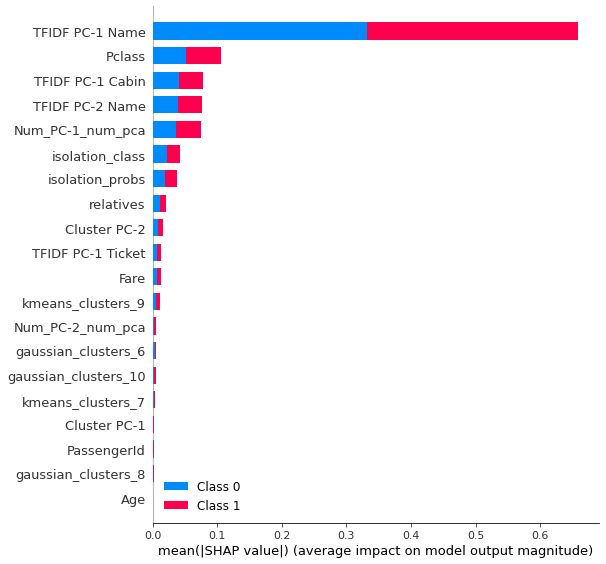

<Figure size 1152x864 with 0 Axes>

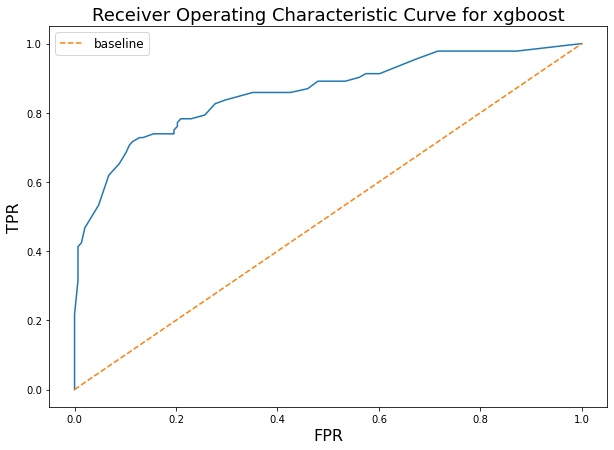

The ROC_AUC score is 0.857373678025852


The Matthew correlation is 0.6152975380231721
-------------------
The accuracy is 0.8208333333333333
The recall is 0.8208333333333333
The macro F1 score is 0.8056899700626989
The micro F1 score is 0.8208333333333333
The weighted F1 score is 0.8183471095127816
              precision    recall  f1-score   support

         0.0       0.83      0.89      0.86       148
         1.0       0.80      0.71      0.75        92

    accuracy                           0.82       240
   macro avg       0.82      0.80      0.81       240
weighted avg       0.82      0.82      0.82       240



Started Execute test train split at 16:11:59.
Started Started column type detection and casting at 16:11:59.
Started Checking for duplicate columns at 16:11:59.
Started Reset dataframe index. at 16:11:59.
Started Select best features at 16:11:59.
Started Delete columns with high share of NULLs at 16:11:59.
Started Apply datetime transformation at 16:11:59.
Started Start TFIDF to PCA loop at 16:11:59.
Started PCA POS tags at 16:11:59.
Started PCA POS tags at 16:11:59.
Started PCA POS tags at 16:11:59.
Started Handle rare features at 16:11:59.
Started Remove cardinality at 16:11:59.
Started Holistic NULL filling at 16:11:59.
Started Binarize numeric columns + PCA binarized features at 16:11:59.
Started Onehot + PCA categorical features at 16:11:59.
Started Execute categorical encoding at 16:11:59.
Started Fill nulls at 16:11:59.
Started Handle outliers at 16:11:59.
Started Remove collinearity at 16:11:59.
Started Remove skewness at 16:11:59.
Started Execute clustering as a feature at 16:

Score achieved on holdout dataset is: 0.6910356877129504.
End iteration for algorithm xgboost at 1637248321.3954792.
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Start iteration for algorithm lgbm at 1637248321.3964195.
Started Select best features at 16:12:01.
Features before selection are...PassengerId
Features before selection are...Pclass
Features before selection are...Age
Features before selection are...Fare
Features before selection are...Deck
Features before selection are...Title
Features before selection are...relatives
Features before selection are...Age_Class
Features before selection are...Fare_Per_Person
Features before selection are...Embarked
Features before selection are...Sex
Features before selection are...TFIDF PC-1 Ticket
Features before selection are...TFIDF PC-2 Ticket
Features before selection are...TFIDF PC-1 Cabin
Features before selection are...TFIDF PC-2 Cabin
Features before selection

[LightGBM] [Fatal] GPU Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_GPU=1
[I 2021-11-18 16:12:04,630] A new study created in memory with name: lgbm tuning


Started Sort columns alphabetically at 16:12:04.
Started Train LGBM at 16:12:04.
Started Check LGBM for GPU acceleration. at 16:12:04.
LGBM uses CPU.


  0%|          | 0/3 [00:00<?, ?it/s]

[I 2021-11-18 16:12:04,779] Trial 0 finished with value: 0.6914424453713064 and parameters: {'num_boost_round': 18789, 'lambda_l1': 506157.68887523044, 'lambda_l2': 24658.3294585491, 'num_leaves': 154, 'feature_fraction': 0.4936111842654619, 'feature_fraction_bynode': 0.49359671220172163, 'learning_rate': 1.7073967431528103e-05}. Best is trial 0 with value: 0.6914424453713064.
[I 2021-11-18 16:12:04,920] Trial 1 finished with value: 0.6914424453713064 and parameters: {'num_boost_round': 43323, 'lambda_l1': 4042.8727350273302, 'lambda_l2': 17718.847354806814, 'num_leaves': 7, 'feature_fraction': 0.9819459112971965, 'feature_fraction_bynode': 0.899465584480253, 'learning_rate': 7.068974950624602e-05}. Best is trial 0 with value: 0.6914424453713064.
[I 2021-11-18 16:12:18,921] Trial 2 finished with value: 0.4812727593252708 and parameters: {'num_boost_round': 9173, 'lambda_l1': 12.601639723276797, 'lambda_l2': 66.904211664988, 'num_leaves': 135, 'feature_fraction': 0.6591670111852694, 'fe

[1]	train's binary_logloss: 0.666523	valid's binary_logloss: 0.665437
Training until validation scores don't improve for 10 rounds
[2]	train's binary_logloss: 0.666187	valid's binary_logloss: 0.665127
[3]	train's binary_logloss: 0.665789	valid's binary_logloss: 0.664757
[4]	train's binary_logloss: 0.665498	valid's binary_logloss: 0.664486
[5]	train's binary_logloss: 0.665062	valid's binary_logloss: 0.664077
[6]	train's binary_logloss: 0.66465	valid's binary_logloss: 0.663705
[7]	train's binary_logloss: 0.664519	valid's binary_logloss: 0.663604
[8]	train's binary_logloss: 0.664254	valid's binary_logloss: 0.66336
[9]	train's binary_logloss: 0.664021	valid's binary_logloss: 0.66316
[10]	train's binary_logloss: 0.663773	valid's binary_logloss: 0.662951
[11]	train's binary_logloss: 0.663363	valid's binary_logloss: 0.662581
[12]	train's binary_logloss: 0.662954	valid's binary_logloss: 0.662272
[13]	train's binary_logloss: 0.662547	valid's binary_logloss: 0.661964
[14]	train's binary_logloss:

[439]	train's binary_logloss: 0.574101	valid's binary_logloss: 0.590133
[440]	train's binary_logloss: 0.573985	valid's binary_logloss: 0.590036
[441]	train's binary_logloss: 0.57374	valid's binary_logloss: 0.589838
[442]	train's binary_logloss: 0.573533	valid's binary_logloss: 0.589642
[443]	train's binary_logloss: 0.573469	valid's binary_logloss: 0.589606
[444]	train's binary_logloss: 0.573371	valid's binary_logloss: 0.589502
[445]	train's binary_logloss: 0.573316	valid's binary_logloss: 0.589517
[446]	train's binary_logloss: 0.573178	valid's binary_logloss: 0.5894
[447]	train's binary_logloss: 0.57309	valid's binary_logloss: 0.589333
[448]	train's binary_logloss: 0.573003	valid's binary_logloss: 0.589283
[449]	train's binary_logloss: 0.572907	valid's binary_logloss: 0.589205
[450]	train's binary_logloss: 0.572786	valid's binary_logloss: 0.589107
[451]	train's binary_logloss: 0.572704	valid's binary_logloss: 0.58903
[452]	train's binary_logloss: 0.572462	valid's binary_logloss: 0.5888

[1086]	train's binary_logloss: 0.505974	valid's binary_logloss: 0.534763
[1087]	train's binary_logloss: 0.5059	valid's binary_logloss: 0.534695
[1088]	train's binary_logloss: 0.505795	valid's binary_logloss: 0.53462
[1089]	train's binary_logloss: 0.505771	valid's binary_logloss: 0.534628
[1090]	train's binary_logloss: 0.505729	valid's binary_logloss: 0.5346
[1091]	train's binary_logloss: 0.505686	valid's binary_logloss: 0.534593
[1092]	train's binary_logloss: 0.505578	valid's binary_logloss: 0.534526
[1093]	train's binary_logloss: 0.505531	valid's binary_logloss: 0.534485
[1094]	train's binary_logloss: 0.505415	valid's binary_logloss: 0.534378
[1095]	train's binary_logloss: 0.505334	valid's binary_logloss: 0.534303
[1096]	train's binary_logloss: 0.505297	valid's binary_logloss: 0.534288
[1097]	train's binary_logloss: 0.505216	valid's binary_logloss: 0.534214
[1098]	train's binary_logloss: 0.50517	valid's binary_logloss: 0.534176
[1099]	train's binary_logloss: 0.5051	valid's binary_logl

[1560]	train's binary_logloss: 0.479268	valid's binary_logloss: 0.513054
[1561]	train's binary_logloss: 0.479247	valid's binary_logloss: 0.513034
[1562]	train's binary_logloss: 0.479176	valid's binary_logloss: 0.512973
[1563]	train's binary_logloss: 0.479143	valid's binary_logloss: 0.512952
[1564]	train's binary_logloss: 0.479077	valid's binary_logloss: 0.512894
[1565]	train's binary_logloss: 0.479039	valid's binary_logloss: 0.512857
[1566]	train's binary_logloss: 0.478968	valid's binary_logloss: 0.512809
[1567]	train's binary_logloss: 0.478952	valid's binary_logloss: 0.512798
[1568]	train's binary_logloss: 0.478881	valid's binary_logloss: 0.512757
[1569]	train's binary_logloss: 0.478829	valid's binary_logloss: 0.512707
[1570]	train's binary_logloss: 0.478759	valid's binary_logloss: 0.512653
[1571]	train's binary_logloss: 0.478688	valid's binary_logloss: 0.512605
[1572]	train's binary_logloss: 0.478661	valid's binary_logloss: 0.512581
[1573]	train's binary_logloss: 0.478618	valid's bin

[2128]	train's binary_logloss: 0.46031	valid's binary_logloss: 0.498311
[2129]	train's binary_logloss: 0.460292	valid's binary_logloss: 0.4983
[2130]	train's binary_logloss: 0.460274	valid's binary_logloss: 0.498284
[2131]	train's binary_logloss: 0.460237	valid's binary_logloss: 0.498248
[2132]	train's binary_logloss: 0.460225	valid's binary_logloss: 0.498246
[2133]	train's binary_logloss: 0.460211	valid's binary_logloss: 0.498239
[2134]	train's binary_logloss: 0.460179	valid's binary_logloss: 0.498213
[2135]	train's binary_logloss: 0.460135	valid's binary_logloss: 0.498186
[2136]	train's binary_logloss: 0.460132	valid's binary_logloss: 0.498183
[2137]	train's binary_logloss: 0.460087	valid's binary_logloss: 0.498144
[2138]	train's binary_logloss: 0.46004	valid's binary_logloss: 0.498099
[2139]	train's binary_logloss: 0.460015	valid's binary_logloss: 0.498076
[2140]	train's binary_logloss: 0.459975	valid's binary_logloss: 0.498042
[2141]	train's binary_logloss: 0.459939	valid's binary_

[2573]	train's binary_logloss: 0.450272	valid's binary_logloss: 0.490411
[2574]	train's binary_logloss: 0.450266	valid's binary_logloss: 0.490409
[2575]	train's binary_logloss: 0.450233	valid's binary_logloss: 0.490394
[2576]	train's binary_logloss: 0.450197	valid's binary_logloss: 0.49036
[2577]	train's binary_logloss: 0.450188	valid's binary_logloss: 0.49035
[2578]	train's binary_logloss: 0.450185	valid's binary_logloss: 0.490348
[2579]	train's binary_logloss: 0.450159	valid's binary_logloss: 0.490325
[2580]	train's binary_logloss: 0.450131	valid's binary_logloss: 0.490301
[2581]	train's binary_logloss: 0.450097	valid's binary_logloss: 0.490285
[2582]	train's binary_logloss: 0.450071	valid's binary_logloss: 0.490262
[2583]	train's binary_logloss: 0.450036	valid's binary_logloss: 0.490228
[2584]	train's binary_logloss: 0.450008	valid's binary_logloss: 0.4902
[2585]	train's binary_logloss: 0.449981	valid's binary_logloss: 0.490179
[2586]	train's binary_logloss: 0.449953	valid's binary_

[3322]	train's binary_logloss: 0.439721	valid's binary_logloss: 0.482066
[3323]	train's binary_logloss: 0.439717	valid's binary_logloss: 0.482062
[3324]	train's binary_logloss: 0.439714	valid's binary_logloss: 0.48206
[3325]	train's binary_logloss: 0.439714	valid's binary_logloss: 0.48206
[3326]	train's binary_logloss: 0.439713	valid's binary_logloss: 0.48206
[3327]	train's binary_logloss: 0.439712	valid's binary_logloss: 0.482059
[3328]	train's binary_logloss: 0.439705	valid's binary_logloss: 0.482053
[3329]	train's binary_logloss: 0.439688	valid's binary_logloss: 0.482039
[3330]	train's binary_logloss: 0.439688	valid's binary_logloss: 0.482039
[3331]	train's binary_logloss: 0.439686	valid's binary_logloss: 0.482037
[3332]	train's binary_logloss: 0.439663	valid's binary_logloss: 0.482017
[3333]	train's binary_logloss: 0.439663	valid's binary_logloss: 0.482017
[3334]	train's binary_logloss: 0.43966	valid's binary_logloss: 0.482015
[3335]	train's binary_logloss: 0.439659	valid's binary_

[4058]	train's binary_logloss: 0.434818	valid's binary_logloss: 0.477449
[4059]	train's binary_logloss: 0.434818	valid's binary_logloss: 0.477449
[4060]	train's binary_logloss: 0.434808	valid's binary_logloss: 0.47744
[4061]	train's binary_logloss: 0.434807	valid's binary_logloss: 0.477439
[4062]	train's binary_logloss: 0.434807	valid's binary_logloss: 0.477439
[4063]	train's binary_logloss: 0.43479	valid's binary_logloss: 0.477422
[4064]	train's binary_logloss: 0.434773	valid's binary_logloss: 0.477405
[4065]	train's binary_logloss: 0.434773	valid's binary_logloss: 0.477405
[4066]	train's binary_logloss: 0.434757	valid's binary_logloss: 0.477388
[4067]	train's binary_logloss: 0.434757	valid's binary_logloss: 0.477388
[4068]	train's binary_logloss: 0.434757	valid's binary_logloss: 0.477388
[4069]	train's binary_logloss: 0.434747	valid's binary_logloss: 0.477379
[4070]	train's binary_logloss: 0.434747	valid's binary_logloss: 0.477379
[4071]	train's binary_logloss: 0.434737	valid's binar

[4904]	train's binary_logloss: 0.430876	valid's binary_logloss: 0.473688
[4905]	train's binary_logloss: 0.430863	valid's binary_logloss: 0.473675
[4906]	train's binary_logloss: 0.430863	valid's binary_logloss: 0.473675
[4907]	train's binary_logloss: 0.430857	valid's binary_logloss: 0.47367
[4908]	train's binary_logloss: 0.430851	valid's binary_logloss: 0.473665
[4909]	train's binary_logloss: 0.430851	valid's binary_logloss: 0.473665
[4910]	train's binary_logloss: 0.430851	valid's binary_logloss: 0.473665
[4911]	train's binary_logloss: 0.430845	valid's binary_logloss: 0.473659
[4912]	train's binary_logloss: 0.430845	valid's binary_logloss: 0.473659
[4913]	train's binary_logloss: 0.430845	valid's binary_logloss: 0.473659
[4914]	train's binary_logloss: 0.430845	valid's binary_logloss: 0.473659
[4915]	train's binary_logloss: 0.430839	valid's binary_logloss: 0.473654
[4916]	train's binary_logloss: 0.430839	valid's binary_logloss: 0.473654
[4917]	train's binary_logloss: 0.430838	valid's bina

[5764]	train's binary_logloss: 0.428486	valid's binary_logloss: 0.471427
[5765]	train's binary_logloss: 0.428486	valid's binary_logloss: 0.471427
[5766]	train's binary_logloss: 0.428486	valid's binary_logloss: 0.471427
[5767]	train's binary_logloss: 0.428486	valid's binary_logloss: 0.471427
[5768]	train's binary_logloss: 0.428486	valid's binary_logloss: 0.471427
[5769]	train's binary_logloss: 0.428486	valid's binary_logloss: 0.471427
[5770]	train's binary_logloss: 0.428486	valid's binary_logloss: 0.471427
[5771]	train's binary_logloss: 0.428486	valid's binary_logloss: 0.471427
[5772]	train's binary_logloss: 0.428482	valid's binary_logloss: 0.471424
[5773]	train's binary_logloss: 0.428482	valid's binary_logloss: 0.471424
[5774]	train's binary_logloss: 0.428482	valid's binary_logloss: 0.471424
[5775]	train's binary_logloss: 0.428479	valid's binary_logloss: 0.47142
[5776]	train's binary_logloss: 0.428475	valid's binary_logloss: 0.471417
[5777]	train's binary_logloss: 0.428475	valid's bina

[6619]	train's binary_logloss: 0.427448	valid's binary_logloss: 0.470631
[6620]	train's binary_logloss: 0.427448	valid's binary_logloss: 0.470631
[6621]	train's binary_logloss: 0.427445	valid's binary_logloss: 0.47063
[6622]	train's binary_logloss: 0.427445	valid's binary_logloss: 0.47063
[6623]	train's binary_logloss: 0.427445	valid's binary_logloss: 0.47063
[6624]	train's binary_logloss: 0.427445	valid's binary_logloss: 0.47063
[6625]	train's binary_logloss: 0.427443	valid's binary_logloss: 0.470628
[6626]	train's binary_logloss: 0.427443	valid's binary_logloss: 0.470628
[6627]	train's binary_logloss: 0.42744	valid's binary_logloss: 0.470626
[6628]	train's binary_logloss: 0.42744	valid's binary_logloss: 0.470626
[6629]	train's binary_logloss: 0.427437	valid's binary_logloss: 0.470624
[6630]	train's binary_logloss: 0.427437	valid's binary_logloss: 0.470624
[6631]	train's binary_logloss: 0.427437	valid's binary_logloss: 0.470624
[6632]	train's binary_logloss: 0.427437	valid's binary_lo

Started Predict with LGBM at 16:12:21.
16:12:21


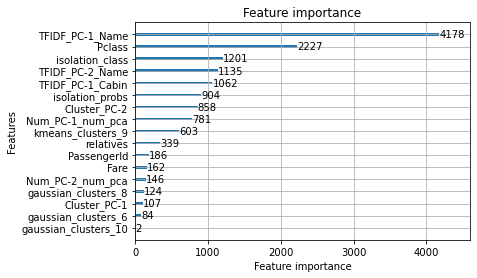

<Figure size 1152x864 with 0 Axes>

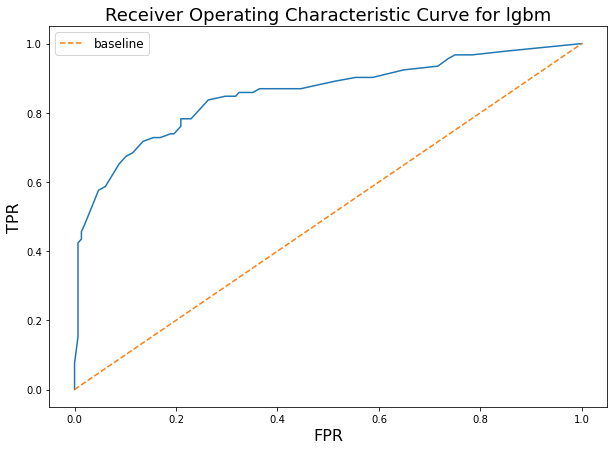

The ROC_AUC score is 0.8554641598119859


The Matthew correlation is 0.6064835814548096
-------------------
The accuracy is 0.8166666666666667
The recall is 0.8166666666666667
The macro F1 score is 0.7950151409270906
The micro F1 score is 0.8166666666666667
The weighted F1 score is 0.8105598260734529
              precision    recall  f1-score   support

         0.0       0.81      0.93      0.86       148
         1.0       0.84      0.64      0.73        92

    accuracy                           0.82       240
   macro avg       0.82      0.78      0.80       240
weighted avg       0.82      0.82      0.81       240



Started Execute test train split at 16:12:21.
Started Started column type detection and casting at 16:12:21.
Started Checking for duplicate columns at 16:12:21.
Started Reset dataframe index. at 16:12:21.
Started Select best features at 16:12:21.
Started Delete columns with high share of NULLs at 16:12:21.
Started Apply datetime transformation at 16:12:21.
Started Start TFIDF to PCA loop at 16:12:21.
Started PCA POS tags at 16:12:21.
Started PCA POS tags at 16:12:21.
Started PCA POS tags at 16:12:21.
Started Handle rare features at 16:12:21.
Started Remove cardinality at 16:12:21.
Started Holistic NULL filling at 16:12:21.
Started Binarize numeric columns + PCA binarized features at 16:12:21.
Started Onehot + PCA categorical features at 16:12:21.
Started Execute categorical encoding at 16:12:22.
Started Fill nulls at 16:12:22.
Started Handle outliers at 16:12:22.
Started Remove collinearity at 16:12:22.
Started Remove skewness at 16:12:22.
Started Execute clustering as a feature at 16:

Score achieved on holdout dataset is: 0.6905278313918173.
End iteration for algorithm lgbm at 1637248343.7114391.
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Start iteration for algorithm tabnet at 1637248343.7122676.
Started Select best features at 16:12:23.
Features before selection are...PassengerId
Features before selection are...Pclass
Features before selection are...Age
Features before selection are...Fare
Features before selection are...Deck
Features before selection are...Title
Features before selection are...relatives
Features before selection are...Age_Class
Features before selection are...Fare_Per_Person
Features before selection are...Embarked
Features before selection are...Sex
Features before selection are...TFIDF PC-1 Ticket
Features before selection are...TFIDF PC-2 Ticket
Features before selection are...TFIDF PC-1 Cabin
Features before selection are...TFIDF PC-2 Cabin
Features before selection 

[I 2021-11-18 16:12:27,706] A new study created in memory with name: tabnet tuning


Started Sort columns alphabetically at 16:12:27.
Started Train Tabnet classification model at 16:12:27.


  0%|          | 0/3 [00:00<?, ?it/s]

Device used : cuda
epoch 0  | loss: 23.32219| val_0_unsup_loss: 508.08813|  0:00:00s
epoch 1  | loss: 21.5462 | val_0_unsup_loss: 141.34975|  0:00:00s
epoch 2  | loss: 14.43551| val_0_unsup_loss: 9.89581 |  0:00:00s
epoch 3  | loss: 1.40159 | val_0_unsup_loss: 2.23538 |  0:00:00s
epoch 4  | loss: 12.05957| val_0_unsup_loss: 1.6703  |  0:00:01s
epoch 5  | loss: 1.88591 | val_0_unsup_loss: 1.40393 |  0:00:01s
epoch 6  | loss: 2.38692 | val_0_unsup_loss: 1.2754  |  0:00:01s
epoch 7  | loss: 1.32314 | val_0_unsup_loss: 1.27823 |  0:00:01s
epoch 8  | loss: 260920.28788| val_0_unsup_loss: 1.35403 |  0:00:01s
epoch 9  | loss: 1.18567 | val_0_unsup_loss: 1.32499 |  0:00:02s
epoch 10 | loss: 2.4179  | val_0_unsup_loss: 1.24713 |  0:00:02s
epoch 11 | loss: 2.52362 | val_0_unsup_loss: 1.1929  |  0:00:02s
epoch 12 | loss: 4.88564 | val_0_unsup_loss: 1.27987 |  0:00:02s
epoch 13 | loss: 1.66019 | val_0_unsup_loss: 1.3607  |  0:00:03s
epoch 14 | loss: 1.19835 | val_0_unsup_loss: 1.22576 |  0:00:03s


epoch 6  | loss: 0.48698 | val_0_matthews: 0.65514 |  0:00:01s
epoch 7  | loss: 0.51342 | val_0_matthews: 0.62705 |  0:00:01s
epoch 8  | loss: 0.51906 | val_0_matthews: 0.65514 |  0:00:01s
epoch 9  | loss: 0.51387 | val_0_matthews: 0.57319 |  0:00:01s
epoch 10 | loss: 0.5154  | val_0_matthews: 0.72111 |  0:00:02s
epoch 11 | loss: 0.47669 | val_0_matthews: 0.65514 |  0:00:02s
epoch 12 | loss: 0.47011 | val_0_matthews: 0.67359 |  0:00:02s
epoch 13 | loss: 0.48322 | val_0_matthews: 0.56576 |  0:00:02s
epoch 14 | loss: 0.51026 | val_0_matthews: 0.58532 |  0:00:02s
epoch 15 | loss: 0.52116 | val_0_matthews: 0.65514 |  0:00:03s
epoch 16 | loss: 0.50008 | val_0_matthews: 0.71416 |  0:00:03s
epoch 17 | loss: 0.46055 | val_0_matthews: 0.59628 |  0:00:03s
epoch 18 | loss: 0.46155 | val_0_matthews: 0.72895 |  0:00:03s
epoch 19 | loss: 0.48705 | val_0_matthews: 0.67082 |  0:00:03s
epoch 20 | loss: 0.45541 | val_0_matthews: 0.67359 |  0:00:04s
epoch 21 | loss: 0.53004 | val_0_matthews: 0.59977 |  0

epoch 10 | loss: 0.43993 | val_0_matthews: 0.46725 |  0:00:02s
epoch 11 | loss: 0.51358 | val_0_matthews: 0.39771 |  0:00:02s
epoch 12 | loss: 0.48984 | val_0_matthews: 0.47558 |  0:00:02s
epoch 13 | loss: 0.4936  | val_0_matthews: 0.3873  |  0:00:02s
epoch 14 | loss: 0.53398 | val_0_matthews: 0.47558 |  0:00:02s
epoch 15 | loss: 0.52463 | val_0_matthews: 0.40716 |  0:00:03s
epoch 16 | loss: 0.48396 | val_0_matthews: 0.27929 |  0:00:03s
epoch 17 | loss: 0.528   | val_0_matthews: 0.46725 |  0:00:03s
epoch 18 | loss: 0.49422 | val_0_matthews: 0.3873  |  0:00:03s
epoch 19 | loss: 0.46745 | val_0_matthews: 0.316   |  0:00:03s
epoch 20 | loss: 0.46994 | val_0_matthews: 0.43263 |  0:00:03s
epoch 21 | loss: 0.51996 | val_0_matthews: 0.46008 |  0:00:04s
epoch 22 | loss: 0.49401 | val_0_matthews: 0.42701 |  0:00:04s
epoch 23 | loss: 0.47398 | val_0_matthews: 0.42418 |  0:00:04s
epoch 24 | loss: 0.46508 | val_0_matthews: 0.35596 |  0:00:04s
epoch 25 | loss: 0.44314 | val_0_matthews: 0.35596 |  0

epoch 20 | loss: 0.54871 | val_0_matthews: 0.62437 |  0:00:04s
epoch 21 | loss: 0.54683 | val_0_matthews: 0.68354 |  0:00:04s
epoch 22 | loss: 0.49996 | val_0_matthews: 0.8165  |  0:00:04s
epoch 23 | loss: 0.49003 | val_0_matthews: 0.61406 |  0:00:04s
epoch 24 | loss: 0.51892 | val_0_matthews: 0.76603 |  0:00:04s
epoch 25 | loss: 0.51309 | val_0_matthews: 0.7303  |  0:00:04s
epoch 26 | loss: 0.48973 | val_0_matthews: 0.79909 |  0:00:05s
epoch 27 | loss: 0.50161 | val_0_matthews: 0.60104 |  0:00:05s
epoch 28 | loss: 0.48492 | val_0_matthews: 0.62437 |  0:00:05s
epoch 29 | loss: 0.49133 | val_0_matthews: 0.66502 |  0:00:05s
epoch 30 | loss: 0.5099  | val_0_matthews: 0.77575 |  0:00:05s
epoch 31 | loss: 0.50676 | val_0_matthews: 0.68354 |  0:00:06s
epoch 32 | loss: 0.4773  | val_0_matthews: 0.68354 |  0:00:06s
epoch 33 | loss: 0.48319 | val_0_matthews: 0.79909 |  0:00:06s
epoch 34 | loss: 0.52734 | val_0_matthews: 0.70427 |  0:00:06s
epoch 35 | loss: 0.46152 | val_0_matthews: 0.75757 |  0

epoch 74 | loss: 1.05322 | val_0_unsup_loss: 0.95449 |  0:00:16s
epoch 75 | loss: 1.03268 | val_0_unsup_loss: 0.93397 |  0:00:17s
epoch 76 | loss: 1.0593  | val_0_unsup_loss: 0.84782 |  0:00:17s
epoch 77 | loss: 1.49253 | val_0_unsup_loss: 0.87653 |  0:00:17s
epoch 78 | loss: 2.17058 | val_0_unsup_loss: 1.10713 |  0:00:17s
epoch 79 | loss: 1.04761 | val_0_unsup_loss: 1.26216 |  0:00:17s
epoch 80 | loss: 1.05113 | val_0_unsup_loss: 0.87803 |  0:00:18s
epoch 81 | loss: 2.75504 | val_0_unsup_loss: 0.99695 |  0:00:18s
epoch 82 | loss: 1.29268 | val_0_unsup_loss: 0.95722 |  0:00:18s
epoch 83 | loss: 3.03125 | val_0_unsup_loss: 0.96874 |  0:00:18s
epoch 84 | loss: 1.03729 | val_0_unsup_loss: 1.06024 |  0:00:19s
epoch 85 | loss: 1.07121 | val_0_unsup_loss: 0.86772 |  0:00:19s
epoch 86 | loss: 1.01019 | val_0_unsup_loss: 1.32706 |  0:00:19s
epoch 87 | loss: 1.03886 | val_0_unsup_loss: 1.15391 |  0:00:19s
epoch 88 | loss: 1.04797 | val_0_unsup_loss: 1.08039 |  0:00:19s
epoch 89 | loss: 1.0209  

epoch 10 | loss: 0.46492 | val_0_matthews: 0.54343 |  0:00:02s
epoch 11 | loss: 0.5115  | val_0_matthews: 0.54244 |  0:00:02s
epoch 12 | loss: 0.50092 | val_0_matthews: 0.54506 |  0:00:02s
epoch 13 | loss: 0.45271 | val_0_matthews: 0.6333  |  0:00:02s
epoch 14 | loss: 0.50997 | val_0_matthews: 0.46415 |  0:00:02s
epoch 15 | loss: 0.50787 | val_0_matthews: 0.43427 |  0:00:03s
epoch 16 | loss: 0.49335 | val_0_matthews: 0.54096 |  0:00:03s
epoch 17 | loss: 0.43455 | val_0_matthews: 0.40107 |  0:00:03s
epoch 18 | loss: 0.4974  | val_0_matthews: 0.5176  |  0:00:03s
epoch 19 | loss: 0.4706  | val_0_matthews: 0.47594 |  0:00:03s
epoch 20 | loss: 0.43209 | val_0_matthews: 0.50472 |  0:00:04s
epoch 21 | loss: 0.44443 | val_0_matthews: 0.45444 |  0:00:04s
epoch 22 | loss: 0.43109 | val_0_matthews: 0.44328 |  0:00:04s
epoch 23 | loss: 0.48325 | val_0_matthews: 0.58195 |  0:00:04s
epoch 24 | loss: 0.4543  | val_0_matthews: 0.45444 |  0:00:04s
epoch 25 | loss: 0.40887 | val_0_matthews: 0.54506 |  0

epoch 0  | loss: 0.63508 | val_0_matthews: 0.49672 |  0:00:00s
epoch 1  | loss: 0.57023 | val_0_matthews: 0.2908  |  0:00:00s
epoch 2  | loss: 0.56163 | val_0_matthews: 0.403   |  0:00:00s
epoch 3  | loss: 0.55029 | val_0_matthews: 0.35875 |  0:00:00s
epoch 4  | loss: 0.57473 | val_0_matthews: 0.43427 |  0:00:00s
epoch 5  | loss: 0.53589 | val_0_matthews: 0.5098  |  0:00:01s
epoch 6  | loss: 0.52212 | val_0_matthews: 0.53621 |  0:00:01s
epoch 7  | loss: 0.49927 | val_0_matthews: 0.39048 |  0:00:01s
epoch 8  | loss: 0.52155 | val_0_matthews: 0.54286 |  0:00:01s
epoch 9  | loss: 0.49462 | val_0_matthews: 0.55295 |  0:00:01s
epoch 10 | loss: 0.52963 | val_0_matthews: 0.58532 |  0:00:02s
epoch 11 | loss: 0.49411 | val_0_matthews: 0.57735 |  0:00:02s
epoch 12 | loss: 0.48247 | val_0_matthews: 0.6135  |  0:00:02s
epoch 13 | loss: 0.49065 | val_0_matthews: 0.5356  |  0:00:02s
epoch 14 | loss: 0.51555 | val_0_matthews: 0.46667 |  0:00:02s
epoch 15 | loss: 0.51159 | val_0_matthews: 0.50037 |  0

epoch 49 | loss: 1.08522 | val_0_unsup_loss: 1.22579 |  0:00:11s
epoch 50 | loss: 1.47879 | val_0_unsup_loss: 2.47623 |  0:00:11s
epoch 51 | loss: 1.31598 | val_0_unsup_loss: 2.08076 |  0:00:11s
epoch 52 | loss: 1.07291 | val_0_unsup_loss: 1.95981 |  0:00:11s
epoch 53 | loss: 1.48374 | val_0_unsup_loss: 2.96922 |  0:00:12s
epoch 54 | loss: 1.48767 | val_0_unsup_loss: 2.45649 |  0:00:12s
epoch 55 | loss: 1.07833 | val_0_unsup_loss: 1.46403 |  0:00:12s
epoch 56 | loss: 1.99517 | val_0_unsup_loss: 3.59867 |  0:00:12s
epoch 57 | loss: 1.33437 | val_0_unsup_loss: 2.06426 |  0:00:12s
epoch 58 | loss: 2.40888 | val_0_unsup_loss: 1.91052 |  0:00:13s
epoch 59 | loss: 1.07451 | val_0_unsup_loss: 4.90545 |  0:00:13s
epoch 60 | loss: 1.05711 | val_0_unsup_loss: 2.28763 |  0:00:13s
epoch 61 | loss: 1.61763 | val_0_unsup_loss: 10.3274 |  0:00:13s
epoch 62 | loss: 1.06227 | val_0_unsup_loss: 6.18108 |  0:00:14s
epoch 63 | loss: 6.34589 | val_0_unsup_loss: 2.58182 |  0:00:14s
epoch 64 | loss: 1.36374 

epoch 38 | loss: 1.90085 | val_0_unsup_loss: 1.37666 |  0:00:08s
epoch 39 | loss: 1.60178 | val_0_unsup_loss: 1.58808 |  0:00:08s
epoch 40 | loss: 1.91466 | val_0_unsup_loss: 1.83264 |  0:00:08s
epoch 41 | loss: 1.52446 | val_0_unsup_loss: 1.97304 |  0:00:09s
epoch 42 | loss: 1.35492 | val_0_unsup_loss: 1.3714  |  0:00:09s
epoch 43 | loss: 1.09637 | val_0_unsup_loss: 2.11286 |  0:00:09s
epoch 44 | loss: 1.10495 | val_0_unsup_loss: 1.68707 |  0:00:09s
epoch 45 | loss: 2.14363 | val_0_unsup_loss: 1.95627 |  0:00:09s
epoch 46 | loss: 1.06939 | val_0_unsup_loss: 2.04479 |  0:00:10s
epoch 47 | loss: 2.01596 | val_0_unsup_loss: 3.09934 |  0:00:10s
epoch 48 | loss: 1.42965 | val_0_unsup_loss: 1.60491 |  0:00:10s
epoch 49 | loss: 2.6022  | val_0_unsup_loss: 1.81604 |  0:00:10s
epoch 50 | loss: 1.46201 | val_0_unsup_loss: 1.81552 |  0:00:11s
epoch 51 | loss: 1.88185 | val_0_unsup_loss: 4.92402 |  0:00:11s
epoch 52 | loss: 1.55775 | val_0_unsup_loss: 3.63526 |  0:00:11s
epoch 53 | loss: 1.05322 

epoch 31 | loss: 1.47345 | val_0_unsup_loss: 1.12029 |  0:00:07s
epoch 32 | loss: 3.2372  | val_0_unsup_loss: 1.00628 |  0:00:07s
epoch 33 | loss: 2.06833 | val_0_unsup_loss: 1.02955 |  0:00:07s
epoch 34 | loss: 1.08396 | val_0_unsup_loss: 1.12307 |  0:00:07s
epoch 35 | loss: 4.8276  | val_0_unsup_loss: 1.12414 |  0:00:07s
epoch 36 | loss: 2.84535 | val_0_unsup_loss: 5.78572 |  0:00:08s
epoch 37 | loss: 1.07711 | val_0_unsup_loss: 1.91515 |  0:00:08s
epoch 38 | loss: 3.23717 | val_0_unsup_loss: 1.30675 |  0:00:08s
epoch 39 | loss: 1.44836 | val_0_unsup_loss: 1.30351 |  0:00:08s
epoch 40 | loss: 1.39993 | val_0_unsup_loss: 1.80305 |  0:00:09s
epoch 41 | loss: 1.06991 | val_0_unsup_loss: 2.79921 |  0:00:09s
epoch 42 | loss: 2.86305 | val_0_unsup_loss: 3.97853 |  0:00:09s
epoch 43 | loss: 1.69351 | val_0_unsup_loss: 3.24261 |  0:00:09s
epoch 44 | loss: 2.28117 | val_0_unsup_loss: 2.27167 |  0:00:09s
epoch 45 | loss: 2.4679  | val_0_unsup_loss: 4.51156 |  0:00:10s
epoch 46 | loss: 3.11723 

epoch 11 | loss: 1.17028 | val_0_unsup_loss: 1.59027 |  0:00:02s
epoch 12 | loss: 1.15242 | val_0_unsup_loss: 1.78734 |  0:00:02s
epoch 13 | loss: 1.14262 | val_0_unsup_loss: 1.98213 |  0:00:03s
epoch 14 | loss: 1.20028 | val_0_unsup_loss: 1.29726 |  0:00:03s
epoch 15 | loss: 65.14949| val_0_unsup_loss: 1.14002 |  0:00:03s
epoch 16 | loss: 1.47063 | val_0_unsup_loss: 1.1924  |  0:00:03s
epoch 17 | loss: 1.14378 | val_0_unsup_loss: 1.10367 |  0:00:04s
epoch 18 | loss: 1.56117 | val_0_unsup_loss: 1.13253 |  0:00:04s
epoch 19 | loss: 1.10713 | val_0_unsup_loss: 1.08726 |  0:00:04s
epoch 20 | loss: 1.94341 | val_0_unsup_loss: 1.22052 |  0:00:04s
epoch 21 | loss: 1.61507 | val_0_unsup_loss: 1.07796 |  0:00:04s
epoch 22 | loss: 1.3214  | val_0_unsup_loss: 1.07867 |  0:00:05s
epoch 23 | loss: 1.09135 | val_0_unsup_loss: 1.08641 |  0:00:05s
epoch 24 | loss: 1.09729 | val_0_unsup_loss: 0.97821 |  0:00:05s
epoch 25 | loss: 3.38932 | val_0_unsup_loss: 0.99225 |  0:00:05s
epoch 26 | loss: 1.10333 

epoch 138| loss: 1.91213 | val_0_unsup_loss: 0.85545 |  0:00:31s
epoch 139| loss: 2.07142 | val_0_unsup_loss: 0.87215 |  0:00:31s
epoch 140| loss: 0.94557 | val_0_unsup_loss: 0.83093 |  0:00:31s
epoch 141| loss: 0.97323 | val_0_unsup_loss: 0.79186 |  0:00:31s
epoch 142| loss: 0.94059 | val_0_unsup_loss: 1.00838 |  0:00:31s
epoch 143| loss: 1.29196 | val_0_unsup_loss: 54.74722|  0:00:32s
epoch 144| loss: 5.67327 | val_0_unsup_loss: 0.81105 |  0:00:32s
epoch 145| loss: 8.51742 | val_0_unsup_loss: 0.83236 |  0:00:32s
epoch 146| loss: 1.36818 | val_0_unsup_loss: 0.77877 |  0:00:32s
epoch 147| loss: 1.19794 | val_0_unsup_loss: 0.85802 |  0:00:32s
epoch 148| loss: 11.01481| val_0_unsup_loss: 0.78887 |  0:00:33s
epoch 149| loss: 5.41138 | val_0_unsup_loss: 0.87806 |  0:00:33s
epoch 150| loss: 2.6225  | val_0_unsup_loss: 2.95136 |  0:00:33s
epoch 151| loss: 2.16272 | val_0_unsup_loss: 0.84627 |  0:00:33s
epoch 152| loss: 1.57665 | val_0_unsup_loss: 0.87316 |  0:00:34s
epoch 153| loss: 2.34615 

epoch 4  | loss: 0.5659  | val_0_matthews: 0.52885 |  0:00:00s
epoch 5  | loss: 0.51663 | val_0_matthews: 0.56576 |  0:00:01s
epoch 6  | loss: 0.52324 | val_0_matthews: 0.56576 |  0:00:01s
epoch 7  | loss: 0.48596 | val_0_matthews: 0.45444 |  0:00:01s
epoch 8  | loss: 0.51526 | val_0_matthews: 0.49156 |  0:00:01s
epoch 9  | loss: 0.51563 | val_0_matthews: 0.45444 |  0:00:01s
epoch 10 | loss: 0.51426 | val_0_matthews: 0.45516 |  0:00:02s
epoch 11 | loss: 0.51971 | val_0_matthews: 0.52799 |  0:00:02s
epoch 12 | loss: 0.49194 | val_0_matthews: 0.4227  |  0:00:02s
epoch 13 | loss: 0.45833 | val_0_matthews: 0.46045 |  0:00:02s
epoch 14 | loss: 0.43688 | val_0_matthews: 0.52885 |  0:00:02s
epoch 15 | loss: 0.45855 | val_0_matthews: 0.53012 |  0:00:03s
epoch 16 | loss: 0.4971  | val_0_matthews: 0.60154 |  0:00:03s
epoch 17 | loss: 0.46933 | val_0_matthews: 0.56576 |  0:00:03s
epoch 18 | loss: 0.50572 | val_0_matthews: 0.56576 |  0:00:03s
epoch 19 | loss: 0.50875 | val_0_matthews: 0.56576 |  0

epoch 60 | loss: 1.93957 | val_0_unsup_loss: 1.44718 |  0:00:13s
epoch 61 | loss: 1.04292 | val_0_unsup_loss: 1.7412  |  0:00:13s
epoch 62 | loss: 2.78515 | val_0_unsup_loss: 1.82483 |  0:00:14s
epoch 63 | loss: 1.04607 | val_0_unsup_loss: 2.3806  |  0:00:14s
epoch 64 | loss: 7.25373 | val_0_unsup_loss: 1.70416 |  0:00:14s

Early stopping occurred at epoch 64 with best_epoch = 34 and best_val_0_unsup_loss = 0.97481
Best weights from best epoch are automatically used!
Device used : cuda
Loading weights from unsupervised pretraining
epoch 0  | loss: 0.63686 | val_0_matthews: 0.38019 |  0:00:00s
epoch 1  | loss: 0.63968 | val_0_matthews: 0.14907 |  0:00:00s
epoch 2  | loss: 0.63994 | val_0_matthews: 0.30522 |  0:00:00s
epoch 3  | loss: 0.57767 | val_0_matthews: 0.43829 |  0:00:00s
epoch 4  | loss: 0.61662 | val_0_matthews: 0.34427 |  0:00:00s
epoch 5  | loss: 0.59358 | val_0_matthews: 0.33172 |  0:00:01s
epoch 6  | loss: 0.56335 | val_0_matthews: 0.40881 |  0:00:01s
epoch 7  | loss: 0.559

epoch 0  | loss: 0.65906 | val_0_matthews: 0.42174 |  0:00:00s
epoch 1  | loss: 0.60718 | val_0_matthews: 0.39882 |  0:00:00s
epoch 2  | loss: 0.58479 | val_0_matthews: 0.47951 |  0:00:01s
epoch 3  | loss: 0.54119 | val_0_matthews: 0.46667 |  0:00:01s
epoch 4  | loss: 0.54564 | val_0_matthews: 0.37102 |  0:00:01s
epoch 5  | loss: 0.50463 | val_0_matthews: 0.44721 |  0:00:02s
epoch 6  | loss: 0.51708 | val_0_matthews: 0.59977 |  0:00:02s
epoch 7  | loss: 0.48499 | val_0_matthews: 0.55328 |  0:00:02s
epoch 8  | loss: 0.54428 | val_0_matthews: 0.58132 |  0:00:03s
epoch 9  | loss: 0.50723 | val_0_matthews: 0.49672 |  0:00:03s
epoch 10 | loss: 0.50913 | val_0_matthews: 0.49923 |  0:00:03s
epoch 11 | loss: 0.47434 | val_0_matthews: 0.64667 |  0:00:04s
epoch 12 | loss: 0.51696 | val_0_matthews: 0.62141 |  0:00:04s
epoch 13 | loss: 0.5163  | val_0_matthews: 0.57169 |  0:00:04s
epoch 14 | loss: 0.43878 | val_0_matthews: 0.62705 |  0:00:05s
epoch 15 | loss: 0.46261 | val_0_matthews: 0.43368 |  0

epoch 48 | loss: 1.08763 | val_0_unsup_loss: 1.3624  |  0:00:21s
epoch 49 | loss: 2.9278  | val_0_unsup_loss: 1.73951 |  0:00:21s

Early stopping occurred at epoch 49 with best_epoch = 19 and best_val_0_unsup_loss = 0.93039
Best weights from best epoch are automatically used!
Device used : cuda
Loading weights from unsupervised pretraining
epoch 0  | loss: 0.6345  | val_0_matthews: 0.16896 |  0:00:00s
epoch 1  | loss: 0.5713  | val_0_matthews: 0.316   |  0:00:00s
epoch 2  | loss: 0.51584 | val_0_matthews: 0.16641 |  0:00:01s
epoch 3  | loss: 0.54969 | val_0_matthews: 0.12403 |  0:00:01s
epoch 4  | loss: 0.52676 | val_0_matthews: 0.14872 |  0:00:01s
epoch 5  | loss: 0.48531 | val_0_matthews: 0.39667 |  0:00:02s
epoch 6  | loss: 0.44349 | val_0_matthews: 0.49749 |  0:00:02s
epoch 7  | loss: 0.54567 | val_0_matthews: 0.35385 |  0:00:02s
epoch 8  | loss: 0.50829 | val_0_matthews: 0.10032 |  0:00:03s
epoch 9  | loss: 0.4512  | val_0_matthews: 0.50929 |  0:00:03s
epoch 10 | loss: 0.43424 | v

epoch 67 | loss: 1.68222 | val_0_unsup_loss: 15.48263|  0:00:29s
epoch 68 | loss: 1.30435 | val_0_unsup_loss: 24.68322|  0:00:29s
epoch 69 | loss: 3.4141  | val_0_unsup_loss: 14.90719|  0:00:30s
epoch 70 | loss: 1.48012 | val_0_unsup_loss: 14.02693|  0:00:30s

Early stopping occurred at epoch 70 with best_epoch = 40 and best_val_0_unsup_loss = 0.87425
Best weights from best epoch are automatically used!
Device used : cuda
Loading weights from unsupervised pretraining
epoch 0  | loss: 0.63562 | val_0_matthews: 0.28427 |  0:00:00s
epoch 1  | loss: 0.56054 | val_0_matthews: 0.46785 |  0:00:00s
epoch 2  | loss: 0.5768  | val_0_matthews: 0.03651 |  0:00:01s
epoch 3  | loss: 0.556   | val_0_matthews: 0.24772 |  0:00:01s
epoch 4  | loss: 0.5278  | val_0_matthews: 0.40825 |  0:00:01s
epoch 5  | loss: 0.50786 | val_0_matthews: 0.528   |  0:00:02s
epoch 6  | loss: 0.54628 | val_0_matthews: 0.66502 |  0:00:02s
epoch 7  | loss: 0.49661 | val_0_matthews: 0.5625  |  0:00:02s
epoch 8  | loss: 0.5578 

epoch 12 | loss: 0.4819  | val_0_matthews: 0.41165 |  0:00:04s
epoch 13 | loss: 0.46276 | val_0_matthews: 0.43427 |  0:00:04s
epoch 14 | loss: 0.49215 | val_0_matthews: 0.36895 |  0:00:05s
epoch 15 | loss: 0.47817 | val_0_matthews: 0.5176  |  0:00:05s
epoch 16 | loss: 0.4241  | val_0_matthews: 0.49749 |  0:00:05s
epoch 17 | loss: 0.421   | val_0_matthews: 0.5098  |  0:00:06s
epoch 18 | loss: 0.46249 | val_0_matthews: 0.39462 |  0:00:06s
epoch 19 | loss: 0.44245 | val_0_matthews: 0.46779 |  0:00:06s
epoch 20 | loss: 0.41396 | val_0_matthews: 0.36895 |  0:00:07s
epoch 21 | loss: 0.44984 | val_0_matthews: 0.47594 |  0:00:07s
epoch 22 | loss: 0.42246 | val_0_matthews: 0.43427 |  0:00:07s
epoch 23 | loss: 0.44936 | val_0_matthews: 0.40107 |  0:00:08s
epoch 24 | loss: 0.38452 | val_0_matthews: 0.43427 |  0:00:08s
epoch 25 | loss: 0.41827 | val_0_matthews: 0.46779 |  0:00:08s
epoch 26 | loss: 0.43963 | val_0_matthews: 0.43427 |  0:00:09s
epoch 27 | loss: 0.38462 | val_0_matthews: 0.44328 |  0

epoch 35 | loss: 0.42514 | val_0_matthews: 0.54286 |  0:00:12s
epoch 36 | loss: 0.375   | val_0_matthews: 0.61905 |  0:00:12s
epoch 37 | loss: 0.40957 | val_0_matthews: 0.57735 |  0:00:12s
epoch 38 | loss: 0.37688 | val_0_matthews: 0.61905 |  0:00:13s
epoch 39 | loss: 0.33562 | val_0_matthews: 0.55295 |  0:00:13s
epoch 40 | loss: 0.42219 | val_0_matthews: 0.49362 |  0:00:13s
epoch 41 | loss: 0.37907 | val_0_matthews: 0.67082 |  0:00:14s
epoch 42 | loss: 0.38206 | val_0_matthews: 0.5098  |  0:00:14s
epoch 43 | loss: 0.38375 | val_0_matthews: 0.58532 |  0:00:15s
epoch 44 | loss: 0.37154 | val_0_matthews: 0.56576 |  0:00:15s
epoch 45 | loss: 0.37305 | val_0_matthews: 0.50037 |  0:00:15s
epoch 46 | loss: 0.36971 | val_0_matthews: 0.66085 |  0:00:16s
epoch 47 | loss: 0.32238 | val_0_matthews: 0.50037 |  0:00:16s
epoch 48 | loss: 0.32566 | val_0_matthews: 0.53621 |  0:00:16s
epoch 49 | loss: 0.38965 | val_0_matthews: 0.35131 |  0:00:16s
epoch 50 | loss: 0.42164 | val_0_matthews: 0.42339 |  0

epoch 21 | loss: 0.40109 | val_0_matthews: 0.40234 |  0:00:07s
epoch 22 | loss: 0.38962 | val_0_matthews: 0.48737 |  0:00:07s
epoch 23 | loss: 0.36839 | val_0_matthews: 0.44446 |  0:00:08s
epoch 24 | loss: 0.46219 | val_0_matthews: 0.44446 |  0:00:08s
epoch 25 | loss: 0.38413 | val_0_matthews: 0.51681 |  0:00:08s
epoch 26 | loss: 0.45634 | val_0_matthews: 0.47455 |  0:00:09s
epoch 27 | loss: 0.39989 | val_0_matthews: 0.41667 |  0:00:09s
epoch 28 | loss: 0.346   | val_0_matthews: 0.52391 |  0:00:09s
epoch 29 | loss: 0.41253 | val_0_matthews: 0.49614 |  0:00:10s
epoch 30 | loss: 0.39256 | val_0_matthews: 0.52885 |  0:00:10s
epoch 31 | loss: 0.42114 | val_0_matthews: 0.52885 |  0:00:10s
epoch 32 | loss: 0.34569 | val_0_matthews: 0.46424 |  0:00:11s
epoch 33 | loss: 0.42846 | val_0_matthews: 0.41478 |  0:00:11s
epoch 34 | loss: 0.37597 | val_0_matthews: 0.52885 |  0:00:11s
epoch 35 | loss: 0.38692 | val_0_matthews: 0.46424 |  0:00:12s
epoch 36 | loss: 0.39541 | val_0_matthews: 0.44446 |  0

epoch 72 | loss: 1.1008  | val_0_unsup_loss: 1.84867 |  0:00:31s
epoch 73 | loss: 1.45698 | val_0_unsup_loss: 2.27944 |  0:00:31s
epoch 74 | loss: 1.1076  | val_0_unsup_loss: 4.32414 |  0:00:32s
epoch 75 | loss: 1.09847 | val_0_unsup_loss: 2.09242 |  0:00:32s
epoch 76 | loss: 1.67087 | val_0_unsup_loss: 3.73672 |  0:00:32s
epoch 77 | loss: 1.73925 | val_0_unsup_loss: 2.91261 |  0:00:33s
epoch 78 | loss: 2.50044 | val_0_unsup_loss: 2.08338 |  0:00:33s
epoch 79 | loss: 1.07463 | val_0_unsup_loss: 3.12628 |  0:00:34s
epoch 80 | loss: 1.05941 | val_0_unsup_loss: 8.98731 |  0:00:34s

Early stopping occurred at epoch 80 with best_epoch = 50 and best_val_0_unsup_loss = 0.92687
Best weights from best epoch are automatically used!
Device used : cuda
Loading weights from unsupervised pretraining
epoch 0  | loss: 0.62215 | val_0_matthews: 0.34953 |  0:00:00s
epoch 1  | loss: 0.58311 | val_0_matthews: 0.34364 |  0:00:00s
epoch 2  | loss: 0.55988 | val_0_matthews: 0.47558 |  0:00:01s
epoch 3  | los

epoch 10 | loss: 0.51284 | val_0_matthews: 0.53645 |  0:00:03s
epoch 11 | loss: 0.45109 | val_0_matthews: 0.55943 |  0:00:04s
epoch 12 | loss: 0.52001 | val_0_matthews: 0.67061 |  0:00:04s
epoch 13 | loss: 0.45001 | val_0_matthews: 0.66152 |  0:00:04s
epoch 14 | loss: 0.4976  | val_0_matthews: 0.74536 |  0:00:05s
epoch 15 | loss: 0.4799  | val_0_matthews: 0.52175 |  0:00:05s
epoch 16 | loss: 0.45622 | val_0_matthews: 0.58916 |  0:00:05s
epoch 17 | loss: 0.42229 | val_0_matthews: 0.6912  |  0:00:06s
epoch 18 | loss: 0.45879 | val_0_matthews: 0.6333  |  0:00:06s
epoch 19 | loss: 0.47252 | val_0_matthews: 0.67402 |  0:00:06s
epoch 20 | loss: 0.46576 | val_0_matthews: 0.70719 |  0:00:07s
epoch 21 | loss: 0.4154  | val_0_matthews: 0.56849 |  0:00:07s
epoch 22 | loss: 0.43936 | val_0_matthews: 0.5625  |  0:00:07s
epoch 23 | loss: 0.45426 | val_0_matthews: 0.63542 |  0:00:08s
epoch 24 | loss: 0.39126 | val_0_matthews: 0.63542 |  0:00:08s
epoch 25 | loss: 0.44909 | val_0_matthews: 0.56849 |  0

epoch 21 | loss: 0.39575 | val_0_matthews: 0.53012 |  0:00:07s
epoch 22 | loss: 0.39313 | val_0_matthews: 0.61257 |  0:00:07s
epoch 23 | loss: 0.44228 | val_0_matthews: 0.60509 |  0:00:08s
epoch 24 | loss: 0.42158 | val_0_matthews: 0.45444 |  0:00:08s
epoch 25 | loss: 0.40568 | val_0_matthews: 0.45874 |  0:00:08s
epoch 26 | loss: 0.35799 | val_0_matthews: 0.51131 |  0:00:09s
epoch 27 | loss: 0.40845 | val_0_matthews: 0.57037 |  0:00:09s
epoch 28 | loss: 0.37625 | val_0_matthews: 0.4945  |  0:00:09s
epoch 29 | loss: 0.3565  | val_0_matthews: 0.53012 |  0:00:10s
epoch 30 | loss: 0.40799 | val_0_matthews: 0.60509 |  0:00:10s
epoch 31 | loss: 0.37235 | val_0_matthews: 0.63871 |  0:00:10s
epoch 32 | loss: 0.42695 | val_0_matthews: 0.53566 |  0:00:11s
epoch 33 | loss: 0.38457 | val_0_matthews: 0.49936 |  0:00:11s
epoch 34 | loss: 0.40914 | val_0_matthews: 0.57037 |  0:00:11s
epoch 35 | loss: 0.41305 | val_0_matthews: 0.42194 |  0:00:12s
epoch 36 | loss: 0.40164 | val_0_matthews: 0.45516 |  0

epoch 0  | loss: 0.6259  | val_0_matthews: 0.43829 |  0:00:00s
epoch 1  | loss: 0.56903 | val_0_matthews: 0.31925 |  0:00:00s
epoch 2  | loss: 0.5268  | val_0_matthews: 0.49545 |  0:00:01s
epoch 3  | loss: 0.5355  | val_0_matthews: 0.41957 |  0:00:01s
epoch 4  | loss: 0.49651 | val_0_matthews: 0.37778 |  0:00:01s
epoch 5  | loss: 0.57021 | val_0_matthews: 0.29433 |  0:00:02s
epoch 6  | loss: 0.52687 | val_0_matthews: 0.42701 |  0:00:02s
epoch 7  | loss: 0.47179 | val_0_matthews: 0.53012 |  0:00:02s
epoch 8  | loss: 0.45976 | val_0_matthews: 0.51404 |  0:00:03s
epoch 9  | loss: 0.47501 | val_0_matthews: 0.45516 |  0:00:03s
epoch 10 | loss: 0.45893 | val_0_matthews: 0.44721 |  0:00:03s
epoch 11 | loss: 0.42417 | val_0_matthews: 0.44721 |  0:00:04s
epoch 12 | loss: 0.48171 | val_0_matthews: 0.42339 |  0:00:04s
epoch 13 | loss: 0.4282  | val_0_matthews: 0.50173 |  0:00:04s
epoch 14 | loss: 0.42932 | val_0_matthews: 0.53012 |  0:00:05s
epoch 15 | loss: 0.44019 | val_0_matthews: 0.51404 |  0

epoch 37 | loss: 1.47157 | val_0_unsup_loss: 1.09954 |  0:00:06s
epoch 38 | loss: 3.10374 | val_0_unsup_loss: 1.03376 |  0:00:06s
epoch 39 | loss: 1.32635 | val_0_unsup_loss: 1.03842 |  0:00:07s
epoch 40 | loss: 4.01937 | val_0_unsup_loss: 1.06047 |  0:00:07s
epoch 41 | loss: 1.41339 | val_0_unsup_loss: 1.07014 |  0:00:07s
epoch 42 | loss: 2.66159 | val_0_unsup_loss: 1.03442 |  0:00:07s
epoch 43 | loss: 1.10219 | val_0_unsup_loss: 1.43144 |  0:00:07s
epoch 44 | loss: 1.11172 | val_0_unsup_loss: 1.1     |  0:00:08s
epoch 45 | loss: 2.38264 | val_0_unsup_loss: 1.29974 |  0:00:08s
epoch 46 | loss: 1.18256 | val_0_unsup_loss: 1.34428 |  0:00:08s
epoch 47 | loss: 1.53501 | val_0_unsup_loss: 1.01755 |  0:00:08s
epoch 48 | loss: 2.05866 | val_0_unsup_loss: 1.15138 |  0:00:08s
epoch 49 | loss: 1.60957 | val_0_unsup_loss: 1.30721 |  0:00:08s
epoch 50 | loss: 8.23818 | val_0_unsup_loss: 1.22017 |  0:00:09s
epoch 51 | loss: 1.2819  | val_0_unsup_loss: 1.33075 |  0:00:09s
epoch 52 | loss: 1.06942 

epoch 22 | loss: 0.5032  | val_0_matthews: 0.69524 |  0:00:03s
epoch 23 | loss: 0.49708 | val_0_matthews: 0.57735 |  0:00:03s
epoch 24 | loss: 0.47963 | val_0_matthews: 0.61905 |  0:00:03s
epoch 25 | loss: 0.46707 | val_0_matthews: 0.73637 |  0:00:04s
epoch 26 | loss: 0.51217 | val_0_matthews: 0.65158 |  0:00:04s
epoch 27 | loss: 0.47191 | val_0_matthews: 0.57155 |  0:00:04s
epoch 28 | loss: 0.47619 | val_0_matthews: 0.65433 |  0:00:04s
epoch 29 | loss: 0.45219 | val_0_matthews: 0.61428 |  0:00:04s
epoch 30 | loss: 0.46968 | val_0_matthews: 0.68413 |  0:00:04s
epoch 31 | loss: 0.45825 | val_0_matthews: 0.69524 |  0:00:04s
epoch 32 | loss: 0.39034 | val_0_matthews: 0.73131 |  0:00:05s
epoch 33 | loss: 0.43893 | val_0_matthews: 0.73131 |  0:00:05s
epoch 34 | loss: 0.46041 | val_0_matthews: 0.77143 |  0:00:05s
epoch 35 | loss: 0.42176 | val_0_matthews: 0.73637 |  0:00:05s
epoch 36 | loss: 0.41359 | val_0_matthews: 0.7029  |  0:00:05s
epoch 37 | loss: 0.42343 | val_0_matthews: 0.66085 |  0

epoch 82 | loss: 1.40634 | val_0_unsup_loss: 1.85155 |  0:00:14s
epoch 83 | loss: 1.3786  | val_0_unsup_loss: 1.47526 |  0:00:14s
epoch 84 | loss: 1.17455 | val_0_unsup_loss: 2.51226 |  0:00:14s
epoch 85 | loss: 1.0181  | val_0_unsup_loss: 2.57464 |  0:00:15s
epoch 86 | loss: 2.32837 | val_0_unsup_loss: 2.77093 |  0:00:15s
epoch 87 | loss: 1.07456 | val_0_unsup_loss: 3.3843  |  0:00:15s
epoch 88 | loss: 1.17418 | val_0_unsup_loss: 3.68102 |  0:00:15s
epoch 89 | loss: 1.04963 | val_0_unsup_loss: 2.96791 |  0:00:15s
epoch 90 | loss: 1.17648 | val_0_unsup_loss: 4.1321  |  0:00:15s
epoch 91 | loss: 1.02535 | val_0_unsup_loss: 1.67645 |  0:00:16s
epoch 92 | loss: 1.22026 | val_0_unsup_loss: 1.06625 |  0:00:16s
epoch 93 | loss: 1.03885 | val_0_unsup_loss: 0.97708 |  0:00:16s
epoch 94 | loss: 1.77144 | val_0_unsup_loss: 1.02865 |  0:00:16s
epoch 95 | loss: 1.05534 | val_0_unsup_loss: 3.32398 |  0:00:16s

Early stopping occurred at epoch 95 with best_epoch = 65 and best_val_0_unsup_loss = 0.94

epoch 1  | loss: 0.6235  | val_0_matthews: 0.0     |  0:00:00s
epoch 2  | loss: 0.61481 | val_0_matthews: 0.0     |  0:00:00s
epoch 3  | loss: 0.57499 | val_0_matthews: 0.26138 |  0:00:00s
epoch 4  | loss: 0.58674 | val_0_matthews: 0.15138 |  0:00:00s
epoch 5  | loss: 0.55114 | val_0_matthews: 0.30763 |  0:00:00s
epoch 6  | loss: 0.56158 | val_0_matthews: 0.19365 |  0:00:01s
epoch 7  | loss: 0.58077 | val_0_matthews: 0.475   |  0:00:01s
epoch 8  | loss: 0.54596 | val_0_matthews: 0.5625  |  0:00:01s
epoch 9  | loss: 0.55081 | val_0_matthews: 0.16432 |  0:00:01s
epoch 10 | loss: 0.51677 | val_0_matthews: 0.42758 |  0:00:01s
epoch 11 | loss: 0.50036 | val_0_matthews: 0.49488 |  0:00:01s
epoch 12 | loss: 0.50813 | val_0_matthews: 0.68858 |  0:00:02s
epoch 13 | loss: 0.48514 | val_0_matthews: 0.59932 |  0:00:02s
epoch 14 | loss: 0.50518 | val_0_matthews: 0.53079 |  0:00:02s
epoch 15 | loss: 0.49816 | val_0_matthews: 0.66502 |  0:00:02s
epoch 16 | loss: 0.47416 | val_0_matthews: 0.63212 |  0

epoch 14 | loss: 0.46223 | val_0_matthews: 0.37998 |  0:00:02s
epoch 15 | loss: 0.47928 | val_0_matthews: 0.4275  |  0:00:02s
epoch 16 | loss: 0.47223 | val_0_matthews: 0.25053 |  0:00:02s
epoch 17 | loss: 0.46483 | val_0_matthews: 0.42167 |  0:00:02s
epoch 18 | loss: 0.44342 | val_0_matthews: 0.50268 |  0:00:02s
epoch 19 | loss: 0.44023 | val_0_matthews: 0.50424 |  0:00:03s
epoch 20 | loss: 0.45367 | val_0_matthews: 0.46415 |  0:00:03s
epoch 21 | loss: 0.44183 | val_0_matthews: 0.46875 |  0:00:03s
epoch 22 | loss: 0.45755 | val_0_matthews: 0.50472 |  0:00:03s
epoch 23 | loss: 0.45543 | val_0_matthews: 0.4625  |  0:00:03s
epoch 24 | loss: 0.44039 | val_0_matthews: 0.54506 |  0:00:03s
epoch 25 | loss: 0.43513 | val_0_matthews: 0.38586 |  0:00:04s
epoch 26 | loss: 0.44429 | val_0_matthews: 0.31613 |  0:00:04s
epoch 27 | loss: 0.44758 | val_0_matthews: 0.38586 |  0:00:04s
epoch 28 | loss: 0.46459 | val_0_matthews: 0.43427 |  0:00:04s
epoch 29 | loss: 0.43008 | val_0_matthews: 0.43427 |  0

epoch 32 | loss: 0.41571 | val_0_matthews: 0.57155 |  0:00:05s
epoch 33 | loss: 0.42703 | val_0_matthews: 0.53146 |  0:00:05s
epoch 34 | loss: 0.41137 | val_0_matthews: 0.5726  |  0:00:05s
epoch 35 | loss: 0.39541 | val_0_matthews: 0.5356  |  0:00:05s
epoch 36 | loss: 0.41134 | val_0_matthews: 0.5356  |  0:00:05s
epoch 37 | loss: 0.39054 | val_0_matthews: 0.5356  |  0:00:05s
epoch 38 | loss: 0.40516 | val_0_matthews: 0.5356  |  0:00:06s
epoch 39 | loss: 0.39983 | val_0_matthews: 0.5726  |  0:00:06s
epoch 40 | loss: 0.39141 | val_0_matthews: 0.5356  |  0:00:06s
epoch 41 | loss: 0.39024 | val_0_matthews: 0.6135  |  0:00:06s
epoch 42 | loss: 0.38558 | val_0_matthews: 0.61168 |  0:00:06s
epoch 43 | loss: 0.42262 | val_0_matthews: 0.61168 |  0:00:06s
epoch 44 | loss: 0.37914 | val_0_matthews: 0.65158 |  0:00:07s
epoch 45 | loss: 0.40581 | val_0_matthews: 0.61168 |  0:00:07s
epoch 46 | loss: 0.38162 | val_0_matthews: 0.61168 |  0:00:07s
epoch 47 | loss: 0.36911 | val_0_matthews: 0.61168 |  0

epoch 43 | loss: 0.39126 | val_0_matthews: 0.45056 |  0:00:06s
epoch 44 | loss: 0.39478 | val_0_matthews: 0.48553 |  0:00:07s
epoch 45 | loss: 0.38745 | val_0_matthews: 0.41667 |  0:00:07s
epoch 46 | loss: 0.39186 | val_0_matthews: 0.46424 |  0:00:07s
epoch 47 | loss: 0.38679 | val_0_matthews: 0.50518 |  0:00:07s
epoch 48 | loss: 0.37491 | val_0_matthews: 0.49614 |  0:00:07s
epoch 49 | loss: 0.37621 | val_0_matthews: 0.49614 |  0:00:07s
epoch 50 | loss: 0.38538 | val_0_matthews: 0.45626 |  0:00:07s
epoch 51 | loss: 0.36822 | val_0_matthews: 0.45626 |  0:00:08s
epoch 52 | loss: 0.37337 | val_0_matthews: 0.46424 |  0:00:08s
epoch 53 | loss: 0.35373 | val_0_matthews: 0.42379 |  0:00:08s
epoch 54 | loss: 0.34923 | val_0_matthews: 0.49614 |  0:00:08s

Early stopping occurred at epoch 54 with best_epoch = 24 and best_val_0_matthews = 0.67503
Best weights from best epoch are automatically used!
16:28:27
[0.5311093184684907, 0.5849506887921929, 0.6159025581474286, 0.4418059035204752, 0.6366427

epoch 57 | loss: 0.34093 | val_0_matthews: 0.62665 |  0:00:09s

Early stopping occurred at epoch 57 with best_epoch = 27 and best_val_0_matthews = 0.786
Best weights from best epoch are automatically used!
16:28:46
[0.5311093184684907, 0.5849506887921929, 0.6159025581474286, 0.4418059035204752, 0.6366427134340047, 0.655588178267852, 0.5723464099999737]
Device used : cuda
epoch 0  | loss: 18.09304| val_0_unsup_loss: 728.22418|  0:00:00s
epoch 1  | loss: 103.47314| val_0_unsup_loss: 29.07711|  0:00:00s
epoch 2  | loss: 27.60891| val_0_unsup_loss: 3.74593 |  0:00:00s
epoch 3  | loss: 4.97678 | val_0_unsup_loss: 2.51511 |  0:00:00s
epoch 4  | loss: 3.77408 | val_0_unsup_loss: 2.57856 |  0:00:00s
epoch 5  | loss: 2.51764 | val_0_unsup_loss: 1.85029 |  0:00:01s
epoch 6  | loss: 1.21395 | val_0_unsup_loss: 1.51455 |  0:00:01s
epoch 7  | loss: 1.72296 | val_0_unsup_loss: 1.47724 |  0:00:01s
epoch 8  | loss: 1.89749 | val_0_unsup_loss: 1.15178 |  0:00:01s
epoch 9  | loss: 1.20388 | val_0_unsup_

epoch 10 | loss: 1.54061 | val_0_unsup_loss: 1.64324 |  0:00:01s
epoch 11 | loss: 7.12346 | val_0_unsup_loss: 1.40158 |  0:00:02s
epoch 12 | loss: 1.40372 | val_0_unsup_loss: 1.47662 |  0:00:02s
epoch 13 | loss: 1.20415 | val_0_unsup_loss: 1.22424 |  0:00:02s
epoch 14 | loss: 1.17141 | val_0_unsup_loss: 1.32259 |  0:00:02s
epoch 15 | loss: 1.69316 | val_0_unsup_loss: 3.56044 |  0:00:02s
epoch 16 | loss: 1.18122 | val_0_unsup_loss: 1.32887 |  0:00:03s
epoch 17 | loss: 1.1491  | val_0_unsup_loss: 1.19188 |  0:00:03s
epoch 18 | loss: 2.11762 | val_0_unsup_loss: 1.29764 |  0:00:03s
epoch 19 | loss: 11.2466 | val_0_unsup_loss: 1.25232 |  0:00:03s
epoch 20 | loss: 1.37555 | val_0_unsup_loss: 1.52885 |  0:00:03s
epoch 21 | loss: 1.26829 | val_0_unsup_loss: 23.45776|  0:00:03s
epoch 22 | loss: 3.69599 | val_0_unsup_loss: 1.1341  |  0:00:04s
epoch 23 | loss: 1.14438 | val_0_unsup_loss: 1.13818 |  0:00:04s
epoch 24 | loss: 1.14749 | val_0_unsup_loss: 1.16996 |  0:00:04s
epoch 25 | loss: 1.17137 

epoch 29 | loss: 0.41664 | val_0_matthews: 0.33162 |  0:00:04s
epoch 30 | loss: 0.42702 | val_0_matthews: 0.49156 |  0:00:04s
epoch 31 | loss: 0.44744 | val_0_matthews: 0.49399 |  0:00:05s
epoch 32 | loss: 0.47883 | val_0_matthews: 0.54524 |  0:00:05s
epoch 33 | loss: 0.42843 | val_0_matthews: 0.50083 |  0:00:05s
epoch 34 | loss: 0.42768 | val_0_matthews: 0.41863 |  0:00:05s
epoch 35 | loss: 0.425   | val_0_matthews: 0.62476 |  0:00:05s
epoch 36 | loss: 0.41665 | val_0_matthews: 0.62476 |  0:00:05s
epoch 37 | loss: 0.39638 | val_0_matthews: 0.53566 |  0:00:05s
epoch 38 | loss: 0.38659 | val_0_matthews: 0.53566 |  0:00:06s
epoch 39 | loss: 0.39067 | val_0_matthews: 0.57895 |  0:00:06s
epoch 40 | loss: 0.40916 | val_0_matthews: 0.57037 |  0:00:06s
epoch 41 | loss: 0.41096 | val_0_matthews: 0.53566 |  0:00:06s
epoch 42 | loss: 0.39943 | val_0_matthews: 0.62476 |  0:00:06s
epoch 43 | loss: 0.39295 | val_0_matthews: 0.59243 |  0:00:06s
epoch 44 | loss: 0.35146 | val_0_matthews: 0.54524 |  0

epoch 20 | loss: 0.41802 | val_0_matthews: 0.57735 |  0:00:03s
epoch 21 | loss: 0.43665 | val_0_matthews: 0.50037 |  0:00:03s
epoch 22 | loss: 0.45667 | val_0_matthews: 0.54506 |  0:00:03s
epoch 23 | loss: 0.44903 | val_0_matthews: 0.64657 |  0:00:03s
epoch 24 | loss: 0.43683 | val_0_matthews: 0.57735 |  0:00:03s
epoch 25 | loss: 0.42086 | val_0_matthews: 0.60419 |  0:00:03s
epoch 26 | loss: 0.4403  | val_0_matthews: 0.60419 |  0:00:04s
epoch 27 | loss: 0.46327 | val_0_matthews: 0.51854 |  0:00:04s
epoch 28 | loss: 0.43494 | val_0_matthews: 0.53333 |  0:00:04s
epoch 29 | loss: 0.43416 | val_0_matthews: 0.60246 |  0:00:04s
epoch 30 | loss: 0.447   | val_0_matthews: 0.52439 |  0:00:04s
epoch 31 | loss: 0.40504 | val_0_matthews: 0.42339 |  0:00:04s
epoch 32 | loss: 0.43147 | val_0_matthews: 0.55904 |  0:00:05s
epoch 33 | loss: 0.41969 | val_0_matthews: 0.60104 |  0:00:05s
epoch 34 | loss: 0.42397 | val_0_matthews: 0.60104 |  0:00:05s
epoch 35 | loss: 0.43111 | val_0_matthews: 0.60104 |  0

Device used : cuda
epoch 0  | loss: 21.06008| val_0_unsup_loss: 294.14902|  0:00:00s
epoch 1  | loss: 7.8982  | val_0_unsup_loss: 77.03045|  0:00:00s
epoch 2  | loss: 5.65958 | val_0_unsup_loss: 13.53067|  0:00:00s
epoch 3  | loss: 2.50779 | val_0_unsup_loss: 3.03318 |  0:00:00s
epoch 4  | loss: 1.24535 | val_0_unsup_loss: 2.01272 |  0:00:01s
epoch 5  | loss: 1.20509 | val_0_unsup_loss: 1.91522 |  0:00:01s
epoch 6  | loss: 1.22659 | val_0_unsup_loss: 1.64371 |  0:00:01s
epoch 7  | loss: 1.70595 | val_0_unsup_loss: 1.67687 |  0:00:01s
epoch 8  | loss: 1.19166 | val_0_unsup_loss: 1.66328 |  0:00:02s
epoch 9  | loss: 1.21048 | val_0_unsup_loss: 1.26326 |  0:00:02s
epoch 10 | loss: 1.27072 | val_0_unsup_loss: 1.31339 |  0:00:02s
epoch 11 | loss: 4.11617 | val_0_unsup_loss: 1.2571  |  0:00:02s
epoch 12 | loss: 1.2691  | val_0_unsup_loss: 1.25353 |  0:00:02s
epoch 13 | loss: 1.19235 | val_0_unsup_loss: 1.28034 |  0:00:03s
epoch 14 | loss: 2.04105 | val_0_unsup_loss: 1.24436 |  0:00:03s
epoch

epoch 56 | loss: 0.48387 | val_0_matthews: 0.50276 |  0:00:11s

Early stopping occurred at epoch 56 with best_epoch = 6 and best_val_0_matthews = 0.59635
Best weights from best epoch are automatically used!
Started Predict with Tabnet classification at 16:30:18.
16:30:18


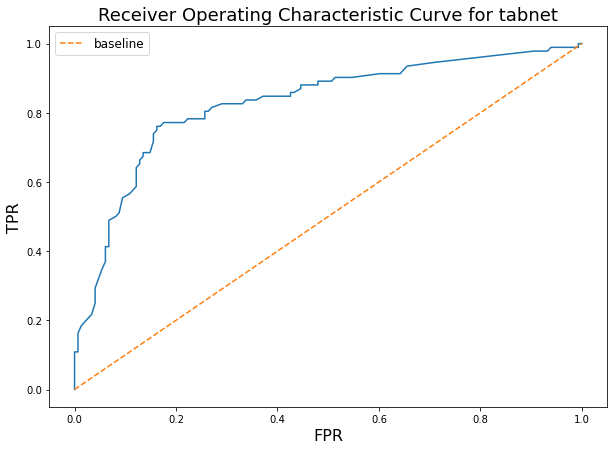

The ROC_AUC score is 0.8260869565217391


The Matthew correlation is 0.5963470083964223
-------------------
The accuracy is 0.8083333333333333
The recall is 0.8083333333333333
The macro F1 score is 0.7981127935044986
The micro F1 score is 0.8083333333333333
The weighted F1 score is 0.8087118718455124
              precision    recall  f1-score   support

         0.0       0.85      0.84      0.84       148
         1.0       0.74      0.76      0.75        92

    accuracy                           0.81       240
   macro avg       0.80      0.80      0.80       240
weighted avg       0.81      0.81      0.81       240



Started Execute test train split at 16:30:18.
Started Started column type detection and casting at 16:30:18.
Started Checking for duplicate columns at 16:30:18.
Started Reset dataframe index. at 16:30:18.
Started Select best features at 16:30:18.
Started Delete columns with high share of NULLs at 16:30:18.
Started Apply datetime transformation at 16:30:18.
Started Start TFIDF to PCA loop at 16:30:18.
Started PCA POS tags at 16:30:18.
Started PCA POS tags at 16:30:18.
Started PCA POS tags at 16:30:18.
Started Handle rare features at 16:30:18.
Started Remove cardinality at 16:30:18.
Started Holistic NULL filling at 16:30:18.
Started Binarize numeric columns + PCA binarized features at 16:30:18.
Started Onehot + PCA categorical features at 16:30:18.
Started Execute categorical encoding at 16:30:18.
Started Fill nulls at 16:30:18.
Started Handle outliers at 16:30:18.
Started Remove collinearity at 16:30:18.
Started Remove skewness at 16:30:18.
Started Execute clustering as a feature at 16:

Score achieved on holdout dataset is: 0.6246194945326617.
End iteration for algorithm tabnet at 1637249420.5995898.
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Start iteration for algorithm ngboost at 1637249420.6005912.
Started Select best features at 16:30:20.
Features before selection are...PassengerId
Features before selection are...Pclass
Features before selection are...Age
Features before selection are...Fare
Features before selection are...Deck
Features before selection are...Title
Features before selection are...relatives
Features before selection are...Age_Class
Features before selection are...Fare_Per_Person
Features before selection are...Embarked
Features before selection are...Sex
Features before selection are...TFIDF PC-1 Ticket
Features before selection are...TFIDF PC-2 Ticket
Features before selection are...TFIDF PC-1 Cabin
Features before selection are...TFIDF PC-2 Cabin
Features before selecti

[I 2021-11-18 16:30:23,901] A new study created in memory with name: ngboost tuning


Started Sort columns alphabetically at 16:30:23.
Started Train Ngboost at 16:30:23.


  0%|          | 0/3 [00:00<?, ?it/s]

[iter 0] loss=0.7171 val_loss=0.6283 scale=4.0000 norm=7.9779
== Early stopping achieved.
== Best iteration / VAL29 (val_loss=0.4988)
[iter 0] loss=0.7189 val_loss=0.6429 scale=2.0000 norm=3.9959
== Early stopping achieved.
== Best iteration / VAL36 (val_loss=0.4726)
[iter 0] loss=0.7218 val_loss=0.6448 scale=2.0000 norm=4.0075
== Early stopping achieved.
== Best iteration / VAL33 (val_loss=0.4782)
[iter 0] loss=0.7204 val_loss=0.6442 scale=2.0000 norm=4.0035
== Early stopping achieved.
== Best iteration / VAL42 (val_loss=0.4792)
[iter 0] loss=0.7209 val_loss=0.6388 scale=2.0000 norm=4.0035
== Early stopping achieved.
== Best iteration / VAL27 (val_loss=0.4528)
[iter 0] loss=0.7180 val_loss=0.6398 scale=2.0000 norm=3.9924
== Early stopping achieved.
== Best iteration / VAL28 (val_loss=0.4834)
[iter 0] loss=0.7148 val_loss=0.6396 scale=2.0000 norm=3.9800
== Early stopping achieved.
== Best iteration / VAL30 (val_loss=0.4700)
[iter 0] loss=0.7146 val_loss=0.6395 scale=2.0000 norm=3.9790


[iter 0] loss=0.7206 val_loss=0.6635 scale=2.0000 norm=4.0024
[iter 100] loss=0.5349 val_loss=0.5332 scale=4.0000 norm=6.8839
[iter 200] loss=0.4515 val_loss=0.4879 scale=2.0000 norm=3.3066
[iter 300] loss=0.4330 val_loss=0.4698 scale=4.0000 norm=6.7875
== Early stopping achieved.
== Best iteration / VAL364 (val_loss=0.4641)
Started Predict with Ngboost at 16:30:32.
16:30:32


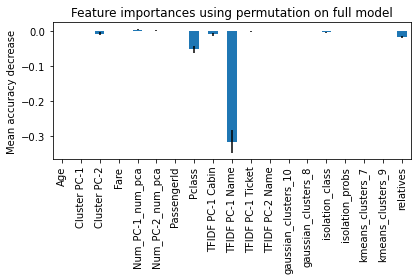

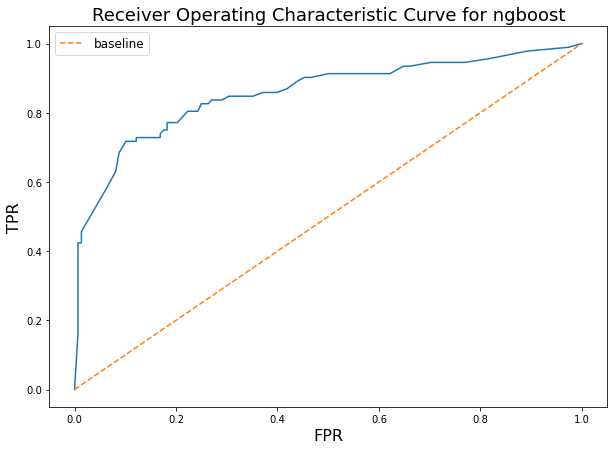

The ROC_AUC score is 0.8567494124559342


The Matthew correlation is 0.6334211768456514
-------------------
The accuracy is 0.8291666666666667
The recall is 0.8291666666666667
The macro F1 score is 0.814727645873736
The micro F1 score is 0.8291666666666667
The weighted F1 score is 0.8267960811633496
              precision    recall  f1-score   support

         0.0       0.84      0.90      0.87       148
         1.0       0.81      0.72      0.76        92

    accuracy                           0.83       240
   macro avg       0.83      0.81      0.81       240
weighted avg       0.83      0.83      0.83       240



Started Execute test train split at 16:30:35.
Started Started column type detection and casting at 16:30:35.
Started Checking for duplicate columns at 16:30:35.
Started Reset dataframe index. at 16:30:35.
Started Select best features at 16:30:35.
Started Delete columns with high share of NULLs at 16:30:35.
Started Apply datetime transformation at 16:30:35.
Started Start TFIDF to PCA loop at 16:30:35.
Started PCA POS tags at 16:30:35.
Started PCA POS tags at 16:30:35.
Started PCA POS tags at 16:30:35.
Started Handle rare features at 16:30:35.
Started Remove cardinality at 16:30:35.
Started Holistic NULL filling at 16:30:35.
Started Binarize numeric columns + PCA binarized features at 16:30:35.
Started Onehot + PCA categorical features at 16:30:35.
Started Execute categorical encoding at 16:30:35.
Started Fill nulls at 16:30:35.
Started Handle outliers at 16:30:35.
Started Remove collinearity at 16:30:35.
Started Remove skewness at 16:30:35.
Started Execute clustering as a feature at 16:

Score achieved on holdout dataset is: 0.6431056209584698.
End iteration for algorithm ngboost at 1637249436.9625912.
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Start iteration for algorithm sgd at 1637249436.9634721.
Started Select best features at 16:30:36.
Features before selection are...PassengerId
Features before selection are...Pclass
Features before selection are...Age
Features before selection are...Fare
Features before selection are...Deck
Features before selection are...Title
Features before selection are...relatives
Features before selection are...Age_Class
Features before selection are...Fare_Per_Person
Features before selection are...Embarked
Features before selection are...Sex
Features before selection are...TFIDF PC-1 Ticket
Features before selection are...TFIDF PC-2 Ticket
Features before selection are...TFIDF PC-1 Cabin
Features before selection are...TFIDF PC-2 Cabin
Features before selection 

[I 2021-11-18 16:30:41,091] A new study created in memory with name: sgd


Started Sort columns alphabetically at 16:30:40.
Started Train SGD classifier model at 16:30:41.


  0%|          | 0/3 [00:00<?, ?it/s]

[I 2021-11-18 16:30:41,120] Trial 0 finished with value: 0.0 and parameters: {'loss': 'log', 'alpha': 24.658329458549105, 'l1_ratio': 0.06250999323228593, 'epsilon': 0.0024348773534554596, 'max_iter': 4688, 'tol': 1.7073967431528103e-05, 'normalize': True, 'power_t': 0.39663473785260006}. Best is trial 0 with value: 0.0.
[I 2021-11-18 16:30:41,245] Trial 1 finished with value: -0.007604263977686943 and parameters: {'loss': 'log', 'alpha': 98.77700294007911, 'l1_ratio': 0.004335189736337855, 'epsilon': 0.002820996133514492, 'max_iter': 5510, 'tol': 0.00016480446427978953, 'normalize': True, 'power_t': 0.17624515035546043}. Best is trial 0 with value: 0.0.
[I 2021-11-18 16:30:41,366] Trial 2 finished with value: 0.03383829829853381 and parameters: {'loss': 'modified_huber', 'alpha': 0.05660670699258887, 'l1_ratio': 0.012562313237138797, 'epsilon': 0.013481575603601416, 'max_iter': 23558, 'tol': 6.290644294586152e-05, 'normalize': False, 'power_t': 0.10945992664124292}. Best is trial 2 wi

Started Predict with SGD classifier at 16:30:41.
Score achieved on holdout dataset is: 0.
End iteration for algorithm sgd at 1637249441.6888359.
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Start iteration for algorithm vowpal_wabbit at 1637249441.6897075.
Started Select best features at 16:30:41.
Features before selection are...PassengerId
Features before selection are...Pclass
Features before selection are...Age
Features before selection are...Fare
Features before selection are...Deck
Features before selection are...Title
Features before selection are...relatives
Features before selection are...Age_Class
Features before selection are...Fare_Per_Person
Features before selection are...Embarked
Features before selection are...Sex
Features before selection are...TFIDF PC-1 Ticket
Features before selection are...TFIDF PC-2 Ticket
Features before selection are...TFIDF PC-1 Cabin
Features before selection are...TFIDF

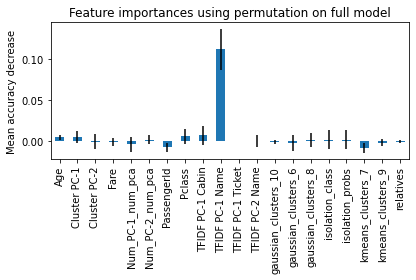

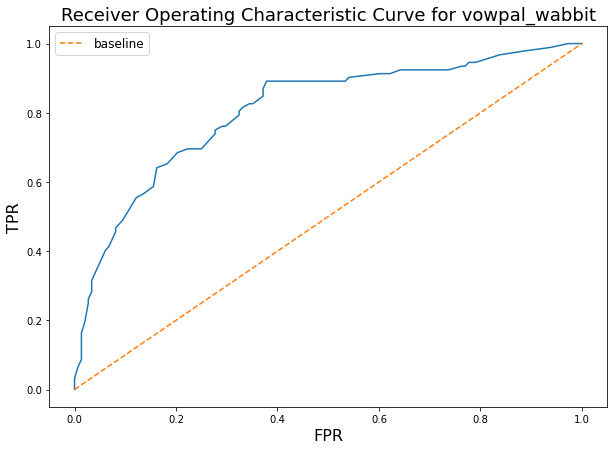

The ROC_AUC score is 0.8078730904817861


The Matthew correlation is 0.4912762963370655
-------------------
The accuracy is 0.7625
The recall is 0.7625
The macro F1 score is 0.7449236449068636
The micro F1 score is 0.7625
The weighted F1 score is 0.7605470716563182
              precision    recall  f1-score   support

         0.0       0.79      0.83      0.81       148
         1.0       0.71      0.65      0.68        92

    accuracy                           0.76       240
   macro avg       0.75      0.74      0.74       240
weighted avg       0.76      0.76      0.76       240



Started Execute test train split at 16:30:46.
Started Started column type detection and casting at 16:30:46.
Started Checking for duplicate columns at 16:30:46.
Started Reset dataframe index. at 16:30:46.
Started Select best features at 16:30:46.
Started Delete columns with high share of NULLs at 16:30:46.
Started Apply datetime transformation at 16:30:46.
Started Start TFIDF to PCA loop at 16:30:46.
Started PCA POS tags at 16:30:46.
Started PCA POS tags at 16:30:46.
Started PCA POS tags at 16:30:46.
Started Handle rare features at 16:30:46.
Started Remove cardinality at 16:30:46.
Started Holistic NULL filling at 16:30:46.
Started Binarize numeric columns + PCA binarized features at 16:30:46.
Started Onehot + PCA categorical features at 16:30:46.
Started Execute categorical encoding at 16:30:46.
Started Fill nulls at 16:30:46.
Started Handle outliers at 16:30:46.
Started Remove collinearity at 16:30:46.
Started Remove skewness at 16:30:46.
Started Execute clustering as a feature at 16:

Score achieved on holdout dataset is: 0.4935253301118275.
End iteration for algorithm vowpal_wabbit at 1637249448.088897.
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Start iteration for algorithm ridge at 1637249448.08971.
Started Delete columns with high share of NULLs at 16:30:48.
Started Apply datetime transformation at 16:30:48.
Started Handle rare features at 16:30:48.
Started Remove cardinality at 16:30:48.
Started Holistic NULL filling at 16:30:48.
Started Binarize numeric columns + PCA binarized features at 16:30:48.
Started Onehot + PCA categorical features at 16:30:48.
Started Execute categorical encoding at 16:30:49.
Started Fill nulls at 16:30:49.
Started Handle outliers at 16:30:49.
Started Remove collinearity at 16:30:49.
Started Remove skewness at 16:30:50.
Started Execute clustering as a feature at 16:30:50.
Started Scale data at 16:30:50.
Started Execute clustering as a feature at 16:30:50.
Sta

[I 2021-11-18 16:30:54,924] A new study created in memory with name: autotuned kmeans


Started PCA the clustering results. at 16:30:54.


  0%|          | 0/50 [00:00<?, ?it/s]

[I 2021-11-18 16:30:55,412] Trial 0 finished with value: 0.4786929343442126 and parameters: {'PassengerId': 0, 'Pclass': 1, 'Age': 1, 'Fare': 1, 'Deck': 0, 'Title': 0, 'relatives': 0, 'Age_Class': 1, 'Fare_Per_Person': 1, 'Embarked': 1, 'Sex': 0, 'PassengerId_binarized': 1, 'Pclass_binarized': 1, 'Age_binarized': 0, 'Fare_binarized': 0, 'Deck_binarized': 0, 'Title_binarized': 0, 'relatives_binarized': 1, 'Fare_Per_Person_binarized': 0, 'Num_PC-1_num_pca': 0, 'Num_PC-2_num_pca': 1, 'isolation_probs': 0, 'isolation_class': 0, 'Pclass_unskewed': 0, 'Deck_unskewed': 0, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 0, 'Deck_binarized_unskewed': 1, 'Title_unskewed': 1, 'relatives_unskewed': 0, 'Age_Class_unskewed': 1, 'Fare_Per_Person_unskewed': 0, 'Embarked_unskewed': 0, 'Sex_unskewed': 1, 'Num_PC-1_num_pca_unskewed': 1, 'dbscan_cluster_0.3': 1, 'kmeans_clusters_3': 0, 'kmeans_clusters_5': 0, 'kmeans_clusters_7': 1, 'kmeans_clusters_9': 0, 'gaussian_clusters_2': 0, 'gaussian_clust

[I 2021-11-18 16:31:02,482] Trial 7 finished with value: 0.5253996850781173 and parameters: {'PassengerId': 1, 'Pclass': 1, 'Age': 1, 'Fare': 0, 'Deck': 1, 'Title': 0, 'relatives': 1, 'Age_Class': 1, 'Fare_Per_Person': 0, 'Embarked': 1, 'Sex': 1, 'PassengerId_binarized': 0, 'Pclass_binarized': 0, 'Age_binarized': 0, 'Fare_binarized': 0, 'Deck_binarized': 0, 'Title_binarized': 1, 'relatives_binarized': 0, 'Fare_Per_Person_binarized': 0, 'Num_PC-1_num_pca': 1, 'Num_PC-2_num_pca': 0, 'isolation_probs': 1, 'isolation_class': 0, 'Pclass_unskewed': 0, 'Deck_unskewed': 1, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 1, 'Deck_binarized_unskewed': 1, 'Title_unskewed': 1, 'relatives_unskewed': 0, 'Age_Class_unskewed': 0, 'Fare_Per_Person_unskewed': 1, 'Embarked_unskewed': 1, 'Sex_unskewed': 1, 'Num_PC-1_num_pca_unskewed': 0, 'dbscan_cluster_0.3': 0, 'kmeans_clusters_3': 1, 'kmeans_clusters_5': 0, 'kmeans_clusters_7': 1, 'kmeans_clusters_9': 1, 'gaussian_clusters_2': 0, 'gaussian_clust

[I 2021-11-18 16:31:10,527] Trial 14 finished with value: 0.5390965126952705 and parameters: {'PassengerId': 1, 'Pclass': 1, 'Age': 1, 'Fare': 1, 'Deck': 1, 'Title': 0, 'relatives': 0, 'Age_Class': 1, 'Fare_Per_Person': 0, 'Embarked': 0, 'Sex': 0, 'PassengerId_binarized': 1, 'Pclass_binarized': 1, 'Age_binarized': 0, 'Fare_binarized': 0, 'Deck_binarized': 0, 'Title_binarized': 1, 'relatives_binarized': 0, 'Fare_Per_Person_binarized': 1, 'Num_PC-1_num_pca': 1, 'Num_PC-2_num_pca': 0, 'isolation_probs': 0, 'isolation_class': 1, 'Pclass_unskewed': 1, 'Deck_unskewed': 1, 'Age_binarized_unskewed': 0, 'Fare_binarized_unskewed': 0, 'Deck_binarized_unskewed': 0, 'Title_unskewed': 0, 'relatives_unskewed': 1, 'Age_Class_unskewed': 1, 'Fare_Per_Person_unskewed': 1, 'Embarked_unskewed': 1, 'Sex_unskewed': 1, 'Num_PC-1_num_pca_unskewed': 1, 'dbscan_cluster_0.3': 1, 'kmeans_clusters_3': 1, 'kmeans_clusters_5': 1, 'kmeans_clusters_7': 0, 'kmeans_clusters_9': 0, 'gaussian_clusters_2': 1, 'gaussian_clus

[I 2021-11-18 16:31:15,291] Trial 21 finished with value: 0.6303438431010743 and parameters: {'PassengerId': 1, 'Pclass': 1, 'Age': 1, 'Fare': 0, 'Deck': 1, 'Title': 0, 'relatives': 0, 'Age_Class': 1, 'Fare_Per_Person': 1, 'Embarked': 0, 'Sex': 1, 'PassengerId_binarized': 0, 'Pclass_binarized': 1, 'Age_binarized': 1, 'Fare_binarized': 1, 'Deck_binarized': 0, 'Title_binarized': 1, 'relatives_binarized': 1, 'Fare_Per_Person_binarized': 0, 'Num_PC-1_num_pca': 0, 'Num_PC-2_num_pca': 1, 'isolation_probs': 0, 'isolation_class': 0, 'Pclass_unskewed': 0, 'Deck_unskewed': 1, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 0, 'Deck_binarized_unskewed': 0, 'Title_unskewed': 0, 'relatives_unskewed': 0, 'Age_Class_unskewed': 0, 'Fare_Per_Person_unskewed': 0, 'Embarked_unskewed': 1, 'Sex_unskewed': 0, 'Num_PC-1_num_pca_unskewed': 1, 'dbscan_cluster_0.3': 0, 'kmeans_clusters_3': 1, 'kmeans_clusters_5': 0, 'kmeans_clusters_7': 1, 'kmeans_clusters_9': 0, 'gaussian_clusters_2': 0, 'gaussian_clus

[I 2021-11-18 16:31:19,160] Trial 28 finished with value: 0.5426129872820735 and parameters: {'PassengerId': 1, 'Pclass': 1, 'Age': 1, 'Fare': 1, 'Deck': 1, 'Title': 0, 'relatives': 0, 'Age_Class': 1, 'Fare_Per_Person': 1, 'Embarked': 0, 'Sex': 0, 'PassengerId_binarized': 1, 'Pclass_binarized': 0, 'Age_binarized': 0, 'Fare_binarized': 1, 'Deck_binarized': 0, 'Title_binarized': 1, 'relatives_binarized': 1, 'Fare_Per_Person_binarized': 1, 'Num_PC-1_num_pca': 0, 'Num_PC-2_num_pca': 0, 'isolation_probs': 0, 'isolation_class': 1, 'Pclass_unskewed': 1, 'Deck_unskewed': 0, 'Age_binarized_unskewed': 0, 'Fare_binarized_unskewed': 0, 'Deck_binarized_unskewed': 0, 'Title_unskewed': 0, 'relatives_unskewed': 1, 'Age_Class_unskewed': 0, 'Fare_Per_Person_unskewed': 0, 'Embarked_unskewed': 0, 'Sex_unskewed': 0, 'Num_PC-1_num_pca_unskewed': 0, 'dbscan_cluster_0.3': 1, 'kmeans_clusters_3': 1, 'kmeans_clusters_5': 1, 'kmeans_clusters_7': 0, 'kmeans_clusters_9': 0, 'gaussian_clusters_2': 1, 'gaussian_clus

[I 2021-11-18 16:31:22,994] Trial 35 finished with value: 0.58574270605351 and parameters: {'PassengerId': 1, 'Pclass': 1, 'Age': 1, 'Fare': 0, 'Deck': 0, 'Title': 1, 'relatives': 0, 'Age_Class': 1, 'Fare_Per_Person': 1, 'Embarked': 0, 'Sex': 1, 'PassengerId_binarized': 0, 'Pclass_binarized': 1, 'Age_binarized': 1, 'Fare_binarized': 0, 'Deck_binarized': 0, 'Title_binarized': 1, 'relatives_binarized': 1, 'Fare_Per_Person_binarized': 0, 'Num_PC-1_num_pca': 0, 'Num_PC-2_num_pca': 1, 'isolation_probs': 0, 'isolation_class': 0, 'Pclass_unskewed': 0, 'Deck_unskewed': 1, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 0, 'Deck_binarized_unskewed': 0, 'Title_unskewed': 0, 'relatives_unskewed': 0, 'Age_Class_unskewed': 0, 'Fare_Per_Person_unskewed': 0, 'Embarked_unskewed': 1, 'Sex_unskewed': 1, 'Num_PC-1_num_pca_unskewed': 1, 'dbscan_cluster_0.3': 0, 'kmeans_clusters_3': 1, 'kmeans_clusters_5': 0, 'kmeans_clusters_7': 0, 'kmeans_clusters_9': 0, 'gaussian_clusters_2': 0, 'gaussian_cluste

[I 2021-11-18 16:31:26,997] Trial 42 finished with value: 0.6304122940882331 and parameters: {'PassengerId': 1, 'Pclass': 1, 'Age': 1, 'Fare': 0, 'Deck': 0, 'Title': 0, 'relatives': 0, 'Age_Class': 1, 'Fare_Per_Person': 1, 'Embarked': 0, 'Sex': 1, 'PassengerId_binarized': 0, 'Pclass_binarized': 0, 'Age_binarized': 1, 'Fare_binarized': 1, 'Deck_binarized': 1, 'Title_binarized': 1, 'relatives_binarized': 1, 'Fare_Per_Person_binarized': 0, 'Num_PC-1_num_pca': 1, 'Num_PC-2_num_pca': 1, 'isolation_probs': 0, 'isolation_class': 0, 'Pclass_unskewed': 0, 'Deck_unskewed': 1, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 0, 'Deck_binarized_unskewed': 0, 'Title_unskewed': 0, 'relatives_unskewed': 0, 'Age_Class_unskewed': 1, 'Fare_Per_Person_unskewed': 0, 'Embarked_unskewed': 1, 'Sex_unskewed': 0, 'Num_PC-1_num_pca_unskewed': 1, 'dbscan_cluster_0.3': 0, 'kmeans_clusters_3': 1, 'kmeans_clusters_5': 0, 'kmeans_clusters_7': 1, 'kmeans_clusters_9': 0, 'gaussian_clusters_2': 0, 'gaussian_clus

[I 2021-11-18 16:31:31,679] Trial 49 finished with value: 0.583900156591693 and parameters: {'PassengerId': 1, 'Pclass': 1, 'Age': 1, 'Fare': 0, 'Deck': 0, 'Title': 0, 'relatives': 0, 'Age_Class': 1, 'Fare_Per_Person': 1, 'Embarked': 0, 'Sex': 1, 'PassengerId_binarized': 1, 'Pclass_binarized': 1, 'Age_binarized': 1, 'Fare_binarized': 1, 'Deck_binarized': 1, 'Title_binarized': 1, 'relatives_binarized': 1, 'Fare_Per_Person_binarized': 0, 'Num_PC-1_num_pca': 1, 'Num_PC-2_num_pca': 1, 'isolation_probs': 0, 'isolation_class': 0, 'Pclass_unskewed': 0, 'Deck_unskewed': 1, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 0, 'Deck_binarized_unskewed': 0, 'Title_unskewed': 0, 'relatives_unskewed': 0, 'Age_Class_unskewed': 1, 'Fare_Per_Person_unskewed': 0, 'Embarked_unskewed': 1, 'Sex_unskewed': 0, 'Num_PC-1_num_pca_unskewed': 1, 'dbscan_cluster_0.3': 0, 'kmeans_clusters_3': 1, 'kmeans_clusters_5': 0, 'kmeans_clusters_7': 1, 'kmeans_clusters_9': 0, 'gaussian_clusters_2': 0, 'gaussian_clust

Started Select best features at 16:31:33.
Features before selection are...PassengerId
Features before selection are...Pclass
Features before selection are...Age
Features before selection are...Fare
Features before selection are...Deck
Features before selection are...Title
Features before selection are...relatives
Features before selection are...Age_Class
Features before selection are...Fare_Per_Person
Features before selection are...Embarked
Features before selection are...Sex
Features before selection are...PassengerId_binarized
Features before selection are...Pclass_binarized
Features before selection are...Age_binarized
Features before selection are...Fare_binarized
Features before selection are...Deck_binarized
Features before selection are...Title_binarized
Features before selection are...relatives_binarized
Features before selection are...Fare_Per_Person_binarized
Features before selection are...Num_PC-1_num_pca
Features before selection are...Num_PC-2_num_pca
Features before sel

[I 2021-11-18 16:31:35,482] A new study created in memory with name: ridge


Started Sort columns alphabetically at 16:31:35.
Started Train Ridge classifier model at 16:31:35.


  0%|          | 0/3 [00:00<?, ?it/s]

[I 2021-11-18 16:31:35,518] Trial 0 finished with value: 0.4631503185386775 and parameters: {'solver': 'svd', 'alpha': 157.41890047456639, 'max_iter': 6015, 'tol': 0.006796578090758156, 'normalize': False}. Best is trial 0 with value: 0.4631503185386775.
[I 2021-11-18 16:31:35,675] Trial 1 finished with value: 0.5796232755845778 and parameters: {'solver': 'auto', 'alpha': 0.055895242052179224, 'max_iter': 6123, 'tol': 3.613894271216525e-05, 'normalize': False}. Best is trial 1 with value: 0.5796232755845778.
[I 2021-11-18 16:31:35,821] Trial 2 finished with value: 0.5722233344201941 and parameters: {'solver': 'svd', 'alpha': 0.010547383621352036, 'max_iter': 659, 'tol': 0.06245139574743072, 'normalize': True}. Best is trial 1 with value: 0.5796232755845778.


Started Predict with Ridge classifier at 16:31:36.
16:31:36


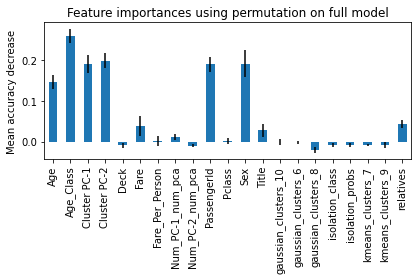

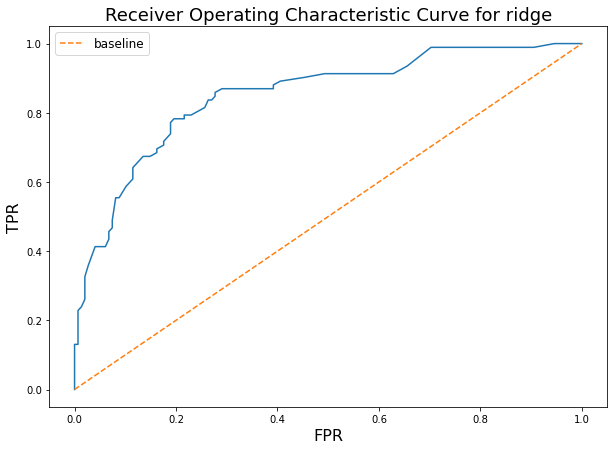

The ROC_AUC score is 0.8503965922444182


The Matthew correlation is 0.577756975778742
-------------------
The accuracy is 0.7958333333333333
The recall is 0.7958333333333333
The macro F1 score is 0.7876911411601162
The micro F1 score is 0.7958333333333333
The weighted F1 score is 0.7973924765154388
              precision    recall  f1-score   support

         0.0       0.86      0.80      0.83       148
         1.0       0.71      0.78      0.75        92

    accuracy                           0.80       240
   macro avg       0.78      0.79      0.79       240
weighted avg       0.80      0.80      0.80       240



Started Execute test train split at 16:31:44.
Started Started column type detection and casting at 16:31:44.
Started Checking for duplicate columns at 16:31:44.
Started Reset dataframe index. at 16:31:44.
Started Select best features at 16:31:44.
Started Delete columns with high share of NULLs at 16:31:44.
Started Apply datetime transformation at 16:31:44.
Started Handle rare features at 16:31:44.
Started Remove cardinality at 16:31:44.
Started Holistic NULL filling at 16:31:44.
Started Binarize numeric columns + PCA binarized features at 16:31:44.
Started Onehot + PCA categorical features at 16:31:44.
Started Execute categorical encoding at 16:31:44.
Started Fill nulls at 16:31:44.
Started Handle outliers at 16:31:44.
Started Remove collinearity at 16:31:44.
Started Remove skewness at 16:31:44.
Started Execute clustering as a feature at 16:31:44.
Started Execute clustering as a feature at 16:31:44.
Started Execute clustering as a feature at 16:31:45.
Started Execute clustering as a fe

Score achieved on holdout dataset is: 0.5773993808049536.
End iteration for algorithm ridge at 1637249506.2045367.
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Start iteration for algorithm xgboost at 1637249506.2055745.
Started Delete columns with high share of NULLs at 16:31:46.
Started Apply datetime transformation at 16:31:46.
Started Handle rare features at 16:31:46.
Started Remove cardinality at 16:31:46.
Started Holistic NULL filling at 16:31:46.
Started Binarize numeric columns + PCA binarized features at 16:31:46.
Started Onehot + PCA categorical features at 16:31:47.
Started Execute categorical encoding at 16:31:47.
Started Fill nulls at 16:31:47.
Started Handle outliers at 16:31:47.
Started Remove collinearity at 16:31:47.
Started Remove skewness at 16:31:48.
Started Execute clustering as a feature at 16:31:48.
Started Scale data at 16:31:48.
Started Execute clustering as a feature at 16:31:48.
Starte

[I 2021-11-18 16:31:53,067] A new study created in memory with name: autotuned kmeans


Started PCA the clustering results. at 16:31:52.


  0%|          | 0/50 [00:00<?, ?it/s]

[I 2021-11-18 16:31:53,557] Trial 0 finished with value: 0.47415415390116716 and parameters: {'PassengerId': 0, 'Pclass': 1, 'Age': 1, 'Fare': 1, 'Deck': 0, 'Title': 0, 'relatives': 0, 'Age_Class': 1, 'Fare_Per_Person': 1, 'Embarked': 1, 'Sex': 0, 'PassengerId_binarized': 1, 'Pclass_binarized': 1, 'Age_binarized': 0, 'Fare_binarized': 0, 'Deck_binarized': 0, 'Title_binarized': 0, 'relatives_binarized': 1, 'Fare_Per_Person_binarized': 0, 'Num_PC-1_num_pca': 0, 'Num_PC-2_num_pca': 1, 'isolation_probs': 0, 'isolation_class': 0, 'Pclass_unskewed': 0, 'Deck_unskewed': 0, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 0, 'Deck_binarized_unskewed': 1, 'Title_unskewed': 1, 'relatives_unskewed': 0, 'Age_Class_unskewed': 1, 'Fare_Per_Person_unskewed': 0, 'Embarked_unskewed': 0, 'Sex_unskewed': 1, 'Num_PC-1_num_pca_unskewed': 1, 'dbscan_cluster_0.3': 1, 'kmeans_clusters_3': 0, 'kmeans_clusters_5': 0, 'kmeans_clusters_7': 1, 'kmeans_clusters_9': 0, 'gaussian_clusters_2': 0, 'gaussian_clus

[I 2021-11-18 16:32:00,822] Trial 7 finished with value: 0.5249847466223406 and parameters: {'PassengerId': 1, 'Pclass': 1, 'Age': 1, 'Fare': 0, 'Deck': 1, 'Title': 0, 'relatives': 1, 'Age_Class': 1, 'Fare_Per_Person': 0, 'Embarked': 1, 'Sex': 1, 'PassengerId_binarized': 0, 'Pclass_binarized': 0, 'Age_binarized': 0, 'Fare_binarized': 0, 'Deck_binarized': 0, 'Title_binarized': 1, 'relatives_binarized': 0, 'Fare_Per_Person_binarized': 0, 'Num_PC-1_num_pca': 1, 'Num_PC-2_num_pca': 0, 'isolation_probs': 1, 'isolation_class': 0, 'Pclass_unskewed': 0, 'Deck_unskewed': 1, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 1, 'Deck_binarized_unskewed': 1, 'Title_unskewed': 1, 'relatives_unskewed': 0, 'Age_Class_unskewed': 0, 'Fare_Per_Person_unskewed': 1, 'Embarked_unskewed': 1, 'Sex_unskewed': 1, 'Num_PC-1_num_pca_unskewed': 0, 'dbscan_cluster_0.3': 0, 'kmeans_clusters_3': 1, 'kmeans_clusters_5': 0, 'kmeans_clusters_7': 1, 'kmeans_clusters_9': 1, 'gaussian_clusters_2': 0, 'gaussian_clust

[I 2021-11-18 16:32:09,107] Trial 14 finished with value: 0.5314006979767942 and parameters: {'PassengerId': 1, 'Pclass': 1, 'Age': 1, 'Fare': 1, 'Deck': 1, 'Title': 0, 'relatives': 0, 'Age_Class': 1, 'Fare_Per_Person': 0, 'Embarked': 0, 'Sex': 0, 'PassengerId_binarized': 1, 'Pclass_binarized': 1, 'Age_binarized': 0, 'Fare_binarized': 0, 'Deck_binarized': 0, 'Title_binarized': 1, 'relatives_binarized': 0, 'Fare_Per_Person_binarized': 1, 'Num_PC-1_num_pca': 1, 'Num_PC-2_num_pca': 0, 'isolation_probs': 0, 'isolation_class': 1, 'Pclass_unskewed': 1, 'Deck_unskewed': 1, 'Age_binarized_unskewed': 0, 'Fare_binarized_unskewed': 0, 'Deck_binarized_unskewed': 0, 'Title_unskewed': 0, 'relatives_unskewed': 1, 'Age_Class_unskewed': 1, 'Fare_Per_Person_unskewed': 1, 'Embarked_unskewed': 1, 'Sex_unskewed': 1, 'Num_PC-1_num_pca_unskewed': 1, 'dbscan_cluster_0.3': 1, 'kmeans_clusters_3': 1, 'kmeans_clusters_5': 1, 'kmeans_clusters_7': 0, 'kmeans_clusters_9': 0, 'gaussian_clusters_2': 1, 'gaussian_clus

[I 2021-11-18 16:32:16,891] Trial 21 finished with value: 0.6304428000259071 and parameters: {'PassengerId': 0, 'Pclass': 1, 'Age': 0, 'Fare': 1, 'Deck': 1, 'Title': 0, 'relatives': 1, 'Age_Class': 0, 'Fare_Per_Person': 0, 'Embarked': 0, 'Sex': 1, 'PassengerId_binarized': 1, 'Pclass_binarized': 0, 'Age_binarized': 0, 'Fare_binarized': 1, 'Deck_binarized': 1, 'Title_binarized': 0, 'relatives_binarized': 1, 'Fare_Per_Person_binarized': 1, 'Num_PC-1_num_pca': 1, 'Num_PC-2_num_pca': 0, 'isolation_probs': 0, 'isolation_class': 1, 'Pclass_unskewed': 1, 'Deck_unskewed': 1, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 0, 'Deck_binarized_unskewed': 1, 'Title_unskewed': 1, 'relatives_unskewed': 1, 'Age_Class_unskewed': 0, 'Fare_Per_Person_unskewed': 1, 'Embarked_unskewed': 1, 'Sex_unskewed': 1, 'Num_PC-1_num_pca_unskewed': 1, 'dbscan_cluster_0.3': 0, 'kmeans_clusters_3': 0, 'kmeans_clusters_5': 1, 'kmeans_clusters_7': 1, 'kmeans_clusters_9': 0, 'gaussian_clusters_2': 1, 'gaussian_clus

[I 2021-11-18 16:32:21,559] Trial 28 finished with value: 0.5306611789281586 and parameters: {'PassengerId': 0, 'Pclass': 1, 'Age': 0, 'Fare': 1, 'Deck': 1, 'Title': 0, 'relatives': 1, 'Age_Class': 1, 'Fare_Per_Person': 0, 'Embarked': 0, 'Sex': 1, 'PassengerId_binarized': 0, 'Pclass_binarized': 1, 'Age_binarized': 0, 'Fare_binarized': 1, 'Deck_binarized': 1, 'Title_binarized': 1, 'relatives_binarized': 0, 'Fare_Per_Person_binarized': 0, 'Num_PC-1_num_pca': 0, 'Num_PC-2_num_pca': 1, 'isolation_probs': 1, 'isolation_class': 1, 'Pclass_unskewed': 1, 'Deck_unskewed': 1, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 0, 'Deck_binarized_unskewed': 1, 'Title_unskewed': 1, 'relatives_unskewed': 1, 'Age_Class_unskewed': 0, 'Fare_Per_Person_unskewed': 1, 'Embarked_unskewed': 1, 'Sex_unskewed': 1, 'Num_PC-1_num_pca_unskewed': 1, 'dbscan_cluster_0.3': 1, 'kmeans_clusters_3': 1, 'kmeans_clusters_5': 1, 'kmeans_clusters_7': 1, 'kmeans_clusters_9': 0, 'gaussian_clusters_2': 0, 'gaussian_clus

[I 2021-11-18 16:32:25,144] Trial 35 finished with value: 0.5459891261357959 and parameters: {'PassengerId': 0, 'Pclass': 1, 'Age': 0, 'Fare': 1, 'Deck': 1, 'Title': 0, 'relatives': 1, 'Age_Class': 0, 'Fare_Per_Person': 0, 'Embarked': 0, 'Sex': 1, 'PassengerId_binarized': 1, 'Pclass_binarized': 0, 'Age_binarized': 0, 'Fare_binarized': 1, 'Deck_binarized': 1, 'Title_binarized': 0, 'relatives_binarized': 1, 'Fare_Per_Person_binarized': 1, 'Num_PC-1_num_pca': 0, 'Num_PC-2_num_pca': 0, 'isolation_probs': 0, 'isolation_class': 1, 'Pclass_unskewed': 1, 'Deck_unskewed': 1, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 0, 'Deck_binarized_unskewed': 1, 'Title_unskewed': 1, 'relatives_unskewed': 1, 'Age_Class_unskewed': 0, 'Fare_Per_Person_unskewed': 1, 'Embarked_unskewed': 0, 'Sex_unskewed': 1, 'Num_PC-1_num_pca_unskewed': 1, 'dbscan_cluster_0.3': 0, 'kmeans_clusters_3': 0, 'kmeans_clusters_5': 0, 'kmeans_clusters_7': 1, 'kmeans_clusters_9': 0, 'gaussian_clusters_2': 1, 'gaussian_clus

[I 2021-11-18 16:32:28,185] Trial 42 finished with value: 0.5592256490658561 and parameters: {'PassengerId': 0, 'Pclass': 0, 'Age': 0, 'Fare': 1, 'Deck': 1, 'Title': 0, 'relatives': 0, 'Age_Class': 1, 'Fare_Per_Person': 0, 'Embarked': 0, 'Sex': 1, 'PassengerId_binarized': 0, 'Pclass_binarized': 1, 'Age_binarized': 1, 'Fare_binarized': 1, 'Deck_binarized': 1, 'Title_binarized': 0, 'relatives_binarized': 0, 'Fare_Per_Person_binarized': 0, 'Num_PC-1_num_pca': 1, 'Num_PC-2_num_pca': 0, 'isolation_probs': 1, 'isolation_class': 1, 'Pclass_unskewed': 1, 'Deck_unskewed': 1, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 0, 'Deck_binarized_unskewed': 1, 'Title_unskewed': 1, 'relatives_unskewed': 1, 'Age_Class_unskewed': 1, 'Fare_Per_Person_unskewed': 1, 'Embarked_unskewed': 1, 'Sex_unskewed': 1, 'Num_PC-1_num_pca_unskewed': 1, 'dbscan_cluster_0.3': 1, 'kmeans_clusters_3': 0, 'kmeans_clusters_5': 1, 'kmeans_clusters_7': 1, 'kmeans_clusters_9': 1, 'gaussian_clusters_2': 0, 'gaussian_clus

[I 2021-11-18 16:32:31,743] Trial 49 finished with value: 0.5444882539439224 and parameters: {'PassengerId': 1, 'Pclass': 0, 'Age': 0, 'Fare': 1, 'Deck': 1, 'Title': 0, 'relatives': 0, 'Age_Class': 0, 'Fare_Per_Person': 1, 'Embarked': 0, 'Sex': 0, 'PassengerId_binarized': 1, 'Pclass_binarized': 0, 'Age_binarized': 0, 'Fare_binarized': 1, 'Deck_binarized': 0, 'Title_binarized': 1, 'relatives_binarized': 0, 'Fare_Per_Person_binarized': 1, 'Num_PC-1_num_pca': 0, 'Num_PC-2_num_pca': 0, 'isolation_probs': 0, 'isolation_class': 0, 'Pclass_unskewed': 1, 'Deck_unskewed': 1, 'Age_binarized_unskewed': 0, 'Fare_binarized_unskewed': 0, 'Deck_binarized_unskewed': 1, 'Title_unskewed': 0, 'relatives_unskewed': 1, 'Age_Class_unskewed': 0, 'Fare_Per_Person_unskewed': 0, 'Embarked_unskewed': 1, 'Sex_unskewed': 0, 'Num_PC-1_num_pca_unskewed': 1, 'dbscan_cluster_0.3': 1, 'kmeans_clusters_3': 1, 'kmeans_clusters_5': 1, 'kmeans_clusters_7': 1, 'kmeans_clusters_9': 1, 'gaussian_clusters_2': 1, 'gaussian_clus

Started Select best features at 16:32:33.
Features before selection are...PassengerId
Features before selection are...Pclass
Features before selection are...Age
Features before selection are...Fare
Features before selection are...Deck
Features before selection are...Title
Features before selection are...relatives
Features before selection are...Age_Class
Features before selection are...Fare_Per_Person
Features before selection are...Embarked
Features before selection are...Sex
Features before selection are...PassengerId_binarized
Features before selection are...Pclass_binarized
Features before selection are...Age_binarized
Features before selection are...Fare_binarized
Features before selection are...Deck_binarized
Features before selection are...Title_binarized
Features before selection are...relatives_binarized
Features before selection are...Fare_Per_Person_binarized
Features before selection are...Num_PC-1_num_pca
Features before selection are...Num_PC-2_num_pca
Features before sel

[I 2021-11-18 16:32:35,913] A new study created in memory with name: xgboost tuning


Started Sort columns alphabetically at 16:32:35.
Started Train Xgboost at 16:32:35.
Started Check Xgboost for GPU acceleration. at 16:32:35.
[16:32:35] WARNING: /opt/conda/envs/rapids/conda-bld/xgboost_1623267594558/work/src/learner.cc:573: 
Parameters: { "steps" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


Xgboost uses GPU.


  0%|          | 0/3 [00:00<?, ?it/s]

[16:32:35] WARNING: /opt/conda/envs/rapids/conda-bld/xgboost_1623267594558/work/src/learner.cc:573: 
Parameters: { "min_child_samples", "num_leaves", "steps", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[16:32:35] WARNING: /opt/conda/envs/rapids/conda-bld/xgboost_1623267594558/work/src/learner.cc:573: 
Parameters: { "min_child_samples", "num_leaves", "steps", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[16:32:35] WARNING: /opt/conda/envs/rapids/conda-bld/xgboost_1623267594558/work/src/learner.cc:573: 
Parameters: { "min_child_samples", "num

[I 2021-11-18 16:39:22,518] Trial 1 finished with value: 0.5024013576304338 and parameters: {'max_depth': 9, 'alpha': 18.794668241638455, 'lambda': 12.329623163659836, 'num_leaves': 48, 'subsample': 0.5825453457757226, 'colsample_bytree': 0.762378215816119, 'colsample_bylevel': 0.7159725093210578, 'colsample_bynode': 0.645614570099021, 'min_child_samples': 614, 'eta': 0.0022158645374549917, 'steps': 20451, 'num_parallel_tree': 2}. Best is trial 1 with value: 0.5024013576304338.
[16:39:22] WARNING: /opt/conda/envs/rapids/conda-bld/xgboost_1623267594558/work/src/learner.cc:573: 
Parameters: { "min_child_samples", "num_leaves", "steps", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[16:39:22] WARNING: /opt/conda/envs/rapids/conda-bld/xgboost_1623267594558/work/src/lea

[16:39:23] WARNING: /opt/conda/envs/rapids/conda-bld/xgboost_1623267594558/work/src/learner.cc:573: 
Parameters: { "min_child_samples", "num_leaves", "steps", "verbose" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[0]	train-mlogloss:0.69272	test-mlogloss:0.69276
[1]	train-mlogloss:0.69233	test-mlogloss:0.69243
[2]	train-mlogloss:0.69182	test-mlogloss:0.69197
[3]	train-mlogloss:0.69132	test-mlogloss:0.69150
[4]	train-mlogloss:0.69084	test-mlogloss:0.69105
[5]	train-mlogloss:0.69038	test-mlogloss:0.69063
[6]	train-mlogloss:0.68998	test-mlogloss:0.69026
[7]	train-mlogloss:0.68954	test-mlogloss:0.68984
[8]	train-mlogloss:0.68908	test-mlogloss:0.68942
[9]	train-mlogloss:0.68860	test-mlogloss:0.68898
[10]	train-mlogloss:0.68825	test-mlogloss:0.68865
[11]	train-mlogloss:0.68777	te

[154]	train-mlogloss:0.63940	test-mlogloss:0.64437
[155]	train-mlogloss:0.63904	test-mlogloss:0.64402
[156]	train-mlogloss:0.63876	test-mlogloss:0.64378
[157]	train-mlogloss:0.63838	test-mlogloss:0.64345
[158]	train-mlogloss:0.63815	test-mlogloss:0.64325
[159]	train-mlogloss:0.63790	test-mlogloss:0.64304
[160]	train-mlogloss:0.63764	test-mlogloss:0.64280
[161]	train-mlogloss:0.63733	test-mlogloss:0.64251
[162]	train-mlogloss:0.63701	test-mlogloss:0.64224
[163]	train-mlogloss:0.63678	test-mlogloss:0.64202
[164]	train-mlogloss:0.63652	test-mlogloss:0.64178
[165]	train-mlogloss:0.63622	test-mlogloss:0.64151
[166]	train-mlogloss:0.63601	test-mlogloss:0.64132
[167]	train-mlogloss:0.63575	test-mlogloss:0.64110
[168]	train-mlogloss:0.63555	test-mlogloss:0.64094
[169]	train-mlogloss:0.63533	test-mlogloss:0.64075
[170]	train-mlogloss:0.63511	test-mlogloss:0.64055
[171]	train-mlogloss:0.63485	test-mlogloss:0.64032
[172]	train-mlogloss:0.63458	test-mlogloss:0.64008
[173]	train-mlogloss:0.63425	te

[315]	train-mlogloss:0.60137	test-mlogloss:0.61003
[316]	train-mlogloss:0.60115	test-mlogloss:0.60982
[317]	train-mlogloss:0.60094	test-mlogloss:0.60963
[318]	train-mlogloss:0.60075	test-mlogloss:0.60946
[319]	train-mlogloss:0.60057	test-mlogloss:0.60930
[320]	train-mlogloss:0.60037	test-mlogloss:0.60912
[321]	train-mlogloss:0.60018	test-mlogloss:0.60895
[322]	train-mlogloss:0.59998	test-mlogloss:0.60877
[323]	train-mlogloss:0.59976	test-mlogloss:0.60856
[324]	train-mlogloss:0.59953	test-mlogloss:0.60834
[325]	train-mlogloss:0.59938	test-mlogloss:0.60821
[326]	train-mlogloss:0.59915	test-mlogloss:0.60798
[327]	train-mlogloss:0.59894	test-mlogloss:0.60781
[328]	train-mlogloss:0.59871	test-mlogloss:0.60760
[329]	train-mlogloss:0.59854	test-mlogloss:0.60744
[330]	train-mlogloss:0.59834	test-mlogloss:0.60726
[331]	train-mlogloss:0.59814	test-mlogloss:0.60707
[332]	train-mlogloss:0.59791	test-mlogloss:0.60686
[333]	train-mlogloss:0.59768	test-mlogloss:0.60664
[334]	train-mlogloss:0.59750	te

[476]	train-mlogloss:0.57395	test-mlogloss:0.58518
[477]	train-mlogloss:0.57377	test-mlogloss:0.58501
[478]	train-mlogloss:0.57365	test-mlogloss:0.58490
[479]	train-mlogloss:0.57348	test-mlogloss:0.58476
[480]	train-mlogloss:0.57334	test-mlogloss:0.58462
[481]	train-mlogloss:0.57317	test-mlogloss:0.58447
[482]	train-mlogloss:0.57305	test-mlogloss:0.58436
[483]	train-mlogloss:0.57296	test-mlogloss:0.58429
[484]	train-mlogloss:0.57282	test-mlogloss:0.58417
[485]	train-mlogloss:0.57268	test-mlogloss:0.58404
[486]	train-mlogloss:0.57253	test-mlogloss:0.58390
[487]	train-mlogloss:0.57242	test-mlogloss:0.58380
[488]	train-mlogloss:0.57233	test-mlogloss:0.58371
[489]	train-mlogloss:0.57220	test-mlogloss:0.58361
[490]	train-mlogloss:0.57209	test-mlogloss:0.58350
[491]	train-mlogloss:0.57189	test-mlogloss:0.58332
[492]	train-mlogloss:0.57175	test-mlogloss:0.58319
[493]	train-mlogloss:0.57166	test-mlogloss:0.58311
[494]	train-mlogloss:0.57150	test-mlogloss:0.58296
[495]	train-mlogloss:0.57137	te

[637]	train-mlogloss:0.55432	test-mlogloss:0.56746
[638]	train-mlogloss:0.55420	test-mlogloss:0.56735
[639]	train-mlogloss:0.55410	test-mlogloss:0.56725
[640]	train-mlogloss:0.55397	test-mlogloss:0.56715
[641]	train-mlogloss:0.55384	test-mlogloss:0.56703
[642]	train-mlogloss:0.55376	test-mlogloss:0.56695
[643]	train-mlogloss:0.55367	test-mlogloss:0.56687
[644]	train-mlogloss:0.55354	test-mlogloss:0.56676
[645]	train-mlogloss:0.55343	test-mlogloss:0.56666
[646]	train-mlogloss:0.55333	test-mlogloss:0.56658
[647]	train-mlogloss:0.55319	test-mlogloss:0.56645
[648]	train-mlogloss:0.55306	test-mlogloss:0.56634
[649]	train-mlogloss:0.55300	test-mlogloss:0.56628
[650]	train-mlogloss:0.55290	test-mlogloss:0.56619
[651]	train-mlogloss:0.55275	test-mlogloss:0.56606
[652]	train-mlogloss:0.55271	test-mlogloss:0.56602
[653]	train-mlogloss:0.55259	test-mlogloss:0.56592
[654]	train-mlogloss:0.55246	test-mlogloss:0.56580
[655]	train-mlogloss:0.55237	test-mlogloss:0.56572
[656]	train-mlogloss:0.55225	te

[798]	train-mlogloss:0.53942	test-mlogloss:0.55417
[799]	train-mlogloss:0.53935	test-mlogloss:0.55410
[800]	train-mlogloss:0.53927	test-mlogloss:0.55404
[801]	train-mlogloss:0.53921	test-mlogloss:0.55399
[802]	train-mlogloss:0.53916	test-mlogloss:0.55395
[803]	train-mlogloss:0.53905	test-mlogloss:0.55383
[804]	train-mlogloss:0.53899	test-mlogloss:0.55378
[805]	train-mlogloss:0.53893	test-mlogloss:0.55373
[806]	train-mlogloss:0.53884	test-mlogloss:0.55365
[807]	train-mlogloss:0.53877	test-mlogloss:0.55358
[808]	train-mlogloss:0.53871	test-mlogloss:0.55353
[809]	train-mlogloss:0.53862	test-mlogloss:0.55344
[810]	train-mlogloss:0.53856	test-mlogloss:0.55339
[811]	train-mlogloss:0.53848	test-mlogloss:0.55332
[812]	train-mlogloss:0.53843	test-mlogloss:0.55327
[813]	train-mlogloss:0.53835	test-mlogloss:0.55320
[814]	train-mlogloss:0.53827	test-mlogloss:0.55312
[815]	train-mlogloss:0.53816	test-mlogloss:0.55304
[816]	train-mlogloss:0.53814	test-mlogloss:0.55302
[817]	train-mlogloss:0.53811	te

[959]	train-mlogloss:0.52839	test-mlogloss:0.54430
[960]	train-mlogloss:0.52833	test-mlogloss:0.54425
[961]	train-mlogloss:0.52826	test-mlogloss:0.54419
[962]	train-mlogloss:0.52817	test-mlogloss:0.54410
[963]	train-mlogloss:0.52809	test-mlogloss:0.54404
[964]	train-mlogloss:0.52802	test-mlogloss:0.54397
[965]	train-mlogloss:0.52796	test-mlogloss:0.54393
[966]	train-mlogloss:0.52788	test-mlogloss:0.54385
[967]	train-mlogloss:0.52782	test-mlogloss:0.54380
[968]	train-mlogloss:0.52775	test-mlogloss:0.54373
[969]	train-mlogloss:0.52772	test-mlogloss:0.54370
[970]	train-mlogloss:0.52768	test-mlogloss:0.54367
[971]	train-mlogloss:0.52761	test-mlogloss:0.54361
[972]	train-mlogloss:0.52758	test-mlogloss:0.54358
[973]	train-mlogloss:0.52753	test-mlogloss:0.54354
[974]	train-mlogloss:0.52747	test-mlogloss:0.54348
[975]	train-mlogloss:0.52738	test-mlogloss:0.54340
[976]	train-mlogloss:0.52731	test-mlogloss:0.54333
[977]	train-mlogloss:0.52728	test-mlogloss:0.54330
[978]	train-mlogloss:0.52725	te

[1118]	train-mlogloss:0.51987	test-mlogloss:0.53674
[1119]	train-mlogloss:0.51984	test-mlogloss:0.53672
[1120]	train-mlogloss:0.51980	test-mlogloss:0.53669
[1121]	train-mlogloss:0.51977	test-mlogloss:0.53666
[1122]	train-mlogloss:0.51973	test-mlogloss:0.53663
[1123]	train-mlogloss:0.51966	test-mlogloss:0.53657
[1124]	train-mlogloss:0.51961	test-mlogloss:0.53652
[1125]	train-mlogloss:0.51954	test-mlogloss:0.53646
[1126]	train-mlogloss:0.51951	test-mlogloss:0.53643
[1127]	train-mlogloss:0.51945	test-mlogloss:0.53637
[1128]	train-mlogloss:0.51939	test-mlogloss:0.53632
[1129]	train-mlogloss:0.51930	test-mlogloss:0.53624
[1130]	train-mlogloss:0.51923	test-mlogloss:0.53617
[1131]	train-mlogloss:0.51917	test-mlogloss:0.53612
[1132]	train-mlogloss:0.51909	test-mlogloss:0.53605
[1133]	train-mlogloss:0.51901	test-mlogloss:0.53599
[1134]	train-mlogloss:0.51896	test-mlogloss:0.53594
[1135]	train-mlogloss:0.51890	test-mlogloss:0.53589
[1136]	train-mlogloss:0.51888	test-mlogloss:0.53587
[1137]	train

[1276]	train-mlogloss:0.51295	test-mlogloss:0.53061
[1277]	train-mlogloss:0.51290	test-mlogloss:0.53057
[1278]	train-mlogloss:0.51287	test-mlogloss:0.53054
[1279]	train-mlogloss:0.51284	test-mlogloss:0.53052
[1280]	train-mlogloss:0.51280	test-mlogloss:0.53049
[1281]	train-mlogloss:0.51277	test-mlogloss:0.53046
[1282]	train-mlogloss:0.51271	test-mlogloss:0.53041
[1283]	train-mlogloss:0.51271	test-mlogloss:0.53041
[1284]	train-mlogloss:0.51264	test-mlogloss:0.53034
[1285]	train-mlogloss:0.51260	test-mlogloss:0.53031
[1286]	train-mlogloss:0.51255	test-mlogloss:0.53026
[1287]	train-mlogloss:0.51251	test-mlogloss:0.53023
[1288]	train-mlogloss:0.51248	test-mlogloss:0.53020
[1289]	train-mlogloss:0.51246	test-mlogloss:0.53019
[1290]	train-mlogloss:0.51241	test-mlogloss:0.53014
[1291]	train-mlogloss:0.51237	test-mlogloss:0.53011
[1292]	train-mlogloss:0.51233	test-mlogloss:0.53008
[1293]	train-mlogloss:0.51231	test-mlogloss:0.53005
[1294]	train-mlogloss:0.51228	test-mlogloss:0.53002
[1295]	train

[1434]	train-mlogloss:0.50733	test-mlogloss:0.52569
[1435]	train-mlogloss:0.50731	test-mlogloss:0.52567
[1436]	train-mlogloss:0.50726	test-mlogloss:0.52563
[1437]	train-mlogloss:0.50726	test-mlogloss:0.52563
[1438]	train-mlogloss:0.50721	test-mlogloss:0.52558
[1439]	train-mlogloss:0.50721	test-mlogloss:0.52558
[1440]	train-mlogloss:0.50716	test-mlogloss:0.52554
[1441]	train-mlogloss:0.50714	test-mlogloss:0.52552
[1442]	train-mlogloss:0.50709	test-mlogloss:0.52548
[1443]	train-mlogloss:0.50707	test-mlogloss:0.52546
[1444]	train-mlogloss:0.50702	test-mlogloss:0.52542
[1445]	train-mlogloss:0.50699	test-mlogloss:0.52538
[1446]	train-mlogloss:0.50694	test-mlogloss:0.52534
[1447]	train-mlogloss:0.50689	test-mlogloss:0.52529
[1448]	train-mlogloss:0.50688	test-mlogloss:0.52529
[1449]	train-mlogloss:0.50685	test-mlogloss:0.52526
[1450]	train-mlogloss:0.50683	test-mlogloss:0.52524
[1451]	train-mlogloss:0.50678	test-mlogloss:0.52520
[1452]	train-mlogloss:0.50676	test-mlogloss:0.52518
[1453]	train

[1592]	train-mlogloss:0.50289	test-mlogloss:0.52180
[1593]	train-mlogloss:0.50287	test-mlogloss:0.52179
[1594]	train-mlogloss:0.50285	test-mlogloss:0.52176
[1595]	train-mlogloss:0.50282	test-mlogloss:0.52173
[1596]	train-mlogloss:0.50279	test-mlogloss:0.52172
[1597]	train-mlogloss:0.50277	test-mlogloss:0.52170
[1598]	train-mlogloss:0.50275	test-mlogloss:0.52168
[1599]	train-mlogloss:0.50272	test-mlogloss:0.52165
[1600]	train-mlogloss:0.50271	test-mlogloss:0.52164
[1601]	train-mlogloss:0.50267	test-mlogloss:0.52161
[1602]	train-mlogloss:0.50265	test-mlogloss:0.52159
[1603]	train-mlogloss:0.50264	test-mlogloss:0.52158
[1604]	train-mlogloss:0.50261	test-mlogloss:0.52155
[1605]	train-mlogloss:0.50259	test-mlogloss:0.52153
[1606]	train-mlogloss:0.50257	test-mlogloss:0.52151
[1607]	train-mlogloss:0.50255	test-mlogloss:0.52149
[1608]	train-mlogloss:0.50251	test-mlogloss:0.52146
[1609]	train-mlogloss:0.50250	test-mlogloss:0.52146
[1610]	train-mlogloss:0.50250	test-mlogloss:0.52145
[1611]	train

[1750]	train-mlogloss:0.49949	test-mlogloss:0.51886
[1751]	train-mlogloss:0.49945	test-mlogloss:0.51882
[1752]	train-mlogloss:0.49942	test-mlogloss:0.51880
[1753]	train-mlogloss:0.49941	test-mlogloss:0.51879
[1754]	train-mlogloss:0.49940	test-mlogloss:0.51878
[1755]	train-mlogloss:0.49937	test-mlogloss:0.51875
[1756]	train-mlogloss:0.49934	test-mlogloss:0.51873
[1757]	train-mlogloss:0.49932	test-mlogloss:0.51871
[1758]	train-mlogloss:0.49932	test-mlogloss:0.51870
[1759]	train-mlogloss:0.49931	test-mlogloss:0.51870
[1760]	train-mlogloss:0.49929	test-mlogloss:0.51868
[1761]	train-mlogloss:0.49925	test-mlogloss:0.51865
[1762]	train-mlogloss:0.49923	test-mlogloss:0.51863
[1763]	train-mlogloss:0.49922	test-mlogloss:0.51862
[1764]	train-mlogloss:0.49919	test-mlogloss:0.51859
[1765]	train-mlogloss:0.49917	test-mlogloss:0.51858
[1766]	train-mlogloss:0.49916	test-mlogloss:0.51856
[1767]	train-mlogloss:0.49911	test-mlogloss:0.51853
[1768]	train-mlogloss:0.49910	test-mlogloss:0.51851
[1769]	train

[1908]	train-mlogloss:0.49647	test-mlogloss:0.51622
[1909]	train-mlogloss:0.49646	test-mlogloss:0.51621
[1910]	train-mlogloss:0.49644	test-mlogloss:0.51619
[1911]	train-mlogloss:0.49641	test-mlogloss:0.51617
[1912]	train-mlogloss:0.49640	test-mlogloss:0.51616
[1913]	train-mlogloss:0.49639	test-mlogloss:0.51615
[1914]	train-mlogloss:0.49638	test-mlogloss:0.51614
[1915]	train-mlogloss:0.49637	test-mlogloss:0.51613
[1916]	train-mlogloss:0.49635	test-mlogloss:0.51611
[1917]	train-mlogloss:0.49634	test-mlogloss:0.51610
[1918]	train-mlogloss:0.49633	test-mlogloss:0.51609
[1919]	train-mlogloss:0.49631	test-mlogloss:0.51608
[1920]	train-mlogloss:0.49627	test-mlogloss:0.51604
[1921]	train-mlogloss:0.49626	test-mlogloss:0.51603
[1922]	train-mlogloss:0.49623	test-mlogloss:0.51601
[1923]	train-mlogloss:0.49621	test-mlogloss:0.51599
[1924]	train-mlogloss:0.49618	test-mlogloss:0.51597
[1925]	train-mlogloss:0.49617	test-mlogloss:0.51595
[1926]	train-mlogloss:0.49616	test-mlogloss:0.51594
[1927]	train

[2066]	train-mlogloss:0.49391	test-mlogloss:0.51399
[2067]	train-mlogloss:0.49389	test-mlogloss:0.51397
[2068]	train-mlogloss:0.49387	test-mlogloss:0.51396
[2069]	train-mlogloss:0.49385	test-mlogloss:0.51394
[2070]	train-mlogloss:0.49384	test-mlogloss:0.51392
[2071]	train-mlogloss:0.49382	test-mlogloss:0.51391
[2072]	train-mlogloss:0.49380	test-mlogloss:0.51389
[2073]	train-mlogloss:0.49380	test-mlogloss:0.51389
[2074]	train-mlogloss:0.49379	test-mlogloss:0.51388
[2075]	train-mlogloss:0.49377	test-mlogloss:0.51387
[2076]	train-mlogloss:0.49375	test-mlogloss:0.51384
[2077]	train-mlogloss:0.49374	test-mlogloss:0.51383
[2078]	train-mlogloss:0.49372	test-mlogloss:0.51381
[2079]	train-mlogloss:0.49369	test-mlogloss:0.51379
[2080]	train-mlogloss:0.49368	test-mlogloss:0.51378
[2081]	train-mlogloss:0.49365	test-mlogloss:0.51375
[2082]	train-mlogloss:0.49363	test-mlogloss:0.51374
[2083]	train-mlogloss:0.49362	test-mlogloss:0.51373
[2084]	train-mlogloss:0.49361	test-mlogloss:0.51372
[2085]	train

[2224]	train-mlogloss:0.49141	test-mlogloss:0.51182
[2225]	train-mlogloss:0.49137	test-mlogloss:0.51178
[2226]	train-mlogloss:0.49135	test-mlogloss:0.51177
[2227]	train-mlogloss:0.49135	test-mlogloss:0.51176
[2228]	train-mlogloss:0.49134	test-mlogloss:0.51176
[2229]	train-mlogloss:0.49134	test-mlogloss:0.51175
[2230]	train-mlogloss:0.49133	test-mlogloss:0.51175
[2231]	train-mlogloss:0.49133	test-mlogloss:0.51174
[2232]	train-mlogloss:0.49132	test-mlogloss:0.51173
[2233]	train-mlogloss:0.49130	test-mlogloss:0.51172
[2234]	train-mlogloss:0.49127	test-mlogloss:0.51170
[2235]	train-mlogloss:0.49126	test-mlogloss:0.51169
[2236]	train-mlogloss:0.49126	test-mlogloss:0.51169
[2237]	train-mlogloss:0.49124	test-mlogloss:0.51168
[2238]	train-mlogloss:0.49124	test-mlogloss:0.51167
[2239]	train-mlogloss:0.49122	test-mlogloss:0.51166
[2240]	train-mlogloss:0.49121	test-mlogloss:0.51165
[2241]	train-mlogloss:0.49120	test-mlogloss:0.51164
[2242]	train-mlogloss:0.49118	test-mlogloss:0.51163
[2243]	train

[2382]	train-mlogloss:0.48948	test-mlogloss:0.51015
[2383]	train-mlogloss:0.48947	test-mlogloss:0.51014
[2384]	train-mlogloss:0.48944	test-mlogloss:0.51012
[2385]	train-mlogloss:0.48944	test-mlogloss:0.51012
[2386]	train-mlogloss:0.48942	test-mlogloss:0.51010
[2387]	train-mlogloss:0.48941	test-mlogloss:0.51009
[2388]	train-mlogloss:0.48940	test-mlogloss:0.51008
[2389]	train-mlogloss:0.48940	test-mlogloss:0.51008
[2390]	train-mlogloss:0.48939	test-mlogloss:0.51007
[2391]	train-mlogloss:0.48938	test-mlogloss:0.51006
[2392]	train-mlogloss:0.48936	test-mlogloss:0.51005
[2393]	train-mlogloss:0.48936	test-mlogloss:0.51004
[2394]	train-mlogloss:0.48934	test-mlogloss:0.51004
[2395]	train-mlogloss:0.48934	test-mlogloss:0.51003
[2396]	train-mlogloss:0.48931	test-mlogloss:0.51001
[2397]	train-mlogloss:0.48931	test-mlogloss:0.51001
[2398]	train-mlogloss:0.48929	test-mlogloss:0.50999
[2399]	train-mlogloss:0.48928	test-mlogloss:0.50998
[2400]	train-mlogloss:0.48927	test-mlogloss:0.50997
[2401]	train

[2540]	train-mlogloss:0.48777	test-mlogloss:0.50869
[2541]	train-mlogloss:0.48777	test-mlogloss:0.50869
[2542]	train-mlogloss:0.48775	test-mlogloss:0.50867
[2543]	train-mlogloss:0.48774	test-mlogloss:0.50866
[2544]	train-mlogloss:0.48772	test-mlogloss:0.50865
[2545]	train-mlogloss:0.48770	test-mlogloss:0.50863
[2546]	train-mlogloss:0.48770	test-mlogloss:0.50862
[2547]	train-mlogloss:0.48769	test-mlogloss:0.50862
[2548]	train-mlogloss:0.48768	test-mlogloss:0.50861
[2549]	train-mlogloss:0.48767	test-mlogloss:0.50860
[2550]	train-mlogloss:0.48767	test-mlogloss:0.50860
[2551]	train-mlogloss:0.48766	test-mlogloss:0.50859
[2552]	train-mlogloss:0.48766	test-mlogloss:0.50859
[2553]	train-mlogloss:0.48764	test-mlogloss:0.50857
[2554]	train-mlogloss:0.48763	test-mlogloss:0.50856
[2555]	train-mlogloss:0.48762	test-mlogloss:0.50856
[2556]	train-mlogloss:0.48762	test-mlogloss:0.50855
[2557]	train-mlogloss:0.48760	test-mlogloss:0.50854
[2558]	train-mlogloss:0.48759	test-mlogloss:0.50853
[2559]	train

[2698]	train-mlogloss:0.48642	test-mlogloss:0.50751
[2699]	train-mlogloss:0.48640	test-mlogloss:0.50749
[2700]	train-mlogloss:0.48639	test-mlogloss:0.50748
[2701]	train-mlogloss:0.48638	test-mlogloss:0.50747
[2702]	train-mlogloss:0.48637	test-mlogloss:0.50747
[2703]	train-mlogloss:0.48636	test-mlogloss:0.50745
[2704]	train-mlogloss:0.48635	test-mlogloss:0.50745
[2705]	train-mlogloss:0.48634	test-mlogloss:0.50744
[2706]	train-mlogloss:0.48633	test-mlogloss:0.50743
[2707]	train-mlogloss:0.48631	test-mlogloss:0.50741
[2708]	train-mlogloss:0.48631	test-mlogloss:0.50741
[2709]	train-mlogloss:0.48630	test-mlogloss:0.50741
[2710]	train-mlogloss:0.48630	test-mlogloss:0.50740
[2711]	train-mlogloss:0.48629	test-mlogloss:0.50740
[2712]	train-mlogloss:0.48628	test-mlogloss:0.50739
[2713]	train-mlogloss:0.48628	test-mlogloss:0.50739
[2714]	train-mlogloss:0.48626	test-mlogloss:0.50737
[2715]	train-mlogloss:0.48626	test-mlogloss:0.50737
[2716]	train-mlogloss:0.48626	test-mlogloss:0.50737
[2717]	train

[2856]	train-mlogloss:0.48517	test-mlogloss:0.50641
[2857]	train-mlogloss:0.48517	test-mlogloss:0.50641
[2858]	train-mlogloss:0.48516	test-mlogloss:0.50641
[2859]	train-mlogloss:0.48516	test-mlogloss:0.50640
[2860]	train-mlogloss:0.48515	test-mlogloss:0.50640
[2861]	train-mlogloss:0.48514	test-mlogloss:0.50639
[2862]	train-mlogloss:0.48513	test-mlogloss:0.50638
[2863]	train-mlogloss:0.48513	test-mlogloss:0.50638
[2864]	train-mlogloss:0.48513	test-mlogloss:0.50638
[2865]	train-mlogloss:0.48512	test-mlogloss:0.50637
[2866]	train-mlogloss:0.48511	test-mlogloss:0.50637
[2867]	train-mlogloss:0.48510	test-mlogloss:0.50636
[2868]	train-mlogloss:0.48509	test-mlogloss:0.50635
[2869]	train-mlogloss:0.48507	test-mlogloss:0.50634
[2870]	train-mlogloss:0.48507	test-mlogloss:0.50633
[2871]	train-mlogloss:0.48507	test-mlogloss:0.50633
[2872]	train-mlogloss:0.48505	test-mlogloss:0.50632
[2873]	train-mlogloss:0.48505	test-mlogloss:0.50632
[2874]	train-mlogloss:0.48504	test-mlogloss:0.50631
[2875]	train

[3014]	train-mlogloss:0.48393	test-mlogloss:0.50537
[3015]	train-mlogloss:0.48392	test-mlogloss:0.50537
[3016]	train-mlogloss:0.48392	test-mlogloss:0.50537
[3017]	train-mlogloss:0.48392	test-mlogloss:0.50537
[3018]	train-mlogloss:0.48392	test-mlogloss:0.50536
[3019]	train-mlogloss:0.48392	test-mlogloss:0.50536
[3020]	train-mlogloss:0.48392	test-mlogloss:0.50536
[3021]	train-mlogloss:0.48391	test-mlogloss:0.50536
[3022]	train-mlogloss:0.48390	test-mlogloss:0.50535
[3023]	train-mlogloss:0.48390	test-mlogloss:0.50535
[3024]	train-mlogloss:0.48389	test-mlogloss:0.50534
[3025]	train-mlogloss:0.48389	test-mlogloss:0.50534
[3026]	train-mlogloss:0.48388	test-mlogloss:0.50533
[3027]	train-mlogloss:0.48386	test-mlogloss:0.50532
[3028]	train-mlogloss:0.48384	test-mlogloss:0.50530
[3029]	train-mlogloss:0.48384	test-mlogloss:0.50529
[3030]	train-mlogloss:0.48383	test-mlogloss:0.50529
[3031]	train-mlogloss:0.48382	test-mlogloss:0.50528
[3032]	train-mlogloss:0.48381	test-mlogloss:0.50527
[3033]	train

[3172]	train-mlogloss:0.48291	test-mlogloss:0.50449
[3173]	train-mlogloss:0.48290	test-mlogloss:0.50448
[3174]	train-mlogloss:0.48290	test-mlogloss:0.50448
[3175]	train-mlogloss:0.48288	test-mlogloss:0.50447
[3176]	train-mlogloss:0.48286	test-mlogloss:0.50444
[3177]	train-mlogloss:0.48285	test-mlogloss:0.50444
[3178]	train-mlogloss:0.48284	test-mlogloss:0.50443
[3179]	train-mlogloss:0.48284	test-mlogloss:0.50443
[3180]	train-mlogloss:0.48284	test-mlogloss:0.50443
[3181]	train-mlogloss:0.48283	test-mlogloss:0.50442
[3182]	train-mlogloss:0.48282	test-mlogloss:0.50441
[3183]	train-mlogloss:0.48282	test-mlogloss:0.50441
[3184]	train-mlogloss:0.48281	test-mlogloss:0.50440
[3185]	train-mlogloss:0.48280	test-mlogloss:0.50440
[3186]	train-mlogloss:0.48279	test-mlogloss:0.50439
[3187]	train-mlogloss:0.48279	test-mlogloss:0.50439
[3188]	train-mlogloss:0.48279	test-mlogloss:0.50438
[3189]	train-mlogloss:0.48279	test-mlogloss:0.50438
[3190]	train-mlogloss:0.48278	test-mlogloss:0.50438
[3191]	train

[3330]	train-mlogloss:0.48186	test-mlogloss:0.50359
[3331]	train-mlogloss:0.48185	test-mlogloss:0.50358
[3332]	train-mlogloss:0.48184	test-mlogloss:0.50357
[3333]	train-mlogloss:0.48183	test-mlogloss:0.50357
[3334]	train-mlogloss:0.48182	test-mlogloss:0.50355
[3335]	train-mlogloss:0.48181	test-mlogloss:0.50355
[3336]	train-mlogloss:0.48180	test-mlogloss:0.50354
[3337]	train-mlogloss:0.48180	test-mlogloss:0.50354
[3338]	train-mlogloss:0.48180	test-mlogloss:0.50354
[3339]	train-mlogloss:0.48178	test-mlogloss:0.50352
[3340]	train-mlogloss:0.48178	test-mlogloss:0.50352
[3341]	train-mlogloss:0.48177	test-mlogloss:0.50351
[3342]	train-mlogloss:0.48176	test-mlogloss:0.50350
[3343]	train-mlogloss:0.48176	test-mlogloss:0.50350
[3344]	train-mlogloss:0.48176	test-mlogloss:0.50350
[3345]	train-mlogloss:0.48176	test-mlogloss:0.50350
[3346]	train-mlogloss:0.48175	test-mlogloss:0.50349
[3347]	train-mlogloss:0.48173	test-mlogloss:0.50348
[3348]	train-mlogloss:0.48172	test-mlogloss:0.50348
[3349]	train

[3488]	train-mlogloss:0.48113	test-mlogloss:0.50294
[3489]	train-mlogloss:0.48112	test-mlogloss:0.50294
[3490]	train-mlogloss:0.48111	test-mlogloss:0.50293
[3491]	train-mlogloss:0.48111	test-mlogloss:0.50292
[3492]	train-mlogloss:0.48109	test-mlogloss:0.50291
[3493]	train-mlogloss:0.48109	test-mlogloss:0.50291
[3494]	train-mlogloss:0.48109	test-mlogloss:0.50291
[3495]	train-mlogloss:0.48109	test-mlogloss:0.50291
[3496]	train-mlogloss:0.48108	test-mlogloss:0.50290
[3497]	train-mlogloss:0.48108	test-mlogloss:0.50290
[3498]	train-mlogloss:0.48108	test-mlogloss:0.50290
[3499]	train-mlogloss:0.48108	test-mlogloss:0.50290
[3500]	train-mlogloss:0.48108	test-mlogloss:0.50290
[3501]	train-mlogloss:0.48108	test-mlogloss:0.50290
[3502]	train-mlogloss:0.48108	test-mlogloss:0.50290
[3503]	train-mlogloss:0.48107	test-mlogloss:0.50289
[3504]	train-mlogloss:0.48107	test-mlogloss:0.50289
[3505]	train-mlogloss:0.48107	test-mlogloss:0.50289
[3506]	train-mlogloss:0.48107	test-mlogloss:0.50289
[3507]	train

[3646]	train-mlogloss:0.48036	test-mlogloss:0.50230
[3647]	train-mlogloss:0.48035	test-mlogloss:0.50229
[3648]	train-mlogloss:0.48034	test-mlogloss:0.50228
[3649]	train-mlogloss:0.48034	test-mlogloss:0.50228
[3650]	train-mlogloss:0.48034	test-mlogloss:0.50228
[3651]	train-mlogloss:0.48034	test-mlogloss:0.50228
[3652]	train-mlogloss:0.48034	test-mlogloss:0.50228
[3653]	train-mlogloss:0.48033	test-mlogloss:0.50227
[3654]	train-mlogloss:0.48033	test-mlogloss:0.50227
[3655]	train-mlogloss:0.48033	test-mlogloss:0.50227
[3656]	train-mlogloss:0.48033	test-mlogloss:0.50227
[3657]	train-mlogloss:0.48032	test-mlogloss:0.50226
[3658]	train-mlogloss:0.48031	test-mlogloss:0.50225
[3659]	train-mlogloss:0.48030	test-mlogloss:0.50225
[3660]	train-mlogloss:0.48030	test-mlogloss:0.50225
[3661]	train-mlogloss:0.48030	test-mlogloss:0.50225
[3662]	train-mlogloss:0.48030	test-mlogloss:0.50224
[3663]	train-mlogloss:0.48029	test-mlogloss:0.50224
[3664]	train-mlogloss:0.48028	test-mlogloss:0.50223
[3665]	train

[3804]	train-mlogloss:0.47958	test-mlogloss:0.50165
[3805]	train-mlogloss:0.47958	test-mlogloss:0.50165
[3806]	train-mlogloss:0.47958	test-mlogloss:0.50165
[3807]	train-mlogloss:0.47957	test-mlogloss:0.50164
[3808]	train-mlogloss:0.47955	test-mlogloss:0.50162
[3809]	train-mlogloss:0.47955	test-mlogloss:0.50162
[3810]	train-mlogloss:0.47953	test-mlogloss:0.50161
[3811]	train-mlogloss:0.47952	test-mlogloss:0.50160
[3812]	train-mlogloss:0.47951	test-mlogloss:0.50159
[3813]	train-mlogloss:0.47951	test-mlogloss:0.50159
[3814]	train-mlogloss:0.47951	test-mlogloss:0.50159
[3815]	train-mlogloss:0.47951	test-mlogloss:0.50159
[3816]	train-mlogloss:0.47950	test-mlogloss:0.50158
[3817]	train-mlogloss:0.47950	test-mlogloss:0.50158
[3818]	train-mlogloss:0.47950	test-mlogloss:0.50158
[3819]	train-mlogloss:0.47950	test-mlogloss:0.50158
[3820]	train-mlogloss:0.47950	test-mlogloss:0.50158
[3821]	train-mlogloss:0.47950	test-mlogloss:0.50158
[3822]	train-mlogloss:0.47950	test-mlogloss:0.50158
[3823]	train

[3962]	train-mlogloss:0.47898	test-mlogloss:0.50113
[3963]	train-mlogloss:0.47898	test-mlogloss:0.50113
[3964]	train-mlogloss:0.47898	test-mlogloss:0.50113
[3965]	train-mlogloss:0.47898	test-mlogloss:0.50112
[3966]	train-mlogloss:0.47897	test-mlogloss:0.50112
[3967]	train-mlogloss:0.47897	test-mlogloss:0.50112
[3968]	train-mlogloss:0.47897	test-mlogloss:0.50111
[3969]	train-mlogloss:0.47896	test-mlogloss:0.50111
[3970]	train-mlogloss:0.47896	test-mlogloss:0.50111
[3971]	train-mlogloss:0.47896	test-mlogloss:0.50111
[3972]	train-mlogloss:0.47896	test-mlogloss:0.50110
[3973]	train-mlogloss:0.47895	test-mlogloss:0.50110
[3974]	train-mlogloss:0.47895	test-mlogloss:0.50110
[3975]	train-mlogloss:0.47895	test-mlogloss:0.50110
[3976]	train-mlogloss:0.47895	test-mlogloss:0.50110
[3977]	train-mlogloss:0.47895	test-mlogloss:0.50109
[3978]	train-mlogloss:0.47895	test-mlogloss:0.50109
[3979]	train-mlogloss:0.47894	test-mlogloss:0.50109
[3980]	train-mlogloss:0.47894	test-mlogloss:0.50109
[3981]	train

[4120]	train-mlogloss:0.47841	test-mlogloss:0.50064
[4121]	train-mlogloss:0.47841	test-mlogloss:0.50064
[4122]	train-mlogloss:0.47841	test-mlogloss:0.50064
[4123]	train-mlogloss:0.47841	test-mlogloss:0.50064
[4124]	train-mlogloss:0.47840	test-mlogloss:0.50063
[4125]	train-mlogloss:0.47840	test-mlogloss:0.50063
[4126]	train-mlogloss:0.47840	test-mlogloss:0.50063
[4127]	train-mlogloss:0.47838	test-mlogloss:0.50061
[4128]	train-mlogloss:0.47837	test-mlogloss:0.50060
[4129]	train-mlogloss:0.47837	test-mlogloss:0.50060
[4130]	train-mlogloss:0.47837	test-mlogloss:0.50060
[4131]	train-mlogloss:0.47836	test-mlogloss:0.50059
[4132]	train-mlogloss:0.47835	test-mlogloss:0.50058
[4133]	train-mlogloss:0.47835	test-mlogloss:0.50058
[4134]	train-mlogloss:0.47835	test-mlogloss:0.50058
[4135]	train-mlogloss:0.47834	test-mlogloss:0.50057
[4136]	train-mlogloss:0.47833	test-mlogloss:0.50057
[4137]	train-mlogloss:0.47833	test-mlogloss:0.50057
[4138]	train-mlogloss:0.47833	test-mlogloss:0.50057
[4139]	train

[4277]	train-mlogloss:0.47789	test-mlogloss:0.50018
[4278]	train-mlogloss:0.47789	test-mlogloss:0.50018
[4279]	train-mlogloss:0.47789	test-mlogloss:0.50018
[4280]	train-mlogloss:0.47788	test-mlogloss:0.50017
[4281]	train-mlogloss:0.47788	test-mlogloss:0.50017
[4282]	train-mlogloss:0.47788	test-mlogloss:0.50017
[4283]	train-mlogloss:0.47788	test-mlogloss:0.50017
[4284]	train-mlogloss:0.47788	test-mlogloss:0.50017
[4285]	train-mlogloss:0.47786	test-mlogloss:0.50016
[4286]	train-mlogloss:0.47786	test-mlogloss:0.50016
[4287]	train-mlogloss:0.47786	test-mlogloss:0.50016
[4288]	train-mlogloss:0.47785	test-mlogloss:0.50015
[4289]	train-mlogloss:0.47785	test-mlogloss:0.50015
[4290]	train-mlogloss:0.47784	test-mlogloss:0.50014
[4291]	train-mlogloss:0.47784	test-mlogloss:0.50014
[4292]	train-mlogloss:0.47783	test-mlogloss:0.50013
[4293]	train-mlogloss:0.47783	test-mlogloss:0.50013
[4294]	train-mlogloss:0.47783	test-mlogloss:0.50013
[4295]	train-mlogloss:0.47783	test-mlogloss:0.50013
[4296]	train

[4434]	train-mlogloss:0.47730	test-mlogloss:0.49970
[4435]	train-mlogloss:0.47730	test-mlogloss:0.49969
[4436]	train-mlogloss:0.47729	test-mlogloss:0.49969
[4437]	train-mlogloss:0.47729	test-mlogloss:0.49969
[4438]	train-mlogloss:0.47729	test-mlogloss:0.49968
[4439]	train-mlogloss:0.47729	test-mlogloss:0.49968
[4440]	train-mlogloss:0.47728	test-mlogloss:0.49968
[4441]	train-mlogloss:0.47728	test-mlogloss:0.49968
[4442]	train-mlogloss:0.47727	test-mlogloss:0.49967
[4443]	train-mlogloss:0.47727	test-mlogloss:0.49967
[4444]	train-mlogloss:0.47726	test-mlogloss:0.49967
[4445]	train-mlogloss:0.47726	test-mlogloss:0.49967
[4446]	train-mlogloss:0.47726	test-mlogloss:0.49967
[4447]	train-mlogloss:0.47726	test-mlogloss:0.49966
[4448]	train-mlogloss:0.47726	test-mlogloss:0.49966
[4449]	train-mlogloss:0.47725	test-mlogloss:0.49965
[4450]	train-mlogloss:0.47725	test-mlogloss:0.49965
[4451]	train-mlogloss:0.47725	test-mlogloss:0.49965
[4452]	train-mlogloss:0.47724	test-mlogloss:0.49965
[4453]	train

[4591]	train-mlogloss:0.47679	test-mlogloss:0.49927
[4592]	train-mlogloss:0.47679	test-mlogloss:0.49927
[4593]	train-mlogloss:0.47677	test-mlogloss:0.49925
[4594]	train-mlogloss:0.47676	test-mlogloss:0.49925
[4595]	train-mlogloss:0.47676	test-mlogloss:0.49925
[4596]	train-mlogloss:0.47676	test-mlogloss:0.49924
[4597]	train-mlogloss:0.47675	test-mlogloss:0.49924
[4598]	train-mlogloss:0.47675	test-mlogloss:0.49923
[4599]	train-mlogloss:0.47675	test-mlogloss:0.49923
[4600]	train-mlogloss:0.47674	test-mlogloss:0.49923
[4601]	train-mlogloss:0.47674	test-mlogloss:0.49922
[4602]	train-mlogloss:0.47672	test-mlogloss:0.49921
[4603]	train-mlogloss:0.47670	test-mlogloss:0.49920
[4604]	train-mlogloss:0.47670	test-mlogloss:0.49919
[4605]	train-mlogloss:0.47670	test-mlogloss:0.49919
[4606]	train-mlogloss:0.47669	test-mlogloss:0.49919
[4607]	train-mlogloss:0.47669	test-mlogloss:0.49918
[4608]	train-mlogloss:0.47668	test-mlogloss:0.49918
[4609]	train-mlogloss:0.47668	test-mlogloss:0.49918
[4610]	train

[4749]	train-mlogloss:0.47629	test-mlogloss:0.49885
[4750]	train-mlogloss:0.47628	test-mlogloss:0.49884
[4751]	train-mlogloss:0.47628	test-mlogloss:0.49884
[4752]	train-mlogloss:0.47628	test-mlogloss:0.49884
[4753]	train-mlogloss:0.47627	test-mlogloss:0.49883
[4754]	train-mlogloss:0.47626	test-mlogloss:0.49883
[4755]	train-mlogloss:0.47626	test-mlogloss:0.49883
[4756]	train-mlogloss:0.47626	test-mlogloss:0.49883
[4757]	train-mlogloss:0.47624	test-mlogloss:0.49881
[4758]	train-mlogloss:0.47624	test-mlogloss:0.49881
[4759]	train-mlogloss:0.47624	test-mlogloss:0.49881
[4760]	train-mlogloss:0.47623	test-mlogloss:0.49880
[4761]	train-mlogloss:0.47623	test-mlogloss:0.49880
[4762]	train-mlogloss:0.47623	test-mlogloss:0.49880
[4763]	train-mlogloss:0.47623	test-mlogloss:0.49880
[4764]	train-mlogloss:0.47623	test-mlogloss:0.49880
[4765]	train-mlogloss:0.47623	test-mlogloss:0.49880
[4766]	train-mlogloss:0.47623	test-mlogloss:0.49880
[4767]	train-mlogloss:0.47622	test-mlogloss:0.49879
[4768]	train

[4907]	train-mlogloss:0.47582	test-mlogloss:0.49846
[4908]	train-mlogloss:0.47582	test-mlogloss:0.49845
[4909]	train-mlogloss:0.47582	test-mlogloss:0.49845
[4910]	train-mlogloss:0.47582	test-mlogloss:0.49845
[4911]	train-mlogloss:0.47582	test-mlogloss:0.49845
[4912]	train-mlogloss:0.47581	test-mlogloss:0.49845
[4913]	train-mlogloss:0.47580	test-mlogloss:0.49844
[4914]	train-mlogloss:0.47580	test-mlogloss:0.49844
[4915]	train-mlogloss:0.47580	test-mlogloss:0.49844
[4916]	train-mlogloss:0.47579	test-mlogloss:0.49843
[4917]	train-mlogloss:0.47579	test-mlogloss:0.49843
[4918]	train-mlogloss:0.47579	test-mlogloss:0.49843
[4919]	train-mlogloss:0.47579	test-mlogloss:0.49842
[4920]	train-mlogloss:0.47578	test-mlogloss:0.49842
[4921]	train-mlogloss:0.47578	test-mlogloss:0.49842
[4922]	train-mlogloss:0.47578	test-mlogloss:0.49842
[4923]	train-mlogloss:0.47578	test-mlogloss:0.49842
[4924]	train-mlogloss:0.47578	test-mlogloss:0.49842
[4925]	train-mlogloss:0.47576	test-mlogloss:0.49840
[4926]	train

[5065]	train-mlogloss:0.47533	test-mlogloss:0.49804
[5066]	train-mlogloss:0.47533	test-mlogloss:0.49804
[5067]	train-mlogloss:0.47533	test-mlogloss:0.49804
[5068]	train-mlogloss:0.47533	test-mlogloss:0.49804
[5069]	train-mlogloss:0.47533	test-mlogloss:0.49804
[5070]	train-mlogloss:0.47532	test-mlogloss:0.49804
[5071]	train-mlogloss:0.47532	test-mlogloss:0.49803
[5072]	train-mlogloss:0.47531	test-mlogloss:0.49803
[5073]	train-mlogloss:0.47531	test-mlogloss:0.49803
[5074]	train-mlogloss:0.47530	test-mlogloss:0.49802
[5075]	train-mlogloss:0.47530	test-mlogloss:0.49802
[5076]	train-mlogloss:0.47530	test-mlogloss:0.49802
[5077]	train-mlogloss:0.47530	test-mlogloss:0.49801
[5078]	train-mlogloss:0.47530	test-mlogloss:0.49801
[5079]	train-mlogloss:0.47529	test-mlogloss:0.49801
[5080]	train-mlogloss:0.47529	test-mlogloss:0.49801
[5081]	train-mlogloss:0.47529	test-mlogloss:0.49801
[5082]	train-mlogloss:0.47529	test-mlogloss:0.49801
[5083]	train-mlogloss:0.47529	test-mlogloss:0.49801
[5084]	train

[5223]	train-mlogloss:0.47501	test-mlogloss:0.49777
[5224]	train-mlogloss:0.47501	test-mlogloss:0.49777
[5225]	train-mlogloss:0.47501	test-mlogloss:0.49777
[5226]	train-mlogloss:0.47501	test-mlogloss:0.49777
[5227]	train-mlogloss:0.47501	test-mlogloss:0.49777
[5228]	train-mlogloss:0.47501	test-mlogloss:0.49777
[5229]	train-mlogloss:0.47501	test-mlogloss:0.49776
[5230]	train-mlogloss:0.47501	test-mlogloss:0.49776
[5231]	train-mlogloss:0.47501	test-mlogloss:0.49776
[5232]	train-mlogloss:0.47500	test-mlogloss:0.49776
[5233]	train-mlogloss:0.47500	test-mlogloss:0.49776
[5234]	train-mlogloss:0.47500	test-mlogloss:0.49776
[5235]	train-mlogloss:0.47500	test-mlogloss:0.49776
[5236]	train-mlogloss:0.47500	test-mlogloss:0.49775
[5237]	train-mlogloss:0.47500	test-mlogloss:0.49775
[5238]	train-mlogloss:0.47500	test-mlogloss:0.49775
[5239]	train-mlogloss:0.47500	test-mlogloss:0.49775
[5240]	train-mlogloss:0.47500	test-mlogloss:0.49775
[5241]	train-mlogloss:0.47499	test-mlogloss:0.49775
[5242]	train

[5381]	train-mlogloss:0.47459	test-mlogloss:0.49741
[5382]	train-mlogloss:0.47458	test-mlogloss:0.49741
[5383]	train-mlogloss:0.47458	test-mlogloss:0.49741
[5384]	train-mlogloss:0.47458	test-mlogloss:0.49740
[5385]	train-mlogloss:0.47458	test-mlogloss:0.49740
[5386]	train-mlogloss:0.47458	test-mlogloss:0.49740
[5387]	train-mlogloss:0.47457	test-mlogloss:0.49740
[5388]	train-mlogloss:0.47457	test-mlogloss:0.49740
[5389]	train-mlogloss:0.47457	test-mlogloss:0.49740
[5390]	train-mlogloss:0.47457	test-mlogloss:0.49739
[5391]	train-mlogloss:0.47457	test-mlogloss:0.49739
[5392]	train-mlogloss:0.47457	test-mlogloss:0.49739
[5393]	train-mlogloss:0.47457	test-mlogloss:0.49739
[5394]	train-mlogloss:0.47457	test-mlogloss:0.49739
[5395]	train-mlogloss:0.47457	test-mlogloss:0.49739
[5396]	train-mlogloss:0.47457	test-mlogloss:0.49739
[5397]	train-mlogloss:0.47456	test-mlogloss:0.49739
[5398]	train-mlogloss:0.47456	test-mlogloss:0.49739
[5399]	train-mlogloss:0.47456	test-mlogloss:0.49739
[5400]	train

[5539]	train-mlogloss:0.47424	test-mlogloss:0.49712
[5540]	train-mlogloss:0.47423	test-mlogloss:0.49711
[5541]	train-mlogloss:0.47423	test-mlogloss:0.49711
[5542]	train-mlogloss:0.47423	test-mlogloss:0.49711
[5543]	train-mlogloss:0.47423	test-mlogloss:0.49711
[5544]	train-mlogloss:0.47423	test-mlogloss:0.49711
[5545]	train-mlogloss:0.47423	test-mlogloss:0.49711
[5546]	train-mlogloss:0.47423	test-mlogloss:0.49711
[5547]	train-mlogloss:0.47423	test-mlogloss:0.49711
[5548]	train-mlogloss:0.47423	test-mlogloss:0.49711
[5549]	train-mlogloss:0.47423	test-mlogloss:0.49711
[5550]	train-mlogloss:0.47423	test-mlogloss:0.49710
[5551]	train-mlogloss:0.47422	test-mlogloss:0.49710
[5552]	train-mlogloss:0.47422	test-mlogloss:0.49710
[5553]	train-mlogloss:0.47422	test-mlogloss:0.49710
[5554]	train-mlogloss:0.47421	test-mlogloss:0.49709
[5555]	train-mlogloss:0.47420	test-mlogloss:0.49708
[5556]	train-mlogloss:0.47420	test-mlogloss:0.49708
[5557]	train-mlogloss:0.47420	test-mlogloss:0.49708
[5558]	train

[5697]	train-mlogloss:0.47394	test-mlogloss:0.49686
[5698]	train-mlogloss:0.47394	test-mlogloss:0.49686
[5699]	train-mlogloss:0.47394	test-mlogloss:0.49686
[5700]	train-mlogloss:0.47394	test-mlogloss:0.49686
[5701]	train-mlogloss:0.47394	test-mlogloss:0.49686
[5702]	train-mlogloss:0.47394	test-mlogloss:0.49686
[5703]	train-mlogloss:0.47393	test-mlogloss:0.49685
[5704]	train-mlogloss:0.47393	test-mlogloss:0.49685
[5705]	train-mlogloss:0.47393	test-mlogloss:0.49685
[5706]	train-mlogloss:0.47393	test-mlogloss:0.49685
[5707]	train-mlogloss:0.47392	test-mlogloss:0.49685
[5708]	train-mlogloss:0.47392	test-mlogloss:0.49685
[5709]	train-mlogloss:0.47392	test-mlogloss:0.49685
[5710]	train-mlogloss:0.47392	test-mlogloss:0.49684
[5711]	train-mlogloss:0.47392	test-mlogloss:0.49684
[5712]	train-mlogloss:0.47392	test-mlogloss:0.49684
[5713]	train-mlogloss:0.47391	test-mlogloss:0.49684
[5714]	train-mlogloss:0.47391	test-mlogloss:0.49684
[5715]	train-mlogloss:0.47391	test-mlogloss:0.49684
[5716]	train

[5855]	train-mlogloss:0.47358	test-mlogloss:0.49656
[5856]	train-mlogloss:0.47358	test-mlogloss:0.49656
[5857]	train-mlogloss:0.47358	test-mlogloss:0.49656
[5858]	train-mlogloss:0.47358	test-mlogloss:0.49656
[5859]	train-mlogloss:0.47358	test-mlogloss:0.49656
[5860]	train-mlogloss:0.47356	test-mlogloss:0.49654
[5861]	train-mlogloss:0.47356	test-mlogloss:0.49654
[5862]	train-mlogloss:0.47356	test-mlogloss:0.49653
[5863]	train-mlogloss:0.47355	test-mlogloss:0.49653
[5864]	train-mlogloss:0.47355	test-mlogloss:0.49653
[5865]	train-mlogloss:0.47354	test-mlogloss:0.49652
[5866]	train-mlogloss:0.47354	test-mlogloss:0.49652
[5867]	train-mlogloss:0.47354	test-mlogloss:0.49652
[5868]	train-mlogloss:0.47354	test-mlogloss:0.49652
[5869]	train-mlogloss:0.47354	test-mlogloss:0.49652
[5870]	train-mlogloss:0.47354	test-mlogloss:0.49652
[5871]	train-mlogloss:0.47354	test-mlogloss:0.49652
[5872]	train-mlogloss:0.47354	test-mlogloss:0.49652
[5873]	train-mlogloss:0.47354	test-mlogloss:0.49652
[5874]	train

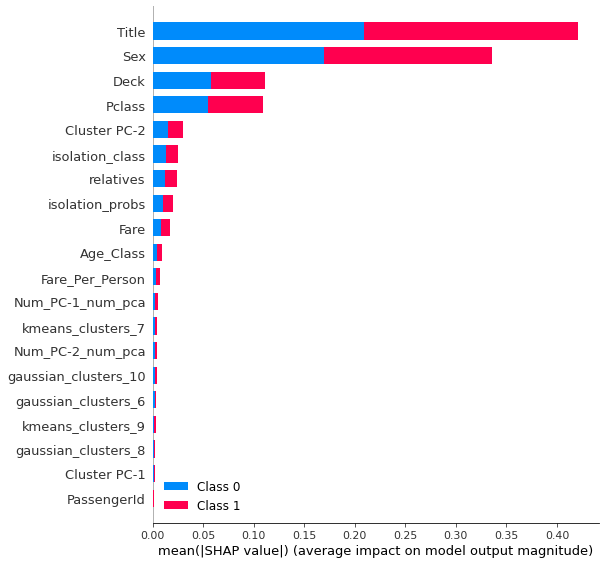

<Figure size 1152x864 with 0 Axes>

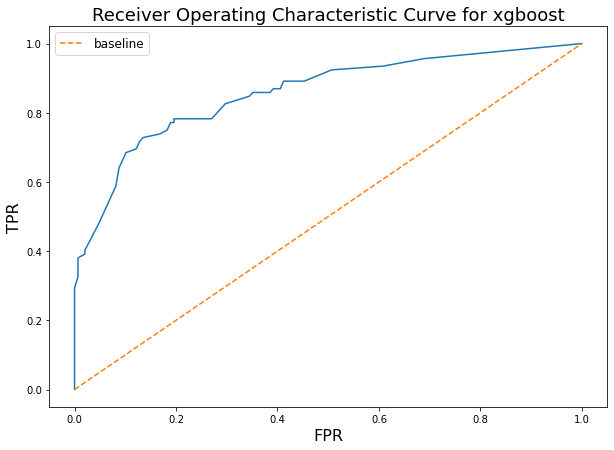

The ROC_AUC score is 0.8549133372502937


The Matthew correlation is 0.6147598786229392
-------------------
The accuracy is 0.8208333333333333
The recall is 0.8208333333333333
The macro F1 score is 0.8025673891832948
The micro F1 score is 0.8208333333333333
The weighted F1 score is 0.8165796203120916
              precision    recall  f1-score   support

         0.0       0.82      0.91      0.86       148
         1.0       0.83      0.67      0.74        92

    accuracy                           0.82       240
   macro avg       0.82      0.79      0.80       240
weighted avg       0.82      0.82      0.82       240



Started Execute test train split at 16:40:02.
Started Started column type detection and casting at 16:40:02.
Started Checking for duplicate columns at 16:40:02.
Started Reset dataframe index. at 16:40:02.
Started Select best features at 16:40:02.
Started Delete columns with high share of NULLs at 16:40:02.
Started Apply datetime transformation at 16:40:02.
Started Handle rare features at 16:40:02.
Started Remove cardinality at 16:40:02.
Started Holistic NULL filling at 16:40:02.
Started Binarize numeric columns + PCA binarized features at 16:40:02.
Started Onehot + PCA categorical features at 16:40:02.
Started Execute categorical encoding at 16:40:03.
Started Fill nulls at 16:40:03.
Started Handle outliers at 16:40:03.
Started Remove collinearity at 16:40:03.
Started Remove skewness at 16:40:03.
Started Execute clustering as a feature at 16:40:03.
Started Execute clustering as a feature at 16:40:03.
Started Execute clustering as a feature at 16:40:03.
Started Execute clustering as a fe

Score achieved on holdout dataset is: 0.5678885630303183.
End iteration for algorithm xgboost at 1637250004.4469657.
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Start iteration for algorithm lgbm at 1637250004.447986.
Started Delete columns with high share of NULLs at 16:40:04.
Started Apply datetime transformation at 16:40:04.
Started Handle rare features at 16:40:04.
Started Remove cardinality at 16:40:04.
Started Holistic NULL filling at 16:40:04.
Started Binarize numeric columns + PCA binarized features at 16:40:05.
Started Onehot + PCA categorical features at 16:40:05.
Started Execute categorical encoding at 16:40:05.
Started Fill nulls at 16:40:05.
Started Handle outliers at 16:40:05.
Started Remove collinearity at 16:40:06.
Started Remove skewness at 16:40:06.
Started Execute clustering as a feature at 16:40:06.
Started Scale data at 16:40:06.
Started Execute clustering as a feature at 16:40:07.
Started 

[I 2021-11-18 16:40:11,535] A new study created in memory with name: autotuned kmeans


Started PCA the clustering results. at 16:40:11.


  0%|          | 0/50 [00:00<?, ?it/s]

[I 2021-11-18 16:40:12,037] Trial 0 finished with value: 0.47162676809362714 and parameters: {'PassengerId': 0, 'Pclass': 1, 'Age': 1, 'Fare': 1, 'Deck': 0, 'Title': 0, 'relatives': 0, 'Age_Class': 1, 'Fare_Per_Person': 1, 'Embarked': 1, 'Sex': 0, 'PassengerId_binarized': 1, 'Pclass_binarized': 1, 'Age_binarized': 0, 'Fare_binarized': 0, 'Deck_binarized': 0, 'Title_binarized': 0, 'relatives_binarized': 1, 'Fare_Per_Person_binarized': 0, 'Num_PC-1_num_pca': 0, 'Num_PC-2_num_pca': 1, 'isolation_probs': 0, 'isolation_class': 0, 'Pclass_unskewed': 0, 'Deck_unskewed': 0, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 0, 'Deck_binarized_unskewed': 1, 'Title_unskewed': 1, 'relatives_unskewed': 0, 'Age_Class_unskewed': 1, 'Fare_Per_Person_unskewed': 0, 'Embarked_unskewed': 0, 'Sex_unskewed': 1, 'Num_PC-1_num_pca_unskewed': 1, 'dbscan_cluster_0.3': 1, 'kmeans_clusters_3': 0, 'kmeans_clusters_5': 0, 'kmeans_clusters_7': 1, 'kmeans_clusters_9': 0, 'gaussian_clusters_2': 0, 'gaussian_clus

[I 2021-11-18 16:40:19,187] Trial 7 finished with value: 0.5246543860325289 and parameters: {'PassengerId': 1, 'Pclass': 1, 'Age': 1, 'Fare': 0, 'Deck': 1, 'Title': 0, 'relatives': 1, 'Age_Class': 1, 'Fare_Per_Person': 0, 'Embarked': 1, 'Sex': 1, 'PassengerId_binarized': 0, 'Pclass_binarized': 0, 'Age_binarized': 0, 'Fare_binarized': 0, 'Deck_binarized': 0, 'Title_binarized': 1, 'relatives_binarized': 0, 'Fare_Per_Person_binarized': 0, 'Num_PC-1_num_pca': 1, 'Num_PC-2_num_pca': 0, 'isolation_probs': 1, 'isolation_class': 0, 'Pclass_unskewed': 0, 'Deck_unskewed': 1, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 1, 'Deck_binarized_unskewed': 1, 'Title_unskewed': 1, 'relatives_unskewed': 0, 'Age_Class_unskewed': 0, 'Fare_Per_Person_unskewed': 1, 'Embarked_unskewed': 1, 'Sex_unskewed': 1, 'Num_PC-1_num_pca_unskewed': 0, 'dbscan_cluster_0.3': 0, 'kmeans_clusters_3': 1, 'kmeans_clusters_5': 0, 'kmeans_clusters_7': 1, 'kmeans_clusters_9': 1, 'gaussian_clusters_2': 0, 'gaussian_clust

[I 2021-11-18 16:40:27,584] Trial 14 finished with value: 0.5369513500140745 and parameters: {'PassengerId': 1, 'Pclass': 1, 'Age': 1, 'Fare': 1, 'Deck': 1, 'Title': 0, 'relatives': 0, 'Age_Class': 1, 'Fare_Per_Person': 0, 'Embarked': 0, 'Sex': 0, 'PassengerId_binarized': 1, 'Pclass_binarized': 1, 'Age_binarized': 0, 'Fare_binarized': 0, 'Deck_binarized': 0, 'Title_binarized': 1, 'relatives_binarized': 0, 'Fare_Per_Person_binarized': 1, 'Num_PC-1_num_pca': 1, 'Num_PC-2_num_pca': 0, 'isolation_probs': 0, 'isolation_class': 1, 'Pclass_unskewed': 1, 'Deck_unskewed': 1, 'Age_binarized_unskewed': 0, 'Fare_binarized_unskewed': 0, 'Deck_binarized_unskewed': 0, 'Title_unskewed': 0, 'relatives_unskewed': 1, 'Age_Class_unskewed': 1, 'Fare_Per_Person_unskewed': 1, 'Embarked_unskewed': 1, 'Sex_unskewed': 1, 'Num_PC-1_num_pca_unskewed': 1, 'dbscan_cluster_0.3': 1, 'kmeans_clusters_3': 1, 'kmeans_clusters_5': 1, 'kmeans_clusters_7': 0, 'kmeans_clusters_9': 0, 'gaussian_clusters_2': 1, 'gaussian_clus

[I 2021-11-18 16:40:35,411] Trial 21 finished with value: 0.6304462412718475 and parameters: {'PassengerId': 0, 'Pclass': 1, 'Age': 0, 'Fare': 1, 'Deck': 1, 'Title': 0, 'relatives': 1, 'Age_Class': 0, 'Fare_Per_Person': 0, 'Embarked': 0, 'Sex': 1, 'PassengerId_binarized': 1, 'Pclass_binarized': 0, 'Age_binarized': 0, 'Fare_binarized': 1, 'Deck_binarized': 1, 'Title_binarized': 0, 'relatives_binarized': 1, 'Fare_Per_Person_binarized': 1, 'Num_PC-1_num_pca': 1, 'Num_PC-2_num_pca': 0, 'isolation_probs': 0, 'isolation_class': 1, 'Pclass_unskewed': 1, 'Deck_unskewed': 1, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 0, 'Deck_binarized_unskewed': 1, 'Title_unskewed': 1, 'relatives_unskewed': 1, 'Age_Class_unskewed': 0, 'Fare_Per_Person_unskewed': 1, 'Embarked_unskewed': 1, 'Sex_unskewed': 1, 'Num_PC-1_num_pca_unskewed': 1, 'dbscan_cluster_0.3': 0, 'kmeans_clusters_3': 0, 'kmeans_clusters_5': 1, 'kmeans_clusters_7': 1, 'kmeans_clusters_9': 0, 'gaussian_clusters_2': 1, 'gaussian_clus

[I 2021-11-18 16:40:40,045] Trial 28 finished with value: 0.5302653608549281 and parameters: {'PassengerId': 0, 'Pclass': 1, 'Age': 0, 'Fare': 1, 'Deck': 1, 'Title': 0, 'relatives': 1, 'Age_Class': 1, 'Fare_Per_Person': 0, 'Embarked': 0, 'Sex': 1, 'PassengerId_binarized': 0, 'Pclass_binarized': 1, 'Age_binarized': 0, 'Fare_binarized': 1, 'Deck_binarized': 1, 'Title_binarized': 1, 'relatives_binarized': 0, 'Fare_Per_Person_binarized': 0, 'Num_PC-1_num_pca': 0, 'Num_PC-2_num_pca': 1, 'isolation_probs': 1, 'isolation_class': 1, 'Pclass_unskewed': 1, 'Deck_unskewed': 1, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 0, 'Deck_binarized_unskewed': 1, 'Title_unskewed': 1, 'relatives_unskewed': 1, 'Age_Class_unskewed': 0, 'Fare_Per_Person_unskewed': 1, 'Embarked_unskewed': 1, 'Sex_unskewed': 1, 'Num_PC-1_num_pca_unskewed': 1, 'dbscan_cluster_0.3': 1, 'kmeans_clusters_3': 1, 'kmeans_clusters_5': 1, 'kmeans_clusters_7': 1, 'kmeans_clusters_9': 0, 'gaussian_clusters_2': 0, 'gaussian_clus

[I 2021-11-18 16:40:43,472] Trial 35 finished with value: 0.5393079411389422 and parameters: {'PassengerId': 0, 'Pclass': 1, 'Age': 0, 'Fare': 1, 'Deck': 1, 'Title': 0, 'relatives': 1, 'Age_Class': 0, 'Fare_Per_Person': 0, 'Embarked': 0, 'Sex': 1, 'PassengerId_binarized': 1, 'Pclass_binarized': 0, 'Age_binarized': 0, 'Fare_binarized': 1, 'Deck_binarized': 1, 'Title_binarized': 0, 'relatives_binarized': 1, 'Fare_Per_Person_binarized': 1, 'Num_PC-1_num_pca': 0, 'Num_PC-2_num_pca': 0, 'isolation_probs': 0, 'isolation_class': 1, 'Pclass_unskewed': 1, 'Deck_unskewed': 1, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 0, 'Deck_binarized_unskewed': 1, 'Title_unskewed': 1, 'relatives_unskewed': 1, 'Age_Class_unskewed': 0, 'Fare_Per_Person_unskewed': 1, 'Embarked_unskewed': 0, 'Sex_unskewed': 1, 'Num_PC-1_num_pca_unskewed': 1, 'dbscan_cluster_0.3': 0, 'kmeans_clusters_3': 0, 'kmeans_clusters_5': 0, 'kmeans_clusters_7': 1, 'kmeans_clusters_9': 0, 'gaussian_clusters_2': 1, 'gaussian_clus

[I 2021-11-18 16:40:46,554] Trial 42 finished with value: 0.5590899992385646 and parameters: {'PassengerId': 0, 'Pclass': 0, 'Age': 0, 'Fare': 1, 'Deck': 1, 'Title': 0, 'relatives': 0, 'Age_Class': 1, 'Fare_Per_Person': 0, 'Embarked': 0, 'Sex': 1, 'PassengerId_binarized': 0, 'Pclass_binarized': 1, 'Age_binarized': 1, 'Fare_binarized': 1, 'Deck_binarized': 1, 'Title_binarized': 0, 'relatives_binarized': 0, 'Fare_Per_Person_binarized': 0, 'Num_PC-1_num_pca': 1, 'Num_PC-2_num_pca': 0, 'isolation_probs': 1, 'isolation_class': 1, 'Pclass_unskewed': 1, 'Deck_unskewed': 1, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 0, 'Deck_binarized_unskewed': 1, 'Title_unskewed': 1, 'relatives_unskewed': 1, 'Age_Class_unskewed': 1, 'Fare_Per_Person_unskewed': 1, 'Embarked_unskewed': 1, 'Sex_unskewed': 1, 'Num_PC-1_num_pca_unskewed': 1, 'dbscan_cluster_0.3': 1, 'kmeans_clusters_3': 0, 'kmeans_clusters_5': 1, 'kmeans_clusters_7': 1, 'kmeans_clusters_9': 1, 'gaussian_clusters_2': 0, 'gaussian_clus

[I 2021-11-18 16:40:50,034] Trial 49 finished with value: 0.544586254396365 and parameters: {'PassengerId': 1, 'Pclass': 0, 'Age': 0, 'Fare': 1, 'Deck': 1, 'Title': 0, 'relatives': 0, 'Age_Class': 0, 'Fare_Per_Person': 1, 'Embarked': 0, 'Sex': 0, 'PassengerId_binarized': 1, 'Pclass_binarized': 0, 'Age_binarized': 0, 'Fare_binarized': 1, 'Deck_binarized': 0, 'Title_binarized': 1, 'relatives_binarized': 0, 'Fare_Per_Person_binarized': 1, 'Num_PC-1_num_pca': 0, 'Num_PC-2_num_pca': 0, 'isolation_probs': 0, 'isolation_class': 0, 'Pclass_unskewed': 1, 'Deck_unskewed': 1, 'Age_binarized_unskewed': 0, 'Fare_binarized_unskewed': 0, 'Deck_binarized_unskewed': 1, 'Title_unskewed': 0, 'relatives_unskewed': 1, 'Age_Class_unskewed': 0, 'Fare_Per_Person_unskewed': 0, 'Embarked_unskewed': 1, 'Sex_unskewed': 0, 'Num_PC-1_num_pca_unskewed': 1, 'dbscan_cluster_0.3': 1, 'kmeans_clusters_3': 1, 'kmeans_clusters_5': 1, 'kmeans_clusters_7': 1, 'kmeans_clusters_9': 1, 'gaussian_clusters_2': 1, 'gaussian_clust

Started Select best features at 16:40:51.
Features before selection are...PassengerId
Features before selection are...Pclass
Features before selection are...Age
Features before selection are...Fare
Features before selection are...Deck
Features before selection are...Title
Features before selection are...relatives
Features before selection are...Age_Class
Features before selection are...Fare_Per_Person
Features before selection are...Embarked
Features before selection are...Sex
Features before selection are...PassengerId_binarized
Features before selection are...Pclass_binarized
Features before selection are...Age_binarized
Features before selection are...Fare_binarized
Features before selection are...Deck_binarized
Features before selection are...Title_binarized
Features before selection are...relatives_binarized
Features before selection are...Fare_Per_Person_binarized
Features before selection are...Num_PC-1_num_pca
Features before selection are...Num_PC-2_num_pca
Features before sel

[LightGBM] [Fatal] GPU Tree Learner was not enabled in this build.
Please recompile with CMake option -DUSE_GPU=1
[I 2021-11-18 16:40:55,777] A new study created in memory with name: lgbm tuning


Started Sort columns alphabetically at 16:40:55.
Started Train LGBM at 16:40:55.
Started Check LGBM for GPU acceleration. at 16:40:55.
LGBM uses CPU.


  0%|          | 0/3 [00:00<?, ?it/s]

[I 2021-11-18 16:40:55,871] Trial 0 finished with value: 0.6914424453713064 and parameters: {'num_boost_round': 18789, 'lambda_l1': 506157.68887523044, 'lambda_l2': 24658.3294585491, 'num_leaves': 154, 'feature_fraction': 0.4936111842654619, 'feature_fraction_bynode': 0.49359671220172163, 'learning_rate': 1.7073967431528103e-05}. Best is trial 0 with value: 0.6914424453713064.
[I 2021-11-18 16:40:56,006] Trial 1 finished with value: 0.6914424453713063 and parameters: {'num_boost_round': 43323, 'lambda_l1': 4042.8727350273302, 'lambda_l2': 17718.847354806814, 'num_leaves': 7, 'feature_fraction': 0.9819459112971965, 'feature_fraction_bynode': 0.899465584480253, 'learning_rate': 7.068974950624602e-05}. Best is trial 1 with value: 0.6914424453713063.
[I 2021-11-18 16:41:10,503] Trial 2 finished with value: 0.479233143617087 and parameters: {'num_boost_round': 9173, 'lambda_l1': 12.601639723276797, 'lambda_l2': 66.904211664988, 'num_leaves': 135, 'feature_fraction': 0.6591670111852694, 'fea

[1]	train's binary_logloss: 0.66643	valid's binary_logloss: 0.665339
Training until validation scores don't improve for 10 rounds
[2]	train's binary_logloss: 0.666049	valid's binary_logloss: 0.664987
[3]	train's binary_logloss: 0.66582	valid's binary_logloss: 0.664782
[4]	train's binary_logloss: 0.66557	valid's binary_logloss: 0.664537
[5]	train's binary_logloss: 0.66522	valid's binary_logloss: 0.664194
[6]	train's binary_logloss: 0.664977	valid's binary_logloss: 0.663961
[7]	train's binary_logloss: 0.664586	valid's binary_logloss: 0.663607
[8]	train's binary_logloss: 0.664321	valid's binary_logloss: 0.663356
[9]	train's binary_logloss: 0.663973	valid's binary_logloss: 0.663016
[10]	train's binary_logloss: 0.663706	valid's binary_logloss: 0.662752
[11]	train's binary_logloss: 0.663592	valid's binary_logloss: 0.66266
[12]	train's binary_logloss: 0.66322	valid's binary_logloss: 0.662301
[13]	train's binary_logloss: 0.662851	valid's binary_logloss: 0.661957
[14]	train's binary_logloss: 0.

[366]	train's binary_logloss: 0.58253	valid's binary_logloss: 0.586626
[367]	train's binary_logloss: 0.582293	valid's binary_logloss: 0.5864
[368]	train's binary_logloss: 0.582101	valid's binary_logloss: 0.58622
[369]	train's binary_logloss: 0.581913	valid's binary_logloss: 0.586029
[370]	train's binary_logloss: 0.581709	valid's binary_logloss: 0.585844
[371]	train's binary_logloss: 0.581523	valid's binary_logloss: 0.585664
[372]	train's binary_logloss: 0.581441	valid's binary_logloss: 0.585598
[373]	train's binary_logloss: 0.581227	valid's binary_logloss: 0.58538
[374]	train's binary_logloss: 0.581004	valid's binary_logloss: 0.585156
[375]	train's binary_logloss: 0.580902	valid's binary_logloss: 0.585054
[376]	train's binary_logloss: 0.580692	valid's binary_logloss: 0.584861
[377]	train's binary_logloss: 0.580536	valid's binary_logloss: 0.584736
[378]	train's binary_logloss: 0.580331	valid's binary_logloss: 0.584552
[379]	train's binary_logloss: 0.58014	valid's binary_logloss: 0.58438

[917]	train's binary_logloss: 0.517041	valid's binary_logloss: 0.526878
[918]	train's binary_logloss: 0.516947	valid's binary_logloss: 0.526798
[919]	train's binary_logloss: 0.516873	valid's binary_logloss: 0.526728
[920]	train's binary_logloss: 0.516772	valid's binary_logloss: 0.526626
[921]	train's binary_logloss: 0.516746	valid's binary_logloss: 0.526601
[922]	train's binary_logloss: 0.516653	valid's binary_logloss: 0.526516
[923]	train's binary_logloss: 0.516554	valid's binary_logloss: 0.526428
[924]	train's binary_logloss: 0.516459	valid's binary_logloss: 0.52634
[925]	train's binary_logloss: 0.516359	valid's binary_logloss: 0.526238
[926]	train's binary_logloss: 0.516263	valid's binary_logloss: 0.526151
[927]	train's binary_logloss: 0.516167	valid's binary_logloss: 0.526059
[928]	train's binary_logloss: 0.516072	valid's binary_logloss: 0.525969
[929]	train's binary_logloss: 0.516025	valid's binary_logloss: 0.525928
[930]	train's binary_logloss: 0.515978	valid's binary_logloss: 0.

[1561]	train's binary_logloss: 0.481613	valid's binary_logloss: 0.495615
[1562]	train's binary_logloss: 0.481564	valid's binary_logloss: 0.495575
[1563]	train's binary_logloss: 0.481541	valid's binary_logloss: 0.495555
[1564]	train's binary_logloss: 0.481505	valid's binary_logloss: 0.49553
[1565]	train's binary_logloss: 0.481497	valid's binary_logloss: 0.495526
[1566]	train's binary_logloss: 0.481459	valid's binary_logloss: 0.495492
[1567]	train's binary_logloss: 0.481439	valid's binary_logloss: 0.495482
[1568]	train's binary_logloss: 0.481431	valid's binary_logloss: 0.495478
[1569]	train's binary_logloss: 0.481382	valid's binary_logloss: 0.495433
[1570]	train's binary_logloss: 0.481339	valid's binary_logloss: 0.495398
[1571]	train's binary_logloss: 0.481295	valid's binary_logloss: 0.495363
[1572]	train's binary_logloss: 0.481249	valid's binary_logloss: 0.495328
[1573]	train's binary_logloss: 0.481213	valid's binary_logloss: 0.495291
[1574]	train's binary_logloss: 0.481209	valid's bina

[2189]	train's binary_logloss: 0.464409	valid's binary_logloss: 0.480905
[2190]	train's binary_logloss: 0.46439	valid's binary_logloss: 0.48089
[2191]	train's binary_logloss: 0.464371	valid's binary_logloss: 0.480875
[2192]	train's binary_logloss: 0.464348	valid's binary_logloss: 0.480854
[2193]	train's binary_logloss: 0.464327	valid's binary_logloss: 0.480832
[2194]	train's binary_logloss: 0.464311	valid's binary_logloss: 0.480817
[2195]	train's binary_logloss: 0.464294	valid's binary_logloss: 0.480802
[2196]	train's binary_logloss: 0.464272	valid's binary_logloss: 0.480781
[2197]	train's binary_logloss: 0.464248	valid's binary_logloss: 0.480762
[2198]	train's binary_logloss: 0.464248	valid's binary_logloss: 0.480762
[2199]	train's binary_logloss: 0.464215	valid's binary_logloss: 0.480734
[2200]	train's binary_logloss: 0.464188	valid's binary_logloss: 0.480708
[2201]	train's binary_logloss: 0.464167	valid's binary_logloss: 0.480689
[2202]	train's binary_logloss: 0.464144	valid's binar

[2843]	train's binary_logloss: 0.455051	valid's binary_logloss: 0.473067
[2844]	train's binary_logloss: 0.455042	valid's binary_logloss: 0.473059
[2845]	train's binary_logloss: 0.455033	valid's binary_logloss: 0.473054
[2846]	train's binary_logloss: 0.455018	valid's binary_logloss: 0.473039
[2847]	train's binary_logloss: 0.455005	valid's binary_logloss: 0.473031
[2848]	train's binary_logloss: 0.454999	valid's binary_logloss: 0.473027
[2849]	train's binary_logloss: 0.454991	valid's binary_logloss: 0.47302
[2850]	train's binary_logloss: 0.454991	valid's binary_logloss: 0.47302
[2851]	train's binary_logloss: 0.454975	valid's binary_logloss: 0.473004
[2852]	train's binary_logloss: 0.454963	valid's binary_logloss: 0.472997
[2853]	train's binary_logloss: 0.45495	valid's binary_logloss: 0.472989
[2854]	train's binary_logloss: 0.45495	valid's binary_logloss: 0.472989
[2855]	train's binary_logloss: 0.454933	valid's binary_logloss: 0.472973
[2856]	train's binary_logloss: 0.454933	valid's binary_

[3226]	train's binary_logloss: 0.451618	valid's binary_logloss: 0.470267
[3227]	train's binary_logloss: 0.451618	valid's binary_logloss: 0.470267
[3228]	train's binary_logloss: 0.451612	valid's binary_logloss: 0.470261
[3229]	train's binary_logloss: 0.451598	valid's binary_logloss: 0.470248
[3230]	train's binary_logloss: 0.451584	valid's binary_logloss: 0.470235
[3231]	train's binary_logloss: 0.451584	valid's binary_logloss: 0.470235
[3232]	train's binary_logloss: 0.451578	valid's binary_logloss: 0.47023
[3233]	train's binary_logloss: 0.451573	valid's binary_logloss: 0.470226
[3234]	train's binary_logloss: 0.451562	valid's binary_logloss: 0.470219
[3235]	train's binary_logloss: 0.451549	valid's binary_logloss: 0.470206
[3236]	train's binary_logloss: 0.451535	valid's binary_logloss: 0.470193
[3237]	train's binary_logloss: 0.451525	valid's binary_logloss: 0.470188
[3238]	train's binary_logloss: 0.451509	valid's binary_logloss: 0.470173
[3239]	train's binary_logloss: 0.451495	valid's bina

[4111]	train's binary_logloss: 0.446219	valid's binary_logloss: 0.466034
[4112]	train's binary_logloss: 0.446217	valid's binary_logloss: 0.466032
[4113]	train's binary_logloss: 0.446214	valid's binary_logloss: 0.46603
[4114]	train's binary_logloss: 0.44621	valid's binary_logloss: 0.466028
[4115]	train's binary_logloss: 0.44621	valid's binary_logloss: 0.466028
[4116]	train's binary_logloss: 0.446206	valid's binary_logloss: 0.466026
[4117]	train's binary_logloss: 0.446203	valid's binary_logloss: 0.466024
[4118]	train's binary_logloss: 0.446199	valid's binary_logloss: 0.466022
[4119]	train's binary_logloss: 0.446197	valid's binary_logloss: 0.466021
[4120]	train's binary_logloss: 0.446191	valid's binary_logloss: 0.466018
[4121]	train's binary_logloss: 0.446188	valid's binary_logloss: 0.466016
[4122]	train's binary_logloss: 0.446181	valid's binary_logloss: 0.466013
[4123]	train's binary_logloss: 0.446181	valid's binary_logloss: 0.466013
[4124]	train's binary_logloss: 0.44617	valid's binary_

[4842]	train's binary_logloss: 0.443493	valid's binary_logloss: 0.464079
[4843]	train's binary_logloss: 0.443492	valid's binary_logloss: 0.464079
[4844]	train's binary_logloss: 0.443487	valid's binary_logloss: 0.464076
[4845]	train's binary_logloss: 0.443487	valid's binary_logloss: 0.464076
[4846]	train's binary_logloss: 0.443486	valid's binary_logloss: 0.464076
[4847]	train's binary_logloss: 0.443485	valid's binary_logloss: 0.464075
[4848]	train's binary_logloss: 0.443481	valid's binary_logloss: 0.464073
[4849]	train's binary_logloss: 0.44348	valid's binary_logloss: 0.464073
[4850]	train's binary_logloss: 0.443476	valid's binary_logloss: 0.46407
[4851]	train's binary_logloss: 0.443473	valid's binary_logloss: 0.464069
[4852]	train's binary_logloss: 0.443472	valid's binary_logloss: 0.464069
[4853]	train's binary_logloss: 0.443472	valid's binary_logloss: 0.464069
[4854]	train's binary_logloss: 0.443468	valid's binary_logloss: 0.464067
[4855]	train's binary_logloss: 0.443467	valid's binar

[5641]	train's binary_logloss: 0.441514	valid's binary_logloss: 0.462652
[5642]	train's binary_logloss: 0.441514	valid's binary_logloss: 0.462652
[5643]	train's binary_logloss: 0.441511	valid's binary_logloss: 0.46265
[5644]	train's binary_logloss: 0.441511	valid's binary_logloss: 0.46265
[5645]	train's binary_logloss: 0.441508	valid's binary_logloss: 0.462648
[5646]	train's binary_logloss: 0.441507	valid's binary_logloss: 0.462648
[5647]	train's binary_logloss: 0.441504	valid's binary_logloss: 0.462646
[5648]	train's binary_logloss: 0.441501	valid's binary_logloss: 0.462645
[5649]	train's binary_logloss: 0.441498	valid's binary_logloss: 0.462643
[5650]	train's binary_logloss: 0.441496	valid's binary_logloss: 0.462641
[5651]	train's binary_logloss: 0.441493	valid's binary_logloss: 0.46264
[5652]	train's binary_logloss: 0.441491	valid's binary_logloss: 0.462639
[5653]	train's binary_logloss: 0.44149	valid's binary_logloss: 0.462638
[5654]	train's binary_logloss: 0.44149	valid's binary_l

[6385]	train's binary_logloss: 0.440379	valid's binary_logloss: 0.461835
[6386]	train's binary_logloss: 0.440379	valid's binary_logloss: 0.461835
[6387]	train's binary_logloss: 0.440379	valid's binary_logloss: 0.461835
[6388]	train's binary_logloss: 0.440379	valid's binary_logloss: 0.461835
[6389]	train's binary_logloss: 0.440379	valid's binary_logloss: 0.461835
[6390]	train's binary_logloss: 0.440379	valid's binary_logloss: 0.461835
[6391]	train's binary_logloss: 0.440378	valid's binary_logloss: 0.461835
[6392]	train's binary_logloss: 0.440378	valid's binary_logloss: 0.461835
[6393]	train's binary_logloss: 0.440378	valid's binary_logloss: 0.461835
[6394]	train's binary_logloss: 0.440378	valid's binary_logloss: 0.461835
[6395]	train's binary_logloss: 0.440377	valid's binary_logloss: 0.461834
[6396]	train's binary_logloss: 0.440377	valid's binary_logloss: 0.461834
[6397]	train's binary_logloss: 0.440377	valid's binary_logloss: 0.461834
[6398]	train's binary_logloss: 0.440376	valid's bin

[7228]	train's binary_logloss: 0.440223	valid's binary_logloss: 0.461775
[7229]	train's binary_logloss: 0.440223	valid's binary_logloss: 0.461775
[7230]	train's binary_logloss: 0.440223	valid's binary_logloss: 0.461775
[7231]	train's binary_logloss: 0.440223	valid's binary_logloss: 0.461775
[7232]	train's binary_logloss: 0.440223	valid's binary_logloss: 0.461775
[7233]	train's binary_logloss: 0.440223	valid's binary_logloss: 0.461775
[7234]	train's binary_logloss: 0.440223	valid's binary_logloss: 0.461775
[7235]	train's binary_logloss: 0.440222	valid's binary_logloss: 0.461775
[7236]	train's binary_logloss: 0.440222	valid's binary_logloss: 0.461775
[7237]	train's binary_logloss: 0.440222	valid's binary_logloss: 0.461775
[7238]	train's binary_logloss: 0.440222	valid's binary_logloss: 0.461775
[7239]	train's binary_logloss: 0.440222	valid's binary_logloss: 0.461775
[7240]	train's binary_logloss: 0.440222	valid's binary_logloss: 0.461775
[7241]	train's binary_logloss: 0.440222	valid's bin

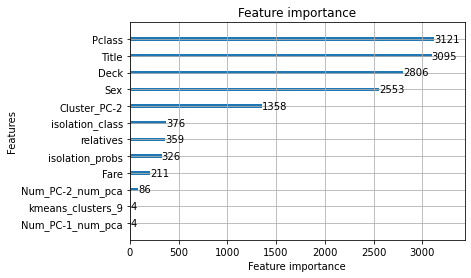

<Figure size 1152x864 with 0 Axes>

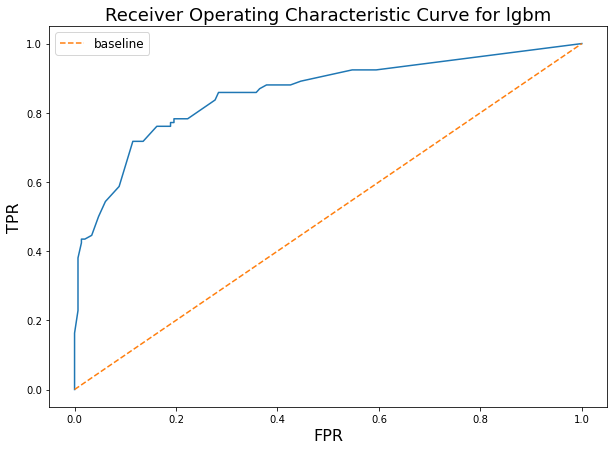

The ROC_AUC score is 0.8564189189189189


The Matthew correlation is 0.6159025581474286
-------------------
The accuracy is 0.8208333333333333
The recall is 0.8208333333333333
The macro F1 score is 0.8066510538641686
The micro F1 score is 0.8208333333333333
The weighted F1 score is 0.8188696330991412
              precision    recall  f1-score   support

         0.0       0.83      0.89      0.86       148
         1.0       0.80      0.72      0.75        92

    accuracy                           0.82       240
   macro avg       0.81      0.80      0.81       240
weighted avg       0.82      0.82      0.82       240



Started Execute test train split at 16:41:13.
Started Started column type detection and casting at 16:41:13.
Started Checking for duplicate columns at 16:41:13.
Started Reset dataframe index. at 16:41:13.
Started Select best features at 16:41:13.
Started Delete columns with high share of NULLs at 16:41:13.
Started Apply datetime transformation at 16:41:13.
Started Handle rare features at 16:41:13.
Started Remove cardinality at 16:41:13.
Started Holistic NULL filling at 16:41:13.
Started Binarize numeric columns + PCA binarized features at 16:41:13.
Started Onehot + PCA categorical features at 16:41:13.
Started Execute categorical encoding at 16:41:14.
Started Fill nulls at 16:41:14.
Started Handle outliers at 16:41:14.
Started Remove collinearity at 16:41:14.
Started Remove skewness at 16:41:14.
Started Execute clustering as a feature at 16:41:14.
Started Execute clustering as a feature at 16:41:14.
Started Execute clustering as a feature at 16:41:14.
Started Execute clustering as a fe

Score achieved on holdout dataset is: 0.5930289444148501.
End iteration for algorithm lgbm at 1637250075.4895663.
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Start iteration for algorithm tabnet at 1637250075.49039.
Started Delete columns with high share of NULLs at 16:41:15.
Started Apply datetime transformation at 16:41:15.
Started Handle rare features at 16:41:15.
Started Remove cardinality at 16:41:15.
Started Holistic NULL filling at 16:41:15.
Started Binarize numeric columns + PCA binarized features at 16:41:16.
Started Onehot + PCA categorical features at 16:41:16.
Started Execute categorical encoding at 16:41:16.
Started Fill nulls at 16:41:16.
Started Handle outliers at 16:41:16.
Started Remove collinearity at 16:41:17.
Started Remove skewness at 16:41:17.
Started Execute clustering as a feature at 16:41:17.
Started Scale data at 16:41:17.
Started Execute clustering as a feature at 16:41:18.
Started Ex

[I 2021-11-18 16:41:22,337] A new study created in memory with name: autotuned kmeans


Started PCA the clustering results. at 16:41:22.


  0%|          | 0/50 [00:00<?, ?it/s]

[I 2021-11-18 16:41:22,838] Trial 0 finished with value: 0.4780019159190315 and parameters: {'PassengerId': 0, 'Pclass': 1, 'Age': 1, 'Fare': 1, 'Deck': 0, 'Title': 0, 'relatives': 0, 'Age_Class': 1, 'Fare_Per_Person': 1, 'Embarked': 1, 'Sex': 0, 'PassengerId_binarized': 1, 'Pclass_binarized': 1, 'Age_binarized': 0, 'Fare_binarized': 0, 'Deck_binarized': 0, 'Title_binarized': 0, 'relatives_binarized': 1, 'Fare_Per_Person_binarized': 0, 'Num_PC-1_num_pca': 0, 'Num_PC-2_num_pca': 1, 'isolation_probs': 0, 'isolation_class': 0, 'Pclass_unskewed': 0, 'Deck_unskewed': 0, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 0, 'Deck_binarized_unskewed': 1, 'Title_unskewed': 1, 'relatives_unskewed': 0, 'Age_Class_unskewed': 1, 'Fare_Per_Person_unskewed': 0, 'Embarked_unskewed': 0, 'Sex_unskewed': 1, 'Num_PC-1_num_pca_unskewed': 1, 'dbscan_cluster_0.3': 1, 'kmeans_clusters_3': 0, 'kmeans_clusters_5': 0, 'kmeans_clusters_7': 1, 'kmeans_clusters_9': 0, 'gaussian_clusters_2': 0, 'gaussian_clust

[I 2021-11-18 16:41:29,984] Trial 7 finished with value: 0.5243551349482276 and parameters: {'PassengerId': 1, 'Pclass': 1, 'Age': 1, 'Fare': 0, 'Deck': 1, 'Title': 0, 'relatives': 1, 'Age_Class': 1, 'Fare_Per_Person': 0, 'Embarked': 1, 'Sex': 1, 'PassengerId_binarized': 0, 'Pclass_binarized': 0, 'Age_binarized': 0, 'Fare_binarized': 0, 'Deck_binarized': 0, 'Title_binarized': 1, 'relatives_binarized': 0, 'Fare_Per_Person_binarized': 0, 'Num_PC-1_num_pca': 1, 'Num_PC-2_num_pca': 0, 'isolation_probs': 1, 'isolation_class': 0, 'Pclass_unskewed': 0, 'Deck_unskewed': 1, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 1, 'Deck_binarized_unskewed': 1, 'Title_unskewed': 1, 'relatives_unskewed': 0, 'Age_Class_unskewed': 0, 'Fare_Per_Person_unskewed': 1, 'Embarked_unskewed': 1, 'Sex_unskewed': 1, 'Num_PC-1_num_pca_unskewed': 0, 'dbscan_cluster_0.3': 0, 'kmeans_clusters_3': 1, 'kmeans_clusters_5': 0, 'kmeans_clusters_7': 1, 'kmeans_clusters_9': 1, 'gaussian_clusters_2': 0, 'gaussian_clust

[I 2021-11-18 16:41:38,252] Trial 14 finished with value: 0.5383350139099251 and parameters: {'PassengerId': 1, 'Pclass': 1, 'Age': 1, 'Fare': 1, 'Deck': 1, 'Title': 0, 'relatives': 0, 'Age_Class': 1, 'Fare_Per_Person': 0, 'Embarked': 0, 'Sex': 0, 'PassengerId_binarized': 1, 'Pclass_binarized': 1, 'Age_binarized': 0, 'Fare_binarized': 0, 'Deck_binarized': 0, 'Title_binarized': 1, 'relatives_binarized': 0, 'Fare_Per_Person_binarized': 1, 'Num_PC-1_num_pca': 1, 'Num_PC-2_num_pca': 0, 'isolation_probs': 0, 'isolation_class': 1, 'Pclass_unskewed': 1, 'Deck_unskewed': 1, 'Age_binarized_unskewed': 0, 'Fare_binarized_unskewed': 0, 'Deck_binarized_unskewed': 0, 'Title_unskewed': 0, 'relatives_unskewed': 1, 'Age_Class_unskewed': 1, 'Fare_Per_Person_unskewed': 1, 'Embarked_unskewed': 1, 'Sex_unskewed': 1, 'Num_PC-1_num_pca_unskewed': 1, 'dbscan_cluster_0.3': 1, 'kmeans_clusters_3': 1, 'kmeans_clusters_5': 1, 'kmeans_clusters_7': 0, 'kmeans_clusters_9': 0, 'gaussian_clusters_2': 1, 'gaussian_clus

[I 2021-11-18 16:41:46,208] Trial 21 finished with value: 0.630555084755377 and parameters: {'PassengerId': 0, 'Pclass': 1, 'Age': 0, 'Fare': 1, 'Deck': 1, 'Title': 0, 'relatives': 1, 'Age_Class': 0, 'Fare_Per_Person': 0, 'Embarked': 0, 'Sex': 1, 'PassengerId_binarized': 1, 'Pclass_binarized': 0, 'Age_binarized': 0, 'Fare_binarized': 1, 'Deck_binarized': 1, 'Title_binarized': 0, 'relatives_binarized': 1, 'Fare_Per_Person_binarized': 1, 'Num_PC-1_num_pca': 1, 'Num_PC-2_num_pca': 0, 'isolation_probs': 0, 'isolation_class': 1, 'Pclass_unskewed': 1, 'Deck_unskewed': 1, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 0, 'Deck_binarized_unskewed': 1, 'Title_unskewed': 1, 'relatives_unskewed': 1, 'Age_Class_unskewed': 0, 'Fare_Per_Person_unskewed': 1, 'Embarked_unskewed': 1, 'Sex_unskewed': 1, 'Num_PC-1_num_pca_unskewed': 1, 'dbscan_cluster_0.3': 0, 'kmeans_clusters_3': 0, 'kmeans_clusters_5': 1, 'kmeans_clusters_7': 1, 'kmeans_clusters_9': 0, 'gaussian_clusters_2': 1, 'gaussian_clust

[I 2021-11-18 16:41:50,693] Trial 28 finished with value: 0.5811769920440665 and parameters: {'PassengerId': 0, 'Pclass': 1, 'Age': 0, 'Fare': 1, 'Deck': 1, 'Title': 0, 'relatives': 0, 'Age_Class': 1, 'Fare_Per_Person': 1, 'Embarked': 0, 'Sex': 1, 'PassengerId_binarized': 1, 'Pclass_binarized': 0, 'Age_binarized': 0, 'Fare_binarized': 1, 'Deck_binarized': 1, 'Title_binarized': 0, 'relatives_binarized': 1, 'Fare_Per_Person_binarized': 0, 'Num_PC-1_num_pca': 1, 'Num_PC-2_num_pca': 0, 'isolation_probs': 1, 'isolation_class': 1, 'Pclass_unskewed': 1, 'Deck_unskewed': 1, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 0, 'Deck_binarized_unskewed': 1, 'Title_unskewed': 1, 'relatives_unskewed': 1, 'Age_Class_unskewed': 0, 'Fare_Per_Person_unskewed': 1, 'Embarked_unskewed': 1, 'Sex_unskewed': 1, 'Num_PC-1_num_pca_unskewed': 1, 'dbscan_cluster_0.3': 1, 'kmeans_clusters_3': 1, 'kmeans_clusters_5': 1, 'kmeans_clusters_7': 1, 'kmeans_clusters_9': 1, 'gaussian_clusters_2': 1, 'gaussian_clus

[I 2021-11-18 16:41:55,779] Trial 35 finished with value: 0.5326975412523861 and parameters: {'PassengerId': 0, 'Pclass': 1, 'Age': 0, 'Fare': 0, 'Deck': 1, 'Title': 0, 'relatives': 1, 'Age_Class': 1, 'Fare_Per_Person': 0, 'Embarked': 0, 'Sex': 1, 'PassengerId_binarized': 1, 'Pclass_binarized': 0, 'Age_binarized': 0, 'Fare_binarized': 0, 'Deck_binarized': 1, 'Title_binarized': 0, 'relatives_binarized': 0, 'Fare_Per_Person_binarized': 0, 'Num_PC-1_num_pca': 0, 'Num_PC-2_num_pca': 0, 'isolation_probs': 1, 'isolation_class': 1, 'Pclass_unskewed': 0, 'Deck_unskewed': 1, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 0, 'Deck_binarized_unskewed': 1, 'Title_unskewed': 1, 'relatives_unskewed': 0, 'Age_Class_unskewed': 0, 'Fare_Per_Person_unskewed': 1, 'Embarked_unskewed': 1, 'Sex_unskewed': 1, 'Num_PC-1_num_pca_unskewed': 0, 'dbscan_cluster_0.3': 0, 'kmeans_clusters_3': 1, 'kmeans_clusters_5': 1, 'kmeans_clusters_7': 1, 'kmeans_clusters_9': 1, 'gaussian_clusters_2': 1, 'gaussian_clus

[I 2021-11-18 16:41:59,918] Trial 42 finished with value: 0.5449060318229295 and parameters: {'PassengerId': 0, 'Pclass': 1, 'Age': 1, 'Fare': 1, 'Deck': 1, 'Title': 0, 'relatives': 1, 'Age_Class': 1, 'Fare_Per_Person': 0, 'Embarked': 0, 'Sex': 0, 'PassengerId_binarized': 0, 'Pclass_binarized': 0, 'Age_binarized': 0, 'Fare_binarized': 1, 'Deck_binarized': 1, 'Title_binarized': 0, 'relatives_binarized': 1, 'Fare_Per_Person_binarized': 0, 'Num_PC-1_num_pca': 1, 'Num_PC-2_num_pca': 0, 'isolation_probs': 1, 'isolation_class': 0, 'Pclass_unskewed': 1, 'Deck_unskewed': 1, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 0, 'Deck_binarized_unskewed': 1, 'Title_unskewed': 1, 'relatives_unskewed': 1, 'Age_Class_unskewed': 0, 'Fare_Per_Person_unskewed': 1, 'Embarked_unskewed': 0, 'Sex_unskewed': 1, 'Num_PC-1_num_pca_unskewed': 1, 'dbscan_cluster_0.3': 1, 'kmeans_clusters_3': 1, 'kmeans_clusters_5': 1, 'kmeans_clusters_7': 1, 'kmeans_clusters_9': 1, 'gaussian_clusters_2': 1, 'gaussian_clus

[I 2021-11-18 16:42:03,268] Trial 49 finished with value: 0.5444182767473995 and parameters: {'PassengerId': 1, 'Pclass': 0, 'Age': 0, 'Fare': 1, 'Deck': 1, 'Title': 0, 'relatives': 0, 'Age_Class': 0, 'Fare_Per_Person': 1, 'Embarked': 0, 'Sex': 0, 'PassengerId_binarized': 1, 'Pclass_binarized': 0, 'Age_binarized': 0, 'Fare_binarized': 1, 'Deck_binarized': 0, 'Title_binarized': 1, 'relatives_binarized': 0, 'Fare_Per_Person_binarized': 1, 'Num_PC-1_num_pca': 0, 'Num_PC-2_num_pca': 0, 'isolation_probs': 0, 'isolation_class': 0, 'Pclass_unskewed': 1, 'Deck_unskewed': 1, 'Age_binarized_unskewed': 0, 'Fare_binarized_unskewed': 0, 'Deck_binarized_unskewed': 1, 'Title_unskewed': 0, 'relatives_unskewed': 1, 'Age_Class_unskewed': 0, 'Fare_Per_Person_unskewed': 0, 'Embarked_unskewed': 1, 'Sex_unskewed': 0, 'Num_PC-1_num_pca_unskewed': 1, 'dbscan_cluster_0.3': 1, 'kmeans_clusters_3': 1, 'kmeans_clusters_5': 1, 'kmeans_clusters_7': 1, 'kmeans_clusters_9': 1, 'gaussian_clusters_2': 1, 'gaussian_clus

Started Select best features at 16:42:05.
Features before selection are...PassengerId
Features before selection are...Pclass
Features before selection are...Age
Features before selection are...Fare
Features before selection are...Deck
Features before selection are...Title
Features before selection are...relatives
Features before selection are...Age_Class
Features before selection are...Fare_Per_Person
Features before selection are...Embarked
Features before selection are...Sex
Features before selection are...PassengerId_binarized
Features before selection are...Pclass_binarized
Features before selection are...Age_binarized
Features before selection are...Fare_binarized
Features before selection are...Deck_binarized
Features before selection are...Title_binarized
Features before selection are...relatives_binarized
Features before selection are...Fare_Per_Person_binarized
Features before selection are...Num_PC-1_num_pca
Features before selection are...Num_PC-2_num_pca
Features before sel

[I 2021-11-18 16:42:08,175] A new study created in memory with name: tabnet tuning


Started Sort columns alphabetically at 16:42:08.
Started Train Tabnet classification model at 16:42:08.


  0%|          | 0/3 [00:00<?, ?it/s]

Device used : cuda
epoch 0  | loss: 20.86343| val_0_unsup_loss: 835.50464|  0:00:00s
epoch 1  | loss: 5.30457 | val_0_unsup_loss: 15.21906|  0:00:00s
epoch 2  | loss: 2.16609 | val_0_unsup_loss: 6.22864 |  0:00:00s
epoch 3  | loss: 1.53092 | val_0_unsup_loss: 3.32798 |  0:00:01s
epoch 4  | loss: 1.30235 | val_0_unsup_loss: 1.50949 |  0:00:01s
epoch 5  | loss: 1.22913 | val_0_unsup_loss: 1.34664 |  0:00:01s
epoch 6  | loss: 1.22608 | val_0_unsup_loss: 2.46259 |  0:00:01s
epoch 7  | loss: 1.19375 | val_0_unsup_loss: 1.2635  |  0:00:02s
epoch 8  | loss: 1.21242 | val_0_unsup_loss: 1.47156 |  0:00:02s
epoch 9  | loss: 1.18532 | val_0_unsup_loss: 2.25927 |  0:00:02s
epoch 10 | loss: 1.19557 | val_0_unsup_loss: 1.21612 |  0:00:02s
epoch 11 | loss: 1.192   | val_0_unsup_loss: 1.27935 |  0:00:03s
epoch 12 | loss: 1.17877 | val_0_unsup_loss: 1.15283 |  0:00:03s
epoch 13 | loss: 1.22377 | val_0_unsup_loss: 1.26853 |  0:00:03s
epoch 14 | loss: 1.15783 | val_0_unsup_loss: 1.21892 |  0:00:03s
epoch

epoch 0  | loss: 0.69837 | val_0_matthews: 0.0     |  0:00:00s
epoch 1  | loss: 0.61831 | val_0_matthews: 0.01986 |  0:00:00s
epoch 2  | loss: 0.61353 | val_0_matthews: 0.20283 |  0:00:00s
epoch 3  | loss: 0.58093 | val_0_matthews: 0.08047 |  0:00:00s
epoch 4  | loss: 0.60807 | val_0_matthews: 0.13156 |  0:00:01s
epoch 5  | loss: 0.55873 | val_0_matthews: 0.28307 |  0:00:01s
epoch 6  | loss: 0.54851 | val_0_matthews: 0.3721  |  0:00:01s
epoch 7  | loss: 0.52556 | val_0_matthews: 0.12595 |  0:00:01s
epoch 8  | loss: 0.48904 | val_0_matthews: 0.406   |  0:00:01s
epoch 9  | loss: 0.51006 | val_0_matthews: 0.3362  |  0:00:02s
epoch 10 | loss: 0.48228 | val_0_matthews: 0.3362  |  0:00:02s
epoch 11 | loss: 0.49437 | val_0_matthews: 0.27929 |  0:00:02s
epoch 12 | loss: 0.49578 | val_0_matthews: 0.48801 |  0:00:02s
epoch 13 | loss: 0.48956 | val_0_matthews: 0.44096 |  0:00:03s
epoch 14 | loss: 0.46077 | val_0_matthews: 0.42101 |  0:00:03s
epoch 15 | loss: 0.48136 | val_0_matthews: 0.44159 |  0

epoch 26 | loss: 0.4762  | val_0_matthews: 0.7303  |  0:00:06s
epoch 27 | loss: 0.46459 | val_0_matthews: 0.68213 |  0:00:06s
epoch 28 | loss: 0.46157 | val_0_matthews: 0.63305 |  0:00:06s
epoch 29 | loss: 0.45944 | val_0_matthews: 0.63901 |  0:00:06s
epoch 30 | loss: 0.46871 | val_0_matthews: 0.58427 |  0:00:06s
epoch 31 | loss: 0.43489 | val_0_matthews: 0.53079 |  0:00:07s
epoch 32 | loss: 0.46401 | val_0_matthews: 0.6455  |  0:00:07s
epoch 33 | loss: 0.4652  | val_0_matthews: 0.44039 |  0:00:07s
epoch 34 | loss: 0.45421 | val_0_matthews: 0.68354 |  0:00:07s
epoch 35 | loss: 0.4615  | val_0_matthews: 0.53079 |  0:00:08s
epoch 36 | loss: 0.45158 | val_0_matthews: 0.62437 |  0:00:08s
epoch 37 | loss: 0.44817 | val_0_matthews: 0.74966 |  0:00:08s
epoch 38 | loss: 0.4313  | val_0_matthews: 0.74966 |  0:00:08s
epoch 39 | loss: 0.42138 | val_0_matthews: 0.6455  |  0:00:08s
epoch 40 | loss: 0.41448 | val_0_matthews: 0.78174 |  0:00:09s

Early stopping occurred at epoch 40 with best_epoch = 

epoch 5  | loss: 1.32688 | val_0_unsup_loss: 1.23418 |  0:00:01s
epoch 6  | loss: 1.27665 | val_0_unsup_loss: 1.39294 |  0:00:01s
epoch 7  | loss: 1.25891 | val_0_unsup_loss: 1.19474 |  0:00:02s
epoch 8  | loss: 1.20195 | val_0_unsup_loss: 1.26681 |  0:00:02s
epoch 9  | loss: 1.1955  | val_0_unsup_loss: 1.18134 |  0:00:02s
epoch 10 | loss: 1.22167 | val_0_unsup_loss: 1.21489 |  0:00:02s
epoch 11 | loss: 1.18714 | val_0_unsup_loss: 1.16638 |  0:00:03s
epoch 12 | loss: 1.188   | val_0_unsup_loss: 1.15688 |  0:00:03s
epoch 13 | loss: 1.17703 | val_0_unsup_loss: 1.17558 |  0:00:03s
epoch 14 | loss: 1.17568 | val_0_unsup_loss: 1.21044 |  0:00:03s
epoch 15 | loss: 1.17152 | val_0_unsup_loss: 1.16151 |  0:00:04s
Stop training because you reached max_epochs = 16 with best_epoch = 12 and best_val_0_unsup_loss = 1.15688
Best weights from best epoch are automatically used!
Device used : cuda
Loading weights from unsupervised pretraining
epoch 0  | loss: 0.65072 | val_0_matthews: 0.40462 |  0:00:0

epoch 27 | loss: 0.46712 | val_0_matthews: 0.55942 |  0:00:06s
epoch 28 | loss: 0.44801 | val_0_matthews: 0.55943 |  0:00:06s
epoch 29 | loss: 0.47363 | val_0_matthews: 0.6333  |  0:00:06s
epoch 30 | loss: 0.45831 | val_0_matthews: 0.55942 |  0:00:06s
epoch 31 | loss: 0.4401  | val_0_matthews: 0.55943 |  0:00:07s
epoch 32 | loss: 0.4523  | val_0_matthews: 0.59882 |  0:00:07s
epoch 33 | loss: 0.44545 | val_0_matthews: 0.59628 |  0:00:07s
epoch 34 | loss: 0.41729 | val_0_matthews: 0.59882 |  0:00:07s
epoch 35 | loss: 0.421   | val_0_matthews: 0.55942 |  0:00:07s
epoch 36 | loss: 0.43331 | val_0_matthews: 0.48958 |  0:00:08s
epoch 37 | loss: 0.44112 | val_0_matthews: 0.64019 |  0:00:08s
epoch 38 | loss: 0.44187 | val_0_matthews: 0.55943 |  0:00:08s
epoch 39 | loss: 0.47015 | val_0_matthews: 0.48566 |  0:00:08s
epoch 40 | loss: 0.44833 | val_0_matthews: 0.53546 |  0:00:09s
epoch 41 | loss: 0.42971 | val_0_matthews: 0.52391 |  0:00:09s
epoch 42 | loss: 0.44842 | val_0_matthews: 0.67082 |  0

epoch 51 | loss: 0.46503 | val_0_matthews: 0.786   |  0:00:11s
epoch 52 | loss: 0.4585  | val_0_matthews: 0.74074 |  0:00:11s
epoch 53 | loss: 0.45255 | val_0_matthews: 0.74074 |  0:00:12s
epoch 54 | loss: 0.44569 | val_0_matthews: 0.74074 |  0:00:12s
epoch 55 | loss: 0.42565 | val_0_matthews: 0.78478 |  0:00:12s
epoch 56 | loss: 0.42829 | val_0_matthews: 0.78478 |  0:00:12s
epoch 57 | loss: 0.42914 | val_0_matthews: 0.82844 |  0:00:12s
epoch 58 | loss: 0.41293 | val_0_matthews: 0.82844 |  0:00:13s
epoch 59 | loss: 0.45618 | val_0_matthews: 0.74074 |  0:00:13s
epoch 60 | loss: 0.43722 | val_0_matthews: 0.786   |  0:00:13s
epoch 61 | loss: 0.43724 | val_0_matthews: 0.786   |  0:00:13s
epoch 62 | loss: 0.47059 | val_0_matthews: 0.74082 |  0:00:14s
epoch 63 | loss: 0.43775 | val_0_matthews: 0.786   |  0:00:14s
epoch 64 | loss: 0.42499 | val_0_matthews: 0.786   |  0:00:14s
epoch 65 | loss: 0.41729 | val_0_matthews: 0.74661 |  0:00:14s
epoch 66 | loss: 0.45327 | val_0_matthews: 0.82844 |  0

epoch 6  | loss: 1.21959 | val_0_unsup_loss: 3.40315 |  0:00:01s
epoch 7  | loss: 1.2372  | val_0_unsup_loss: 2.80247 |  0:00:02s
epoch 8  | loss: 1.18539 | val_0_unsup_loss: 3.17395 |  0:00:02s
epoch 9  | loss: 1.18769 | val_0_unsup_loss: 2.00182 |  0:00:02s
epoch 10 | loss: 1.15541 | val_0_unsup_loss: 2.07342 |  0:00:02s
epoch 11 | loss: 1.19262 | val_0_unsup_loss: 1.50396 |  0:00:03s
epoch 12 | loss: 1.17748 | val_0_unsup_loss: 1.27467 |  0:00:03s
epoch 13 | loss: 1.18861 | val_0_unsup_loss: 1.32886 |  0:00:03s
epoch 14 | loss: 1.19399 | val_0_unsup_loss: 1.28679 |  0:00:03s
epoch 15 | loss: 1.21936 | val_0_unsup_loss: 1.22119 |  0:00:04s
Stop training because you reached max_epochs = 16 with best_epoch = 15 and best_val_0_unsup_loss = 1.22119
Best weights from best epoch are automatically used!
Device used : cuda
Loading weights from unsupervised pretraining
epoch 0  | loss: 0.68662 | val_0_matthews: 0.10574 |  0:00:00s
epoch 1  | loss: 0.66132 | val_0_matthews: -0.12109|  0:00:00s

epoch 35 | loss: 0.4452  | val_0_matthews: 0.61111 |  0:00:07s
epoch 36 | loss: 0.48772 | val_0_matthews: 0.56786 |  0:00:08s
epoch 37 | loss: 0.48354 | val_0_matthews: 0.53333 |  0:00:08s
epoch 38 | loss: 0.4719  | val_0_matthews: 0.57735 |  0:00:08s
epoch 39 | loss: 0.45467 | val_0_matthews: 0.57735 |  0:00:08s
epoch 40 | loss: 0.45848 | val_0_matthews: 0.51404 |  0:00:09s
epoch 41 | loss: 0.46109 | val_0_matthews: 0.51404 |  0:00:09s
epoch 42 | loss: 0.46979 | val_0_matthews: 0.61111 |  0:00:09s
epoch 43 | loss: 0.45339 | val_0_matthews: 0.54506 |  0:00:09s
epoch 44 | loss: 0.4615  | val_0_matthews: 0.57735 |  0:00:09s
epoch 45 | loss: 0.44419 | val_0_matthews: 0.57735 |  0:00:10s
epoch 46 | loss: 0.44577 | val_0_matthews: 0.57735 |  0:00:10s
epoch 47 | loss: 0.45121 | val_0_matthews: 0.62137 |  0:00:10s
epoch 48 | loss: 0.45416 | val_0_matthews: 0.50037 |  0:00:10s
epoch 49 | loss: 0.43592 | val_0_matthews: 0.50037 |  0:00:11s
epoch 50 | loss: 0.43927 | val_0_matthews: 0.50037 |  0

epoch 55 | loss: 1.04643 | val_0_unsup_loss: 1.01481 |  0:00:08s
epoch 56 | loss: 1.06447 | val_0_unsup_loss: 0.96381 |  0:00:09s
epoch 57 | loss: 1.07037 | val_0_unsup_loss: 1.02239 |  0:00:09s
epoch 58 | loss: 1.07322 | val_0_unsup_loss: 0.96449 |  0:00:09s
epoch 59 | loss: 1.03324 | val_0_unsup_loss: 1.13387 |  0:00:09s
epoch 60 | loss: 1.04804 | val_0_unsup_loss: 1.07444 |  0:00:09s
epoch 61 | loss: 1.10467 | val_0_unsup_loss: 1.02383 |  0:00:09s
epoch 62 | loss: 1.03599 | val_0_unsup_loss: 1.06746 |  0:00:09s
epoch 63 | loss: 1.05783 | val_0_unsup_loss: 1.00356 |  0:00:10s
epoch 64 | loss: 1.03151 | val_0_unsup_loss: 0.97677 |  0:00:10s
epoch 65 | loss: 1.04646 | val_0_unsup_loss: 1.03195 |  0:00:10s
epoch 66 | loss: 1.03567 | val_0_unsup_loss: 1.00702 |  0:00:10s
epoch 67 | loss: 1.04038 | val_0_unsup_loss: 1.02291 |  0:00:10s
epoch 68 | loss: 1.04332 | val_0_unsup_loss: 1.06258 |  0:00:10s
epoch 69 | loss: 1.02506 | val_0_unsup_loss: 0.98239 |  0:00:11s
epoch 70 | loss: 1.04941 

epoch 181| loss: 1.00511 | val_0_unsup_loss: 0.9577  |  0:00:28s
epoch 182| loss: 0.99836 | val_0_unsup_loss: 0.9121  |  0:00:28s
epoch 183| loss: 0.99991 | val_0_unsup_loss: 0.90649 |  0:00:28s
epoch 184| loss: 0.99151 | val_0_unsup_loss: 0.96922 |  0:00:29s
epoch 185| loss: 0.99417 | val_0_unsup_loss: 0.90583 |  0:00:29s
epoch 186| loss: 1.00661 | val_0_unsup_loss: 0.93601 |  0:00:29s
epoch 187| loss: 0.99684 | val_0_unsup_loss: 0.90991 |  0:00:29s
epoch 188| loss: 0.99911 | val_0_unsup_loss: 0.93775 |  0:00:29s
epoch 189| loss: 0.98383 | val_0_unsup_loss: 0.9277  |  0:00:29s

Early stopping occurred at epoch 189 with best_epoch = 159 and best_val_0_unsup_loss = 0.83501
Best weights from best epoch are automatically used!
Device used : cuda
Loading weights from unsupervised pretraining
epoch 0  | loss: 0.66605 | val_0_matthews: 0.11318 |  0:00:00s
epoch 1  | loss: 0.56887 | val_0_matthews: 0.21719 |  0:00:00s
epoch 2  | loss: 0.60176 | val_0_matthews: 0.34676 |  0:00:00s
epoch 3  | l

epoch 27 | loss: 1.10835 | val_0_unsup_loss: 1.02265 |  0:00:04s
epoch 28 | loss: 1.10448 | val_0_unsup_loss: 1.12153 |  0:00:04s
epoch 29 | loss: 1.10422 | val_0_unsup_loss: 1.08479 |  0:00:04s
epoch 30 | loss: 1.10545 | val_0_unsup_loss: 1.11517 |  0:00:04s
epoch 31 | loss: 1.09625 | val_0_unsup_loss: 1.03723 |  0:00:05s
epoch 32 | loss: 1.08101 | val_0_unsup_loss: 1.0081  |  0:00:05s
epoch 33 | loss: 1.08669 | val_0_unsup_loss: 0.98782 |  0:00:05s
epoch 34 | loss: 1.04503 | val_0_unsup_loss: 1.04285 |  0:00:05s
epoch 35 | loss: 1.06616 | val_0_unsup_loss: 0.99682 |  0:00:05s
epoch 36 | loss: 1.10505 | val_0_unsup_loss: 1.03317 |  0:00:05s
epoch 37 | loss: 1.05394 | val_0_unsup_loss: 1.02744 |  0:00:05s
epoch 38 | loss: 1.07303 | val_0_unsup_loss: 1.05214 |  0:00:06s
epoch 39 | loss: 1.06367 | val_0_unsup_loss: 0.9932  |  0:00:06s
epoch 40 | loss: 1.05726 | val_0_unsup_loss: 1.12766 |  0:00:06s
epoch 41 | loss: 1.07329 | val_0_unsup_loss: 1.10574 |  0:00:06s
epoch 42 | loss: 1.06201 

epoch 155| loss: 0.99125 | val_0_unsup_loss: 0.86765 |  0:00:24s
epoch 156| loss: 0.99515 | val_0_unsup_loss: 0.85629 |  0:00:24s
epoch 157| loss: 0.98258 | val_0_unsup_loss: 0.91733 |  0:00:24s
epoch 158| loss: 0.98052 | val_0_unsup_loss: 0.93135 |  0:00:24s
epoch 159| loss: 1.00541 | val_0_unsup_loss: 0.86171 |  0:00:25s
epoch 160| loss: 0.99998 | val_0_unsup_loss: 0.8286  |  0:00:25s
epoch 161| loss: 1.00109 | val_0_unsup_loss: 0.88363 |  0:00:25s
epoch 162| loss: 0.97961 | val_0_unsup_loss: 0.87841 |  0:00:25s
epoch 163| loss: 1.02308 | val_0_unsup_loss: 0.87004 |  0:00:25s
epoch 164| loss: 0.99566 | val_0_unsup_loss: 0.8356  |  0:00:25s
epoch 165| loss: 0.97754 | val_0_unsup_loss: 0.86004 |  0:00:25s
epoch 166| loss: 0.98517 | val_0_unsup_loss: 0.8378  |  0:00:26s
epoch 167| loss: 0.96996 | val_0_unsup_loss: 0.8629  |  0:00:26s
epoch 168| loss: 0.99994 | val_0_unsup_loss: 0.8897  |  0:00:26s
epoch 169| loss: 0.96635 | val_0_unsup_loss: 0.84749 |  0:00:26s
epoch 170| loss: 0.97461 

epoch 47 | loss: 0.43596 | val_0_matthews: 0.42418 |  0:00:06s
epoch 48 | loss: 0.43148 | val_0_matthews: 0.53748 |  0:00:06s
epoch 49 | loss: 0.38798 | val_0_matthews: 0.57081 |  0:00:06s
epoch 50 | loss: 0.39762 | val_0_matthews: 0.42701 |  0:00:06s
epoch 51 | loss: 0.4142  | val_0_matthews: 0.43263 |  0:00:06s
epoch 52 | loss: 0.37254 | val_0_matthews: 0.49749 |  0:00:07s
epoch 53 | loss: 0.38447 | val_0_matthews: 0.32502 |  0:00:07s
epoch 54 | loss: 0.35765 | val_0_matthews: 0.35806 |  0:00:07s
epoch 55 | loss: 0.49876 | val_0_matthews: 0.35143 |  0:00:07s
epoch 56 | loss: 0.46114 | val_0_matthews: 0.56887 |  0:00:07s
epoch 57 | loss: 0.40596 | val_0_matthews: 0.43263 |  0:00:07s
epoch 58 | loss: 0.39679 | val_0_matthews: 0.43263 |  0:00:07s
epoch 59 | loss: 0.4218  | val_0_matthews: 0.44159 |  0:00:07s
epoch 60 | loss: 0.39587 | val_0_matthews: 0.46225 |  0:00:08s
epoch 61 | loss: 0.39826 | val_0_matthews: 0.42701 |  0:00:08s
epoch 62 | loss: 0.42736 | val_0_matthews: 0.42418 |  0

epoch 98 | loss: 1.02625 | val_0_unsup_loss: 0.85446 |  0:00:15s
epoch 99 | loss: 1.0272  | val_0_unsup_loss: 0.83475 |  0:00:15s
epoch 100| loss: 1.01794 | val_0_unsup_loss: 0.84113 |  0:00:15s
epoch 101| loss: 1.02346 | val_0_unsup_loss: 0.83091 |  0:00:16s
epoch 102| loss: 0.99852 | val_0_unsup_loss: 0.82325 |  0:00:16s
epoch 103| loss: 1.005   | val_0_unsup_loss: 0.84023 |  0:00:16s
epoch 104| loss: 1.01998 | val_0_unsup_loss: 0.84216 |  0:00:16s
epoch 105| loss: 1.00486 | val_0_unsup_loss: 0.83386 |  0:00:16s
epoch 106| loss: 1.01868 | val_0_unsup_loss: 0.81851 |  0:00:16s
epoch 107| loss: 1.01501 | val_0_unsup_loss: 0.82389 |  0:00:17s
epoch 108| loss: 1.00019 | val_0_unsup_loss: 0.85448 |  0:00:17s
epoch 109| loss: 1.01346 | val_0_unsup_loss: 0.86763 |  0:00:17s
epoch 110| loss: 0.99898 | val_0_unsup_loss: 0.85274 |  0:00:17s
epoch 111| loss: 1.00122 | val_0_unsup_loss: 0.85127 |  0:00:17s
epoch 112| loss: 1.01542 | val_0_unsup_loss: 0.80894 |  0:00:17s
epoch 113| loss: 1.02169 

epoch 8  | loss: 1.23265 | val_0_unsup_loss: 1.19765 |  0:00:01s
epoch 9  | loss: 1.18997 | val_0_unsup_loss: 1.27117 |  0:00:01s
epoch 10 | loss: 1.24841 | val_0_unsup_loss: 1.31322 |  0:00:01s
epoch 11 | loss: 1.17224 | val_0_unsup_loss: 1.101   |  0:00:01s
epoch 12 | loss: 1.16575 | val_0_unsup_loss: 1.12977 |  0:00:02s
epoch 13 | loss: 1.15048 | val_0_unsup_loss: 1.1612  |  0:00:02s
epoch 14 | loss: 1.17884 | val_0_unsup_loss: 1.14691 |  0:00:02s
epoch 15 | loss: 1.16705 | val_0_unsup_loss: 1.14844 |  0:00:02s
epoch 16 | loss: 1.18851 | val_0_unsup_loss: 1.19626 |  0:00:02s
epoch 17 | loss: 1.1554  | val_0_unsup_loss: 1.12518 |  0:00:02s
epoch 18 | loss: 1.14502 | val_0_unsup_loss: 1.12579 |  0:00:03s
epoch 19 | loss: 1.17045 | val_0_unsup_loss: 1.18009 |  0:00:03s
epoch 20 | loss: 1.14857 | val_0_unsup_loss: 1.37136 |  0:00:03s
epoch 21 | loss: 1.16282 | val_0_unsup_loss: 1.12646 |  0:00:03s
epoch 22 | loss: 1.16449 | val_0_unsup_loss: 1.31487 |  0:00:03s
epoch 23 | loss: 1.14327 

[0.5123542135540526, 0.6173800280045484, 0.6026075062709287, 0.38681075443974866]
Device used : cuda
epoch 0  | loss: 16.7062 | val_0_unsup_loss: 366.26468|  0:00:00s
epoch 1  | loss: 5.20072 | val_0_unsup_loss: 50.3064 |  0:00:00s
epoch 2  | loss: 2.431   | val_0_unsup_loss: 3.26273 |  0:00:00s
epoch 3  | loss: 1.69694 | val_0_unsup_loss: 2.71914 |  0:00:00s
epoch 4  | loss: 1.39542 | val_0_unsup_loss: 1.38478 |  0:00:00s
epoch 5  | loss: 1.34083 | val_0_unsup_loss: 1.75333 |  0:00:00s
epoch 6  | loss: 1.26399 | val_0_unsup_loss: 2.07815 |  0:00:01s
epoch 7  | loss: 1.27137 | val_0_unsup_loss: 2.01654 |  0:00:01s
epoch 8  | loss: 1.24749 | val_0_unsup_loss: 1.30965 |  0:00:01s
epoch 9  | loss: 1.21992 | val_0_unsup_loss: 1.29888 |  0:00:01s
epoch 10 | loss: 1.20593 | val_0_unsup_loss: 1.39118 |  0:00:01s
epoch 11 | loss: 1.1796  | val_0_unsup_loss: 1.27069 |  0:00:01s
epoch 12 | loss: 1.19205 | val_0_unsup_loss: 1.43135 |  0:00:02s
epoch 13 | loss: 1.18277 | val_0_unsup_loss: 1.15677 

epoch 5  | loss: 0.51754 | val_0_matthews: 0.63996 |  0:00:00s
epoch 6  | loss: 0.54269 | val_0_matthews: 0.69141 |  0:00:00s
epoch 7  | loss: 0.43736 | val_0_matthews: 0.69524 |  0:00:01s
epoch 8  | loss: 0.51376 | val_0_matthews: 0.67082 |  0:00:01s
epoch 9  | loss: 0.45661 | val_0_matthews: 0.69524 |  0:00:01s
epoch 10 | loss: 0.51577 | val_0_matthews: 0.59628 |  0:00:01s
epoch 11 | loss: 0.49787 | val_0_matthews: 0.66085 |  0:00:01s
epoch 12 | loss: 0.47916 | val_0_matthews: 0.67082 |  0:00:01s
epoch 13 | loss: 0.42603 | val_0_matthews: 0.67082 |  0:00:01s
epoch 14 | loss: 0.44606 | val_0_matthews: 0.5726  |  0:00:01s
epoch 15 | loss: 0.49879 | val_0_matthews: 0.69524 |  0:00:02s
epoch 16 | loss: 0.46919 | val_0_matthews: 0.69141 |  0:00:02s
epoch 17 | loss: 0.44665 | val_0_matthews: 0.7029  |  0:00:02s
epoch 18 | loss: 0.50112 | val_0_matthews: 0.62793 |  0:00:02s
epoch 19 | loss: 0.43692 | val_0_matthews: 0.69141 |  0:00:02s
epoch 20 | loss: 0.4584  | val_0_matthews: 0.55295 |  0

epoch 82 | loss: 1.04424 | val_0_unsup_loss: 0.95684 |  0:00:13s
epoch 83 | loss: 1.02297 | val_0_unsup_loss: 0.92101 |  0:00:13s
epoch 84 | loss: 1.0416  | val_0_unsup_loss: 1.00181 |  0:00:13s
epoch 85 | loss: 1.02741 | val_0_unsup_loss: 0.92444 |  0:00:13s
epoch 86 | loss: 1.03596 | val_0_unsup_loss: 0.95936 |  0:00:13s
epoch 87 | loss: 1.04126 | val_0_unsup_loss: 0.99034 |  0:00:13s
epoch 88 | loss: 1.04473 | val_0_unsup_loss: 0.98549 |  0:00:14s
epoch 89 | loss: 1.03539 | val_0_unsup_loss: 0.92107 |  0:00:14s
epoch 90 | loss: 1.03455 | val_0_unsup_loss: 0.95642 |  0:00:14s
epoch 91 | loss: 1.04453 | val_0_unsup_loss: 0.94074 |  0:00:14s

Early stopping occurred at epoch 91 with best_epoch = 61 and best_val_0_unsup_loss = 0.8824
Best weights from best epoch are automatically used!
Device used : cuda
Loading weights from unsupervised pretraining
epoch 0  | loss: 0.68673 | val_0_matthews: 0.21535 |  0:00:00s
epoch 1  | loss: 0.6355  | val_0_matthews: 0.18247 |  0:00:00s
epoch 2  | lo

epoch 55 | loss: 1.08785 | val_0_unsup_loss: 0.99809 |  0:00:08s
epoch 56 | loss: 1.09674 | val_0_unsup_loss: 0.94375 |  0:00:09s
epoch 57 | loss: 1.06555 | val_0_unsup_loss: 0.99298 |  0:00:09s
epoch 58 | loss: 1.04319 | val_0_unsup_loss: 0.99306 |  0:00:09s
epoch 59 | loss: 1.07064 | val_0_unsup_loss: 1.02857 |  0:00:09s
epoch 60 | loss: 1.07625 | val_0_unsup_loss: 0.96032 |  0:00:09s
epoch 61 | loss: 1.05882 | val_0_unsup_loss: 1.00297 |  0:00:09s
epoch 62 | loss: 1.07444 | val_0_unsup_loss: 0.97294 |  0:00:09s
epoch 63 | loss: 1.07909 | val_0_unsup_loss: 0.9925  |  0:00:10s
epoch 64 | loss: 1.07129 | val_0_unsup_loss: 0.95504 |  0:00:10s
epoch 65 | loss: 1.05879 | val_0_unsup_loss: 0.95614 |  0:00:10s
epoch 66 | loss: 1.07001 | val_0_unsup_loss: 0.95841 |  0:00:10s
epoch 67 | loss: 1.05587 | val_0_unsup_loss: 1.00588 |  0:00:10s
epoch 68 | loss: 1.05757 | val_0_unsup_loss: 0.94388 |  0:00:10s
epoch 69 | loss: 1.06305 | val_0_unsup_loss: 0.9645  |  0:00:11s
epoch 70 | loss: 1.05051 

epoch 4  | loss: 0.4858  | val_0_matthews: 0.50705 |  0:00:00s
epoch 5  | loss: 0.50939 | val_0_matthews: 0.4124  |  0:00:00s
epoch 6  | loss: 0.50885 | val_0_matthews: 0.55705 |  0:00:01s
epoch 7  | loss: 0.44419 | val_0_matthews: 0.70003 |  0:00:01s
epoch 8  | loss: 0.47082 | val_0_matthews: 0.75728 |  0:00:01s
epoch 9  | loss: 0.45346 | val_0_matthews: 0.74661 |  0:00:01s
epoch 10 | loss: 0.47782 | val_0_matthews: 0.74661 |  0:00:01s
epoch 11 | loss: 0.48069 | val_0_matthews: 0.67525 |  0:00:01s
epoch 12 | loss: 0.4911  | val_0_matthews: 0.74661 |  0:00:01s
epoch 13 | loss: 0.3987  | val_0_matthews: 0.67525 |  0:00:02s
epoch 14 | loss: 0.45046 | val_0_matthews: 0.65304 |  0:00:02s
epoch 15 | loss: 0.4855  | val_0_matthews: 0.74661 |  0:00:02s
epoch 16 | loss: 0.4676  | val_0_matthews: 0.67525 |  0:00:02s
epoch 17 | loss: 0.46484 | val_0_matthews: 0.74661 |  0:00:02s
epoch 18 | loss: 0.45296 | val_0_matthews: 0.64263 |  0:00:02s
epoch 19 | loss: 0.42068 | val_0_matthews: 0.70003 |  0

epoch 74 | loss: 1.02923 | val_0_unsup_loss: 0.9332  |  0:00:11s
epoch 75 | loss: 1.03172 | val_0_unsup_loss: 0.91401 |  0:00:11s
epoch 76 | loss: 1.02344 | val_0_unsup_loss: 0.92625 |  0:00:12s
epoch 77 | loss: 1.02414 | val_0_unsup_loss: 0.92812 |  0:00:12s
epoch 78 | loss: 1.01696 | val_0_unsup_loss: 0.96009 |  0:00:12s
epoch 79 | loss: 1.02144 | val_0_unsup_loss: 0.94344 |  0:00:12s
epoch 80 | loss: 1.04114 | val_0_unsup_loss: 0.92352 |  0:00:12s
epoch 81 | loss: 1.03736 | val_0_unsup_loss: 0.92986 |  0:00:12s
epoch 82 | loss: 0.99807 | val_0_unsup_loss: 0.91001 |  0:00:13s
epoch 83 | loss: 1.02727 | val_0_unsup_loss: 0.88629 |  0:00:13s
epoch 84 | loss: 1.04832 | val_0_unsup_loss: 0.93321 |  0:00:13s
epoch 85 | loss: 1.03963 | val_0_unsup_loss: 0.94668 |  0:00:13s
epoch 86 | loss: 1.00807 | val_0_unsup_loss: 0.92185 |  0:00:13s
epoch 87 | loss: 1.0287  | val_0_unsup_loss: 0.9113  |  0:00:13s
epoch 88 | loss: 1.02098 | val_0_unsup_loss: 0.90593 |  0:00:13s
epoch 89 | loss: 1.00678 

epoch 202| loss: 0.98058 | val_0_unsup_loss: 0.85988 |  0:00:31s
epoch 203| loss: 0.98921 | val_0_unsup_loss: 0.86592 |  0:00:31s
epoch 204| loss: 0.99315 | val_0_unsup_loss: 0.82666 |  0:00:32s
epoch 205| loss: 0.98883 | val_0_unsup_loss: 0.88409 |  0:00:32s
epoch 206| loss: 0.99845 | val_0_unsup_loss: 0.83046 |  0:00:32s
epoch 207| loss: 0.99446 | val_0_unsup_loss: 0.83592 |  0:00:32s
epoch 208| loss: 0.98407 | val_0_unsup_loss: 0.85822 |  0:00:32s
epoch 209| loss: 0.97607 | val_0_unsup_loss: 0.83535 |  0:00:32s
epoch 210| loss: 0.99776 | val_0_unsup_loss: 0.828   |  0:00:33s
epoch 211| loss: 0.99281 | val_0_unsup_loss: 0.84243 |  0:00:33s
epoch 212| loss: 0.96617 | val_0_unsup_loss: 0.88533 |  0:00:33s
epoch 213| loss: 0.99403 | val_0_unsup_loss: 0.87629 |  0:00:33s
epoch 214| loss: 0.99772 | val_0_unsup_loss: 0.88073 |  0:00:33s
epoch 215| loss: 0.98427 | val_0_unsup_loss: 0.83706 |  0:00:33s
epoch 216| loss: 0.98602 | val_0_unsup_loss: 0.88694 |  0:00:34s
epoch 217| loss: 0.98908 

epoch 4  | loss: 1.34711 | val_0_unsup_loss: 1.57974 |  0:00:00s
epoch 5  | loss: 1.25049 | val_0_unsup_loss: 2.31291 |  0:00:00s
epoch 6  | loss: 1.23104 | val_0_unsup_loss: 1.78644 |  0:00:01s
epoch 7  | loss: 1.22873 | val_0_unsup_loss: 1.70174 |  0:00:01s
epoch 8  | loss: 1.22491 | val_0_unsup_loss: 1.3822  |  0:00:01s
epoch 9  | loss: 1.19507 | val_0_unsup_loss: 1.34977 |  0:00:01s
epoch 10 | loss: 1.20205 | val_0_unsup_loss: 1.27728 |  0:00:01s
epoch 11 | loss: 1.19002 | val_0_unsup_loss: 1.41821 |  0:00:01s
epoch 12 | loss: 1.16926 | val_0_unsup_loss: 1.30731 |  0:00:02s
epoch 13 | loss: 1.16991 | val_0_unsup_loss: 1.2524  |  0:00:02s
epoch 14 | loss: 1.16707 | val_0_unsup_loss: 1.2691  |  0:00:02s
epoch 15 | loss: 1.1725  | val_0_unsup_loss: 1.27314 |  0:00:02s
epoch 16 | loss: 1.19161 | val_0_unsup_loss: 1.22237 |  0:00:02s
epoch 17 | loss: 1.14377 | val_0_unsup_loss: 1.14287 |  0:00:02s
epoch 18 | loss: 1.16952 | val_0_unsup_loss: 1.2032  |  0:00:03s
epoch 19 | loss: 1.16932 

epoch 132| loss: 1.00348 | val_0_unsup_loss: 0.87694 |  0:00:20s
epoch 133| loss: 1.0176  | val_0_unsup_loss: 0.86528 |  0:00:21s
epoch 134| loss: 1.01483 | val_0_unsup_loss: 0.86369 |  0:00:21s
epoch 135| loss: 1.00291 | val_0_unsup_loss: 0.89351 |  0:00:21s
epoch 136| loss: 1.01293 | val_0_unsup_loss: 0.88626 |  0:00:21s
epoch 137| loss: 1.02449 | val_0_unsup_loss: 0.97138 |  0:00:21s
epoch 138| loss: 1.0465  | val_0_unsup_loss: 0.87722 |  0:00:21s
epoch 139| loss: 1.0007  | val_0_unsup_loss: 0.91559 |  0:00:21s
epoch 140| loss: 0.99726 | val_0_unsup_loss: 0.8401  |  0:00:22s
epoch 141| loss: 1.02441 | val_0_unsup_loss: 0.89729 |  0:00:22s
epoch 142| loss: 1.01985 | val_0_unsup_loss: 0.85988 |  0:00:22s
epoch 143| loss: 1.02996 | val_0_unsup_loss: 0.87852 |  0:00:22s
epoch 144| loss: 1.01752 | val_0_unsup_loss: 0.95561 |  0:00:22s
epoch 145| loss: 0.99727 | val_0_unsup_loss: 0.93796 |  0:00:22s
epoch 146| loss: 1.00703 | val_0_unsup_loss: 0.9086  |  0:00:23s
epoch 147| loss: 1.01471 

epoch 61 | loss: 0.39154 | val_0_matthews: 0.49156 |  0:00:08s
epoch 62 | loss: 0.37315 | val_0_matthews: 0.49155 |  0:00:08s
epoch 63 | loss: 0.34503 | val_0_matthews: 0.38843 |  0:00:08s
epoch 64 | loss: 0.3935  | val_0_matthews: 0.52799 |  0:00:08s
epoch 65 | loss: 0.37362 | val_0_matthews: 0.52885 |  0:00:08s
epoch 66 | loss: 0.38468 | val_0_matthews: 0.56457 |  0:00:09s
epoch 67 | loss: 0.41381 | val_0_matthews: 0.41737 |  0:00:09s
epoch 68 | loss: 0.40882 | val_0_matthews: 0.49419 |  0:00:09s
epoch 69 | loss: 0.37954 | val_0_matthews: 0.52885 |  0:00:09s
epoch 70 | loss: 0.39095 | val_0_matthews: 0.45626 |  0:00:09s
epoch 71 | loss: 0.44063 | val_0_matthews: 0.49155 |  0:00:09s
epoch 72 | loss: 0.41176 | val_0_matthews: 0.41737 |  0:00:09s
epoch 73 | loss: 0.37381 | val_0_matthews: 0.45516 |  0:00:10s
epoch 74 | loss: 0.40272 | val_0_matthews: 0.52885 |  0:00:10s
epoch 75 | loss: 0.37503 | val_0_matthews: 0.56576 |  0:00:10s
epoch 76 | loss: 0.38279 | val_0_matthews: 0.60154 |  0

epoch 103| loss: 1.03495 | val_0_unsup_loss: 0.92166 |  0:00:16s
epoch 104| loss: 1.02147 | val_0_unsup_loss: 0.9337  |  0:00:16s
epoch 105| loss: 1.03722 | val_0_unsup_loss: 0.96125 |  0:00:16s
epoch 106| loss: 1.03197 | val_0_unsup_loss: 0.97113 |  0:00:16s
epoch 107| loss: 1.02566 | val_0_unsup_loss: 0.8774  |  0:00:16s
epoch 108| loss: 1.01578 | val_0_unsup_loss: 0.91735 |  0:00:16s
epoch 109| loss: 0.99144 | val_0_unsup_loss: 0.92124 |  0:00:17s
epoch 110| loss: 1.01095 | val_0_unsup_loss: 0.84607 |  0:00:17s
epoch 111| loss: 1.03516 | val_0_unsup_loss: 0.87493 |  0:00:17s
epoch 112| loss: 1.00477 | val_0_unsup_loss: 0.9461  |  0:00:17s
epoch 113| loss: 1.01846 | val_0_unsup_loss: 0.90167 |  0:00:17s
epoch 114| loss: 1.03683 | val_0_unsup_loss: 0.92659 |  0:00:17s
epoch 115| loss: 1.00626 | val_0_unsup_loss: 0.85615 |  0:00:18s
epoch 116| loss: 1.01354 | val_0_unsup_loss: 0.91553 |  0:00:18s
epoch 117| loss: 1.0213  | val_0_unsup_loss: 0.94868 |  0:00:18s
epoch 118| loss: 1.02871 

epoch 27 | loss: 1.11453 | val_0_unsup_loss: 1.03431 |  0:00:10s
epoch 28 | loss: 1.10515 | val_0_unsup_loss: 0.92769 |  0:00:11s
epoch 29 | loss: 1.10259 | val_0_unsup_loss: 1.41239 |  0:00:11s
epoch 30 | loss: 1.08008 | val_0_unsup_loss: 3.85928 |  0:00:11s
epoch 31 | loss: 1.07618 | val_0_unsup_loss: 1.5959  |  0:00:12s
epoch 32 | loss: 1.11076 | val_0_unsup_loss: 1.42166 |  0:00:12s
epoch 33 | loss: 1.06861 | val_0_unsup_loss: 0.9744  |  0:00:13s
epoch 34 | loss: 1.09062 | val_0_unsup_loss: 1.05826 |  0:00:13s
epoch 35 | loss: 1.06352 | val_0_unsup_loss: 0.91123 |  0:00:13s
epoch 36 | loss: 1.09794 | val_0_unsup_loss: 0.89446 |  0:00:14s
epoch 37 | loss: 1.09296 | val_0_unsup_loss: 1.05122 |  0:00:14s
epoch 38 | loss: 1.11947 | val_0_unsup_loss: 1.12625 |  0:00:14s
epoch 39 | loss: 1.12221 | val_0_unsup_loss: 1.13869 |  0:00:15s
epoch 40 | loss: 1.1236  | val_0_unsup_loss: 1.00036 |  0:00:15s
epoch 41 | loss: 1.06323 | val_0_unsup_loss: 0.85071 |  0:00:16s
epoch 42 | loss: 1.06981 

epoch 64 | loss: 0.31762 | val_0_matthews: 0.88742 |  0:00:20s
epoch 65 | loss: 0.30944 | val_0_matthews: 0.88742 |  0:00:20s
epoch 66 | loss: 0.29459 | val_0_matthews: 0.88742 |  0:00:20s
epoch 67 | loss: 0.29408 | val_0_matthews: 0.88742 |  0:00:20s
epoch 68 | loss: 0.30873 | val_0_matthews: 0.88742 |  0:00:21s
epoch 69 | loss: 0.28722 | val_0_matthews: 0.88742 |  0:00:21s
epoch 70 | loss: 0.28609 | val_0_matthews: 0.88742 |  0:00:21s
epoch 71 | loss: 0.29764 | val_0_matthews: 0.88742 |  0:00:22s
epoch 72 | loss: 0.26682 | val_0_matthews: 0.88742 |  0:00:22s
epoch 73 | loss: 0.2621  | val_0_matthews: 0.88742 |  0:00:22s
epoch 74 | loss: 0.2855  | val_0_matthews: 0.88742 |  0:00:23s
epoch 75 | loss: 0.25754 | val_0_matthews: 0.88742 |  0:00:23s
epoch 76 | loss: 0.31129 | val_0_matthews: 0.88742 |  0:00:23s
epoch 77 | loss: 0.27048 | val_0_matthews: 0.85285 |  0:00:24s
epoch 78 | loss: 0.27695 | val_0_matthews: 0.88742 |  0:00:24s
epoch 79 | loss: 0.28917 | val_0_matthews: 0.85285 |  0

epoch 36 | loss: 0.33115 | val_0_matthews: 0.54288 |  0:00:11s
epoch 37 | loss: 0.28927 | val_0_matthews: 0.54288 |  0:00:11s
epoch 38 | loss: 0.30533 | val_0_matthews: 0.50929 |  0:00:11s
epoch 39 | loss: 0.25065 | val_0_matthews: 0.50929 |  0:00:12s
epoch 40 | loss: 0.27391 | val_0_matthews: 0.50929 |  0:00:12s
epoch 41 | loss: 0.28726 | val_0_matthews: 0.50929 |  0:00:12s
epoch 42 | loss: 0.29502 | val_0_matthews: 0.50929 |  0:00:13s
epoch 43 | loss: 0.2889  | val_0_matthews: 0.50929 |  0:00:13s
epoch 44 | loss: 0.28218 | val_0_matthews: 0.50929 |  0:00:13s
epoch 45 | loss: 0.30149 | val_0_matthews: 0.54288 |  0:00:14s
epoch 46 | loss: 0.24728 | val_0_matthews: 0.54288 |  0:00:14s
epoch 47 | loss: 0.26391 | val_0_matthews: 0.54288 |  0:00:14s
epoch 48 | loss: 0.26008 | val_0_matthews: 0.54288 |  0:00:14s
epoch 49 | loss: 0.26837 | val_0_matthews: 0.54288 |  0:00:15s
epoch 50 | loss: 0.2627  | val_0_matthews: 0.50929 |  0:00:15s
epoch 51 | loss: 0.27502 | val_0_matthews: 0.54288 |  0

epoch 11 | loss: 0.44268 | val_0_matthews: 0.68858 |  0:00:03s
epoch 12 | loss: 0.41653 | val_0_matthews: 0.58038 |  0:00:03s
epoch 13 | loss: 0.39641 | val_0_matthews: 0.72939 |  0:00:04s
epoch 14 | loss: 0.42698 | val_0_matthews: 0.66502 |  0:00:04s
epoch 15 | loss: 0.41406 | val_0_matthews: 0.7303  |  0:00:04s
epoch 16 | loss: 0.40038 | val_0_matthews: 0.63901 |  0:00:05s
epoch 17 | loss: 0.40049 | val_0_matthews: 0.63901 |  0:00:05s
epoch 18 | loss: 0.41602 | val_0_matthews: 0.68354 |  0:00:05s
epoch 19 | loss: 0.39918 | val_0_matthews: 0.53672 |  0:00:06s
epoch 20 | loss: 0.40383 | val_0_matthews: 0.825   |  0:00:06s
epoch 21 | loss: 0.40964 | val_0_matthews: 0.68354 |  0:00:06s
epoch 22 | loss: 0.40477 | val_0_matthews: 0.63305 |  0:00:07s
epoch 23 | loss: 0.41196 | val_0_matthews: 0.63901 |  0:00:07s
epoch 24 | loss: 0.39318 | val_0_matthews: 0.68858 |  0:00:07s
epoch 25 | loss: 0.40443 | val_0_matthews: 0.59932 |  0:00:07s
epoch 26 | loss: 0.37957 | val_0_matthews: 0.71561 |  0

epoch 1  | loss: 0.5466  | val_0_matthews: 0.5098  |  0:00:00s
epoch 2  | loss: 0.49849 | val_0_matthews: 0.30734 |  0:00:00s
epoch 3  | loss: 0.45404 | val_0_matthews: 0.35875 |  0:00:01s
epoch 4  | loss: 0.44199 | val_0_matthews: 0.30734 |  0:00:01s
epoch 5  | loss: 0.4513  | val_0_matthews: 0.38089 |  0:00:01s
epoch 6  | loss: 0.44475 | val_0_matthews: 0.30757 |  0:00:02s
epoch 7  | loss: 0.43409 | val_0_matthews: 0.36895 |  0:00:02s
epoch 8  | loss: 0.46798 | val_0_matthews: 0.4625  |  0:00:02s
epoch 9  | loss: 0.41281 | val_0_matthews: 0.39244 |  0:00:03s
epoch 10 | loss: 0.39474 | val_0_matthews: 0.43427 |  0:00:03s
epoch 11 | loss: 0.43559 | val_0_matthews: 0.46875 |  0:00:03s
epoch 12 | loss: 0.42447 | val_0_matthews: 0.38586 |  0:00:04s
epoch 13 | loss: 0.38282 | val_0_matthews: 0.35875 |  0:00:04s
epoch 14 | loss: 0.4015  | val_0_matthews: 0.38586 |  0:00:04s
epoch 15 | loss: 0.41298 | val_0_matthews: 0.36895 |  0:00:04s
epoch 16 | loss: 0.41006 | val_0_matthews: 0.43427 |  0

epoch 0  | loss: 0.68708 | val_0_matthews: 0.35806 |  0:00:00s
epoch 1  | loss: 0.55167 | val_0_matthews: 0.5726  |  0:00:00s
epoch 2  | loss: 0.49219 | val_0_matthews: 0.61168 |  0:00:00s
epoch 3  | loss: 0.45488 | val_0_matthews: 0.61168 |  0:00:01s
epoch 4  | loss: 0.44749 | val_0_matthews: 0.57155 |  0:00:01s
epoch 5  | loss: 0.46288 | val_0_matthews: 0.57155 |  0:00:01s
epoch 6  | loss: 0.44319 | val_0_matthews: 0.6532  |  0:00:02s
epoch 7  | loss: 0.43005 | val_0_matthews: 0.57499 |  0:00:02s
epoch 8  | loss: 0.42813 | val_0_matthews: 0.61428 |  0:00:02s
epoch 9  | loss: 0.4227  | val_0_matthews: 0.61428 |  0:00:03s
epoch 10 | loss: 0.40548 | val_0_matthews: 0.65158 |  0:00:03s
epoch 11 | loss: 0.41301 | val_0_matthews: 0.6532  |  0:00:03s
epoch 12 | loss: 0.41743 | val_0_matthews: 0.69191 |  0:00:03s
epoch 13 | loss: 0.42341 | val_0_matthews: 0.65158 |  0:00:04s
epoch 14 | loss: 0.40639 | val_0_matthews: 0.61168 |  0:00:04s
epoch 15 | loss: 0.41998 | val_0_matthews: 0.69191 |  0

epoch 71 | loss: 1.05063 | val_0_unsup_loss: 1.11815 |  0:00:27s
epoch 72 | loss: 1.05901 | val_0_unsup_loss: 1.09701 |  0:00:27s

Early stopping occurred at epoch 72 with best_epoch = 42 and best_val_0_unsup_loss = 0.80985
Best weights from best epoch are automatically used!
Device used : cuda
Loading weights from unsupervised pretraining
epoch 0  | loss: 0.58759 | val_0_matthews: 0.28291 |  0:00:00s
epoch 1  | loss: 0.46499 | val_0_matthews: 0.52391 |  0:00:00s
epoch 2  | loss: 0.511   | val_0_matthews: 0.41667 |  0:00:00s
epoch 3  | loss: 0.46224 | val_0_matthews: 0.3392  |  0:00:01s
epoch 4  | loss: 0.42553 | val_0_matthews: 0.52693 |  0:00:01s
epoch 5  | loss: 0.44431 | val_0_matthews: 0.41079 |  0:00:01s
epoch 6  | loss: 0.42502 | val_0_matthews: 0.3725  |  0:00:02s
epoch 7  | loss: 0.39767 | val_0_matthews: 0.45398 |  0:00:02s
epoch 8  | loss: 0.41188 | val_0_matthews: 0.53645 |  0:00:02s
epoch 9  | loss: 0.39725 | val_0_matthews: 0.49067 |  0:00:03s
epoch 10 | loss: 0.38197 | v

epoch 68 | loss: 1.0391  | val_0_unsup_loss: 0.81774 |  0:00:26s
epoch 69 | loss: 1.06415 | val_0_unsup_loss: 0.7897  |  0:00:26s
epoch 70 | loss: 1.06723 | val_0_unsup_loss: 0.86813 |  0:00:27s
epoch 71 | loss: 1.05155 | val_0_unsup_loss: 0.90445 |  0:00:27s
epoch 72 | loss: 1.06822 | val_0_unsup_loss: 0.81349 |  0:00:27s
epoch 73 | loss: 1.03934 | val_0_unsup_loss: 0.83727 |  0:00:28s
epoch 74 | loss: 1.04087 | val_0_unsup_loss: 0.85156 |  0:00:28s
epoch 75 | loss: 1.00415 | val_0_unsup_loss: 0.98013 |  0:00:28s
epoch 76 | loss: 1.02981 | val_0_unsup_loss: 0.8318  |  0:00:29s
epoch 77 | loss: 1.05387 | val_0_unsup_loss: 0.86931 |  0:00:29s
epoch 78 | loss: 1.06416 | val_0_unsup_loss: 0.89214 |  0:00:30s
epoch 79 | loss: 1.0583  | val_0_unsup_loss: 1.03006 |  0:00:30s
epoch 80 | loss: 1.06056 | val_0_unsup_loss: 0.90032 |  0:00:30s
epoch 81 | loss: 1.01168 | val_0_unsup_loss: 0.90159 |  0:00:31s
epoch 82 | loss: 1.05303 | val_0_unsup_loss: 0.96695 |  0:00:31s
epoch 83 | loss: 1.04215 

epoch 49 | loss: 1.05726 | val_0_unsup_loss: 0.88473 |  0:00:19s
epoch 50 | loss: 1.07321 | val_0_unsup_loss: 0.92621 |  0:00:19s
epoch 51 | loss: 1.05704 | val_0_unsup_loss: 0.83258 |  0:00:19s
epoch 52 | loss: 1.06195 | val_0_unsup_loss: 0.83    |  0:00:20s
epoch 53 | loss: 1.05503 | val_0_unsup_loss: 0.87495 |  0:00:20s
epoch 54 | loss: 1.02781 | val_0_unsup_loss: 0.77934 |  0:00:21s
epoch 55 | loss: 1.04807 | val_0_unsup_loss: 0.86784 |  0:00:21s
epoch 56 | loss: 1.05475 | val_0_unsup_loss: 0.81444 |  0:00:21s
epoch 57 | loss: 1.05739 | val_0_unsup_loss: 0.95273 |  0:00:22s
epoch 58 | loss: 1.07175 | val_0_unsup_loss: 0.85694 |  0:00:22s
epoch 59 | loss: 1.08014 | val_0_unsup_loss: 0.76741 |  0:00:23s
epoch 60 | loss: 1.08225 | val_0_unsup_loss: 0.94881 |  0:00:23s
epoch 61 | loss: 1.05137 | val_0_unsup_loss: 0.81666 |  0:00:23s
epoch 62 | loss: 1.05329 | val_0_unsup_loss: 0.86316 |  0:00:24s
epoch 63 | loss: 1.06466 | val_0_unsup_loss: 0.90391 |  0:00:24s
epoch 64 | loss: 1.04672 

epoch 22 | loss: 1.12998 | val_0_unsup_loss: 1.12703 |  0:00:07s
epoch 23 | loss: 1.11967 | val_0_unsup_loss: 1.06635 |  0:00:07s
epoch 24 | loss: 1.14225 | val_0_unsup_loss: 1.09947 |  0:00:08s
epoch 25 | loss: 1.11508 | val_0_unsup_loss: 1.01327 |  0:00:08s
epoch 26 | loss: 1.09813 | val_0_unsup_loss: 1.05652 |  0:00:08s
epoch 27 | loss: 1.12929 | val_0_unsup_loss: 1.18349 |  0:00:09s
epoch 28 | loss: 1.08624 | val_0_unsup_loss: 1.2412  |  0:00:09s
epoch 29 | loss: 1.10966 | val_0_unsup_loss: 1.42292 |  0:00:09s
epoch 30 | loss: 1.10175 | val_0_unsup_loss: 1.00948 |  0:00:10s
epoch 31 | loss: 1.15298 | val_0_unsup_loss: 0.97224 |  0:00:10s
epoch 32 | loss: 1.12481 | val_0_unsup_loss: 0.98494 |  0:00:11s
epoch 33 | loss: 1.1088  | val_0_unsup_loss: 0.88454 |  0:00:11s
epoch 34 | loss: 1.10485 | val_0_unsup_loss: 1.06898 |  0:00:11s
epoch 35 | loss: 1.06055 | val_0_unsup_loss: 0.94672 |  0:00:12s
epoch 36 | loss: 1.08674 | val_0_unsup_loss: 1.03472 |  0:00:12s
epoch 37 | loss: 1.09481 

epoch 0  | loss: 0.62861 | val_0_matthews: 0.45626 |  0:00:00s
epoch 1  | loss: 0.53316 | val_0_matthews: 0.30522 |  0:00:00s
epoch 2  | loss: 0.49149 | val_0_matthews: 0.38183 |  0:00:00s
epoch 3  | loss: 0.45412 | val_0_matthews: 0.477   |  0:00:01s
epoch 4  | loss: 0.47171 | val_0_matthews: 0.53566 |  0:00:01s
epoch 5  | loss: 0.48336 | val_0_matthews: 0.53012 |  0:00:01s
epoch 6  | loss: 0.43813 | val_0_matthews: 0.59243 |  0:00:02s
epoch 7  | loss: 0.43179 | val_0_matthews: 0.50083 |  0:00:02s
epoch 8  | loss: 0.4474  | val_0_matthews: 0.45516 |  0:00:02s
epoch 9  | loss: 0.4301  | val_0_matthews: 0.46014 |  0:00:03s
epoch 10 | loss: 0.4304  | val_0_matthews: 0.44212 |  0:00:03s
epoch 11 | loss: 0.42816 | val_0_matthews: 0.51131 |  0:00:03s
epoch 12 | loss: 0.43361 | val_0_matthews: 0.54524 |  0:00:04s
epoch 13 | loss: 0.39559 | val_0_matthews: 0.477   |  0:00:04s
epoch 14 | loss: 0.42059 | val_0_matthews: 0.45516 |  0:00:04s
epoch 15 | loss: 0.4171  | val_0_matthews: 0.4302  |  0

epoch 70 | loss: 1.02401 | val_0_unsup_loss: 0.79114 |  0:00:26s
epoch 71 | loss: 1.039   | val_0_unsup_loss: 0.76898 |  0:00:27s
epoch 72 | loss: 1.0276  | val_0_unsup_loss: 0.94273 |  0:00:27s
epoch 73 | loss: 1.03209 | val_0_unsup_loss: 0.86368 |  0:00:28s
epoch 74 | loss: 1.04709 | val_0_unsup_loss: 0.8049  |  0:00:28s
epoch 75 | loss: 1.01424 | val_0_unsup_loss: 0.81011 |  0:00:28s
epoch 76 | loss: 1.0538  | val_0_unsup_loss: 1.05038 |  0:00:29s
epoch 77 | loss: 1.06903 | val_0_unsup_loss: 0.87169 |  0:00:29s
epoch 78 | loss: 1.044   | val_0_unsup_loss: 0.87242 |  0:00:29s
epoch 79 | loss: 1.02986 | val_0_unsup_loss: 0.91396 |  0:00:30s
epoch 80 | loss: 1.11271 | val_0_unsup_loss: 0.96223 |  0:00:30s
epoch 81 | loss: 1.02914 | val_0_unsup_loss: 0.84991 |  0:00:31s
epoch 82 | loss: 1.07766 | val_0_unsup_loss: 0.89653 |  0:00:31s
epoch 83 | loss: 1.05711 | val_0_unsup_loss: 0.85452 |  0:00:31s
epoch 84 | loss: 1.04809 | val_0_unsup_loss: 1.11753 |  0:00:32s
epoch 85 | loss: 1.00794 

Device used : cuda
epoch 0  | loss: 60.01237| val_0_unsup_loss: 300.35596|  0:00:00s
epoch 1  | loss: 17.5934 | val_0_unsup_loss: 47.68578|  0:00:00s
epoch 2  | loss: 7.06511 | val_0_unsup_loss: 9.98682 |  0:00:01s
epoch 3  | loss: 3.07672 | val_0_unsup_loss: 8.53687 |  0:00:01s
epoch 4  | loss: 2.03992 | val_0_unsup_loss: 2.98296 |  0:00:02s
epoch 5  | loss: 1.53157 | val_0_unsup_loss: 2.75959 |  0:00:02s
epoch 6  | loss: 1.37425 | val_0_unsup_loss: 2.1654  |  0:00:03s
epoch 7  | loss: 1.30022 | val_0_unsup_loss: 1.82778 |  0:00:03s
epoch 8  | loss: 1.25481 | val_0_unsup_loss: 1.62644 |  0:00:04s
epoch 9  | loss: 1.19749 | val_0_unsup_loss: 2.47372 |  0:00:04s
epoch 10 | loss: 1.19706 | val_0_unsup_loss: 2.65531 |  0:00:05s
epoch 11 | loss: 1.161   | val_0_unsup_loss: 1.74023 |  0:00:05s
epoch 12 | loss: 1.18166 | val_0_unsup_loss: 1.45519 |  0:00:06s
epoch 13 | loss: 1.16029 | val_0_unsup_loss: 1.32304 |  0:00:06s
epoch 14 | loss: 1.14301 | val_0_unsup_loss: 1.18278 |  0:00:07s
epoch

epoch 40 | loss: 0.41167 | val_0_matthews: 0.54383 |  0:00:15s
epoch 41 | loss: 0.39708 | val_0_matthews: 0.5534  |  0:00:16s
epoch 42 | loss: 0.38771 | val_0_matthews: 0.54383 |  0:00:16s
epoch 43 | loss: 0.39093 | val_0_matthews: 0.5534  |  0:00:16s
epoch 44 | loss: 0.37749 | val_0_matthews: 0.55233 |  0:00:17s
epoch 45 | loss: 0.39836 | val_0_matthews: 0.54383 |  0:00:17s
epoch 46 | loss: 0.39707 | val_0_matthews: 0.5704  |  0:00:18s
epoch 47 | loss: 0.38265 | val_0_matthews: 0.5534  |  0:00:18s
epoch 48 | loss: 0.4062  | val_0_matthews: 0.5534  |  0:00:18s
epoch 49 | loss: 0.4027  | val_0_matthews: 0.56295 |  0:00:19s
epoch 50 | loss: 0.37717 | val_0_matthews: 0.54383 |  0:00:19s
epoch 51 | loss: 0.38486 | val_0_matthews: 0.54383 |  0:00:20s
epoch 52 | loss: 0.40053 | val_0_matthews: 0.54383 |  0:00:20s
epoch 53 | loss: 0.40296 | val_0_matthews: 0.54383 |  0:00:20s

Early stopping occurred at epoch 53 with best_epoch = 3 and best_val_0_matthews = 0.58304
Best weights from best epoc

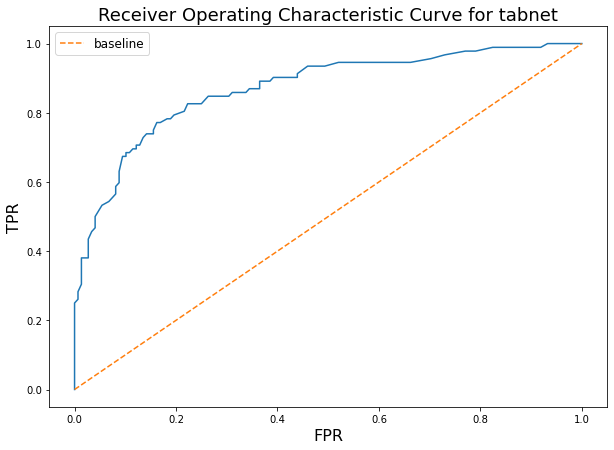

The ROC_AUC score is 0.8697855464159814


The Matthew correlation is 0.6139038388693298
-------------------
The accuracy is 0.8166666666666667
The recall is 0.8166666666666667
The macro F1 score is 0.8068904981347378
The micro F1 score is 0.8166666666666667
The weighted F1 score is 0.817028746982664
              precision    recall  f1-score   support

         0.0       0.86      0.84      0.85       148
         1.0       0.76      0.77      0.76        92

    accuracy                           0.82       240
   macro avg       0.81      0.81      0.81       240
weighted avg       0.82      0.82      0.82       240



Started Execute test train split at 17:00:55.
Started Started column type detection and casting at 17:00:55.
Started Checking for duplicate columns at 17:00:55.
Started Reset dataframe index. at 17:00:55.
Started Select best features at 17:00:55.
Started Delete columns with high share of NULLs at 17:00:55.
Started Apply datetime transformation at 17:00:55.
Started Handle rare features at 17:00:55.
Started Remove cardinality at 17:00:55.
Started Holistic NULL filling at 17:00:55.
Started Binarize numeric columns + PCA binarized features at 17:00:55.
Started Onehot + PCA categorical features at 17:00:55.
Started Execute categorical encoding at 17:00:55.
Started Fill nulls at 17:00:55.
Started Handle outliers at 17:00:55.
Started Remove collinearity at 17:00:55.
Started Remove skewness at 17:00:55.
Started Execute clustering as a feature at 17:00:55.
Started Execute clustering as a feature at 17:00:56.
Started Execute clustering as a feature at 17:00:56.
Started Execute clustering as a fe

Score achieved on holdout dataset is: 0.6294389229511196.
End iteration for algorithm tabnet at 1637251257.442209.
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Start iteration for algorithm ngboost at 1637251257.443201.
Started Delete columns with high share of NULLs at 17:00:57.
Started Apply datetime transformation at 17:00:57.
Started Handle rare features at 17:00:57.
Started Remove cardinality at 17:00:57.
Started Holistic NULL filling at 17:00:57.
Started Binarize numeric columns + PCA binarized features at 17:00:57.
Started Onehot + PCA categorical features at 17:00:58.
Started Execute categorical encoding at 17:00:58.
Started Fill nulls at 17:00:58.
Started Handle outliers at 17:00:58.
Started Remove collinearity at 17:00:59.
Started Remove skewness at 17:00:59.
Started Execute clustering as a feature at 17:00:59.
Started Scale data at 17:00:59.
Started Execute clustering as a feature at 17:00:59.
Started

[I 2021-11-18 17:01:04,102] A new study created in memory with name: autotuned kmeans


Started PCA the clustering results. at 17:01:03.


  0%|          | 0/50 [00:00<?, ?it/s]

[I 2021-11-18 17:01:04,614] Trial 0 finished with value: 0.4774498234183146 and parameters: {'PassengerId': 0, 'Pclass': 1, 'Age': 1, 'Fare': 1, 'Deck': 0, 'Title': 0, 'relatives': 0, 'Age_Class': 1, 'Fare_Per_Person': 1, 'Embarked': 1, 'Sex': 0, 'PassengerId_binarized': 1, 'Pclass_binarized': 1, 'Age_binarized': 0, 'Fare_binarized': 0, 'Deck_binarized': 0, 'Title_binarized': 0, 'relatives_binarized': 1, 'Fare_Per_Person_binarized': 0, 'Num_PC-1_num_pca': 0, 'Num_PC-2_num_pca': 1, 'isolation_probs': 0, 'isolation_class': 0, 'Pclass_unskewed': 0, 'Deck_unskewed': 0, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 0, 'Deck_binarized_unskewed': 1, 'Title_unskewed': 1, 'relatives_unskewed': 0, 'Age_Class_unskewed': 1, 'Fare_Per_Person_unskewed': 0, 'Embarked_unskewed': 0, 'Sex_unskewed': 1, 'Num_PC-1_num_pca_unskewed': 1, 'dbscan_cluster_0.3': 1, 'kmeans_clusters_3': 0, 'kmeans_clusters_5': 0, 'kmeans_clusters_7': 1, 'kmeans_clusters_9': 0, 'gaussian_clusters_2': 0, 'gaussian_clust

[I 2021-11-18 17:01:11,811] Trial 7 finished with value: 0.5245868390287565 and parameters: {'PassengerId': 1, 'Pclass': 1, 'Age': 1, 'Fare': 0, 'Deck': 1, 'Title': 0, 'relatives': 1, 'Age_Class': 1, 'Fare_Per_Person': 0, 'Embarked': 1, 'Sex': 1, 'PassengerId_binarized': 0, 'Pclass_binarized': 0, 'Age_binarized': 0, 'Fare_binarized': 0, 'Deck_binarized': 0, 'Title_binarized': 1, 'relatives_binarized': 0, 'Fare_Per_Person_binarized': 0, 'Num_PC-1_num_pca': 1, 'Num_PC-2_num_pca': 0, 'isolation_probs': 1, 'isolation_class': 0, 'Pclass_unskewed': 0, 'Deck_unskewed': 1, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 1, 'Deck_binarized_unskewed': 1, 'Title_unskewed': 1, 'relatives_unskewed': 0, 'Age_Class_unskewed': 0, 'Fare_Per_Person_unskewed': 1, 'Embarked_unskewed': 1, 'Sex_unskewed': 1, 'Num_PC-1_num_pca_unskewed': 0, 'dbscan_cluster_0.3': 0, 'kmeans_clusters_3': 1, 'kmeans_clusters_5': 0, 'kmeans_clusters_7': 1, 'kmeans_clusters_9': 1, 'gaussian_clusters_2': 0, 'gaussian_clust

[I 2021-11-18 17:01:20,273] Trial 14 finished with value: 0.5507988808176989 and parameters: {'PassengerId': 1, 'Pclass': 1, 'Age': 0, 'Fare': 0, 'Deck': 1, 'Title': 1, 'relatives': 0, 'Age_Class': 1, 'Fare_Per_Person': 0, 'Embarked': 0, 'Sex': 0, 'PassengerId_binarized': 1, 'Pclass_binarized': 1, 'Age_binarized': 0, 'Fare_binarized': 0, 'Deck_binarized': 0, 'Title_binarized': 1, 'relatives_binarized': 0, 'Fare_Per_Person_binarized': 1, 'Num_PC-1_num_pca': 1, 'Num_PC-2_num_pca': 0, 'isolation_probs': 1, 'isolation_class': 1, 'Pclass_unskewed': 0, 'Deck_unskewed': 1, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 1, 'Deck_binarized_unskewed': 0, 'Title_unskewed': 0, 'relatives_unskewed': 1, 'Age_Class_unskewed': 1, 'Fare_Per_Person_unskewed': 0, 'Embarked_unskewed': 0, 'Sex_unskewed': 0, 'Num_PC-1_num_pca_unskewed': 0, 'dbscan_cluster_0.3': 1, 'kmeans_clusters_3': 0, 'kmeans_clusters_5': 1, 'kmeans_clusters_7': 0, 'kmeans_clusters_9': 1, 'gaussian_clusters_2': 1, 'gaussian_clus

[I 2021-11-18 17:01:27,396] Trial 21 finished with value: 0.5541575508861698 and parameters: {'PassengerId': 0, 'Pclass': 1, 'Age': 1, 'Fare': 0, 'Deck': 1, 'Title': 0, 'relatives': 0, 'Age_Class': 0, 'Fare_Per_Person': 0, 'Embarked': 0, 'Sex': 1, 'PassengerId_binarized': 1, 'Pclass_binarized': 1, 'Age_binarized': 0, 'Fare_binarized': 1, 'Deck_binarized': 0, 'Title_binarized': 0, 'relatives_binarized': 0, 'Fare_Per_Person_binarized': 0, 'Num_PC-1_num_pca': 0, 'Num_PC-2_num_pca': 1, 'isolation_probs': 0, 'isolation_class': 1, 'Pclass_unskewed': 0, 'Deck_unskewed': 1, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 0, 'Deck_binarized_unskewed': 0, 'Title_unskewed': 1, 'relatives_unskewed': 1, 'Age_Class_unskewed': 1, 'Fare_Per_Person_unskewed': 0, 'Embarked_unskewed': 0, 'Sex_unskewed': 0, 'Num_PC-1_num_pca_unskewed': 0, 'dbscan_cluster_0.3': 0, 'kmeans_clusters_3': 0, 'kmeans_clusters_5': 1, 'kmeans_clusters_7': 0, 'kmeans_clusters_9': 0, 'gaussian_clusters_2': 1, 'gaussian_clus

[I 2021-11-18 17:01:32,007] Trial 28 finished with value: 0.5459785864237706 and parameters: {'PassengerId': 1, 'Pclass': 1, 'Age': 1, 'Fare': 1, 'Deck': 1, 'Title': 0, 'relatives': 0, 'Age_Class': 0, 'Fare_Per_Person': 0, 'Embarked': 0, 'Sex': 0, 'PassengerId_binarized': 1, 'Pclass_binarized': 0, 'Age_binarized': 0, 'Fare_binarized': 1, 'Deck_binarized': 0, 'Title_binarized': 1, 'relatives_binarized': 1, 'Fare_Per_Person_binarized': 1, 'Num_PC-1_num_pca': 0, 'Num_PC-2_num_pca': 0, 'isolation_probs': 0, 'isolation_class': 1, 'Pclass_unskewed': 0, 'Deck_unskewed': 0, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 0, 'Deck_binarized_unskewed': 0, 'Title_unskewed': 0, 'relatives_unskewed': 1, 'Age_Class_unskewed': 0, 'Fare_Per_Person_unskewed': 0, 'Embarked_unskewed': 0, 'Sex_unskewed': 1, 'Num_PC-1_num_pca_unskewed': 1, 'dbscan_cluster_0.3': 1, 'kmeans_clusters_3': 0, 'kmeans_clusters_5': 1, 'kmeans_clusters_7': 0, 'kmeans_clusters_9': 0, 'gaussian_clusters_2': 1, 'gaussian_clus

[I 2021-11-18 17:01:35,337] Trial 35 finished with value: 0.5856451010044764 and parameters: {'PassengerId': 1, 'Pclass': 1, 'Age': 1, 'Fare': 0, 'Deck': 1, 'Title': 1, 'relatives': 0, 'Age_Class': 1, 'Fare_Per_Person': 0, 'Embarked': 0, 'Sex': 0, 'PassengerId_binarized': 1, 'Pclass_binarized': 1, 'Age_binarized': 0, 'Fare_binarized': 0, 'Deck_binarized': 0, 'Title_binarized': 1, 'relatives_binarized': 1, 'Fare_Per_Person_binarized': 0, 'Num_PC-1_num_pca': 1, 'Num_PC-2_num_pca': 1, 'isolation_probs': 0, 'isolation_class': 1, 'Pclass_unskewed': 0, 'Deck_unskewed': 1, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 0, 'Deck_binarized_unskewed': 0, 'Title_unskewed': 0, 'relatives_unskewed': 1, 'Age_Class_unskewed': 1, 'Fare_Per_Person_unskewed': 0, 'Embarked_unskewed': 0, 'Sex_unskewed': 0, 'Num_PC-1_num_pca_unskewed': 0, 'dbscan_cluster_0.3': 1, 'kmeans_clusters_3': 0, 'kmeans_clusters_5': 1, 'kmeans_clusters_7': 0, 'kmeans_clusters_9': 0, 'gaussian_clusters_2': 1, 'gaussian_clus

[I 2021-11-18 17:01:40,086] Trial 42 finished with value: 0.5523568344751177 and parameters: {'PassengerId': 1, 'Pclass': 1, 'Age': 1, 'Fare': 1, 'Deck': 1, 'Title': 1, 'relatives': 1, 'Age_Class': 0, 'Fare_Per_Person': 0, 'Embarked': 0, 'Sex': 0, 'PassengerId_binarized': 0, 'Pclass_binarized': 0, 'Age_binarized': 0, 'Fare_binarized': 1, 'Deck_binarized': 0, 'Title_binarized': 0, 'relatives_binarized': 0, 'Fare_Per_Person_binarized': 1, 'Num_PC-1_num_pca': 1, 'Num_PC-2_num_pca': 0, 'isolation_probs': 0, 'isolation_class': 0, 'Pclass_unskewed': 0, 'Deck_unskewed': 0, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 0, 'Deck_binarized_unskewed': 0, 'Title_unskewed': 0, 'relatives_unskewed': 1, 'Age_Class_unskewed': 0, 'Fare_Per_Person_unskewed': 0, 'Embarked_unskewed': 0, 'Sex_unskewed': 1, 'Num_PC-1_num_pca_unskewed': 1, 'dbscan_cluster_0.3': 1, 'kmeans_clusters_3': 0, 'kmeans_clusters_5': 1, 'kmeans_clusters_7': 0, 'kmeans_clusters_9': 0, 'gaussian_clusters_2': 1, 'gaussian_clus

[I 2021-11-18 17:01:42,986] Trial 49 finished with value: 0.5427677986420688 and parameters: {'PassengerId': 1, 'Pclass': 1, 'Age': 0, 'Fare': 0, 'Deck': 1, 'Title': 0, 'relatives': 0, 'Age_Class': 0, 'Fare_Per_Person': 1, 'Embarked': 0, 'Sex': 0, 'PassengerId_binarized': 0, 'Pclass_binarized': 0, 'Age_binarized': 0, 'Fare_binarized': 0, 'Deck_binarized': 0, 'Title_binarized': 1, 'relatives_binarized': 0, 'Fare_Per_Person_binarized': 1, 'Num_PC-1_num_pca': 0, 'Num_PC-2_num_pca': 0, 'isolation_probs': 0, 'isolation_class': 1, 'Pclass_unskewed': 1, 'Deck_unskewed': 1, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 0, 'Deck_binarized_unskewed': 1, 'Title_unskewed': 0, 'relatives_unskewed': 1, 'Age_Class_unskewed': 0, 'Fare_Per_Person_unskewed': 0, 'Embarked_unskewed': 0, 'Sex_unskewed': 1, 'Num_PC-1_num_pca_unskewed': 0, 'dbscan_cluster_0.3': 1, 'kmeans_clusters_3': 0, 'kmeans_clusters_5': 1, 'kmeans_clusters_7': 0, 'kmeans_clusters_9': 0, 'gaussian_clusters_2': 1, 'gaussian_clus

Started Select best features at 17:01:44.
Features before selection are...PassengerId
Features before selection are...Pclass
Features before selection are...Age
Features before selection are...Fare
Features before selection are...Deck
Features before selection are...Title
Features before selection are...relatives
Features before selection are...Age_Class
Features before selection are...Fare_Per_Person
Features before selection are...Embarked
Features before selection are...Sex
Features before selection are...PassengerId_binarized
Features before selection are...Pclass_binarized
Features before selection are...Age_binarized
Features before selection are...Fare_binarized
Features before selection are...Deck_binarized
Features before selection are...Title_binarized
Features before selection are...relatives_binarized
Features before selection are...Fare_Per_Person_binarized
Features before selection are...Num_PC-1_num_pca
Features before selection are...Num_PC-2_num_pca
Features before sel

[I 2021-11-18 17:01:48,071] A new study created in memory with name: ngboost tuning


Started Sort columns alphabetically at 17:01:47.
Started Train Ngboost at 17:01:48.


  0%|          | 0/3 [00:00<?, ?it/s]

[iter 0] loss=0.7215 val_loss=0.6504 scale=4.0000 norm=8.0127
== Early stopping achieved.
== Best iteration / VAL46 (val_loss=0.4952)
[iter 0] loss=0.7246 val_loss=0.6506 scale=4.0000 norm=8.0365
== Early stopping achieved.
== Best iteration / VAL39 (val_loss=0.4766)
[iter 0] loss=0.7267 val_loss=0.6346 scale=8.0000 norm=16.1067
== Early stopping achieved.
== Best iteration / VAL59 (val_loss=0.4621)
[iter 0] loss=0.7274 val_loss=0.6491 scale=4.0000 norm=8.0624
== Early stopping achieved.
== Best iteration / VAL50 (val_loss=0.4533)
[iter 0] loss=0.7256 val_loss=0.6490 scale=4.0000 norm=8.0446
== Early stopping achieved.
== Best iteration / VAL49 (val_loss=0.4619)
[iter 0] loss=0.7236 val_loss=0.6499 scale=4.0000 norm=8.0285
== Early stopping achieved.
== Best iteration / VAL50 (val_loss=0.4778)
[iter 0] loss=0.7201 val_loss=0.6499 scale=4.0000 norm=8.0008
== Early stopping achieved.
== Best iteration / VAL57 (val_loss=0.4632)
[iter 0] loss=0.7203 val_loss=0.6495 scale=4.0000 norm=8.0028

[iter 0] loss=0.7214 val_loss=0.6499 scale=4.0000 norm=8.0114
== Early stopping achieved.
== Best iteration / VAL35 (val_loss=0.4729)
Started Predict with Ngboost at 17:02:00.
17:02:00


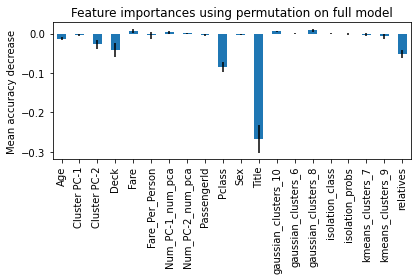

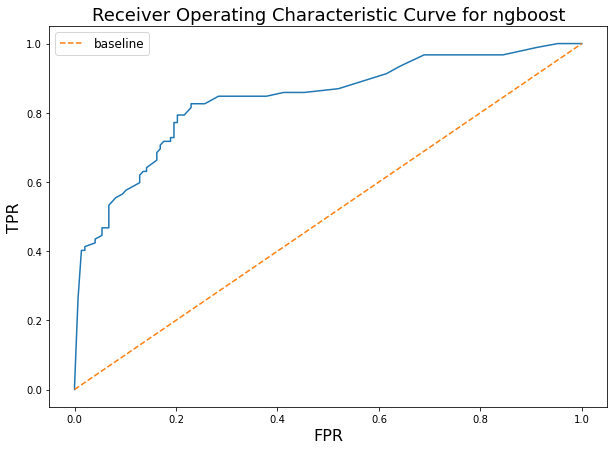

The ROC_AUC score is 0.8396004700352527


The Matthew correlation is 0.5803211443368228
-------------------
The accuracy is 0.7958333333333333
The recall is 0.7958333333333333
The macro F1 score is 0.7883940620782726
The micro F1 score is 0.7958333333333333
The weighted F1 score is 0.7976518218623483
              precision    recall  f1-score   support

         0.0       0.86      0.80      0.83       148
         1.0       0.71      0.79      0.75        92

    accuracy                           0.80       240
   macro avg       0.79      0.80      0.79       240
weighted avg       0.80      0.80      0.80       240



Started Execute test train split at 17:02:02.
Started Started column type detection and casting at 17:02:02.
Started Checking for duplicate columns at 17:02:02.
Started Reset dataframe index. at 17:02:02.
Started Select best features at 17:02:02.
Started Delete columns with high share of NULLs at 17:02:02.
Started Apply datetime transformation at 17:02:02.
Started Handle rare features at 17:02:02.
Started Remove cardinality at 17:02:02.
Started Holistic NULL filling at 17:02:02.
Started Binarize numeric columns + PCA binarized features at 17:02:02.
Started Onehot + PCA categorical features at 17:02:02.
Started Execute categorical encoding at 17:02:02.
Started Fill nulls at 17:02:02.
Started Handle outliers at 17:02:02.
Started Remove collinearity at 17:02:02.
Started Remove skewness at 17:02:02.
Started Execute clustering as a feature at 17:02:02.
Started Execute clustering as a feature at 17:02:02.
Started Execute clustering as a feature at 17:02:02.
Started Execute clustering as a fe

Score achieved on holdout dataset is: 0.7223488045221689.
End iteration for algorithm ngboost at 1637251323.6858137.
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Start iteration for algorithm sgd at 1637251323.6869068.
Started Delete columns with high share of NULLs at 17:02:03.
Started Apply datetime transformation at 17:02:03.
Started Handle rare features at 17:02:03.
Started Remove cardinality at 17:02:04.
Started Holistic NULL filling at 17:02:04.
Started Binarize numeric columns + PCA binarized features at 17:02:04.
Started Onehot + PCA categorical features at 17:02:04.
Started Execute categorical encoding at 17:02:04.
Started Fill nulls at 17:02:04.
Started Handle outliers at 17:02:04.
Started Remove collinearity at 17:02:05.
Started Remove skewness at 17:02:05.
Started Execute clustering as a feature at 17:02:05.
Started Scale data at 17:02:05.
Started Execute clustering as a feature at 17:02:06.
Started 

[I 2021-11-18 17:02:10,455] A new study created in memory with name: autotuned kmeans


Started PCA the clustering results. at 17:02:10.


  0%|          | 0/50 [00:00<?, ?it/s]

[I 2021-11-18 17:02:10,948] Trial 0 finished with value: 0.47818523170044686 and parameters: {'PassengerId': 0, 'Pclass': 1, 'Age': 1, 'Fare': 1, 'Deck': 0, 'Title': 0, 'relatives': 0, 'Age_Class': 1, 'Fare_Per_Person': 1, 'Embarked': 1, 'Sex': 0, 'PassengerId_binarized': 1, 'Pclass_binarized': 1, 'Age_binarized': 0, 'Fare_binarized': 0, 'Deck_binarized': 0, 'Title_binarized': 0, 'relatives_binarized': 1, 'Fare_Per_Person_binarized': 0, 'Num_PC-1_num_pca': 0, 'Num_PC-2_num_pca': 1, 'isolation_probs': 0, 'isolation_class': 0, 'Pclass_unskewed': 0, 'Deck_unskewed': 0, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 0, 'Deck_binarized_unskewed': 1, 'Title_unskewed': 1, 'relatives_unskewed': 0, 'Age_Class_unskewed': 1, 'Fare_Per_Person_unskewed': 0, 'Embarked_unskewed': 0, 'Sex_unskewed': 1, 'Num_PC-1_num_pca_unskewed': 1, 'dbscan_cluster_0.3': 1, 'kmeans_clusters_3': 0, 'kmeans_clusters_5': 0, 'kmeans_clusters_7': 1, 'kmeans_clusters_9': 0, 'gaussian_clusters_2': 0, 'gaussian_clus

[I 2021-11-18 17:02:18,127] Trial 7 finished with value: 0.5245526595823788 and parameters: {'PassengerId': 1, 'Pclass': 1, 'Age': 1, 'Fare': 0, 'Deck': 1, 'Title': 0, 'relatives': 1, 'Age_Class': 1, 'Fare_Per_Person': 0, 'Embarked': 1, 'Sex': 1, 'PassengerId_binarized': 0, 'Pclass_binarized': 0, 'Age_binarized': 0, 'Fare_binarized': 0, 'Deck_binarized': 0, 'Title_binarized': 1, 'relatives_binarized': 0, 'Fare_Per_Person_binarized': 0, 'Num_PC-1_num_pca': 1, 'Num_PC-2_num_pca': 0, 'isolation_probs': 1, 'isolation_class': 0, 'Pclass_unskewed': 0, 'Deck_unskewed': 1, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 1, 'Deck_binarized_unskewed': 1, 'Title_unskewed': 1, 'relatives_unskewed': 0, 'Age_Class_unskewed': 0, 'Fare_Per_Person_unskewed': 1, 'Embarked_unskewed': 1, 'Sex_unskewed': 1, 'Num_PC-1_num_pca_unskewed': 0, 'dbscan_cluster_0.3': 0, 'kmeans_clusters_3': 1, 'kmeans_clusters_5': 0, 'kmeans_clusters_7': 1, 'kmeans_clusters_9': 1, 'gaussian_clusters_2': 0, 'gaussian_clust

[I 2021-11-18 17:02:26,548] Trial 14 finished with value: 0.5506871336303383 and parameters: {'PassengerId': 1, 'Pclass': 1, 'Age': 0, 'Fare': 0, 'Deck': 1, 'Title': 1, 'relatives': 0, 'Age_Class': 1, 'Fare_Per_Person': 0, 'Embarked': 0, 'Sex': 0, 'PassengerId_binarized': 1, 'Pclass_binarized': 1, 'Age_binarized': 0, 'Fare_binarized': 0, 'Deck_binarized': 0, 'Title_binarized': 1, 'relatives_binarized': 0, 'Fare_Per_Person_binarized': 1, 'Num_PC-1_num_pca': 1, 'Num_PC-2_num_pca': 0, 'isolation_probs': 1, 'isolation_class': 1, 'Pclass_unskewed': 0, 'Deck_unskewed': 1, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 1, 'Deck_binarized_unskewed': 0, 'Title_unskewed': 0, 'relatives_unskewed': 1, 'Age_Class_unskewed': 1, 'Fare_Per_Person_unskewed': 0, 'Embarked_unskewed': 0, 'Sex_unskewed': 0, 'Num_PC-1_num_pca_unskewed': 0, 'dbscan_cluster_0.3': 1, 'kmeans_clusters_3': 0, 'kmeans_clusters_5': 1, 'kmeans_clusters_7': 0, 'kmeans_clusters_9': 1, 'gaussian_clusters_2': 1, 'gaussian_clus

[I 2021-11-18 17:02:33,565] Trial 21 finished with value: 0.5543126266156756 and parameters: {'PassengerId': 0, 'Pclass': 1, 'Age': 1, 'Fare': 0, 'Deck': 1, 'Title': 0, 'relatives': 0, 'Age_Class': 0, 'Fare_Per_Person': 0, 'Embarked': 0, 'Sex': 1, 'PassengerId_binarized': 1, 'Pclass_binarized': 1, 'Age_binarized': 0, 'Fare_binarized': 1, 'Deck_binarized': 0, 'Title_binarized': 0, 'relatives_binarized': 0, 'Fare_Per_Person_binarized': 0, 'Num_PC-1_num_pca': 0, 'Num_PC-2_num_pca': 1, 'isolation_probs': 0, 'isolation_class': 1, 'Pclass_unskewed': 0, 'Deck_unskewed': 1, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 0, 'Deck_binarized_unskewed': 0, 'Title_unskewed': 1, 'relatives_unskewed': 1, 'Age_Class_unskewed': 1, 'Fare_Per_Person_unskewed': 0, 'Embarked_unskewed': 0, 'Sex_unskewed': 0, 'Num_PC-1_num_pca_unskewed': 0, 'dbscan_cluster_0.3': 0, 'kmeans_clusters_3': 0, 'kmeans_clusters_5': 1, 'kmeans_clusters_7': 0, 'kmeans_clusters_9': 0, 'gaussian_clusters_2': 1, 'gaussian_clus

[I 2021-11-18 17:02:38,078] Trial 28 finished with value: 0.5467589429741699 and parameters: {'PassengerId': 1, 'Pclass': 1, 'Age': 1, 'Fare': 1, 'Deck': 1, 'Title': 0, 'relatives': 0, 'Age_Class': 0, 'Fare_Per_Person': 0, 'Embarked': 0, 'Sex': 0, 'PassengerId_binarized': 1, 'Pclass_binarized': 0, 'Age_binarized': 0, 'Fare_binarized': 1, 'Deck_binarized': 0, 'Title_binarized': 1, 'relatives_binarized': 1, 'Fare_Per_Person_binarized': 1, 'Num_PC-1_num_pca': 0, 'Num_PC-2_num_pca': 0, 'isolation_probs': 0, 'isolation_class': 1, 'Pclass_unskewed': 0, 'Deck_unskewed': 0, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 0, 'Deck_binarized_unskewed': 0, 'Title_unskewed': 0, 'relatives_unskewed': 1, 'Age_Class_unskewed': 0, 'Fare_Per_Person_unskewed': 0, 'Embarked_unskewed': 0, 'Sex_unskewed': 1, 'Num_PC-1_num_pca_unskewed': 1, 'dbscan_cluster_0.3': 1, 'kmeans_clusters_3': 0, 'kmeans_clusters_5': 1, 'kmeans_clusters_7': 0, 'kmeans_clusters_9': 0, 'gaussian_clusters_2': 1, 'gaussian_clus

[I 2021-11-18 17:02:41,407] Trial 35 finished with value: 0.585574227061423 and parameters: {'PassengerId': 1, 'Pclass': 1, 'Age': 1, 'Fare': 0, 'Deck': 1, 'Title': 1, 'relatives': 0, 'Age_Class': 1, 'Fare_Per_Person': 0, 'Embarked': 0, 'Sex': 0, 'PassengerId_binarized': 1, 'Pclass_binarized': 1, 'Age_binarized': 0, 'Fare_binarized': 0, 'Deck_binarized': 0, 'Title_binarized': 1, 'relatives_binarized': 1, 'Fare_Per_Person_binarized': 0, 'Num_PC-1_num_pca': 1, 'Num_PC-2_num_pca': 1, 'isolation_probs': 0, 'isolation_class': 1, 'Pclass_unskewed': 0, 'Deck_unskewed': 1, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 0, 'Deck_binarized_unskewed': 0, 'Title_unskewed': 0, 'relatives_unskewed': 1, 'Age_Class_unskewed': 1, 'Fare_Per_Person_unskewed': 0, 'Embarked_unskewed': 0, 'Sex_unskewed': 0, 'Num_PC-1_num_pca_unskewed': 0, 'dbscan_cluster_0.3': 1, 'kmeans_clusters_3': 0, 'kmeans_clusters_5': 1, 'kmeans_clusters_7': 0, 'kmeans_clusters_9': 0, 'gaussian_clusters_2': 1, 'gaussian_clust

[I 2021-11-18 17:02:46,152] Trial 42 finished with value: 0.5525763101906606 and parameters: {'PassengerId': 1, 'Pclass': 1, 'Age': 1, 'Fare': 1, 'Deck': 1, 'Title': 1, 'relatives': 1, 'Age_Class': 0, 'Fare_Per_Person': 0, 'Embarked': 0, 'Sex': 0, 'PassengerId_binarized': 0, 'Pclass_binarized': 0, 'Age_binarized': 0, 'Fare_binarized': 1, 'Deck_binarized': 0, 'Title_binarized': 0, 'relatives_binarized': 0, 'Fare_Per_Person_binarized': 1, 'Num_PC-1_num_pca': 1, 'Num_PC-2_num_pca': 0, 'isolation_probs': 0, 'isolation_class': 0, 'Pclass_unskewed': 0, 'Deck_unskewed': 0, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 0, 'Deck_binarized_unskewed': 0, 'Title_unskewed': 0, 'relatives_unskewed': 1, 'Age_Class_unskewed': 0, 'Fare_Per_Person_unskewed': 0, 'Embarked_unskewed': 0, 'Sex_unskewed': 1, 'Num_PC-1_num_pca_unskewed': 1, 'dbscan_cluster_0.3': 1, 'kmeans_clusters_3': 0, 'kmeans_clusters_5': 1, 'kmeans_clusters_7': 0, 'kmeans_clusters_9': 0, 'gaussian_clusters_2': 1, 'gaussian_clus

[I 2021-11-18 17:02:50,438] Trial 49 finished with value: 0.5282046002871841 and parameters: {'PassengerId': 0, 'Pclass': 1, 'Age': 1, 'Fare': 0, 'Deck': 1, 'Title': 1, 'relatives': 0, 'Age_Class': 0, 'Fare_Per_Person': 0, 'Embarked': 0, 'Sex': 0, 'PassengerId_binarized': 1, 'Pclass_binarized': 0, 'Age_binarized': 0, 'Fare_binarized': 0, 'Deck_binarized': 0, 'Title_binarized': 1, 'relatives_binarized': 0, 'Fare_Per_Person_binarized': 1, 'Num_PC-1_num_pca': 1, 'Num_PC-2_num_pca': 0, 'isolation_probs': 1, 'isolation_class': 1, 'Pclass_unskewed': 0, 'Deck_unskewed': 0, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 0, 'Deck_binarized_unskewed': 0, 'Title_unskewed': 0, 'relatives_unskewed': 1, 'Age_Class_unskewed': 0, 'Fare_Per_Person_unskewed': 1, 'Embarked_unskewed': 0, 'Sex_unskewed': 0, 'Num_PC-1_num_pca_unskewed': 1, 'dbscan_cluster_0.3': 1, 'kmeans_clusters_3': 0, 'kmeans_clusters_5': 1, 'kmeans_clusters_7': 0, 'kmeans_clusters_9': 0, 'gaussian_clusters_2': 1, 'gaussian_clus

Started Select best features at 17:02:52.
Features before selection are...PassengerId
Features before selection are...Pclass
Features before selection are...Age
Features before selection are...Fare
Features before selection are...Deck
Features before selection are...Title
Features before selection are...relatives
Features before selection are...Age_Class
Features before selection are...Fare_Per_Person
Features before selection are...Embarked
Features before selection are...Sex
Features before selection are...PassengerId_binarized
Features before selection are...Pclass_binarized
Features before selection are...Age_binarized
Features before selection are...Fare_binarized
Features before selection are...Deck_binarized
Features before selection are...Title_binarized
Features before selection are...relatives_binarized
Features before selection are...Fare_Per_Person_binarized
Features before selection are...Num_PC-1_num_pca
Features before selection are...Num_PC-2_num_pca
Features before sel

[I 2021-11-18 17:02:54,516] A new study created in memory with name: sgd


Started Sort columns alphabetically at 17:02:54.
Started Train SGD classifier model at 17:02:54.


  0%|          | 0/3 [00:00<?, ?it/s]

[I 2021-11-18 17:02:54,543] Trial 0 finished with value: 0.0 and parameters: {'loss': 'log', 'alpha': 24.658329458549105, 'l1_ratio': 0.06250999323228593, 'epsilon': 0.0024348773534554596, 'max_iter': 4688, 'tol': 1.7073967431528103e-05, 'normalize': True, 'power_t': 0.39663473785260006}. Best is trial 0 with value: 0.0.
[I 2021-11-18 17:02:54,665] Trial 1 finished with value: -0.007604263977686943 and parameters: {'loss': 'log', 'alpha': 98.77700294007911, 'l1_ratio': 0.004335189736337855, 'epsilon': 0.002820996133514492, 'max_iter': 5510, 'tol': 0.00016480446427978953, 'normalize': True, 'power_t': 0.17624515035546043}. Best is trial 0 with value: 0.0.
[I 2021-11-18 17:02:54,782] Trial 2 finished with value: 0.00816009513115341 and parameters: {'loss': 'modified_huber', 'alpha': 0.05660670699258887, 'l1_ratio': 0.012562313237138797, 'epsilon': 0.013481575603601416, 'max_iter': 23558, 'tol': 6.290644294586152e-05, 'normalize': False, 'power_t': 0.10945992664124292}. Best is trial 2 wi

Started Predict with SGD classifier at 17:02:55.
Score achieved on holdout dataset is: 0.
End iteration for algorithm sgd at 1637251375.107667.
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Start iteration for algorithm vowpal_wabbit at 1637251375.1085794.
Started Delete columns with high share of NULLs at 17:02:55.
Started Apply datetime transformation at 17:02:55.
Started Handle rare features at 17:02:55.
Started Remove cardinality at 17:02:55.
Started Holistic NULL filling at 17:02:55.
Started Binarize numeric columns + PCA binarized features at 17:02:55.
Started Onehot + PCA categorical features at 17:02:55.
Started Execute categorical encoding at 17:02:56.
Started Fill nulls at 17:02:56.
Started Handle outliers at 17:02:56.
Started Remove collinearity at 17:02:56.
Started Remove skewness at 17:02:57.
Started Execute clustering as a feature at 17:02:57.
Started Scale data at 17:02:57.
Started Execute clusteri

[I 2021-11-18 17:03:02,079] A new study created in memory with name: autotuned kmeans


Started PCA the clustering results. at 17:03:01.


  0%|          | 0/50 [00:00<?, ?it/s]

[I 2021-11-18 17:03:02,595] Trial 0 finished with value: 0.48315679855810884 and parameters: {'PassengerId': 0, 'Pclass': 1, 'Age': 1, 'Fare': 1, 'Deck': 0, 'Title': 0, 'relatives': 0, 'Age_Class': 1, 'Fare_Per_Person': 1, 'Embarked': 1, 'Sex': 0, 'PassengerId_binarized': 1, 'Pclass_binarized': 1, 'Age_binarized': 0, 'Fare_binarized': 0, 'Deck_binarized': 0, 'Title_binarized': 0, 'relatives_binarized': 1, 'Fare_Per_Person_binarized': 0, 'Num_PC-1_num_pca': 0, 'Num_PC-2_num_pca': 1, 'isolation_probs': 0, 'isolation_class': 0, 'Pclass_unskewed': 0, 'Deck_unskewed': 0, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 0, 'Deck_binarized_unskewed': 1, 'Title_unskewed': 1, 'relatives_unskewed': 0, 'Age_Class_unskewed': 1, 'Fare_Per_Person_unskewed': 0, 'Embarked_unskewed': 0, 'Sex_unskewed': 1, 'Num_PC-1_num_pca_unskewed': 1, 'dbscan_cluster_0.3': 1, 'kmeans_clusters_3': 0, 'kmeans_clusters_5': 0, 'kmeans_clusters_7': 1, 'kmeans_clusters_9': 0, 'gaussian_clusters_2': 0, 'gaussian_clus

[I 2021-11-18 17:03:09,706] Trial 7 finished with value: 0.5250926540489985 and parameters: {'PassengerId': 1, 'Pclass': 1, 'Age': 1, 'Fare': 0, 'Deck': 1, 'Title': 0, 'relatives': 1, 'Age_Class': 1, 'Fare_Per_Person': 0, 'Embarked': 1, 'Sex': 1, 'PassengerId_binarized': 0, 'Pclass_binarized': 0, 'Age_binarized': 0, 'Fare_binarized': 0, 'Deck_binarized': 0, 'Title_binarized': 1, 'relatives_binarized': 0, 'Fare_Per_Person_binarized': 0, 'Num_PC-1_num_pca': 1, 'Num_PC-2_num_pca': 0, 'isolation_probs': 1, 'isolation_class': 0, 'Pclass_unskewed': 0, 'Deck_unskewed': 1, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 1, 'Deck_binarized_unskewed': 1, 'Title_unskewed': 1, 'relatives_unskewed': 0, 'Age_Class_unskewed': 0, 'Fare_Per_Person_unskewed': 1, 'Embarked_unskewed': 1, 'Sex_unskewed': 1, 'Num_PC-1_num_pca_unskewed': 0, 'dbscan_cluster_0.3': 0, 'kmeans_clusters_3': 1, 'kmeans_clusters_5': 0, 'kmeans_clusters_7': 1, 'kmeans_clusters_9': 1, 'gaussian_clusters_2': 0, 'gaussian_clust

[I 2021-11-18 17:03:18,248] Trial 14 finished with value: 0.5505424790184374 and parameters: {'PassengerId': 1, 'Pclass': 1, 'Age': 0, 'Fare': 0, 'Deck': 1, 'Title': 1, 'relatives': 0, 'Age_Class': 1, 'Fare_Per_Person': 0, 'Embarked': 0, 'Sex': 0, 'PassengerId_binarized': 1, 'Pclass_binarized': 1, 'Age_binarized': 0, 'Fare_binarized': 0, 'Deck_binarized': 0, 'Title_binarized': 1, 'relatives_binarized': 0, 'Fare_Per_Person_binarized': 1, 'Num_PC-1_num_pca': 1, 'Num_PC-2_num_pca': 0, 'isolation_probs': 1, 'isolation_class': 1, 'Pclass_unskewed': 0, 'Deck_unskewed': 1, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 1, 'Deck_binarized_unskewed': 0, 'Title_unskewed': 0, 'relatives_unskewed': 1, 'Age_Class_unskewed': 1, 'Fare_Per_Person_unskewed': 0, 'Embarked_unskewed': 0, 'Sex_unskewed': 0, 'Num_PC-1_num_pca_unskewed': 0, 'dbscan_cluster_0.3': 1, 'kmeans_clusters_3': 0, 'kmeans_clusters_5': 1, 'kmeans_clusters_7': 0, 'kmeans_clusters_9': 1, 'gaussian_clusters_2': 1, 'gaussian_clus

[I 2021-11-18 17:03:25,237] Trial 21 finished with value: 0.5547586672167414 and parameters: {'PassengerId': 0, 'Pclass': 1, 'Age': 1, 'Fare': 0, 'Deck': 1, 'Title': 0, 'relatives': 0, 'Age_Class': 0, 'Fare_Per_Person': 0, 'Embarked': 0, 'Sex': 1, 'PassengerId_binarized': 1, 'Pclass_binarized': 1, 'Age_binarized': 0, 'Fare_binarized': 1, 'Deck_binarized': 0, 'Title_binarized': 0, 'relatives_binarized': 0, 'Fare_Per_Person_binarized': 0, 'Num_PC-1_num_pca': 0, 'Num_PC-2_num_pca': 1, 'isolation_probs': 0, 'isolation_class': 1, 'Pclass_unskewed': 0, 'Deck_unskewed': 1, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 0, 'Deck_binarized_unskewed': 0, 'Title_unskewed': 1, 'relatives_unskewed': 1, 'Age_Class_unskewed': 1, 'Fare_Per_Person_unskewed': 0, 'Embarked_unskewed': 0, 'Sex_unskewed': 0, 'Num_PC-1_num_pca_unskewed': 0, 'dbscan_cluster_0.3': 0, 'kmeans_clusters_3': 0, 'kmeans_clusters_5': 1, 'kmeans_clusters_7': 0, 'kmeans_clusters_9': 0, 'gaussian_clusters_2': 1, 'gaussian_clus

[I 2021-11-18 17:03:29,761] Trial 28 finished with value: 0.5459106242585798 and parameters: {'PassengerId': 1, 'Pclass': 1, 'Age': 1, 'Fare': 1, 'Deck': 1, 'Title': 0, 'relatives': 0, 'Age_Class': 0, 'Fare_Per_Person': 0, 'Embarked': 0, 'Sex': 0, 'PassengerId_binarized': 1, 'Pclass_binarized': 0, 'Age_binarized': 0, 'Fare_binarized': 1, 'Deck_binarized': 0, 'Title_binarized': 1, 'relatives_binarized': 1, 'Fare_Per_Person_binarized': 1, 'Num_PC-1_num_pca': 0, 'Num_PC-2_num_pca': 0, 'isolation_probs': 0, 'isolation_class': 1, 'Pclass_unskewed': 0, 'Deck_unskewed': 0, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 0, 'Deck_binarized_unskewed': 0, 'Title_unskewed': 0, 'relatives_unskewed': 1, 'Age_Class_unskewed': 0, 'Fare_Per_Person_unskewed': 0, 'Embarked_unskewed': 0, 'Sex_unskewed': 1, 'Num_PC-1_num_pca_unskewed': 1, 'dbscan_cluster_0.3': 1, 'kmeans_clusters_3': 0, 'kmeans_clusters_5': 1, 'kmeans_clusters_7': 0, 'kmeans_clusters_9': 0, 'gaussian_clusters_2': 1, 'gaussian_clus

[I 2021-11-18 17:03:33,111] Trial 35 finished with value: 0.585564395702268 and parameters: {'PassengerId': 1, 'Pclass': 1, 'Age': 1, 'Fare': 0, 'Deck': 1, 'Title': 1, 'relatives': 0, 'Age_Class': 1, 'Fare_Per_Person': 0, 'Embarked': 0, 'Sex': 0, 'PassengerId_binarized': 1, 'Pclass_binarized': 1, 'Age_binarized': 0, 'Fare_binarized': 0, 'Deck_binarized': 0, 'Title_binarized': 1, 'relatives_binarized': 1, 'Fare_Per_Person_binarized': 0, 'Num_PC-1_num_pca': 1, 'Num_PC-2_num_pca': 1, 'isolation_probs': 0, 'isolation_class': 1, 'Pclass_unskewed': 0, 'Deck_unskewed': 1, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 0, 'Deck_binarized_unskewed': 0, 'Title_unskewed': 0, 'relatives_unskewed': 1, 'Age_Class_unskewed': 1, 'Fare_Per_Person_unskewed': 0, 'Embarked_unskewed': 0, 'Sex_unskewed': 0, 'Num_PC-1_num_pca_unskewed': 0, 'dbscan_cluster_0.3': 1, 'kmeans_clusters_3': 0, 'kmeans_clusters_5': 1, 'kmeans_clusters_7': 0, 'kmeans_clusters_9': 0, 'gaussian_clusters_2': 1, 'gaussian_clust

[I 2021-11-18 17:03:37,882] Trial 42 finished with value: 0.5525696020661749 and parameters: {'PassengerId': 1, 'Pclass': 1, 'Age': 1, 'Fare': 1, 'Deck': 1, 'Title': 1, 'relatives': 1, 'Age_Class': 0, 'Fare_Per_Person': 0, 'Embarked': 0, 'Sex': 0, 'PassengerId_binarized': 0, 'Pclass_binarized': 0, 'Age_binarized': 0, 'Fare_binarized': 1, 'Deck_binarized': 0, 'Title_binarized': 0, 'relatives_binarized': 0, 'Fare_Per_Person_binarized': 1, 'Num_PC-1_num_pca': 1, 'Num_PC-2_num_pca': 0, 'isolation_probs': 0, 'isolation_class': 0, 'Pclass_unskewed': 0, 'Deck_unskewed': 0, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 0, 'Deck_binarized_unskewed': 0, 'Title_unskewed': 0, 'relatives_unskewed': 1, 'Age_Class_unskewed': 0, 'Fare_Per_Person_unskewed': 0, 'Embarked_unskewed': 0, 'Sex_unskewed': 1, 'Num_PC-1_num_pca_unskewed': 1, 'dbscan_cluster_0.3': 1, 'kmeans_clusters_3': 0, 'kmeans_clusters_5': 1, 'kmeans_clusters_7': 0, 'kmeans_clusters_9': 0, 'gaussian_clusters_2': 1, 'gaussian_clus

[I 2021-11-18 17:03:40,840] Trial 49 finished with value: 0.542781965051762 and parameters: {'PassengerId': 1, 'Pclass': 1, 'Age': 0, 'Fare': 0, 'Deck': 1, 'Title': 0, 'relatives': 0, 'Age_Class': 0, 'Fare_Per_Person': 1, 'Embarked': 0, 'Sex': 0, 'PassengerId_binarized': 0, 'Pclass_binarized': 0, 'Age_binarized': 0, 'Fare_binarized': 0, 'Deck_binarized': 0, 'Title_binarized': 1, 'relatives_binarized': 0, 'Fare_Per_Person_binarized': 1, 'Num_PC-1_num_pca': 0, 'Num_PC-2_num_pca': 0, 'isolation_probs': 0, 'isolation_class': 1, 'Pclass_unskewed': 1, 'Deck_unskewed': 1, 'Age_binarized_unskewed': 1, 'Fare_binarized_unskewed': 0, 'Deck_binarized_unskewed': 1, 'Title_unskewed': 0, 'relatives_unskewed': 1, 'Age_Class_unskewed': 0, 'Fare_Per_Person_unskewed': 0, 'Embarked_unskewed': 0, 'Sex_unskewed': 1, 'Num_PC-1_num_pca_unskewed': 0, 'dbscan_cluster_0.3': 1, 'kmeans_clusters_3': 0, 'kmeans_clusters_5': 1, 'kmeans_clusters_7': 0, 'kmeans_clusters_9': 0, 'gaussian_clusters_2': 1, 'gaussian_clust

Started Select best features at 17:03:42.
Features before selection are...PassengerId
Features before selection are...Pclass
Features before selection are...Age
Features before selection are...Fare
Features before selection are...Deck
Features before selection are...Title
Features before selection are...relatives
Features before selection are...Age_Class
Features before selection are...Fare_Per_Person
Features before selection are...Embarked
Features before selection are...Sex
Features before selection are...PassengerId_binarized
Features before selection are...Pclass_binarized
Features before selection are...Age_binarized
Features before selection are...Fare_binarized
Features before selection are...Deck_binarized
Features before selection are...Title_binarized
Features before selection are...relatives_binarized
Features before selection are...Fare_Per_Person_binarized
Features before selection are...Num_PC-1_num_pca
Features before selection are...Num_PC-2_num_pca
Features before sel

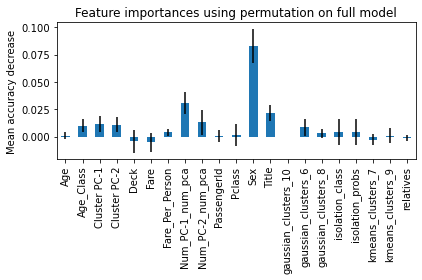

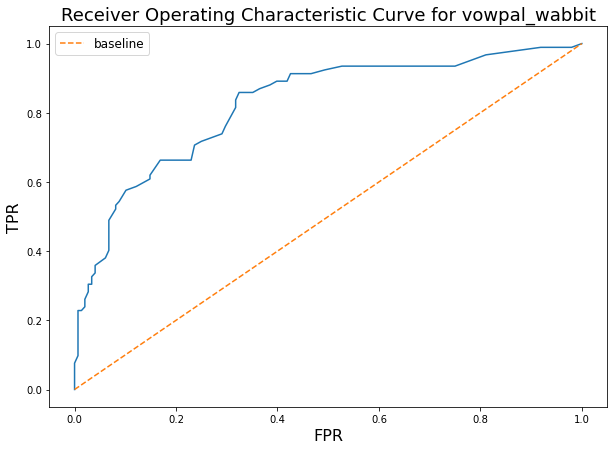

The ROC_AUC score is 0.82439776733255


The Matthew correlation is 0.5222914093363753
-------------------
The accuracy is 0.7791666666666667
The recall is 0.7791666666666667
The macro F1 score is 0.7491668474295519
The micro F1 score is 0.7791666666666667
The weighted F1 score is 0.7694076893244727
              precision    recall  f1-score   support

         0.0       0.77      0.91      0.84       148
         1.0       0.80      0.57      0.66        92

    accuracy                           0.78       240
   macro avg       0.79      0.74      0.75       240
weighted avg       0.78      0.78      0.77       240



Started Execute test train split at 17:03:46.
Started Started column type detection and casting at 17:03:46.
Started Checking for duplicate columns at 17:03:46.
Started Reset dataframe index. at 17:03:46.
Started Select best features at 17:03:46.
Started Delete columns with high share of NULLs at 17:03:46.
Started Apply datetime transformation at 17:03:46.
Started Handle rare features at 17:03:46.
Started Remove cardinality at 17:03:46.
Started Holistic NULL filling at 17:03:46.
Started Binarize numeric columns + PCA binarized features at 17:03:46.
Started Onehot + PCA categorical features at 17:03:46.
Started Execute categorical encoding at 17:03:46.
Started Fill nulls at 17:03:46.
Started Handle outliers at 17:03:46.
Started Remove collinearity at 17:03:46.
Started Remove skewness at 17:03:46.
Started Execute clustering as a feature at 17:03:46.
Started Execute clustering as a feature at 17:03:46.
Started Execute clustering as a feature at 17:03:46.
Started Execute clustering as a fe

Score achieved on holdout dataset is: 0.5678885630303183.
End iteration for algorithm vowpal_wabbit at 1637251427.779804.
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
    Trial number      Algorithm  Matthews  \
18            19        ngboost  0.722349   
2              3           lgbm  0.691036   
8              9        xgboost  0.691036   
9             10           lgbm  0.690528   
1              2        xgboost  0.666410   
3              4         tabnet  0.643248   
11            12        ngboost  0.643106   
17            18         tabnet  0.629439   
10            11         tabnet  0.624619   
16            17           lgbm  0.593029   
14            15          ridge  0.577399   
4              5        ngboost  0.568740   
15            16        xgboost  0.567889   
20            21  vowpal_wabbit  0.567889   
7              8          ridge  0.519994   
13            14  vowpal_wabbit  0.493525   
0              1          ridge  0.331848   
6       

In [4]:
results = timetravel.timewalk_auto_exploration(class_instance=titanic_auto_ml,
                                   holdout_df=val_df,
                                   holdout_target=val_df_target,
                                   algs_to_test=None,
                                   experiment_name="timewalk.pkl")

In [7]:
results.sort_values(by=["Matthews"], ascending=[False])

,Trial number,Algorithm,Matthews,Preprocessing applied,Runtime in seconds
18,19,ngboost,0.722349,"{'automatic_type_detection_casting': True, 'remove_duplicate_column_names': True, 'reset_dataframe_index': True, 'fill_infinite_values': True, 'early_numeric_only_feature_selection': True, 'delete_high_null_cols': True, 'data_binning': False, 'regex_clean_text_data': False, 'handle_target_skewness': False, 'datetime_converter': True, 'pos_tagging_pca': False, 'append_text_sentiment_score': False, 'tfidf_vectorizer_to_pca': False, 'tfidf_vectorizer': False, 'rare_feature_processing': True, 'cardinality_remover': True, 'holistic_null_filling': True, 'numeric_binarizer_pca': True, 'onehot_pca': True, 'category_encoding': True, 'fill_nulls_static': True, 'outlier_care': True, 'remove_collinearity': True, 'skewness_removal': True, 'clustering_as_a_feature_dbscan': True, 'clustering_as_a_feature_kmeans_loop': True, 'clustering_as_a_feature_gaussian_mixture_loop': True, 'pca_clustering_results': True, 'autotuned_clustering': True, 'reduce_memory_footprint': False, 'scale_data': False, 'smote': False, 'automated_feature_selection': True, 'bruteforce_random_feature_selection': False, 'delete_unpredictable_training_rows': False, 'autoencoder_based_oversampling': False, 'synthetic_data_augmentation': False, 'final_pca_dimensionality_reduction': False, 'sort_columns_alphabetically': True}",66.242613
2,3,lgbm,0.691036,"{'automatic_type_detection_casting': True, 'remove_duplicate_column_names': True, 'reset_dataframe_index': True, 'fill_infinite_values': True, 'early_numeric_only_feature_selection': True, 'delete_high_null_cols': True, 'data_binning': False, 'regex_clean_text_data': False, 'handle_target_skewness': False, 'datetime_converter': True, 'pos_tagging_pca': False, 'append_text_sentiment_score': False, 'tfidf_vectorizer_to_pca': True, 'tfidf_vectorizer': False, 'rare_feature_processing': True, 'cardinality_remover': True, 'holistic_null_filling': True, 'numeric_binarizer_pca': True, 'onehot_pca': True, 'category_encoding': True, 'fill_nulls_static': True, 'outlier_care': True, 'remove_collinearity': True, 'skewness_removal': True, 'clustering_as_a_feature_dbscan': True, 'clustering_as_a_feature_kmeans_loop': True, 'clustering_as_a_feature_gaussian_mixture_loop': True, 'pca_clustering_results': True, 'autotuned_clustering': True, 'reduce_memory_footprint': False, 'scale_data': True, 'smote': False, 'automated_feature_selection': True, 'bruteforce_random_feature_selection': False, 'delete_unpredictable_training_rows': False, 'autoencoder_based_oversampling': True, 'synthetic_data_augmentation': False, 'final_pca_dimensionality_reduction': False, 'sort_columns_alphabetically': True}",371.652585
8,9,xgboost,0.691036,"{'automatic_type_detection_casting': True, 'remove_duplicate_column_names': True, 'reset_dataframe_index': True, 'fill_infinite_values': True, 'early_numeric_only_feature_selection': True, 'delete_high_null_cols': True, 'data_binning': False, 'regex_clean_text_data': False, 'handle_target_skewness': False, 'datetime_converter': True, 'pos_tagging_pca': False, 'append_text_sentiment_score': False, 'tfidf_vectorizer_to_pca': True, 'tfidf_vectorizer': False, 'rare_feature_processing': True, 'cardinality_remover': True, 'holistic_null_filling': True, 'numeric_binarizer_pca': True, 'onehot_pca': True, 'category_encoding': True, 'fill_nulls_static': True, 'outlier_care': True, 'remove_collinearity': True, 'skewness_removal': True, 'clustering_as_a_feature_dbscan': True, 'clustering_as_a_feature_kmeans_loop': True, 'clustering_as_a_feature_gaussian_mixture_loop': True, 'pca_clustering_results': True, 'autotuned_clustering': True, 'reduce_memory_footprint': False, 'scale_data': False, 'smote': False, 'automated_feature_selection': True, 'bruteforce_random_feature_selection': False, 'delete_unpredictable_training_rows': False, 'autoencoder_based_oversampling': False, 'synthetic_data_augmentation': False, 'final_pca_dimensionality_redu